In [4]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
import joblib, json, sys, os
from IPython.display import Image, display_png

sys.path.append("../script/")
#from MergeBrain import WholeBrainCells
import matplotlib.pyplot as plt
import pandas as pd

import sys, os, os.path, re, csv, math
import linecache
import numpy as  np
import pandas as pd
from matplotlib import pyplot as plt
from statistics import mean,stdev
import seaborn as sns

import csv
import pprint
#import ants
import tifffile
from multiprocessing import Pool
import datetime
from itertools import product

import numpy as np
import tifffile
import os
import pickle
import joblib
import pandas as pd
from matplotlib import pyplot as plt
import concurrent.futures
import gc
import json
import matplotlib
matplotlib.rcParams['pdf.use14corefonts'] = True

In [5]:
conditions = {
    "WT_1m": ["#4_APPmodel_Ctr1m_1_2022_1104_1550","#4_APPmodel_Ctr1m_2_2022_1108_959","#4_APPmodel_Ctr1m_3_2022_1209_1751"],
    "WT_2m": ["8w_B6JWT_atlas_1_2022_0924_1847","8w_B6JWT_atlas_2_2022_0926_1326", "8w_B6JWT_atlas_3_2022_1005_1110", "8w_B6JWT_atlas_4_2022_1010_2030","8w_B6JWT_atlas_5_2023_0423_1604",],
    "WT_3m": ["#5_APPmodel_Ctr3m_1_2023_0113_1230", "#5_APPmodel_Ctr3m_2_2023_0210_1142", "#5_APPmodel_Ctr3m_3_2023_0227_1605", "#4_APPmodel_Ctr3m_4_2023_0427_1444",],
    "WT_5m": ["#4_APPmodel_Ctr5m_1_2022_1026_252", "#4_APPmodel_Ctr5m_2_2022_1028_2336", "#4_APPmodel_Ctr5m_3_2022_1101_140", "#4_APPmodel_Ctr5m_4_2023_0512_2057"],
    "WT_7m": [ "#5_APPmodel_Ctr7m_1_2023_0206_1534","#5_APPmodel_Ctr7m_2_2023_0313_1111","#5_APPmodel_Ctr7m_3_2023_0331_2139","#4_APPmodel_Ctr7m_4_2023_0516_1559","#5_APPmodel_Ctr7m_5_2023_0522_2218"],
    "WT_9m": [ "#5_APPmodel_Ctr9m_1_2023_0130_1607", "#5_APPmodel_Ctr9m_2_2023_0216_2052" ,"#5_APPmodel_Ctr9m_3_2023_0322_2014","#5_APPmodel_Ctr9m_4_2023_0518_1449"],
    "WT_12m": ["56w_B6JWT_atlas_1_2022_1128_1548", "56w_B6JWT_atlas_2_2022_1221_1537", "56w_B6JWT_atlas_3_2022_1224_1718"],
    
    "APP_1m": ["#4_APPmodel_APP1m_1_2022_1102_1304", "#4_APPmodel_APP1m_2_2022_1106_1708","#4_APPmodel_APP1m_3_2022_1213_2151","#4_APPmodel_APP1m_4_2023_0417_2052", ],
    "APP_3m": [ "#5_APPmodel_APP3m_2_2023_0123_1645", "#5_APPmodel_APP3m_3_2023_0212_2217","#5_APPmodel_APP3m_4_2023_0214_2027","#4_APPmodel_APP3m_5_2023_0502_1423",],
   "APP_5m": ["#4_APPmodel_APP5m_1_2022_1024_1336", "#4_APPmodel_APP5m_2_2022_1027_1333","#4_APPmodel_APP5m_3_2022_1030_1257", "#4_APPmodel_APP5m_4_2023_0509_1021"],
    "APP_7m": ["#5_APPmodel_APP7m_2_2023_0315_1540","#5_APPmodel_APP7m_3_2023_0310_1401","#5_APPmodel_APP7m_4_2023_0317_1630", "#5_APPmodel_APP7m_5_2023_0520_1723"],
    "APP_9m": ["#5_APPmodel_APP9m_1_2023_0117_1352","#5_APPmodel_APP9m_2_2023_0327_1425", "#5_APPmodel_APP9m_3_2023_0329_1611", "#5_APPmodel_APP9m_4_2023_0403_1443" ],
       
    "VCP_mut_2m": ["VCPmodel_E524A_0.5x_1_2022_0624_1303", "VCPmodel_E524A_0.5x_2_2022_0626_1338", "VCPmodel_E524A_0.5x_4_2022_0922_1217", "VCPmodel_E524A_0.5x_6_2022_0628_1157"], 
   "VCP_WT_2m": ["VCPmodel_WT_0.5x_1_2022_0625_1104","VCPmodel_WT_0.5x_2_2022_0917_1808", "VCPmodel_WT_0.5x_3_2022_0627_1257", "VCPmodel_WT_0.5x_4_2022_0921_950","VCPmodel_WT_0.5x_5_2022_0923_1454","VCPmodel_WT_0.5x_6_2022_0929_953"],
    "newVCP_mut_2m": ["#5_VCPmodel_E524A_0.5x_1_2023_0120_1929","#5_VCPmodel_E524A_0.5x_2_2023_0407_1031", "#5_VCPmodel_E524A_0.5x_3_2023_0413_2036"], 
   "newVCP_WT_2m": ["#5_VCPmodel_WT_0.5x_1_2023_0405_1108","#5_VCPmodel_WT_0.5x_2_2023_0115_1852","#5_VCPmodel_WT_0.5x_3_2023_0410_1246"], 
    
    "TMT_2m": ["#3_TMTmodel_TMT3.0_8w_1_2022_1014_1410", "#3_TMTmodel_TMT3.0_8w_2_2022_1020_938", "#3_TMTmodel_TMT3.0_8w_3_2022_1023_501", "#3_TMTmodel_TMT_8w_5_2022_1205_1147",],
  "Saline_2m": ["#3_TMTmodel_Saline_8w_1_2022_1016_1318", "#3_TMTmodel_Saline_8w_2_2022_1018_2103","#3_TMTmodel_Saline_8w_3_2022_1021_1910", "#3_TMTmodel_Saline_8w_4_2022_1202_1349", "#3_TMTmodel_Saline_8w_5_2022_1217_1723", "#3_TMTmodel_Saline_8w_6_2022_1216_001"],
    
}

In [6]:
data_Atlas = pd.read_csv(filepath_or_buffer="/data4/ds1_Imaging3/atlas_for_fig/count_all_rgb.csv", encoding="ms932", sep=",")
# インプットの項目数（行数 * カラム数）を返却します。
data_atlas=np.array(data_Atlas.values.tolist())
#print(data_Atlas.size)
# 指定したカラムだけ抽出したDataFrameオブジェクトを返却します。
data_GO = pd.read_csv(filepath_or_buffer="/data4/ds1_Imaging3/atlas_for_fig/GOvsID_6region_removed.csv", encoding="ms932", sep=",")
# 指定したカラムだけ抽出したDataFrameオブジェクトを返却します。
data_GO

,id,graph_order,R,G,B
0,997,0,255,255,255
1,68,7,38,143,69
2,667,8,38,143,69
3,52192,9,38,143,69
4,52196,10,38,143,69
...,...,...,...,...,...
666,129,1299,170,170,170
667,140,1300,170,170,170
668,145,1301,170,170,170
669,153,1302,170,170,170


In [7]:
colorlist=[]

total = 0
for i in range (671):
    atlas_id_num = data_GO["id"].values[i]
    colorlist.append((data_GO["R"].values[i]/255,data_GO["G"].values[i]/255,data_GO["B"].values[i]/255))
colorlist_671=colorlist

In [8]:
# 下記は一部のidだけが対象
dir= "/data4/ds1_Imaging3/cubic-atlas_v1-1/cubic-atlas/"
dir_ana=dir+"summary_CUBIC-Atlas-1-1.csv"


data_id = pd.read_csv(filepath_or_buffer=dir_ana, encoding="ms932", sep=",")
data_id

,id,acronym,node_name,graph_order,rgb_triplet,cell_count,volume(mm3),density(cells/mm3)
0,997,root,root,0,"[255, 255, 255]",78620375,506.05289,155359.99590
1,8,grey,Basic cell groups and regions,1,"[191, 218, 227]",70525778,449.60086,156863.08540
2,567,CH,Cerebrum,2,"[176, 240, 255]",39291452,275.87673,142423.94190
3,688,CTX,Cerebral cortex,3,"[176, 255, 184]",31750427,221.54964,143310.66800
4,695,CTXpl,Cortical plate,4,"[112, 255, 112]",30687805,212.64380,144315.54300
...,...,...,...,...,...,...,...,...
834,129,V3,third ventricle,1299,"[170, 170, 170]",144614,0.90005,160673.85380
835,140,AQ,cerebral aqueduct,1300,"[170, 170, 170]",26972,0.40620,66400.27696
836,145,V4,fourth ventricle,1301,"[170, 170, 170]",118275,0.96495,122570.72070
837,153,V4r,lateral recess,1302,"[170, 170, 170]",71934,0.46333,155254.98260


In [9]:
region_name=[]

for i in data_GO["id"]:
    region_name.append(data_id["acronym"][data_id["id"]==i].values)
region_name

[array(['root'], dtype=object),
 array(['FRP1'], dtype=object),
 array(['FRP2/3'], dtype=object),
 array(['FRP5'], dtype=object),
 array(['FRP6a'], dtype=object),
 array(['FRP6b'], dtype=object),
 array(['MOp1'], dtype=object),
 array(['MOp2/3'], dtype=object),
 array(['MOp5'], dtype=object),
 array(['MOp6a'], dtype=object),
 array(['MOp6b'], dtype=object),
 array(['MOs1'], dtype=object),
 array(['MOs2/3'], dtype=object),
 array(['MOs5'], dtype=object),
 array(['MOs6a'], dtype=object),
 array(['MOs6b'], dtype=object),
 array(['SSp-n1'], dtype=object),
 array(['SSp-n2/3'], dtype=object),
 array(['SSp-n4'], dtype=object),
 array(['SSp-n5'], dtype=object),
 array(['SSp-n6a'], dtype=object),
 array(['SSp-n6b'], dtype=object),
 array(['SSp-bfd1'], dtype=object),
 array(['SSp-bfd2/3'], dtype=object),
 array(['SSp-bfd4'], dtype=object),
 array(['SSp-bfd5'], dtype=object),
 array(['SSp-bfd6a'], dtype=object),
 array(['SSp-bfd6b'], dtype=object),
 array(['SSp-ll1'], dtype=object),
 array(['SSp-

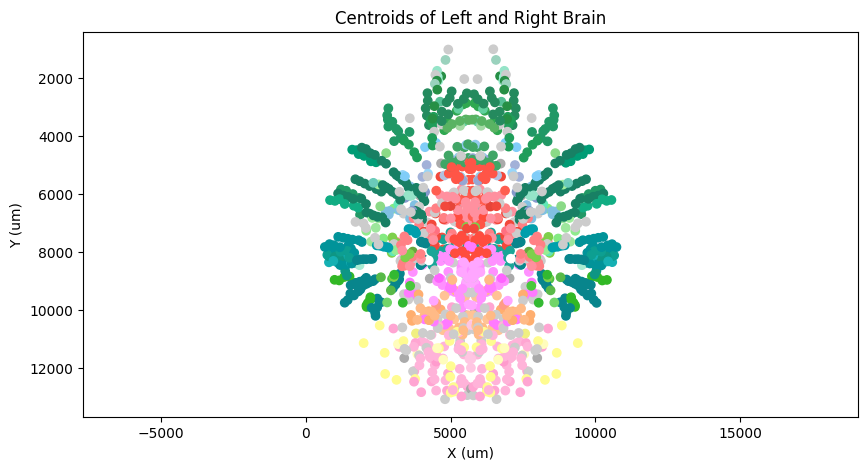

In [10]:
# whole brain plotをする
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# バイナリファイルを読み込む
dt_type = np.dtype([
  ('X(um)', 'f4'), ('Y(um)', 'f4'), ('Z(um)', 'f4'), ('atlasID', 'u2')
])
grid_points = np.fromfile("/data4/atlas/annotation_50_non_zero_coordinates.bin", dt_type)
grid_points = pd.DataFrame(grid_points)

# 左脳と右脳のデータを分割
left_points = grid_points[grid_points['X(um)'] < 5700]
right_points = grid_points[grid_points['X(um)'] >= 5700]

# atlasIDごとに重心を計算する関数
def calculate_centroids(df):
    centroids = df.groupby('atlasID').agg({'X(um)': 'mean', 'Y(um)': 'mean', 'Z(um)': 'mean'}).reset_index()
    return centroids

# 左脳と右脳の重心を計算
left_centroids = calculate_centroids(left_points)
right_centroids = calculate_centroids(right_points)

# 重心データを結合
all_centroids = pd.concat([left_centroids, right_centroids])



# 色情報の辞書を生成
color_dict = {row['id']: (row['R']/255, row['G']/255, row['B']/255) for index, row in data_GO.iterrows()}

# atlasIDに基づいて各点の色を決定
all_centroids['color'] = all_centroids['atlasID'].map(color_dict).apply(lambda x: x if isinstance(x, tuple) else (0.5, 0.5, 0.5))  # 色が見つからない場合は灰色

# xy座標をプロット（すべての重心を1つのプロットに表示）
plt.figure(figsize=(10, 5))
plt.scatter(all_centroids['X(um)'], all_centroids['Y(um)'], color=all_centroids['color'].tolist())
plt.title('Centroids of Left and Right Brain')
plt.xlabel('X (um)')
plt.ylabel('Y (um)')
plt.axis('equal')  # 軸を等方的にする
plt.gca().invert_yaxis()  # Y軸を反転
plt.show()


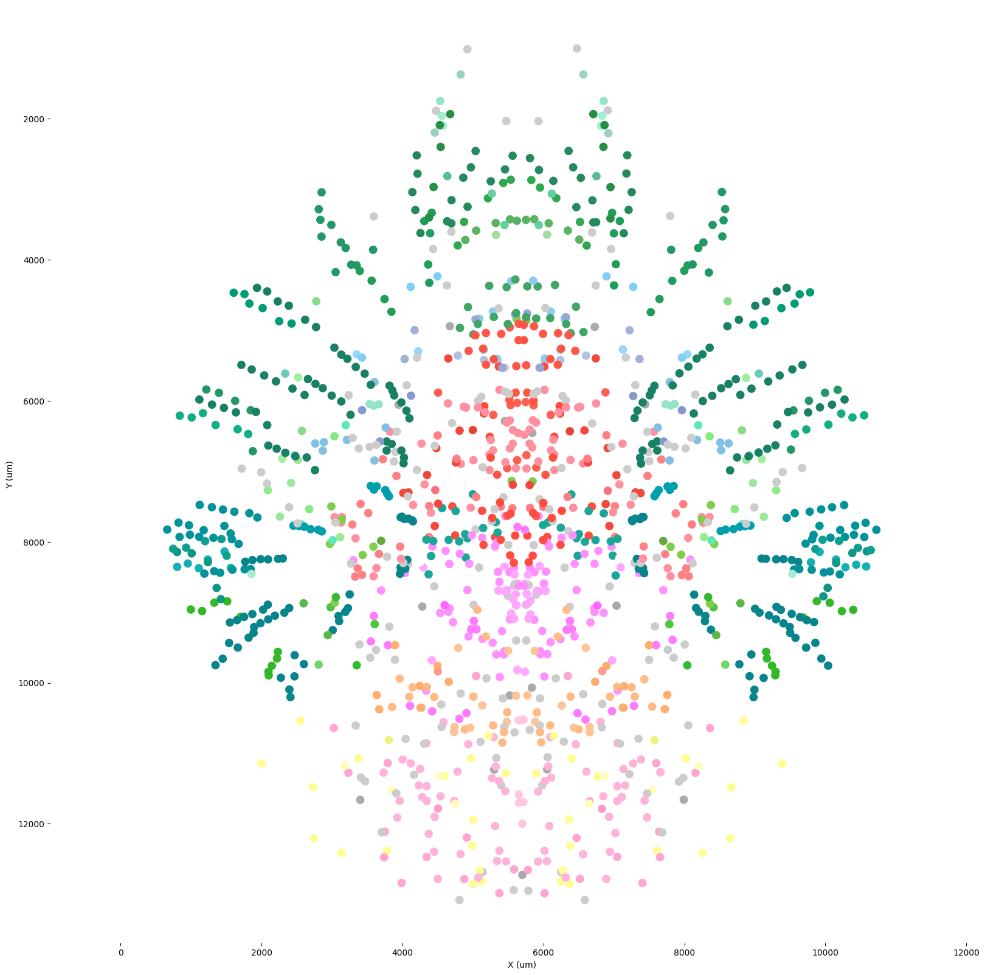

In [11]:
plt.figure(figsize=(20, 20))
plt.scatter(all_centroids['X(um)'], all_centroids['Y(um)'], s=80, color=all_centroids['color'].tolist())
#plt.title('Centroids of Left and Right Brain')
plt.xlabel('X (um)')
plt.ylabel('Y (um)')
plt.axis('equal')  # 軸を等方的にする
plt.gca().invert_yaxis()  # Y軸を反転
plt.gca().spines['top'].set_visible(False)  # 上の軸線を非表示
plt.gca().spines['right'].set_visible(False)  # 右の軸線を非表示
plt.gca().spines['left'].set_visible(False)  # 左の軸線を非表示
plt.gca().spines['bottom'].set_visible(False)  # 下の軸線を非表示
#plt.xticks([])  # X軸の目盛りを非表示
#plt.yticks([])  # Y軸の目盛りを非表示
plt.show()


In [ ]:
# NeuN Age dependent 1m - 9m
# APP NeuN 1-9m age dependent

VCPmodel_WT_0.5x_1_2022_0625_1104
VCPmodel_WT_0.5x_2_2022_0917_1808
VCPmodel_WT_0.5x_3_2022_0627_1257
VCPmodel_WT_0.5x_4_2022_0921_950
VCPmodel_WT_0.5x_5_2022_0923_1454
VCPmodel_WT_0.5x_6_2022_0929_953
VCPmodel_E524A_0.5x_1_2022_0624_1303
VCPmodel_E524A_0.5x_2_2022_0626_1338
VCPmodel_E524A_0.5x_4_2022_0922_1217
VCPmodel_E524A_0.5x_6_2022_0628_1157
997
Coefficient: -0.13844011868107114, p-value: 0.05209540855557845
68
Coefficient: 0.045743123512373335, p-value: 0.6794144778907778
667
Coefficient: 0.11317134127395022, p-value: 0.20329616294617037
52192
Coefficient: 0.08909622111095113, p-value: 0.30180076924517246
52196
Coefficient: 0.12431610621987113, p-value: 0.03761034299860528
52264


/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:101: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:104: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single

Coefficient: 0.07493844847592131, p-value: 0.3545084976717156
320
Coefficient: 0.01727724893545644, p-value: 0.7544951115052497
943
Coefficient: -0.011088436625498998, p-value: 0.534545717248945
648
Coefficient: -0.013851263007183784, p-value: 0.3410427189481075
844
Coefficient: 0.0194063212963197, p-value: 0.21313419131600142
882
Coefficient: 0.012287820972185705, p-value: 0.7418802037911298
656
Coefficient: 0.044301726709470045, p-value: 0.5322875296983414
962
Coefficient: 0.011854075223371577, p-value: 0.7476639316853548
767
Coefficient: 0.00813129245017499, p-value: 0.7594385516017597
1021
Coefficient: 0.01949789599607886, p-value: 0.21749730025399497
1085
Coefficient: 0.03296532543057855, p-value: 0.006451903993299492
558
Coefficient: 0.017652877964336792, p-value: 0.6654253100184352
838
Coefficient: -0.007558188536050889, p-value: 0.8229542620556403
654
Coefficient: -0.039761796474320474, p-value: 0.1823475100500148
702
Coefficient: -0.06750603874837162, p-value: 0.00192645072915

Coefficient: 0.09942045466306847, p-value: 0.5004272819147523
41
Coefficient: 0.018969370677554664, p-value: 0.8602583134253831
501
Coefficient: 0.0008039698424948159, p-value: 0.9894469306357955
565
Coefficient: -0.05307017692532544, p-value: 0.028532324305150476
257
Coefficient: -0.05621652608104034, p-value: 0.07063025823067891
469
Coefficient: -0.03079206893360432, p-value: 0.27103357453059435
31578
Coefficient: -0.05989054174907791, p-value: 0.4263612091662668
31582
Coefficient: 0.01999867751929348, p-value: 0.7495628137636552
31586
Coefficient: 0.029749030584387954, p-value: 0.6492279406019097
31590
Coefficient: 0.04635354957916515, p-value: 0.27473397039197395
31594
Coefficient: 0.01362511298346318, p-value: 0.5573823534001625
31598
Coefficient: 0.06980969737038524, p-value: 0.0003008047911163644
31632
Coefficient: -0.1433962855176088, p-value: 0.07581983875956329
31636
Coefficient: -0.041758726842644006, p-value: 0.5551896102183109
31640
Coefficient: 0.012093081146209739, p-val

Coefficient: -0.14280470437802925, p-value: 2.1988525606312237e-07
982
Coefficient: -0.1247239608374914, p-value: 0.005975575093572629
19
Coefficient: -0.046761339097491174, p-value: 0.4566011675701766
1121
Coefficient: 0.04378959539771696, p-value: 0.6912164718418223
20
Coefficient: 0.0914423061661925, p-value: 0.0800951238637995
52
Coefficient: 0.05717835881575057, p-value: 0.21698263074578622
139
Coefficient: 0.03301762887602242, p-value: 0.2969284061474315
28
Coefficient: 0.01460538437213755, p-value: 0.5871358425007354
526
Coefficient: -0.1343885238874815, p-value: 0.20380986892010702
543
Coefficient: 0.006975993071011531, p-value: 0.813881882440449
664
Coefficient: -0.005927746585216238, p-value: 0.8443580815785829
727
Coefficient: 0.008632252251921817, p-value: 0.5447140049318722
743
Coefficient: -0.018360821552563085, p-value: 0.2297345867252475
843
Coefficient: -0.01901913903438405, p-value: 0.7217654717717235
1037
Coefficient: -0.038684277446049485, p-value: 0.088455064781700

Coefficient: 0.10306345859964876, p-value: 0.5328695798941383
732
Coefficient: 0.15200411865375674, p-value: 0.5010873597469472
60647
Coefficient: 0.2651630930318013, p-value: 0.1563093277928637
60651
Coefficient: 0.18315108662376448, p-value: 0.3563396864334324
60655
Coefficient: 0.02795316305616283, p-value: 0.8142808421602383
60659
Coefficient: 0.29674947130029067, p-value: 0.02466299295269915
525
Coefficient: -0.009221500729820508, p-value: 0.8714496887376106
1126
Coefficient: 0.007923964404217007, p-value: 0.9250338592564933
1
Coefficient: -0.1866429887966193, p-value: 0.016594216379959222
515
Coefficient: -0.0019262114878883488, p-value: 0.9418791752408121
980
Coefficient: 0.08540716523781865, p-value: 0.36456195241682304
1004
Coefficient: -0.1945581450019224, p-value: 0.14065524812633365
63
Coefficient: -0.022348771278533488, p-value: 0.37238164095954573
693
Coefficient: -0.05612405925455098, p-value: 0.023086369646461824
946
Coefficient: -0.0489601509441422, p-value: 0.00076096

Coefficient: -0.125278208529219, p-value: 0.0032521574932919527
372
Coefficient: -0.37305669655898616, p-value: 0.20181225337950826
83
Coefficient: 0.14539580948499506, p-value: 0.2509766576244736
136
Coefficient: -0.08658463398420255, p-value: 0.00014541420960613306
106
Coefficient: -0.09333918005568434, p-value: 0.05244396640233704
203
Coefficient: -0.038958042814520755, p-value: 0.19820417842642887
955
Coefficient: -0.04344475923586304, p-value: 0.28119723189153145
963
Coefficient: 0.021151725149154827, p-value: 0.7103278393631691
307
Coefficient: -0.13087655332382295, p-value: 7.711909169604667e-13
1098
Coefficient: -0.07903702072479536, p-value: 0.000855726867194227
1107
Coefficient: -0.02254383845027905, p-value: 0.6909760634645506
852
Coefficient: -0.11659325705454149, p-value: 1.3570911720639845e-09
859
Coefficient: -0.05259702838230429, p-value: 0.5358806827384957
970
Coefficient: -0.18248770007068374, p-value: 0.0010539064472206046
978
Coefficient: -0.1791867895074174, p-valu

R[write to console]: In addition: 
R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 

R[write to console]: In addition: 
R[write to console]: There were 50 or more warnings (use warnings() to see the first 50)
R[write to console]: 



Coefficient: -0.0524821660206207, p-value: 0.5444702178978915
48524
Coefficient: -0.038822366347410896, p-value: 0.5212042004635988
102
Coefficient: -0.112642246397549, p-value: 0.00010630142191745055
1051
Coefficient: -44.94004085208247, p-value: 0.9999957923557069
1060
Coefficient: -0.24905214437793077, p-value: 0.01889095412572678
1043
Coefficient: -0.24337154516138917, p-value: 9.110970845088541e-05
863
Coefficient: -0.1428366658408316, p-value: 0.0007994629041247063
397
Coefficient: -0.2612159394337352, p-value: 0.0007372627176003286
884
Coefficient: 0.010111150310232228, p-value: 0.7328120085626686
908
Coefficient: -0.05094442167894006, p-value: 0.3660362139396928
940
Coefficient: -0.016462889613802666, p-value: 0.5772546641694695
466
Coefficient: 0.01955785116649637, p-value: 0.7164851560064107
530
Coefficient: -0.2086731733900289, p-value: 0.208233452044271
603
Coefficient: -0.19946053415339374, p-value: 0.12412803168612842
428
Coefficient: -0.08835350528249157, p-value: 0.3810

/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:119: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


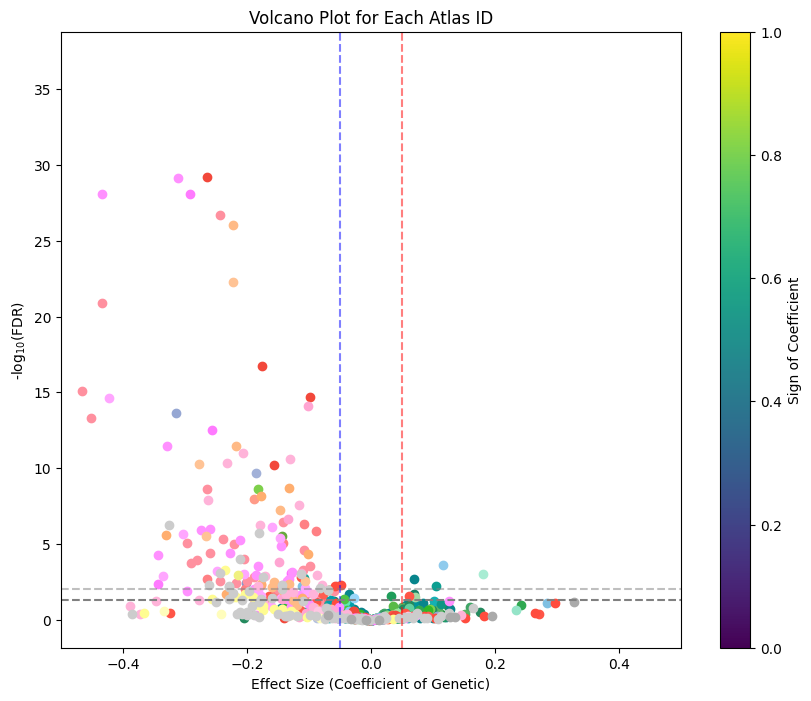

In [223]:
import os
import pandas as pd
import numpy as np
import statsmodels.api as sm
import statsmodels.formula.api as smf
import matplotlib.pyplot as plt
from statsmodels.stats.multitest import multipletests

import numpy as np
import rpy2.robjects as robjects
import rpy2.robjects as ro
# Rのインスタンスを取得
r = robjects.r
from rpy2.robjects import pandas2ri
pandas2ri.activate()
# Rのライブラリをロード
r = robjects.r
r('library(MASS)')

# pdfCluster関数を実行するためのラッパー関数
def run_glm (data):
        
    # R環境にデータフレームを渡す
    ro.globalenv['data'] = pandas2ri.py2rpy(data)
    # pdfClusterを実行
    r_code = '''
    library(MASS)
    model <- glm.nb('log_All_cell_count ~ Genetic', data = data)
    coef <- summary(model)$coefficients["Genetic", "Estimate"]
    p_value <- summary(model)$coefficients["Genetic", "Pr(>|z|)"]
    c(coef, p_value)
    '''
    #results_ <- summary(model)
    #results_ <- summary(model)
    #p_value <- summary(model)$Coefficients["Genetic", "Pr(>|z|)"]
    #coef <- summary(model)$Coefficients["Genetic", "coef"]
    ro.r(r_code)

    results = ro.r(r_code)
    
    coef = results[0]
    p_value = results[1]
    print(f"Coefficient: {coef}, p-value: {p_value}")
    
    return coef, p_value


# サンプルごとにデータを読み込んで 'Condition' 列を追加する関数を修正
def load_data(sample_info):
    df_list = []
    for sample, condition in sample_info:  # sample_infoには(sample_path, condition)のタプルが格納されている
        param_path = f"/home/mitani/CUBIC-informatics/param/Neuronomics/{sample}/param_multichannel-rank.json"
        try:
            with open(param_path) as f:
                param = json.load(f)
            fw_dir_nu = param["dst_basedir"]

            cellome_file = fw_dir_nu + "/Regional_cellome4.csv"
            if os.path.exists(cellome_file):  # 確認するファイルパスに注意
                print(sample)
                df = pd.read_csv(cellome_file)
                df['Condition'] = condition  # 'Condition' 列を追加
                df['Sample'] = sample  # サンプル名を追加
                df_list.append(df)
        except Exception as e:
            print(f"Error loading data for {sample}: {e}")

    return pd.concat(df_list, ignore_index=True) if df_list else pd.DataFrame()

# Healthy controlとDiseaseのサンプル情報のタプルを取得
healthy_sample_info = [(s, c) for c in ["VCP_WT_2m"] for s in conditions[c]]
disease_sample_info = [(s, c) for c in [ "VCP_mut_2m"] for s in conditions[c]]
#healthy_sample_info = [(s, c) for c in ["WT_7m", "WT_9m"] for s in conditions[c]]
#disease_sample_info = [(s, c) for c in [  "APP_7m", "APP_9m"] for s in conditions[c]]

# データを読み込む
healthy_data = load_data(healthy_sample_info)
disease_data = load_data(disease_sample_info)

# AgeとGeneticの列を追加
#healthy_data['Age'] = healthy_data['Condition'].str.extract('(\d+)m').astype(int)
healthy_data['Genetic'] = 0  # Healthyは0
#disease_data['Age'] = disease_data['Condition'].str.extract('(\d+)m').astype(int)
disease_data['Genetic'] = 1  # Diseaseは1

# データを結合
all_data = pd.concat([healthy_data, disease_data])
all_data['log_All_cell_count'] = 0

# 全サンプルにわたるAgeの平均を計算
#mean_age = all_data['Age'].mean()
#print(mean_age)
#all_data["Age"] = all_data["Age"] - mean_age

# 線形回帰モデルの作成
results = {}
for atlas_id in all_data['atlasID'].unique():
    print(atlas_id)
    data = all_data[all_data['atlasID'] == atlas_id]

    data['log_All_cell_count'] = np.round(data['NeuN+ density (/mm3)'])
    data = data.dropna(subset=['log_All_cell_count'])
    
    all_data['log_All_cell_count'][all_data['atlasID'] == atlas_id] = data['log_All_cell_count'].copy()
    if data['log_All_cell_count'].sum() <= 0.0:
        results[atlas_id] = [0.0, 1.0]
        print(f"No non-zero data available for atlas ID {atlas_id}. Skipping...")
        continue
    results[atlas_id] = run_glm(data)

volcano_data = pd.DataFrame({
    'AtlasID': list(results.keys()),
    'coef': [result[0] for result in results.values()],
    'pvalue': [result[1] for result in results.values()]

})

# BH法による多重検定補正
volcano_data['pvalue'][volcano_data['pvalue'] == 0.0] = 1.0
_, p_adjusted, _, _ = multipletests(volcano_data['pvalue'], method='fdr_bh')

# 補正後のp-valueをデータフレームに追加
volcano_data['adjusted_pvalue'] =  p_adjusted
volcano_data['-log10(adjusted_pvalue)'] = -np.log10(volcano_data['adjusted_pvalue'])

# ID を基準にして volcano_data に RGB 値をマージ
volcano_data = pd.merge(volcano_data, data_GO[['id', 'R', 'G', 'B']], left_on='AtlasID', right_on='id', how='left')

# RGB 値を正規化
volcano_data['color'] = volcano_data.apply(lambda row: (row['R']/255, row['G']/255, row['B']/255), axis=1)

#volcano_data['log2(coef)'] = np.log2(volcano_data['coef'])

###########################

plt.rcParams['font.family'] = 'Arial'
plt.rcParams['font.size'] = 10  # Adjust the size as needed

# ボルカノプロットの描画
plt.figure(figsize=(10, 8))
for _, row in volcano_data.iterrows():
    plt.scatter(row['coef'], row['-log10(adjusted_pvalue)'], color=row['color'])

plt.xlabel("Effect Size (Coefficient of Genetic)")
plt.ylabel(r'-$\log_{10}$(FDR)')  # LaTeX形式で下付き文字を使用
plt.title('Volcano Plot for Each Atlas ID')
plt.xlim(-0.5,0.5)
#plt.ylim(-0.5,10)
plt.axvline(x=-0.05, color='blue', linestyle='--', alpha = 0.5)
plt.axvline(x=0.05, color='red', linestyle='--', alpha = 0.5)
plt.axhline(y=-np.log10(0.05), color='grey', linestyle='--', alpha = 1.0)
plt.axhline(y=-np.log10(0.01), color='grey', linestyle='--', alpha = 0.5)
plt.colorbar(label='Sign of Coefficient')
plt.show()

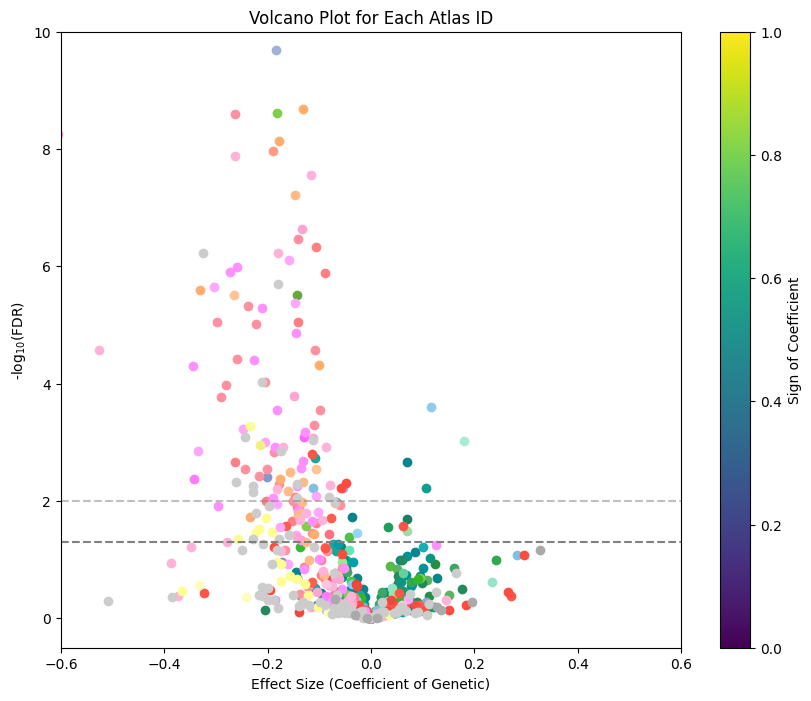

In [224]:
#volcano_data['log2(coef)'] = np.log2(volcano_data['coef'])

###########################

plt.rcParams['font.family'] = 'Arial'
plt.rcParams['font.size'] = 10  # Adjust the size as needed

# ボルカノプロットの描画
plt.figure(figsize=(10, 8))
for _, row in volcano_data.iterrows():
    plt.scatter(row['coef'], row['-log10(adjusted_pvalue)'], color=row['color'])

plt.xlabel("Effect Size (Coefficient of Genetic)")
plt.ylabel(r'-$\log_{10}$(FDR)')  # LaTeX形式で下付き文字を使用
plt.title('Volcano Plot for Each Atlas ID')
plt.xlim(-0.60,0.60)
plt.ylim(-0.5,10)
#plt.axvline(x=-0.05, color='blue', linestyle='--', alpha = 0.5)
#plt.axvline(x=0.05, color='red', linestyle='--', alpha = 0.5)
plt.axhline(y=-np.log10(0.05), color='grey', linestyle='--', alpha = 1.0)
plt.axhline(y=-np.log10(0.01), color='grey', linestyle='--', alpha = 0.5)
plt.colorbar(label='Sign of Coefficient')
plt.show()

In [207]:
volcano_data

,AtlasID,coef,pvalue,adjusted_pvalue,-log10(adjusted_pvalue),id,R,G,B,color
0,997,-0.138440,0.052095,0.155360,0.808661,997,255,255,255,"(1.0, 1.0, 1.0)"
1,68,0.045743,0.679414,0.815540,0.088554,68,38,143,69,"(0.14901960784313725, 0.5607843137254902, 0.27..."
2,667,0.113171,0.203296,0.415947,0.380962,667,38,143,69,"(0.14901960784313725, 0.5607843137254902, 0.27..."
3,52192,0.089096,0.301801,0.524582,0.280187,52192,38,143,69,"(0.14901960784313725, 0.5607843137254902, 0.27..."
4,52196,0.124316,0.037610,0.118481,0.926350,52196,38,143,69,"(0.14901960784313725, 0.5607843137254902, 0.27..."
...,...,...,...,...,...,...,...,...,...,...
666,129,-0.007211,0.941713,0.975310,0.010857,129,170,170,170,"(0.6666666666666666, 0.6666666666666666, 0.666..."
667,140,0.194947,0.305680,0.527569,0.277721,140,170,170,170,"(0.6666666666666666, 0.6666666666666666, 0.666..."
668,145,0.135648,0.493846,0.710833,0.148232,145,170,170,170,"(0.6666666666666666, 0.6666666666666666, 0.666..."
669,153,-0.068988,0.240254,0.461152,0.336155,153,170,170,170,"(0.6666666666666666, 0.6666666666666666, 0.666..."


In [225]:
batch_1_volcano = volcano_data.copy()

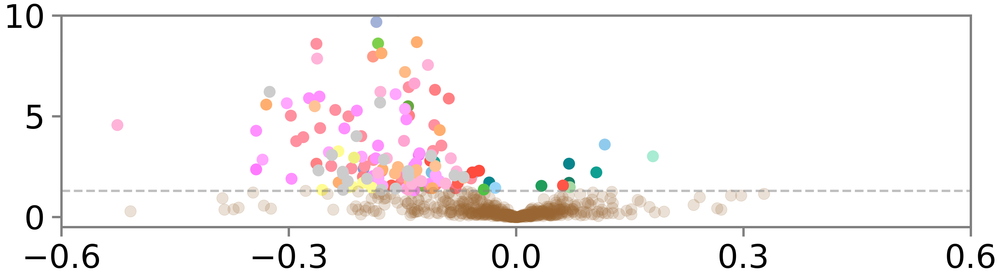

In [170]:
#volcano_data['log2(coef)'] = np.log2(volcano_data['coef'])

###########################

plt.rcParams['font.family'] = 'DejaVu Sans'
plt.rcParams['font.size'] = 70  # Adjust the size as needed
 

# ボルカノプロットの描画
plt.figure(figsize=(30, 7))

for _, row in volcano_data.iterrows(): 
    plt.scatter(row['coef'], row['-log10(adjusted_pvalue)'], 
                color=row['color'] if row['-log10(adjusted_pvalue)'] > -np.log10(0.05) else (0.6, 0.4, 0.2), 
                alpha = 1 if row['-log10(adjusted_pvalue)'] > -np.log10(0.05) else 0.2, 
                s = 600)

#plt.xlabel("Effect Size (Coefficient of Genetic)")
#plt.ylabel(r'-$\log_{10}$(FDR)')  # LaTeX形式で下付き文字を使用
#plt.title('Volcano Plot for Each Region')
# y軸をログスケールに設定
plt.xlim(-0.13, 0.13)
plt.ylim(-0.5, 10.0)
#plt.axvline(x=-0.05, color='blue', linestyle='--', alpha = 0.5)
#plt.axvline(x=0.05, color='red', linestyle='--', alpha = 0.5)
plt.axhline(y=-np.log10(0.05), color='grey', linestyle='--', alpha = 0.5, linewidth = 5)
#plt.axhline(y=-np.log10(0.01), color='grey', linestyle='--', alpha = 0.2)
#plt.colorbar(label='Sign of Coefficient')

# 枠線の色と太さの設定
alpha = 1.0  # 例としてalphaを0.5に設定
for spine in plt.gca().spines.values():
    spine.set_linewidth(5)
    spine.set_color((0.5, 0.5, 0.5, alpha))  # RGBA形式で色を指定
    
# 目盛りを外側に設定し、色をブラックに設定、目盛りラベルのパディングと太字設定
#plt.tick_params(axis='both', which='both', direction='out', length=20, width=5, colors='grey', pad=25)
plt.tick_params(axis='both', which='both', direction='out', length=20, width=5, colors='grey', pad=15, labelcolor='black')

# x軸とy軸の目盛りの位置を設定して数を半分にする
plt.gca().set_xticks(np.linspace(-0.60, 0.60, 5))  # 7個の目盛り
plt.gca().set_yticks(np.linspace(0, 10, 3).astype(int))  # 6個の目盛り

# 目盛りラベルを取得して太字に設定
#for tick in plt.gca().get_xticklabels():
#    tick.set_fontweight('bold')
#for tick in plt.gca().get_yticklabels():
#    tick.set_fontweight('bold')
    
    
# レイアウトを調整してから保存
plt.tight_layout()
plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05)
    
# 透明な背景で保存
plt.savefig('/data5/mitani/Neurology/Extended Data Fig.4/1st_batch_VCP_WT_vs_mut_Neuron_volcano_with_limit_FDR_10_coef_0.6.pdf', 
            transparent=True, dpi=300, bbox_inches='tight', pad_inches=0.1)

In [171]:
significant_region_ids4 = volcano_data[(volcano_data["adjusted_pvalue"]<0.05)&(volcano_data["coef"]<0.0)]
significant_region_ids4 = significant_region_ids4["AtlasID"]

In [172]:
significant_region_ids5 = volcano_data[(volcano_data["adjusted_pvalue"]<0.05)&(volcano_data["coef"]>0.0)]
significant_region_ids5 = significant_region_ids5["AtlasID"]

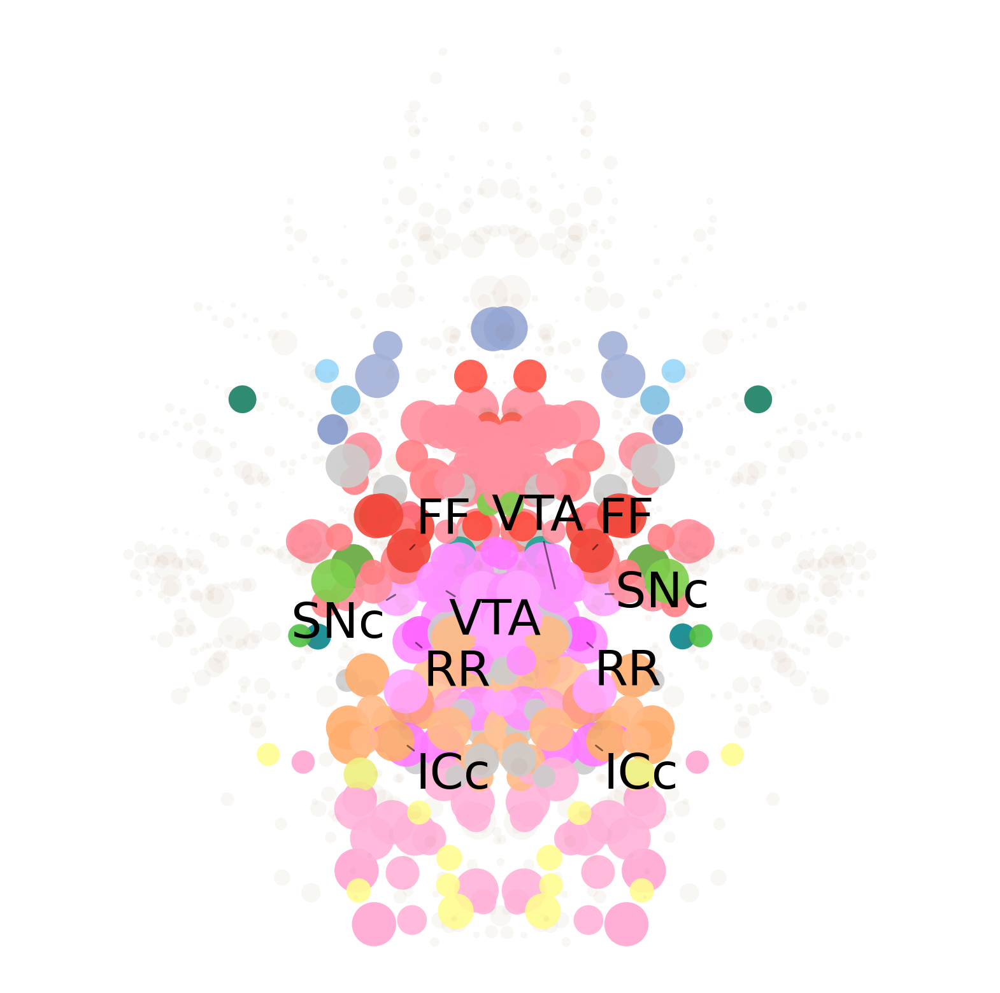

In [173]:
import matplotlib.pyplot as plt
import pandas as pd
from adjustText import adjust_text  # adjustText ライブラリをインポート

# volcano_dataをインデックス化
# マッピングの前に、型が一致していることを確認（必要に応じて型変換）
#all_centroids['atlasID'] = all_centroids['atlasID'].astype(volcano_indexed.index.dtype)

# all_centroidsに -log10(adjusted_pvalue), coef, およびacronymsをマッピング
all_centroids['adjusted_pvalue'] = all_centroids['atlasID'].map(volcano_data.set_index('AtlasID')['adjusted_pvalue'])
all_centroids['-log10(adjusted_pvalue)'] = all_centroids['atlasID'].map(volcano_data.set_index('AtlasID')['-log10(adjusted_pvalue)'])
all_centroids['coef'] = all_centroids['atlasID'].map(volcano_data.set_index('AtlasID')['coef'])
all_centroids['acronym'] = all_centroids['atlasID'].map(data_id.set_index('id')['acronym'])

# 条件に合致し、adjusted_pvalueが最小の上位5つを抽出
top_acronyms = all_centroids[(all_centroids['adjusted_pvalue'] < 0.05) & (all_centroids['coef'] < 0.0)]
top_acronyms = top_acronyms.nsmallest(10, 'adjusted_pvalue')

# グラフのプロット
plt.figure(figsize=(20, 20))
plt.gca().invert_yaxis()
texts = []  # テキストオブジェクトを保存するリスト

plt.rcParams['font.family'] = 'DejaVu Sans'
plt.rcParams['font.size'] = 10


# adjusted p value limit is 0.00001. -log10(adjusted_pvalue) < 5
for i, row in all_centroids.iterrows():
    color = row['color'] if row['adjusted_pvalue'] < 0.05 and row['coef'] < 0.0 else (0.6, 0.4, 0.2)
    alpha = 0.9 if row['adjusted_pvalue'] < 0.05 and row['coef'] < 0.0 else 0.05
    plt.scatter(row['X(um)'], row['Y(um)'],
                s=500 * row['-log10(adjusted_pvalue)'] if 500 * row['-log10(adjusted_pvalue)'] < 500 * 5 else 500 * 5,
                color=color, alpha=alpha, edgecolor='none')
    
    # 上位5位の点のみにテキストを追加（`atlasID` を使用して比較）
    if row['atlasID'] in top_acronyms['atlasID'].values:
        texts.append(plt.text(row['X(um)'], row['Y(um)'], row['acronym'],
                              ha='center', va='center', fontsize=55, color="black", fontweight='regular'))

# 調整されたテキストに対してadjust_textを適用し、アローをグレーで追加
adjust_text(texts, 
            arrowprops=dict(arrowstyle='-', color=(0, 0, 0), alpha = 0.5, linewidth=2),
            #expand_points=(1., 1.),  # ポイントからの距離を広げる
            #expand_text=(1., 1.),    # テキスト間の距離を広げる
            #force_text=(1., 1.),     # テキストを動かす力を強める
            #force_points=(1., 1.)   # ポイントを動かす力を強める
            
            expand_points=(1.3, 1.3),  # ポイントからの距離を広げる
            expand_text=(1., 1.),    # テキスト間の距離を広げる
            force_text=(1., 1.),     # テキストを動かす力を強める
            force_points=(1., 1.)   # ポイントを動かす力を強める
           )

#plt.title('Whole brain plot of 2nd batch VCP-WT vs VCP-mutant Microglia increase')
#plt.xlabel('X (um)')
#plt.ylabel('Y (um)')
plt.axis('equal')

plt.gca().spines['top'].set_visible(False)  # 上の軸線を非表示
plt.gca().spines['right'].set_visible(False)  # 右の軸線を非表示
plt.gca().spines['left'].set_visible(False)  # 左の軸線を非表示
plt.gca().spines['bottom'].set_visible(False)  # 下の軸線を非表示
plt.xticks([])  # X軸の目盛りを非表示
plt.yticks([])  # Y軸の目盛りを非表示

plt.savefig('/data5/mitani/Neurology/Extended Data Fig.4/1st_batch_VCP_WT_vs_mut_Neuron_decrease_with_limit_FDR_5.pdf', 
            transparent=True, dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()

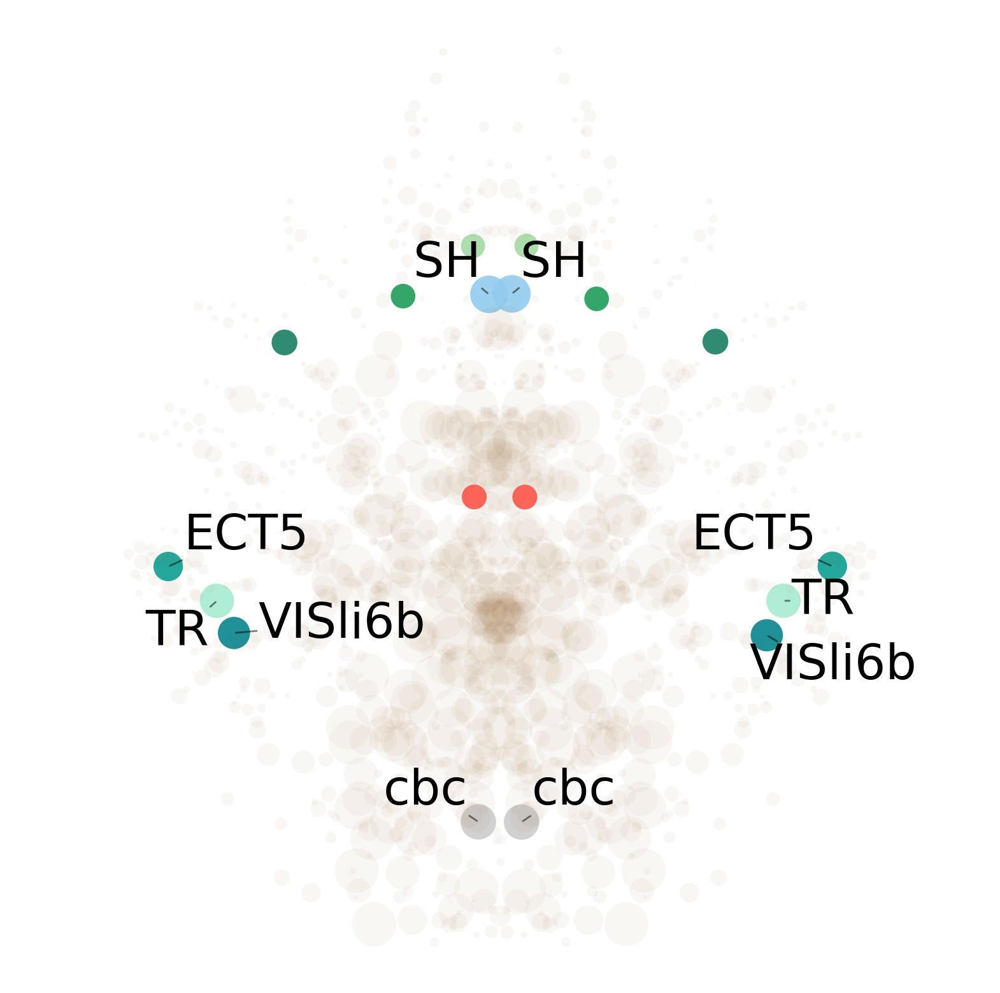

In [174]:
import matplotlib.pyplot as plt
import pandas as pd
from adjustText import adjust_text  # adjustText ライブラリをインポート

# volcano_dataをインデックス化
# マッピングの前に、型が一致していることを確認（必要に応じて型変換）
#all_centroids['atlasID'] = all_centroids['atlasID'].astype(volcano_indexed.index.dtype)

# all_centroidsに -log10(adjusted_pvalue), coef, およびacronymsをマッピング
all_centroids['adjusted_pvalue'] = all_centroids['atlasID'].map(volcano_data.set_index('AtlasID')['adjusted_pvalue'])
all_centroids['-log10(adjusted_pvalue)'] = all_centroids['atlasID'].map(volcano_data.set_index('AtlasID')['-log10(adjusted_pvalue)'])
all_centroids['coef'] = all_centroids['atlasID'].map(volcano_data.set_index('AtlasID')['coef'])
all_centroids['acronym'] = all_centroids['atlasID'].map(data_id.set_index('id')['acronym'])

# 条件に合致し、adjusted_pvalueが最小の上位5つを抽出
top_acronyms = all_centroids[(all_centroids['adjusted_pvalue'] < 0.05) & (all_centroids['coef'] > 0.0)]
top_acronyms = top_acronyms.nsmallest(10, 'adjusted_pvalue')

# グラフのプロット
plt.figure(figsize=(20, 20))
plt.gca().invert_yaxis()
texts = []  # テキストオブジェクトを保存するリスト

plt.rcParams['font.family'] = 'DejaVu Sans'
plt.rcParams['font.size'] = 10


# adjusted p value limit is 0.00001. -log10(adjusted_pvalue) < 5
for i, row in all_centroids.iterrows():
    color = row['color'] if row['adjusted_pvalue'] < 0.05 and row['coef'] > 0.0 else (0.6, 0.4, 0.2)
    alpha = 0.9 if row['adjusted_pvalue'] < 0.05 and row['coef'] > 0.0 else 0.05
    plt.scatter(row['X(um)'], row['Y(um)'],
                s=500 * row['-log10(adjusted_pvalue)'] if 500 * row['-log10(adjusted_pvalue)'] < 500 * 5 else 500 * 5,
                color=color, alpha=alpha, edgecolor='none')
    
    # 上位5位の点のみにテキストを追加（`atlasID` を使用して比較）
    if row['atlasID'] in top_acronyms['atlasID'].values:
        texts.append(plt.text(row['X(um)'], row['Y(um)'], row['acronym'],
                              ha='center', va='center', fontsize=55, color="black", fontweight='regular'))

# 調整されたテキストに対してadjust_textを適用し、アローをグレーで追加
adjust_text(texts, 
            arrowprops=dict(arrowstyle='-', color=(0, 0, 0), alpha = 0.5, linewidth=2),
            #expand_points=(1., 1.),  # ポイントからの距離を広げる
            #expand_text=(1., 1.),    # テキスト間の距離を広げる
            #force_text=(1., 1.),     # テキストを動かす力を強める
            #force_points=(1., 1.)   # ポイントを動かす力を強める
            
            expand_points=(1.3, 1.3),  # ポイントからの距離を広げる
            expand_text=(1., 1.),    # テキスト間の距離を広げる
            force_text=(1., 1.),     # テキストを動かす力を強める
            force_points=(1., 1.)   # ポイントを動かす力を強める
           )

#plt.title('Whole brain plot of 2nd batch VCP-WT vs VCP-mutant Microglia increase')
#plt.xlabel('X (um)')
#plt.ylabel('Y (um)')
plt.axis('equal')

plt.gca().spines['top'].set_visible(False)  # 上の軸線を非表示
plt.gca().spines['right'].set_visible(False)  # 右の軸線を非表示
plt.gca().spines['left'].set_visible(False)  # 左の軸線を非表示
plt.gca().spines['bottom'].set_visible(False)  # 下の軸線を非表示
plt.xticks([])  # X軸の目盛りを非表示
plt.yticks([])  # Y軸の目盛りを非表示

plt.savefig('/data5/mitani/Neurology/Extended Data Fig.4/1st_batch_VCP_WT_vs_mut_Neuron_increase_with_limit_FDR_5.pdf', 
            transparent=True, dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()

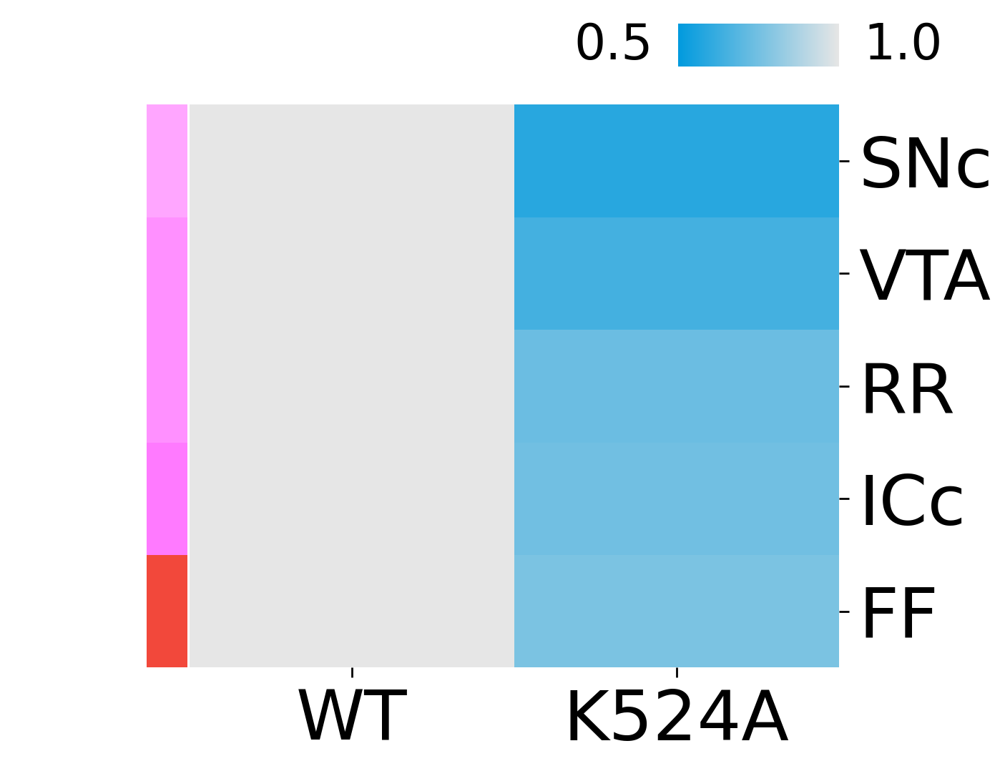

In [176]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
import matplotlib.colors as mcolors

plt.rcParams['font.family'] = 'DejaVu Sans'
plt.rcParams['font.size'] = 70
plt.rcParams['font.weight'] = 'regular'

# Load and extract data
data = all_data[np.isin(all_data["atlasID"], significant_region_ids4)]  # load_and_extract_data(sample_info, conditions)

# Pivot the data for heatmap and calculate mean density for each atlasID and condition
data_pivot = data.pivot_table(index='atlasID', columns='Condition', values='log_All_cell_count', aggfunc='mean')
# Fill NaN with column means and check if entire columns were NaN
data_pivot = data_pivot.apply(lambda col: col.fillna(col.mean()) if not col.isnull().all() else col.fillna(0))

# Normalize data by row using Z-score, and handle zero variance by replacing NaNs in the result with 0
data_normalized = data_pivot.div(data_pivot['VCP_WT_2m'], axis=0)

# significant_region_ids5に基づいてadjusted_pvalueを抽出し、-log10(adjusted_pvalue)を計算
log_adjusted_pvalues = pd.Series(data_normalized.index.map(volcano_data.set_index('AtlasID')['-log10(adjusted_pvalue)']), index=data_normalized.index)
# data_normalizedを-log10(adjusted_pvalue)の順にソート
data_normalized_sorted = data_normalized.loc[log_adjusted_pvalues.sort_values(ascending=False).index]

# 上位5つの行だけを選択
top5_data_normalized_sorted = data_normalized_sorted.head(5)

# acronymのインデックスを追加し、ソート
acronyms = data_id.set_index('id').loc[data_normalized.index, 'acronym']
acronyms_sorted = acronyms.loc[log_adjusted_pvalues.sort_values(ascending=False).index]

# 上位5つのアクロニムを選択
top5_acronyms_sorted = acronyms_sorted.head(5)

# Custom color map creation: gray to magenta
colors = [(0.0, 154/255, 222/255), (0.9, 0.9, 0.9)] 
cmap = mcolors.LinearSegmentedColormap.from_list('custom_gray_magenta', colors)



# Sort the top 5 rows by 'newVCP_mut_2m' in descending order
top5_data_normalized_sorted = top5_data_normalized_sorted.sort_values(by='VCP_mut_2m', ascending=True)
top5_acronyms_sorted = top5_acronyms_sorted.loc[top5_data_normalized_sorted.index]

colorlist = []

for atlas_id in top5_acronyms_sorted.index:
    for i in range(671):
        if data_GO["id"].values[i] == atlas_id:
            colorlist.append((data_GO["R"].values[i] / 255, data_GO["G"].values[i] / 255, data_GO["B"].values[i] / 255))
colorlist_671 = colorlist

# Custom x-axis labels
custom_labels = ['WT', 'K524A']

# Check if top5_data_normalized_sorted contains any NaN
if top5_data_normalized_sorted.isnull().any().any():
    print("Data contains NaNs or infinite values, which cannot be clustered.")
else:
    # Cluster map creation
    vmin = 0.5
    vmax = 1.0
    g = sns.clustermap(top5_data_normalized_sorted, row_colors=colorlist_671[:5], cmap=cmap, vmin=vmin, vmax=vmax, row_cluster=False, col_cluster=False, figsize=(15, 12))
    
    g.ax_heatmap.set_yticklabels(top5_acronyms_sorted, rotation=0)
    g.ax_heatmap.set_xlabel('')
    g.ax_heatmap.set_ylabel('')

    g.cax.set_visible(False)

    # Set custom x-axis labels
    g.ax_heatmap.set_xticklabels(custom_labels, rotation=0)
    g.ax_heatmap.tick_params(axis='both', which='both', length=10, width=2, pad=10)

    # Create a new color bar axis below the heatmap
    cbar_ax = g.fig.add_axes([0.75, 0.81, 0.15, 0.05])  # Right-aligned and 1/3 width
    norm = plt.Normalize(vmin=vmin, vmax=vmax)
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    cb = g.fig.colorbar(sm, cax=cbar_ax, orientation='horizontal')

    # Remove the black border around the color bar
    cb.outline.set_visible(False)

    # Set color bar ticks
    cb.set_ticks([])  # Remove default ticks
    # Add custom labels next to the color bar
    cbar_ax.text(-0.4, 0.5, str(vmin), va='center', ha='center', transform=cbar_ax.transAxes, fontsize=50, fontweight='regular')
    cbar_ax.text(1.4, 0.5, str(vmax), va='center', ha='center', transform=cbar_ax.transAxes, fontsize=50, fontweight='regular')

    plt.savefig('/data5/mitani/Neurology/Extended Data Fig.4/1st_batch_VCP_WT_vs_mut_Neuron_decrease_top5_sorted_heatmap.pdf', 
            transparent=True, dpi=300, bbox_inches='tight', pad_inches=0.1)
    plt.show()

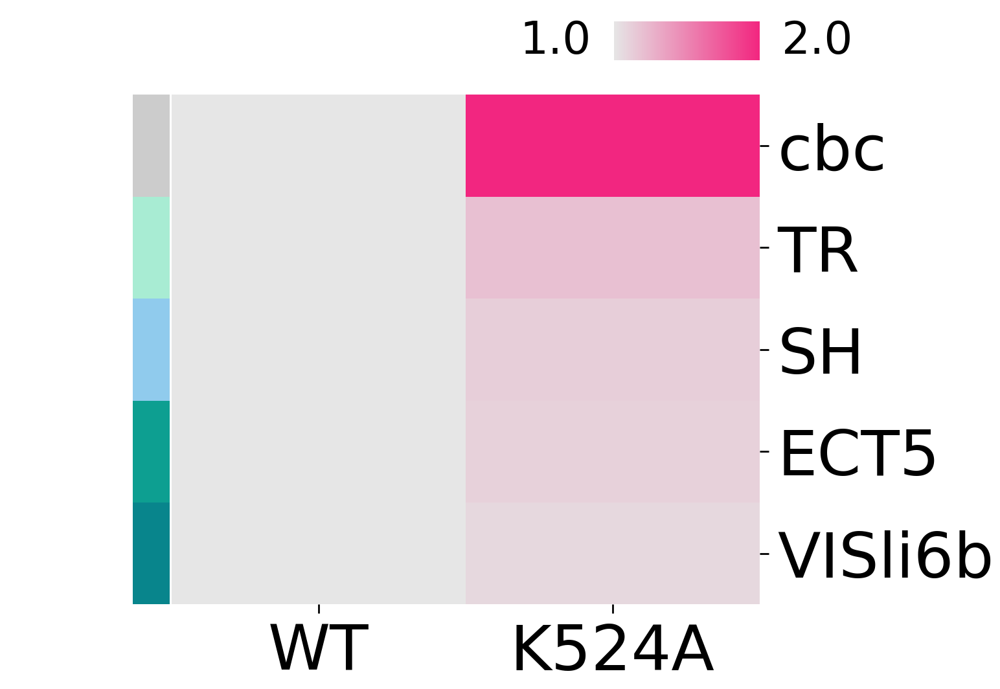

In [177]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
import matplotlib.colors as mcolors

plt.rcParams['font.family'] = 'DejaVu Sans'
plt.rcParams['font.size'] = 70
plt.rcParams['font.weight'] = 'regular'

# Load and extract data
data = all_data[np.isin(all_data["atlasID"], significant_region_ids5)]  # load_and_extract_data(sample_info, conditions)

# Pivot the data for heatmap and calculate mean density for each atlasID and condition
data_pivot = data.pivot_table(index='atlasID', columns='Condition', values='log_All_cell_count', aggfunc='mean')
# Fill NaN with column means and check if entire columns were NaN
data_pivot = data_pivot.apply(lambda col: col.fillna(col.mean()) if not col.isnull().all() else col.fillna(0))

# Normalize data by row using Z-score, and handle zero variance by replacing NaNs in the result with 0
data_normalized = data_pivot.div(data_pivot['VCP_WT_2m'], axis=0)

# significant_region_ids5に基づいてadjusted_pvalueを抽出し、-log10(adjusted_pvalue)を計算
log_adjusted_pvalues = pd.Series(data_normalized.index.map(volcano_data.set_index('AtlasID')['-log10(adjusted_pvalue)']), index=data_normalized.index)
# data_normalizedを-log10(adjusted_pvalue)の順にソート
data_normalized_sorted = data_normalized.loc[log_adjusted_pvalues.sort_values(ascending=False).index]

# 上位5つの行だけを選択
top5_data_normalized_sorted = data_normalized_sorted.head(5)

# acronymのインデックスを追加し、ソート
acronyms = data_id.set_index('id').loc[data_normalized.index, 'acronym']
acronyms_sorted = acronyms.loc[log_adjusted_pvalues.sort_values(ascending=False).index]

# 上位5つのアクロニムを選択
top5_acronyms_sorted = acronyms_sorted.head(5)

# Custom color map creation: gray to magenta
colors = [(0.9, 0.9, 0.9), (0.95, 0.15, 0.5)]
cmap = mcolors.LinearSegmentedColormap.from_list('custom_gray_magenta', colors)



# Sort the top 5 rows by 'newVCP_mut_2m' in descending order
top5_data_normalized_sorted = top5_data_normalized_sorted.sort_values(by='VCP_mut_2m', ascending=False)
top5_acronyms_sorted = top5_acronyms_sorted.loc[top5_data_normalized_sorted.index]

colorlist = []

for atlas_id in top5_acronyms_sorted.index:
    for i in range(671):
        if data_GO["id"].values[i] == atlas_id:
            colorlist.append((data_GO["R"].values[i] / 255, data_GO["G"].values[i] / 255, data_GO["B"].values[i] / 255))
colorlist_671 = colorlist

# Custom x-axis labels
custom_labels = ['WT', 'K524A']

# Check if top5_data_normalized_sorted contains any NaN
if top5_data_normalized_sorted.isnull().any().any():
    print("Data contains NaNs or infinite values, which cannot be clustered.")
else:
    # Cluster map creation
    vmin = 1.0
    vmax = 2.0
    g = sns.clustermap(top5_data_normalized_sorted, row_colors=colorlist_671[:5], cmap=cmap, vmin=vmin, vmax=vmax, row_cluster=False, col_cluster=False, figsize=(15, 12))
    
    g.ax_heatmap.set_yticklabels(top5_acronyms_sorted, rotation=0)
    g.ax_heatmap.set_xlabel('')
    g.ax_heatmap.set_ylabel('')

    g.cax.set_visible(False)

    # Set custom x-axis labels
    g.ax_heatmap.set_xticklabels(custom_labels, rotation=0)
    g.ax_heatmap.tick_params(axis='both', which='both', length=10, width=2, pad=10)

    # Create a new color bar axis below the heatmap
    cbar_ax = g.fig.add_axes([0.75, 0.81, 0.15, 0.05])  # Right-aligned and 1/3 width
    norm = plt.Normalize(vmin=vmin, vmax=vmax)
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    cb = g.fig.colorbar(sm, cax=cbar_ax, orientation='horizontal')

    # Remove the black border around the color bar
    cb.outline.set_visible(False)

    # Set color bar ticks
    cb.set_ticks([])  # Remove default ticks
    # Add custom labels next to the color bar
    cbar_ax.text(-0.4, 0.5, str(vmin), va='center', ha='center', transform=cbar_ax.transAxes, fontsize=50, fontweight='regular')
    cbar_ax.text(1.4, 0.5, str(vmax), va='center', ha='center', transform=cbar_ax.transAxes, fontsize=50, fontweight='regular')

    plt.savefig('/data5/mitani/Neurology/Extended Data Fig.4/1st_batch_VCP_WT_vs_mut_Neuron_increase_top5_sorted_heatmap.pdf', 
            transparent=True, dpi=300, bbox_inches='tight', pad_inches=0.1)
    plt.show()

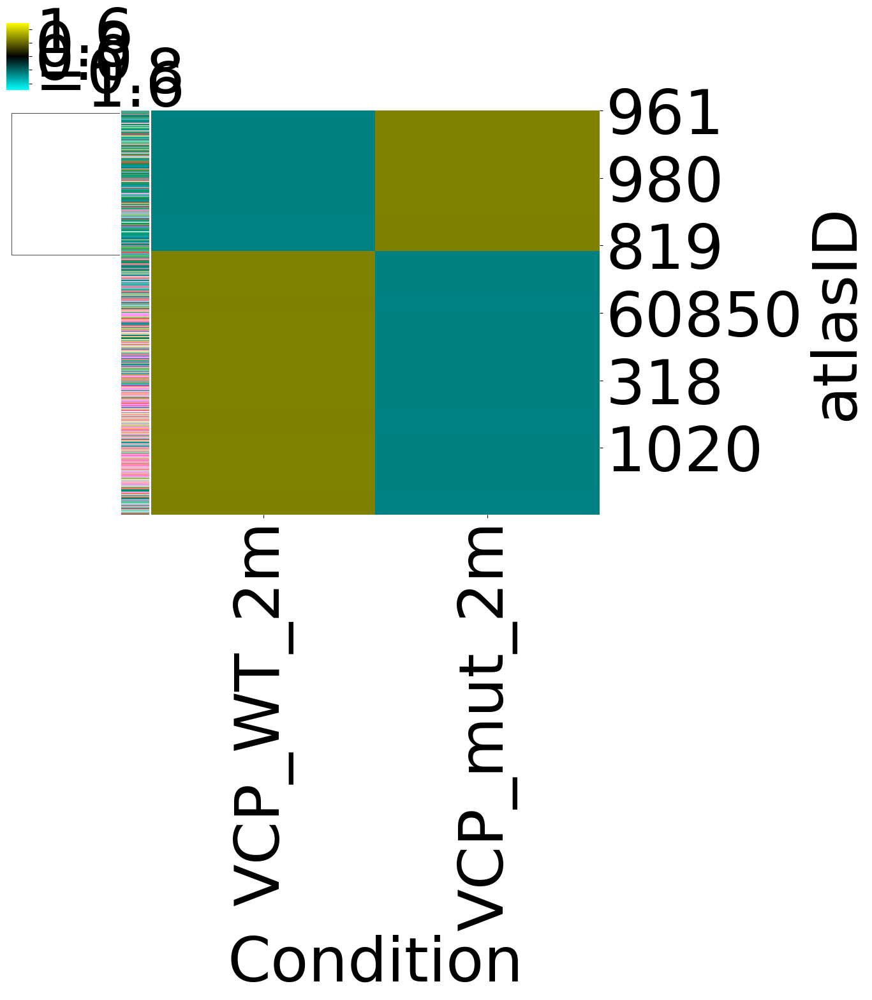

In [179]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import zscore
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.colors as mcolors
import json


# Function to load data and extract 'Iba1+ density (/mm3)' with Condition
def load_and_extract_data(sample_info, conditions):
    df_list = []
    for sample, condition in sample_info:
        param_path = f"/home/mitani/CUBIC-informatics/param/Neuronomics/{sample}/param_multichannel-rank.json"
        try:
            with open(param_path) as f:
                param = json.load(f)
            fw_dir_nu = param["dst_basedir"]
            cellome_file = fw_dir_nu + "/Regional_cellome4.csv"
            if os.path.exists(cellome_file):
                df = pd.read_csv(cellome_file)
                df['Condition'] = condition
                df['Sample'] = sample
                df_list.append(df[['atlasID','NeuN+ density (/mm3)', 'Iba1+ density (/mm3)', 'Condition']])
            else:
                print(f"File not found: {cellome_file}")
        except Exception as e:
            print(f"Error loading data for {sample}: {e}")
    
    return pd.concat(df_list, ignore_index=True) if df_list else pd.DataFrame()


# Prepare sample info
sample_info = [(s, c) for c in ['VCP_WT_2m', 'VCP_mut_2m'] for s in conditions[c]]

# Load and extract data
data = all_data#[(all_data["Genetic"] == 0) ]#load_and_extract_data(sample_info, conditions)

# Pivot the data for heatmap and calculate mean density for each atlasID and condition
data_pivot = data.pivot_table(index='atlasID', columns='Condition', values='log_All_cell_count', aggfunc='mean')
# Fill NaN with column means and check if entire columns were NaN
data_pivot = data_pivot.apply(lambda col: col.fillna(col.mean()) if not col.isnull().all() else col.fillna(0))

# Normalize data by row using Z-score, and handle zero variance by replacing NaNs in the result with 0
data_normalized = data_pivot.apply(zscore, axis=1).fillna(0)

# Custom color map creation
def create_custom_cmap():
    # Colors: cyan-like, black, yellow-like
    colors = ["#00ffff", "#000000", "#ffff00"]
    cmap_name = "custom_cmap"
    
    # Create a colormap with interpolation between specified colors
    cmap = mcolors.LinearSegmentedColormap.from_list(cmap_name, colors)
    
    return cmap

colorlist=[]

total = 0

for atlas_id in data_pivot.index:
    for i in range (671):
        if data_GO["id"].values[i] == atlas_id:
            colorlist.append((data_GO["R"].values[i]/255,data_GO["G"].values[i]/255,data_GO["B"].values[i]/255))
    colorlist_671=colorlist

# Using the new custom colormap
cmap = create_custom_cmap()

# Check if data_normalized contains any NaN
if data_normalized.isnull().any().any():
    print("Data contains NaNs or infinite values, which cannot be clustered.")
else:
    # Cluster map creation
    sns.clustermap(data_normalized, row_colors=colorlist_671,method="average", cmap=cmap,  vmin=-2, vmax=2, row_cluster=True, col_cluster=False, figsize=(12, 10))
    plt.show()

In [180]:
# CSVファイルとして保存
data_pivot.to_csv('/data4/Region/1st_batch_VCP_WT_vs_mut_raw_value_regions_NeuN_all.csv', index=True)

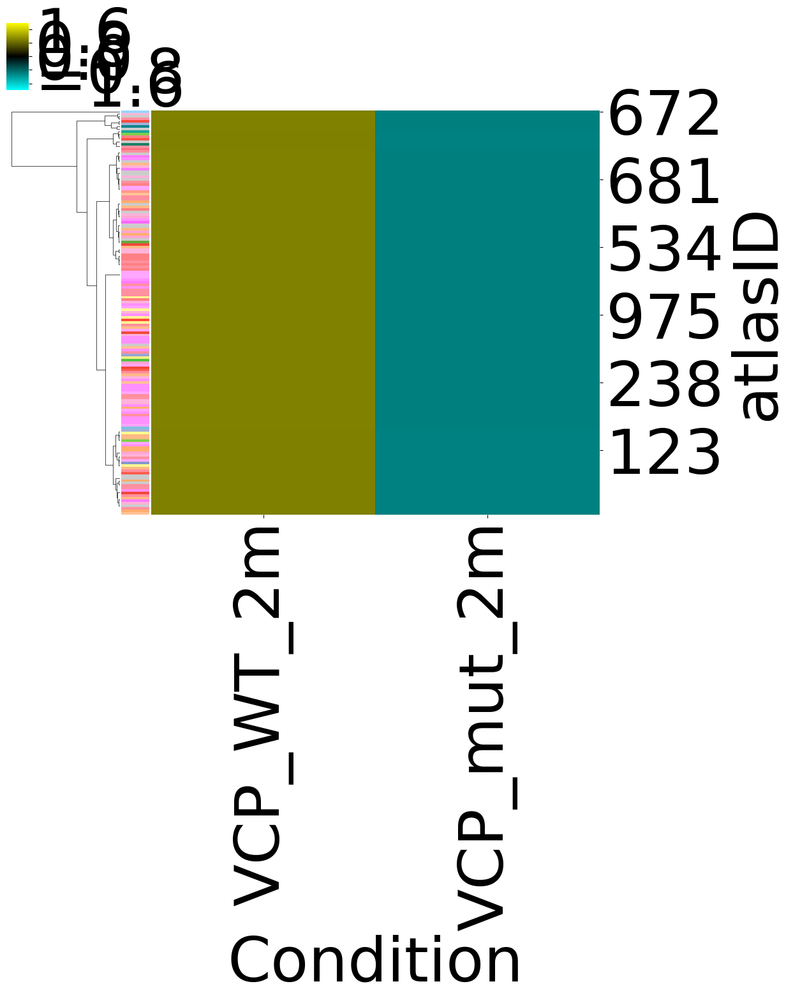

In [182]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import zscore
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.colors as mcolors
import json


# Function to load data and extract 'Iba1+ density (/mm3)' with Condition
def load_and_extract_data(sample_info, conditions):
    df_list = []
    for sample, condition in sample_info:
        param_path = f"/home/mitani/CUBIC-informatics/param/Neuronomics/{sample}/param_multichannel-rank.json"
        try:
            with open(param_path) as f:
                param = json.load(f)
            fw_dir_nu = param["dst_basedir"]
            cellome_file = fw_dir_nu + "/Regional_cellome4.csv"
            if os.path.exists(cellome_file):
                df = pd.read_csv(cellome_file)
                df['Condition'] = condition
                df['Sample'] = sample
                df_list.append(df[['atlasID','NeuN+ density (/mm3)', 'Iba1+ density (/mm3)', 'Condition']])
            else:
                print(f"File not found: {cellome_file}")
        except Exception as e:
            print(f"Error loading data for {sample}: {e}")
    
    return pd.concat(df_list, ignore_index=True) if df_list else pd.DataFrame()


# Prepare sample info
sample_info = [(s, c) for c in ['VCP_WT_2m', 'VCP_mut_2m'] for s in conditions[c]]

# Load and extract data
data = all_data[np.isin(all_data["atlasID"],significant_region_ids4)]#load_and_extract_data(sample_info, conditions)

# Pivot the data for heatmap and calculate mean density for each atlasID and condition
data_pivot = data.pivot_table(index='atlasID', columns='Condition', values='log_All_cell_count', aggfunc='mean')
# Fill NaN with column means and check if entire columns were NaN
data_pivot = data_pivot.apply(lambda col: col.fillna(col.mean()) if not col.isnull().all() else col.fillna(0))

# Normalize data by row using Z-score, and handle zero variance by replacing NaNs in the result with 0
data_normalized = data_pivot.apply(zscore, axis=1).fillna(0)

# Custom color map creation
def create_custom_cmap():
    # Colors: cyan-like, black, yellow-like
    colors = ["#00ffff", "#000000", "#ffff00"]
    cmap_name = "custom_cmap"
    
    # Create a colormap with interpolation between specified colors
    cmap = mcolors.LinearSegmentedColormap.from_list(cmap_name, colors)
    
    return cmap

colorlist=[]

total = 0

for atlas_id in data_pivot.index:
    for i in range (671):
        if data_GO["id"].values[i] == atlas_id:
            colorlist.append((data_GO["R"].values[i]/255,data_GO["G"].values[i]/255,data_GO["B"].values[i]/255))
    colorlist_671=colorlist

# Using the new custom colormap
cmap = create_custom_cmap()

# Check if data_normalized contains any NaN
if data_normalized.isnull().any().any():
    print("Data contains NaNs or infinite values, which cannot be clustered.")
else:
    # Cluster map creation
    sns.clustermap(data_normalized, row_colors=colorlist_671,method="average", cmap=cmap,  vmin=-2, vmax=2, row_cluster=True, col_cluster=False, figsize=(12, 10))
    plt.show()

In [184]:
# CSVファイルとして保存
data_pivot.to_csv('/data4/Region/1st_batch_VCP_WT_vs_mut_raw_value_regions_NeuN_decrease.csv', index=True)

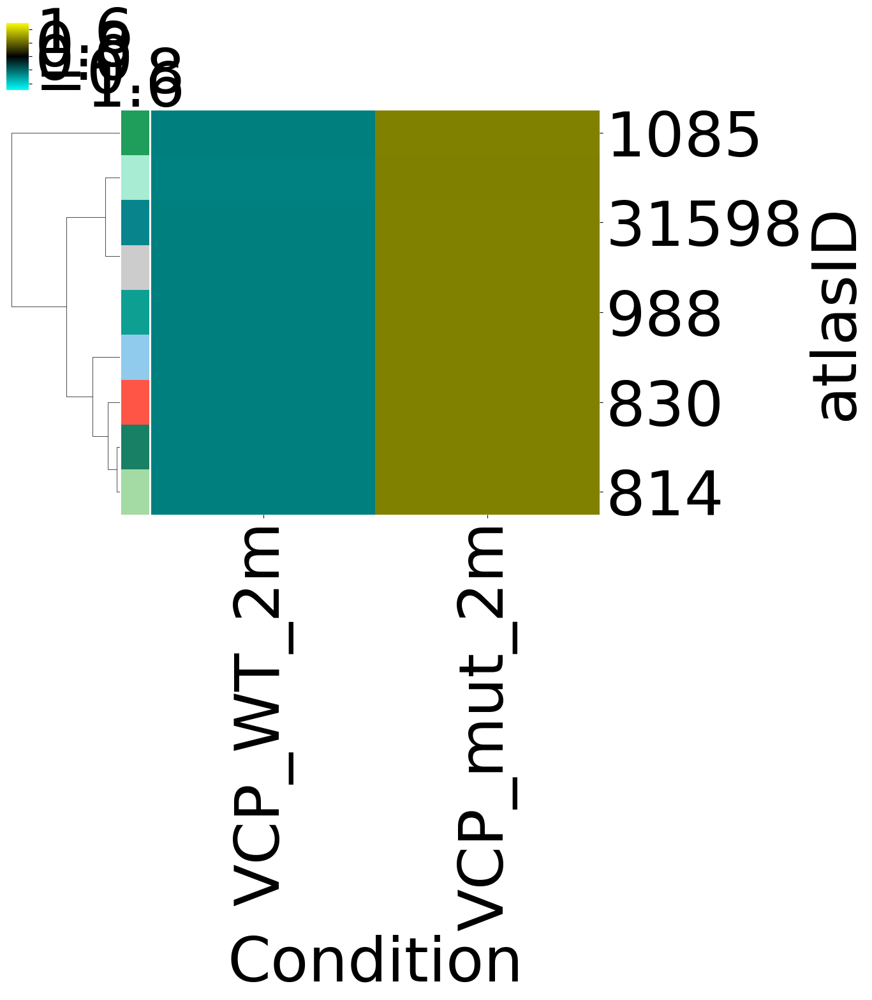

In [185]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import zscore
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.colors as mcolors
import json


# Function to load data and extract 'Iba1+ density (/mm3)' with Condition
def load_and_extract_data(sample_info, conditions):
    df_list = []
    for sample, condition in sample_info:
        param_path = f"/home/mitani/CUBIC-informatics/param/Neuronomics/{sample}/param_multichannel-rank.json"
        try:
            with open(param_path) as f:
                param = json.load(f)
            fw_dir_nu = param["dst_basedir"]
            cellome_file = fw_dir_nu + "/Regional_cellome4.csv"
            if os.path.exists(cellome_file):
                df = pd.read_csv(cellome_file)
                df['Condition'] = condition
                df['Sample'] = sample
                df_list.append(df[['atlasID','NeuN+ density (/mm3)', 'Iba1+ density (/mm3)', 'Condition']])
            else:
                print(f"File not found: {cellome_file}")
        except Exception as e:
            print(f"Error loading data for {sample}: {e}")
    
    return pd.concat(df_list, ignore_index=True) if df_list else pd.DataFrame()


# Prepare sample info
sample_info = [(s, c) for c in ['VCP_WT_2m', 'VCP_mut_2m'] for s in conditions[c]]

# Load and extract data
data = all_data[ np.isin(all_data["atlasID"],significant_region_ids5)]#load_and_extract_data(sample_info, conditions)

# Pivot the data for heatmap and calculate mean density for each atlasID and condition
data_pivot = data.pivot_table(index='atlasID', columns='Condition', values='log_All_cell_count', aggfunc='mean')
# Fill NaN with column means and check if entire columns were NaN
data_pivot = data_pivot.apply(lambda col: col.fillna(col.mean()) if not col.isnull().all() else col.fillna(0))

# Normalize data by row using Z-score, and handle zero variance by replacing NaNs in the result with 0
data_normalized = data_pivot.apply(zscore, axis=1).fillna(0)

# Custom color map creation
def create_custom_cmap():
    # Colors: cyan-like, black, yellow-like
    colors = ["#00ffff", "#000000", "#ffff00"]
    cmap_name = "custom_cmap"
    
    # Create a colormap with interpolation between specified colors
    cmap = mcolors.LinearSegmentedColormap.from_list(cmap_name, colors)
    
    return cmap

colorlist=[]

total = 0

for atlas_id in data_pivot.index:
    for i in range (671):
        if data_GO["id"].values[i] == atlas_id:
            colorlist.append((data_GO["R"].values[i]/255,data_GO["G"].values[i]/255,data_GO["B"].values[i]/255))
    colorlist_671=colorlist

# Using the new custom colormap
cmap = create_custom_cmap()

# Check if data_normalized contains any NaN
if data_normalized.isnull().any().any():
    print("Data contains NaNs or infinite values, which cannot be clustered.")
else:
    # Cluster map creation
    sns.clustermap(data_normalized, row_colors=colorlist_671,method="average", cmap=cmap,  vmin=-2, vmax=2, row_cluster=True, col_cluster=False, figsize=(12, 10))
    plt.show()

In [186]:
# CSVファイルとして保存
data_pivot.to_csv('/data4/Region/1st_batch_VCP_WT_vs_mut_raw_value_regions_NeuN_increase.csv', index=True)

In [ ]:
# Iba1 WT 1m-9m Age dependent

#4_APPmodel_Ctr1m_1_2022_1104_1550
#4_APPmodel_Ctr1m_2_2022_1108_959
#4_APPmodel_Ctr1m_3_2022_1209_1751
#5_APPmodel_Ctr3m_1_2023_0113_1230
#5_APPmodel_Ctr3m_2_2023_0210_1142
#5_APPmodel_Ctr3m_3_2023_0227_1605
#4_APPmodel_Ctr3m_4_2023_0427_1444
#4_APPmodel_Ctr5m_1_2022_1026_252
#4_APPmodel_Ctr5m_2_2022_1028_2336
#4_APPmodel_Ctr5m_3_2022_1101_140
#4_APPmodel_Ctr5m_4_2023_0512_2057
#5_APPmodel_Ctr7m_1_2023_0206_1534
#5_APPmodel_Ctr7m_2_2023_0313_1111
#5_APPmodel_Ctr7m_3_2023_0331_2139
#4_APPmodel_Ctr7m_4_2023_0516_1559
#5_APPmodel_Ctr7m_5_2023_0522_2218
#5_APPmodel_Ctr9m_1_2023_0130_1607
#5_APPmodel_Ctr9m_2_2023_0216_2052
#5_APPmodel_Ctr9m_3_2023_0322_2014
#5_APPmodel_Ctr9m_4_2023_0518_1449
997
Coefficient: -0.014758168576830726, p-value: 0.1970355739657216
68
Coefficient: -0.01657350763116821, p-value: 0.5920515417570558
667
Coefficient: -0.005046282336218041, p-value: 0.86712920969896
52192
Coefficient: -0.01210540169077932, p-value: 0.6876031639955862
52196
Coefficient: -0.038513537821

/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

Coefficient: -0.02692379696741195, p-value: 0.006846553517802071
648
Coefficient: -0.028863424494719615, p-value: 0.00017492533868020485
844
Coefficient: -0.023227094812879753, p-value: 0.00013958414417761475
882
Coefficient: -0.016573264479139135, p-value: 0.02901948118408181
656
Coefficient: -0.018864064728246404, p-value: 0.2477510549073886
962
Coefficient: -0.013092711012150551, p-value: 0.49085188890453857
767
Coefficient: -0.017206691421249972, p-value: 0.28018151362948673
1021
Coefficient: -0.023687889889355437, p-value: 0.0033260742612188283
1085
Coefficient: -0.010154051495705219, p-value: 0.161193507964273
558


/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

Coefficient: -0.022092796867646067, p-value: 0.05531630344108655
838
Coefficient: -0.034782397176319854, p-value: 1.4679956966086777e-07
654
Coefficient: -0.02899769036872704, p-value: 1.5255875676782095e-06
702
Coefficient: -0.03733114872914993, p-value: 1.75688892310427e-08
889
Coefficient: -0.030220811141114894, p-value: 2.708083584954916e-07
929
Coefficient: -0.03210115984135408, p-value: 9.174586267700581e-05
981
Coefficient: -0.031605844391734465, p-value: 0.004304030152171482
201
Coefficient: -0.03179404877119441, p-value: 1.8995515683218902e-06
1047
Coefficient: -0.024999641698959126, p-value: 1.1569667337513973e-05
1070
Coefficient: -0.02746806339072254, p-value: 8.526538856622718e-06
1038
Coefficient: -0.020896882240049493, p-value: 0.000527141415573006
1062
Coefficient: -0.029338403399741236, p-value: 0.027346782726837188
1030


/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

Coefficient: -0.0311208940594205, p-value: 0.00655489314593333
113
Coefficient: -0.03037573925996279, p-value: 6.900955717116946e-06
1094
Coefficient: -0.0246759822147998, p-value: 1.2177557704512892e-05
1128
Coefficient: -0.03104245299185158, p-value: 5.871025230839736e-09
478
Coefficient: -0.01812756310827092, p-value: 0.006721575648338008
510
Coefficient: -0.026450274611187916, p-value: 0.09472169942398559
878
Coefficient: -0.018095689873571102, p-value: 0.24226144882385436
657
Coefficient: -0.026379560065318507, p-value: 0.005591348876019803
950
Coefficient: -0.02453765462781607, p-value: 0.0044690606616924625
974
Coefficient: -0.035424693163987164, p-value: 2.6689251247696803e-06
1102
Coefficient: -0.035544674409964186, p-value: 3.8271156931232346e-09
2
Coefficient: -0.033857507813095315, p-value: 3.3950903602935377e-06
450
Coefficient: -0.02661585644143551, p-value: 0.01736393959615121
854
Coefficient: -0.032621037984113754, p-value: 2.1407785217359283e-06
577


/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

Coefficient: -0.025485463304584465, p-value: 3.5690146939495797e-06
625
Coefficient: -0.033537541758271616, p-value: 1.2069169862584215e-10
945
Coefficient: -0.024200286907057455, p-value: 7.424102684850616e-06
1026
Coefficient: -0.020161089834753333, p-value: 0.02359722855613202
1006
Coefficient: -0.03226253706435703, p-value: 3.3567750083529884e-06
670
Coefficient: -0.02973273804364986, p-value: 6.495663372351494e-07
1086
Coefficient: -0.03422148226342064, p-value: 1.6819897669475126e-08
1111
Coefficient: -0.029245722537731125, p-value: 5.903578401066423e-07
9
Coefficient: -0.0203550238317436, p-value: 0.0014986797192469406
461
Coefficient: -0.025544845523112376, p-value: 0.038111360364589605
18693
Coefficient: -0.037387832887352375, p-value: 0.0015752598692640974
18697
Coefficient: -0.03394845413809322, p-value: 6.493078137299485e-10
18701
Coefficient: -0.023832142210367703, p-value: 7.787910226325804e-06
18705
Coefficient: -0.02995267158218884, p-value: 6.7060902221075e-10
18709


/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

Coefficient: -0.022989467459452673, p-value: 2.7767260138697405e-05
18713
Coefficient: -0.03226528487835349, p-value: 0.004296883063605293
873
Coefficient: -0.023432581345751904, p-value: 0.0671790182135043
806
Coefficient: -0.033472807675265066, p-value: 3.56989504954803e-07
1035
Coefficient: -0.02551655561791533, p-value: 5.013850225555928e-07
1090
Coefficient: -0.037211896794114276, p-value: 1.6751556924666075e-08
862
Coefficient: -0.03844673533109693, p-value: 8.330263438034811e-10
893
Coefficient: -0.042894797456913825, p-value: 5.325777927743311e-08
36
Coefficient: -0.007818037134818248, p-value: 0.7421686125672755
180
Coefficient: 0.014561384837661197, p-value: 0.4836080025272754
148
Coefficient: 0.011948012973663567, p-value: 0.5840078482497555
187
Coefficient: -0.010107822910848253, p-value: 0.5893007522823861
638
Coefficient: -0.021136696391704665, p-value: 0.21864285382989135
662
Coefficient: -0.026196260842064206, p-value: 0.07256952576952239
897


/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

Coefficient: -0.012822471571578812, p-value: 0.429610839510046
1106
Coefficient: -0.02786264457569517, p-value: 0.03731072915522226
1010
Coefficient: -0.028904162699030095, p-value: 0.004191335729448937
1058
Coefficient: -0.039694604691078154, p-value: 0.0005300917792164054
857
Coefficient: -0.047203427375180275, p-value: 0.00026510519990874593
849
Coefficient: -0.06418091992671177, p-value: 6.207893991342905e-10
527
Coefficient: -0.01562706444722445, p-value: 0.2214996011584947
600
Coefficient: -0.02768853959292593, p-value: 0.00021189109614215697
678
Coefficient: -0.017899587292883844, p-value: 0.00434912141966952
252
Coefficient: -0.023965145443296396, p-value: 0.0003452882366203061
156
Coefficient: -0.023406636337746055, p-value: 0.0008069644857709292
243
Coefficient: -0.04234410272908691, p-value: 0.0047005341103873955
735
Coefficient: -0.02569256787834337, p-value: 0.04103931368880604
251


/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

Coefficient: -0.03141242160362463, p-value: 0.0005673258589745096
816
Coefficient: -0.023587326901786294, p-value: 0.0002464960108998079
847
Coefficient: -0.02978107651867044, p-value: 6.685892760350229e-06
954
Coefficient: -0.025131967726584478, p-value: 0.00023377335262842982
1005
Coefficient: -0.02912804656942396, p-value: 0.013646565192808225
696
Coefficient: -0.025736999842851452, p-value: 0.15469220851787546
643
Coefficient: -0.02039338575038636, p-value: 0.07810449171395863
759
Coefficient: -0.02034356722521728, p-value: 0.0018433277288999851
791
Coefficient: -0.02958667024905955, p-value: 0.00010461130395355188
249
Coefficient: -0.019281826519333196, p-value: 0.017547491371668732
456
Coefficient: -0.017096286995483052, p-value: 0.13093744261245355
959
Coefficient: -0.019121608008335723, p-value: 0.10957997425340839
755
Coefficient: -0.03326617731636287, p-value: 2.423014048779482e-05
990
Coefficient: -0.04001962929342031, p-value: 8.380303615203799e-08
1023


/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

Coefficient: -0.04027735043885689, p-value: 6.155077980353115e-06
520
Coefficient: -0.03336812031276901, p-value: 6.73241867825352e-06
598
Coefficient: -0.03638016462354036, p-value: 2.8684234885646313e-06
1074
Coefficient: -0.020617567291080358, p-value: 0.043376691364782075
905
Coefficient: -0.02999898897745211, p-value: 7.923506906499355e-07
1114
Coefficient: -0.020145779774005307, p-value: 0.0016745467594281264
233
Coefficient: -0.025671297794216046, p-value: 0.0004902624710100777
601
Coefficient: -0.022045499173331786, p-value: 0.0007992655189557596
649
Coefficient: -0.009224854415625714, p-value: 0.2670756775119852
281
Coefficient: -0.00981742923712706, p-value: 0.5099232121260243
1066
Coefficient: -0.0340443035725252, p-value: 3.934350349012767e-06
401
Coefficient: -0.030939179365622713, p-value: 8.928964782061243e-05
433
Coefficient: -0.03510948490475707, p-value: 1.785511094418506e-05
1046
Coefficient: -0.02411982159256961, p-value: 0.01725191423264607
441


/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

Coefficient: -0.02573554200316089, p-value: 0.022754331161770953
421
Coefficient: -0.02006057957604299, p-value: 0.22930708057448682
973
Coefficient: -0.03645017884994101, p-value: 0.0002396362470839733
573
Coefficient: -0.02905511462866326, p-value: 7.411323219097272e-05
613
Coefficient: -0.040364540307113984, p-value: 4.519912355162695e-07
74
Coefficient: -0.03069420616185761, p-value: 0.000812382701381016
121
Coefficient: -0.016933398105503854, p-value: 0.08634828545990318
593
Coefficient: -0.018842754441155758, p-value: 0.28166930830398684
821
Coefficient: -0.024262717914958064, p-value: 0.019349895823321573
721
Coefficient: -0.025867990277080966, p-value: 0.00016365173542630897
778
Coefficient: -0.028088482734240576, p-value: 8.15854084175746e-05
33
Coefficient: -0.0186038479281277, p-value: 0.02794065538867006
305
Coefficient: -0.010024627837574284, p-value: 0.2791130910120774
750
Coefficient: -0.01699726601842794, p-value: 0.3055556275294669
269


/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

Coefficient: -0.031098880077762507, p-value: 0.0023201885046663247
869
Coefficient: -0.02581194333700926, p-value: 0.005860665085680732
902
Coefficient: -0.032966666217899204, p-value: 0.0003455894618232264
377
Coefficient: -0.03138707136400312, p-value: 0.0013060644319842806
393
Coefficient: -0.02718209395739248, p-value: 0.09902035916811998
805
Coefficient: -0.020663321021296116, p-value: 0.18593540657125976
41
Coefficient: -0.032710862122804454, p-value: 0.0001795394426968984
501
Coefficient: -0.03125223285412301, p-value: 3.5113653134690125e-06
565
Coefficient: -0.03483032778866648, p-value: 3.823538303784024e-06
257
Coefficient: -0.022866858791036122, p-value: 0.008755094422214416
469
Coefficient: -0.007747336027793565, p-value: 0.4718273926781447
31578
Coefficient: -0.04487417513654914, p-value: 0.06429841039952033
31582
Coefficient: -0.040527573975361234, p-value: 0.000528894497555858
31586


/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

Coefficient: -0.03369646801551281, p-value: 0.0011249931909897309
31590
Coefficient: -0.0385872396136419, p-value: 1.2770498951289524e-06
31594
Coefficient: -0.029965681723014743, p-value: 0.00151963582205931
31598
Coefficient: -0.011115215760552912, p-value: 0.2716005697101683
31632
Coefficient: -0.01279772066238302, p-value: 0.4123201377970316
31636
Coefficient: -0.020457821139791107, p-value: 0.028235276837735458
31640
Coefficient: -0.04207899065782305, p-value: 0.00011084544585247771
31644
Coefficient: -0.035202353385497986, p-value: 9.898070342969866e-05
31648
Coefficient: -0.030538777977310527, p-value: 0.01768493579634716
31652
Coefficient: -0.01724613671845345, p-value: 0.16451510674549283
935
Coefficient: -0.0430403397743789, p-value: 0.0013166873310370265
211
Coefficient: -0.037994597230719886, p-value: 9.992777454657566e-05
1015
Coefficient: -0.029797549837793952, p-value: 0.0009232041726626109
919


/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

Coefficient: -0.022625179147375055, p-value: 0.0005394559423440079
927
Coefficient: -0.013119150592659348, p-value: 0.08760745090519502
588
Coefficient: -0.045688975281652465, p-value: 0.0005382736103401533
296
Coefficient: -0.038566329680545644, p-value: 6.287449821424389e-05
772
Coefficient: -0.02708943564898755, p-value: 0.0007514238617344329
810
Coefficient: -0.020137706802025795, p-value: 0.006021404621923962
819
Coefficient: 0.012590760251357913, p-value: 0.01380076835636777
171
Coefficient: -0.06367202963222068, p-value: 0.0002373670883056343
304
Coefficient: -0.029084388082405932, p-value: 0.06995753925222843
363
Coefficient: -0.027753580748291533, p-value: 0.02379201091851819
84
Coefficient: -0.025739168956583226, p-value: 0.01086996066825841
132
Coefficient: -0.009727842454636816, p-value: 0.1915202020528012
707
Coefficient: -0.008247472517185443, p-value: 0.6027009513021355
556


/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

Coefficient: -0.01390668325622624, p-value: 0.18160354159429618
827
Coefficient: -0.02479074478495833, p-value: 0.0012973281613093276
1054
Coefficient: -0.025351902197843744, p-value: 0.0066370137092615945
1081
Coefficient: -0.018183110877997632, p-value: 0.03408447381911036
448
Coefficient: -0.013177814359447492, p-value: 0.31267716969938886
412
Coefficient: -0.023088041413359014, p-value: 0.0005672615576162805
630
Coefficient: -0.031180625412818564, p-value: 0.00019612578331955786
440
Coefficient: -0.02800654707828832, p-value: 0.00019517166103392045
488
Coefficient: -0.023744201398034192, p-value: 0.00021732925116939135
484
Coefficient: -0.038872052408640986, p-value: 0.0024768860562038326
582
Coefficient: -0.02198648872990054, p-value: 0.04346677418155127
620
Coefficient: -0.0316570469520549, p-value: 0.007403508738937301
910
Coefficient: -0.025577131178966737, p-value: 0.004313784835568787
52977


/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/p

Coefficient: -0.003754222439089732, p-value: 0.7567270206162513
969
Coefficient: -0.0113096934237586, p-value: 0.43470769835991707
288
Coefficient: -0.008573856119917848, p-value: 0.3077750883359436
1125
Coefficient: -0.021938106985391018, p-value: 0.041401685498203195
608
Coefficient: -0.02454256126709979, p-value: 0.002981025131713437
680
Coefficient: -0.007264781364208822, p-value: 0.40874150913531015
996
Coefficient: -0.024803823298058632, p-value: 0.10631941854671564
328
Coefficient: -0.026158190039641368, p-value: 0.19851920477139035
1101
Coefficient: -0.04408860841957681, p-value: 0.015596551556467813
783
Coefficient: -0.03507714320289378, p-value: 0.019590403741680595
831
Coefficient: -0.03441153109389941, p-value: 0.0006337953884384958
120
Coefficient: -0.010668458252303977, p-value: 0.48644259768305353
163
Coefficient: -0.004693273162196361, p-value: 0.7721112813058385
344
Coefficient: -0.005113864312333859, p-value: 0.7090440360090349
314


/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

Coefficient: -0.007461925933056166, p-value: 0.7043468628893801
355
Coefficient: -0.029687191880536597, p-value: 0.010893532785289374
704
Coefficient: -0.023823020590660878, p-value: 0.28864667831111007
694
Coefficient: -0.026010385587489086, p-value: 0.2195408726844534
800
Coefficient: -0.051122866427429026, p-value: 0.0018515166083706916
675
Coefficient: -0.03095871263268125, p-value: 0.052177787446189394
699
Coefficient: -0.023219467702375297, p-value: 0.10432518870928208
671
Coefficient: -0.02756877997425892, p-value: 0.018109622356264253
965
Coefficient: -0.02947954095148523, p-value: 8.20244113320716e-05
774
Coefficient: -0.031072380399445265, p-value: 8.658483039386971e-06
906
Coefficient: -0.025167104392163762, p-value: 0.0002036323519235439
279
Coefficient: -0.014322200317384747, p-value: 0.1399269572922229
442
Coefficient: -0.03384406441509844, p-value: 0.0007970765720999365
434
Coefficient: -0.036681095116254975, p-value: 3.7798980881091024e-06
610


/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

Coefficient: -0.033642221840334774, p-value: 5.306441350280661e-06
274
Coefficient: -0.031061796022671395, p-value: 8.418224016474061e-06
330
Coefficient: -0.0339135904648953, p-value: 0.0002048979157205764
542
Coefficient: -0.05700469820020559, p-value: 4.650643119942005e-05
430
Coefficient: -0.037626756250121254, p-value: 0.00014663087910384533
687
Coefficient: -0.03354272482690468, p-value: 2.6477852058289702e-05
590
Coefficient: -0.02847108457806036, p-value: 0.000860740462408809
622
Coefficient: -0.034564389295970825, p-value: 2.7531703422225405e-06
31550
Coefficient: -0.041422660890990844, p-value: 2.309716169810837e-08
31554
Coefficient: -0.034702429339232045, p-value: 6.783052785872245e-08
31558
Coefficient: -0.030745095720274583, p-value: 1.1008669299780805e-09
31562
Coefficient: -0.031885063111506136, p-value: 1.5628728055670202e-06
31566
Coefficient: -0.023189021665372952, p-value: 0.001127349766872646
31570


/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

Coefficient: -0.014419065229320117, p-value: 0.1418615389434234
31604
Coefficient: -0.02991755534787429, p-value: 0.018751820332622154
31608
Coefficient: -0.029558465624596953, p-value: 0.0002653281158626723
31612
Coefficient: -0.023526454376267394, p-value: 4.4665252974818556e-05
31616
Coefficient: -0.02678658176766024, p-value: 9.181400640428513e-07
31620
Coefficient: -0.020984099042420653, p-value: 8.760912816575604e-05
31624
Coefficient: -0.019942931681075266, p-value: 0.03961454765173058
97
Coefficient: -0.026096648386233528, p-value: 0.17060787469152347
1127
Coefficient: -0.025506380411125792, p-value: 0.04749274231505208
234
Coefficient: -0.0328701780876086, p-value: 0.004562394848759428
289
Coefficient: -0.036771580811397184, p-value: 0.005283942666987973
729
Coefficient: -0.025528147555949048, p-value: 0.06689683184488908
786
Coefficient: -0.02425076579429232, p-value: 0.026174157929113987
540


/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

Coefficient: 0.00013715801782689165, p-value: 0.9950540088860342
888
Coefficient: 0.00784575374789044, p-value: 0.7341190491367093
692
Coefficient: -0.0032408938132177825, p-value: 0.8324602506134429
335
Coefficient: 0.023827064051082644, p-value: 0.5383843427005773
368
Coefficient: 0.007317888725132077, p-value: 0.7944574176715706
836
Coefficient: -0.031088529205124123, p-value: 0.10495727199254928
427
Coefficient: -0.011317460127330104, p-value: 0.5803968689368123
988
Coefficient: -0.015808363812155595, p-value: 0.31944917903780917
977
Coefficient: 0.010199333972945744, p-value: 0.7065939514161983
1045
Coefficient: 0.005425677519926813, p-value: 0.7282812232298899
698
Coefficient: -0.009302116288677695, p-value: 0.6391618977196503
507
Coefficient: 0.023957840614402433, p-value: 0.28903942339397076
188
Coefficient: -0.002324691581604691, p-value: 0.8757807546744001
196
Coefficient: -0.02859589720683761, p-value: 0.19883543692271444
204


/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

Coefficient: 0.009257666726388421, p-value: 0.7674900672269703
159
Coefficient: -0.037605340156341385, p-value: 0.02749840848143658
597
Coefficient: -0.017485144002696233, p-value: 0.10696166826800002
605
Coefficient: -0.028954664980972197, p-value: 0.11948611501171282
814
Coefficient: -0.02022960777008898, p-value: 0.05483824845378229
961
Coefficient: -0.011580405137713919, p-value: 0.3737376596661073
260
Coefficient: 0.007334795870652711, p-value: 0.735131935960853
268
Coefficient: 0.005130055902157845, p-value: 0.7147875935413031
1139
Coefficient: -0.001739676721924114, p-value: 0.8422168315804697
639
Coefficient: -0.0057699580578005425, p-value: 0.712084906949551
655
Coefficient: 0.013066699098503323, p-value: 0.2854795355303495
663
Coefficient: 0.004504461516077035, p-value: 0.7830266887349518
788
Coefficient: -0.0038047858634125157, p-value: 0.8226300266962032
566
Coefficient: -0.009292785491713635, p-value: 0.6835398360282521
1089


/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

Coefficient: -0.013044081952562304, p-value: 0.1648489060473516
382
Coefficient: -0.0031479668823795786, p-value: 0.6896825272617192
423
Coefficient: -0.005076647143138496, p-value: 0.5479005390233878
463
Coefficient: 0.004223590003419631, p-value: 0.5259365129400152
10703
Coefficient: -0.0014926759556332782, p-value: 0.8429824040003768
10704
Coefficient: 0.003882053024279093, p-value: 0.3490765320077625
632
Coefficient: 0.00989494399456292, p-value: 0.06706669510572338
982
Coefficient: -0.017430743277677865, p-value: 0.2831887214779337
19
Coefficient: -0.03176882641209324, p-value: 0.06254874394578057
1121
Coefficient: -0.0003234088191925111, p-value: 0.9845229947582619
20
Coefficient: 0.01274149358803101, p-value: 0.6004926120886591
52
Coefficient: 0.00430760914969845, p-value: 0.823218627449134
139
Coefficient: 0.007027113239626791, p-value: 0.7275644996462907
28


/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

Coefficient: 0.015653354289626227, p-value: 0.5661871158984311
526
Coefficient: -0.03868098641894109, p-value: 0.0004063719486110276
543
Coefficient: -0.031315420487050494, p-value: 0.04889128013977787
664
Coefficient: -0.03457146111804488, p-value: 0.036519032353179735
727
Coefficient: -0.024439627586819293, p-value: 0.06775459237130237
743
Coefficient: -0.013636790654725546, p-value: 0.3689001974825063
843
Coefficient: -0.022710607252206107, p-value: 0.04157768269111096
1037
Coefficient: -0.02618095123645004, p-value: 0.0024385971598977845
1084
Coefficient: -0.01691134449684875, p-value: 0.2502021083067753
502
Coefficient: -0.016355326800340252, p-value: 0.07041336620361449
48470
Coefficient: -0.009565291887482563, p-value: 0.4505636258822294
58447
Coefficient: -0.032849863951541255, p-value: 0.2519099200906554
48508
Coefficient: -0.038667281661713425, p-value: 0.0001699323380056347
703


/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

Coefficient: -0.004986803316065143, p-value: 0.6497472189122647
583
Coefficient: -0.02876894851938967, p-value: 0.059649810684338944
952
Coefficient: -0.011215898399145099, p-value: 0.4889943442906897
966
Coefficient: 0.0018520555821937327, p-value: 0.9003110778593604
131
Coefficient: -0.00237313537272832, p-value: 0.7785252111996479
303
Coefficient: -0.016453833534279916, p-value: 0.08913561556912626
311
Coefficient: 0.0017068672102883613, p-value: 0.9148953280126342
451
Coefficient: 0.003998231243206179, p-value: 0.8088813235712894
327
Coefficient: 0.012023886831875828, p-value: 0.5029448002361042
334
Coefficient: 0.004045378023129692, p-value: 0.7443536348968641
780
Coefficient: -0.004035311046286802, p-value: 0.7947159152054958
477
Coefficient: -0.006185483322798937, p-value: 0.49090037715880896
672
Coefficient: -0.02617843071259508, p-value: 4.5810149548581355e-06
56


/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

Coefficient: -0.008742533218393325, p-value: 0.30643508271891695
998
Coefficient: -0.015721900395718785, p-value: 0.026742874001650912
754
Coefficient: -0.009256485306515454, p-value: 0.35650137713215163
250
Coefficient: 0.014875149803544617, p-value: 0.2850714950200509
258
Coefficient: -0.0006203226675249798, p-value: 0.9610765185309288
266
Coefficient: 0.013142416622204367, p-value: 0.3663260433234872
310
Coefficient: 0.004793173118398303, p-value: 0.4955883536128768
333
Coefficient: -0.01265772914575392, p-value: 0.4095880869477394
23
Coefficient: -0.0015108282686825255, p-value: 0.8887421810542948
292
Coefficient: -0.023258037772540006, p-value: 0.4004736372364619
544
Coefficient: -0.004971851647838845, p-value: 0.5973165224640707
551
Coefficient: 0.011411763212493747, p-value: 0.28690633161915097
559


/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/p

Coefficient: 0.012571458801267674, p-value: 0.2935902470716733
1105
Coefficient: -0.0033897687104906984, p-value: 0.7848399136565822
403
Coefficient: 0.014504736540284705, p-value: 0.19540558198210184
803
Coefficient: -0.015911452127285414, p-value: 0.07418397462771815
1022
Coefficient: -0.006567219559115576, p-value: 0.2654976748261914
1031
Coefficient: -0.00785654879517767, p-value: 0.3403251354383997
342
Coefficient: -0.005298602548289517, p-value: 0.49436900249579613
298
Coefficient: 0.01476526853143789, p-value: 0.1534301954868085
564
Coefficient: 0.0005980935522087585, p-value: 0.9566458173950947
596
Coefficient: 0.0013190952928342043, p-value: 0.9156840779284456
581


/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/p

Coefficient: 0.00610536469401416, p-value: 0.4781718723196453
351
Coefficient: 0.013181959653388876, p-value: 0.103111497992869
287
Coefficient: 0.009534154549638081, p-value: 0.5358405869215596
549
Coefficient: -0.0064479750445551095, p-value: 0.45257323198019356
629
Coefficient: -0.00603610693109649, p-value: 0.452761449821259
685
Coefficient: -0.006596613751674773, p-value: 0.4774135634439998
718
Coefficient: 0.0010141876966248467, p-value: 0.9029115024779566
725
Coefficient: -0.00544224705101237, p-value: 0.5337062308298453
733
Coefficient: 0.011880394797346042, p-value: 0.16544897087304303
741
Coefficient: -0.021413054168368847, p-value: 0.004683942772792557
56435
Coefficient: -0.009527201573191054, p-value: 0.285339427580191
414


/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

Coefficient: -0.013583820817923656, p-value: 0.2481219933491243
422
Coefficient: -0.0012161223151343228, p-value: 0.8969549215724407
609
Coefficient: 0.0029294198670820125, p-value: 0.7744317679758321
1044
Coefficient: -0.0049079504814600544, p-value: 0.5674102552624514
1072
Coefficient: -0.006690289154251481, p-value: 0.5467715829253925
1079
Coefficient: 5.2896329640411514e-05, p-value: 0.9961154083315837
1088
Coefficient: -0.008036251480298408, p-value: 0.39581362852305735
49664
Coefficient: 0.005471075861528483, p-value: 0.48944925289135316
49668
Coefficient: 0.008177978783040704, p-value: 0.2964109881396187
49672
Coefficient: 0.0074317348032270246, p-value: 0.2882613342910762
218
Coefficient: -0.011470851381140871, p-value: 0.16555663998228168
1020
Coefficient: -0.016739052812064326, p-value: 0.018916260974851856
1029
Coefficient: -0.002781447379943454, p-value: 0.7310848787746577
325


/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

Coefficient: -0.017702302748357823, p-value: 0.07946935982099676
56551
Coefficient: -0.0018795230086684305, p-value: 0.8574313399113941
255
Coefficient: -0.015263967675111656, p-value: 0.021993370840836458
1096
Coefficient: -0.018315283771904688, p-value: 0.013138179437917
1104
Coefficient: -0.01621033470039534, p-value: 0.0484437944284834
64
Coefficient: -0.0016061862899576366, p-value: 0.8501577480306519
1120
Coefficient: -0.02749907959787493, p-value: 0.03127717534871595
1113
Coefficient: -0.01663658518839696, p-value: 0.03208873385066647
155
Coefficient: -0.022151561439115904, p-value: 0.0025528745934951767
59
Coefficient: -0.013397060735814967, p-value: 0.2053416644687631
362
Coefficient: -0.01015665768531215, p-value: 0.19280265621107584
366
Coefficient: -0.017157420496867568, p-value: 0.07585492338566789
1077
Coefficient: -0.017549978542428277, p-value: 0.07932645242365109
149


/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

Coefficient: -0.00429485546082653, p-value: 0.7445192742896716
15
Coefficient: -0.005164088389740636, p-value: 0.46522203533346657
181
Coefficient: -0.013297639119122837, p-value: 0.1481318238026966
56559
Coefficient: 1.706522410429341e-05, p-value: 0.999099947760044
189
Coefficient: -0.015153081051267038, p-value: 0.2155606658079112
599
Coefficient: -0.012677498069660571, p-value: 0.15223660731402586
907
Coefficient: -0.009259459060299116, p-value: 0.22295661639539918
575
Coefficient: -0.013850710728991435, p-value: 0.10671389742040802
930
Coefficient: -0.0058527840390817255, p-value: 0.40655114795835495
56563
Coefficient: 0.000654622623523165, p-value: 0.9505218415024258
262
Coefficient: -0.009167189674453928, p-value: 0.317607017276913
27
Coefficient: 0.0007709750965954216, p-value: 0.9242270805947526
56439
Coefficient: 0.010166002915515773, p-value: 0.4004205038730021
178


/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

Coefficient: 0.003371839995887169, p-value: 0.6166896604749079
321
Coefficient: 0.02002967214865011, p-value: 0.030210981328109204
483
Coefficient: 0.006646969808601537, p-value: 0.5683557980891818
186
Coefficient: 0.00945317465377584, p-value: 0.32487072546204854
1097
Coefficient: 0.007585971223755833, p-value: 0.49729445794434574
390
Coefficient: -0.02909152011899414, p-value: 0.3035535442513943
332
Coefficient: 0.0008294498822481736, p-value: 0.9626516603287645
38
Coefficient: 0.03244256347907618, p-value: 0.014927895919275187
30
Coefficient: 0.04888057295934165, p-value: 0.0023594885653632314
118
Coefficient: 0.01879744929307093, p-value: 0.23538107556067736
223
Coefficient: 0.03390734175341811, p-value: 0.26662465607228447
72
Coefficient: 0.012625538111502582, p-value: 0.4111482967842761
263
Coefficient: 0.01079655115025053, p-value: 0.4602977048975772
272
Coefficient: 0.004220122735958389, p-value: 0.8164125425048443
830


/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

Coefficient: 0.01242200122553008, p-value: 0.33352640662192873
452
Coefficient: 0.012662449095302258, p-value: 0.592510527062971
523
Coefficient: 0.012684749043745005, p-value: 0.35955233073711956
763
Coefficient: -0.0037061196602780977, p-value: 0.8838116022450835
914
Coefficient: 0.024777743750807144, p-value: 0.12752450480000949
1109
Coefficient: 0.0025696602095779467, p-value: 0.8583123921975515
126
Coefficient: 0.026818499540670632, p-value: 0.38435649267619376
133
Coefficient: 0.04480109522379607, p-value: 0.01851614563177146
347
Coefficient: 0.025255032800029782, p-value: 0.1555772931349359
286
Coefficient: 0.04567752159711383, p-value: 0.00396607884467587
338
Coefficient: -0.010891976778325489, p-value: 0.26621718601201344
57699
Coefficient: -0.005749370445629265, p-value: 0.8126012338577904
689
Coefficient: -0.04207795419619282, p-value: 0.06583375728838631
88


/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

Coefficient: 0.0011630374559762032, p-value: 0.9234089070430168
210
Coefficient: -0.04442080222302342, p-value: 0.014976710175202482
732
Coefficient: -0.05404376818998073, p-value: 0.0038290907359465926
60647
Coefficient: -0.023756386618641875, p-value: 0.17038667836208488
60651
Coefficient: -0.05087234381974425, p-value: 0.005725959149732618
60655
Coefficient: -0.0367646580294243, p-value: 0.053539050489680176
60659
Coefficient: -0.0011740678114067569, p-value: 0.9340759187229221
525
Coefficient: -0.012006506280046547, p-value: 0.4495980643281022
1126
Coefficient: 0.026373290502150277, p-value: 0.30614861811338157
1
Coefficient: -0.005767560873770065, p-value: 0.802556590301881
515
Coefficient: 0.027008160486685955, p-value: 0.0415430096459794
980
Coefficient: 0.003203203808415969, p-value: 0.7926205527552959
1004
Coefficient: 0.0364919615966151, p-value: 0.03797818618727526
63
Coefficient: -0.00716813954557213, p-value: 0.5632906485633176
693


/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

Coefficient: 0.025597400786444034, p-value: 0.1265748523984931
946
Coefficient: -7.579522108756724e-05, p-value: 0.9946051807694393
194
Coefficient: 0.0013882213547768555, p-value: 0.8608680126353774
226
Coefficient: 0.0033684392193986308, p-value: 0.7669513729029528
356
Coefficient: -0.006812184286331951, p-value: 0.4089673635312618
364
Coefficient: 0.0008438442509151963, p-value: 0.9271174343209648
57704
Coefficient: 0.004661993563504067, p-value: 0.6214208533915653
173
Coefficient: -0.033148286253705035, p-value: 0.16012851416930904
470
Coefficient: 0.02429273451817806, p-value: 0.0031813422001435933
614
Coefficient: 0.0018553554043435952, p-value: 0.9032332405834743
797
Coefficient: 0.0012584480054389233, p-value: 0.8888956676116482
804
Coefficient: 0.010771849618929954, p-value: 0.2456180325825083
10671
Coefficient: 0.06826414626748045, p-value: 0.1480843299461638
313
Coefficient: -0.006096118215976339, p-value: 0.5027361616129765
851


/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

Coefficient: -0.02264045191406522, p-value: 0.07799882307761877
842
Coefficient: -0.027382297725654845, p-value: 0.1266140120120275
834
Coefficient: -0.013072171473924225, p-value: 0.43303909929815926
811
Coefficient: 0.006967692076199442, p-value: 0.4463196229010882
820
Coefficient: -0.0008554355709184347, p-value: 0.9434476558773491
828
Coefficient: -0.021721258136693778, p-value: 0.07762428064686673
580
Coefficient: -0.016907498583747467, p-value: 0.21626467570041719
271
Coefficient: -0.011210148562638316, p-value: 0.3827632599232898
874
Coefficient: -0.0731944822887486, p-value: 0.014710272444130769
460
Coefficient: 0.011754109734497342, p-value: 0.5132490657706255
59923
Coefficient: -0.020864990623394888, p-value: 0.2250010650029221
381
Coefficient: 0.007619285198953435, p-value: 0.11547137139380013
749
Coefficient: 0.01317646886519479, p-value: 0.20277763089466166
60830
Coefficient: 0.004296602273930082, p-value: 0.7445712353315082
246


/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

Coefficient: 0.011881730702500523, p-value: 0.1688166382419594
128
Coefficient: 0.007709996209163202, p-value: 0.3813773983740633
26
Coefficient: 0.0051778572554144735, p-value: 0.5044554265346666
42
Coefficient: 0.007968602229715804, p-value: 0.3771394912482515
17
Coefficient: -0.0010630965310980001, p-value: 0.8927679215701194
10
Coefficient: -0.015809157054457953, p-value: 0.13197345744032174
795
Coefficient: 0.0033165097281739847, p-value: 0.7476531848048518
50
Coefficient: 0.003433664418046794, p-value: 0.7798466081654387
67
Coefficient: 0.010982048977615299, p-value: 0.2861374041348642
587
Coefficient: 0.011320621007981587, p-value: 0.3350125330040307
61277
Coefficient: 0.010411340928444146, p-value: 0.3124655638399519
215
Coefficient: 0.004037920015311323, p-value: 0.6566350016322917
531
Coefficient: 2.8804789087990212e-05, p-value: 0.9986406123236288
628
Coefficient: -0.013853750689348906, p-value: 0.23111041123004633
634


/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

Coefficient: -0.0015405350676001653, p-value: 0.8990096198519012
706
Coefficient: 0.010922761199881439, p-value: 0.30240546061244056
1061
Coefficient: 2.981106863932659e-05, p-value: 0.9974924679058312
54203
Coefficient: 0.01612078246411763, p-value: 0.15501652838652102
616
Coefficient: -0.0014961504884822773, p-value: 0.9066001379906438
214
Coefficient: 0.030446838956754773, p-value: 0.0010749737266957447
35
Coefficient: 0.02879044124788738, p-value: 0.0020051820441103793
54211
Coefficient: 0.007514433950224848, p-value: 0.45259005282590936
975
Coefficient: 0.020490419556456287, p-value: 0.056371293761438894
115
Coefficient: 0.002617900762230162, p-value: 0.8782156427278203
60663
Coefficient: 0.005435377115792027, p-value: 0.7085692299989146
757
Coefficient: 0.024509533745640848, p-value: 0.07139006027186905
231
Coefficient: 0.03184414297257132, p-value: 0.015049635755405532
66


/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

Coefficient: 0.00649984898888004, p-value: 0.5793718883928808
75
Coefficient: -0.032466331455320505, p-value: 0.12234885088838858
58
Coefficient: 0.005618502321803944, p-value: 0.5892803892094585
374
Coefficient: 0.01709664602934914, p-value: 0.011432692995858341
1052
Coefficient: 0.012960208582225586, p-value: 0.15155047732069485
12
Coefficient: 0.007376173504895867, p-value: 0.4733205859461254
100
Coefficient: 0.017807961970199515, p-value: 0.19785178224677205
60834
Coefficient: 0.030944999459975822, p-value: 0.0003044723422322939
60838
Coefficient: 0.01982121036334734, p-value: 0.04571665429791425
60842
Coefficient: 0.028754806520721526, p-value: 0.00795445543131888
60846
Coefficient: 0.016548403695244927, p-value: 0.09011717529349861
60850
Coefficient: 0.02634360894149351, p-value: 0.0013977801734757088
60854
Coefficient: 0.006454883732251466, p-value: 0.4960336774446984
60858
Coefficient: 0.026488534488463212, p-value: 8.497300414382054e-05
60862


/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/p

/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/p

Coefficient: 0.03189836536550886, p-value: 0.000443848501286264
197
Coefficient: -0.0005510982593911596, p-value: 0.953809639470324
591
Coefficient: 0.009770390956192603, p-value: 0.2211364434094984
872
Coefficient: -0.002051149030726528, p-value: 0.8643433145023495
771
Coefficient: 0.005921585239188446, p-value: 0.5713455138287503
612
Coefficient: 0.011546623808732406, p-value: 0.3742605433127577
7
Coefficient: 0.025137480612450608, p-value: 0.0011579258240659717
867
Coefficient: 0.016156702864217262, p-value: 0.17526134535693147
123
Coefficient: 0.021384703878891242, p-value: 0.07809972162016475
122
Coefficient: -0.0031201853186265307, p-value: 0.7914800109610318
105
Coefficient: 0.018771982910987695, p-value: 0.13699927923231278
114
Coefficient: -0.005768226581865479, p-value: 0.7521714681101741
280
Coefficient: -0.00025487048351032903, p-value: 0.9888427576542849
880


/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

Coefficient: 0.0152094371795681, p-value: 0.17739279583234965
59927
Coefficient: 0.009366147631667614, p-value: 0.6087395109820237
898
Coefficient: -0.011366297426609473, p-value: 0.4942487451147461
931
Coefficient: -0.02320996673308033, p-value: 0.081001921307521
1093
Coefficient: 0.016958703405591632, p-value: 0.10932308446494893
318
Coefficient: -0.040083031694421976, p-value: 0.12288797718514843
534
Coefficient: 0.01351232877611864, p-value: 0.243326971640407
574
Coefficient: 0.032317620753798695, p-value: 0.019201574244445924
621
Coefficient: 0.040074768015362104, p-value: 0.0003210906962091729
54215
Coefficient: 0.023450584453703138, p-value: 0.017652192953005953
54219
Coefficient: 0.020489286499600214, p-value: 0.2245199977405137
54223
Coefficient: 0.03472696377321053, p-value: 0.02359497183859238
54227
Coefficient: 0.020011641173218086, p-value: 0.058540967984303645
679


/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

Coefficient: 0.03469442591150366, p-value: 0.005153668800990707
147
Coefficient: -0.0044758180673668746, p-value: 0.7954816500766166
162
Coefficient: 0.009671009659346957, p-value: 0.48151365702711313
604
Coefficient: 0.0005451204160399161, p-value: 0.960829787235696
146
Coefficient: 0.02006359137087273, p-value: 0.032176189459991594
238
Coefficient: 0.016002205950094866, p-value: 0.2033801180634251
350
Coefficient: 0.006619225970846265, p-value: 0.4406119309531813
358
Coefficient: -0.0006433692693656759, p-value: 0.965829417946132
354
Coefficient: -0.005582600855999306, p-value: 0.7203904417312181
207
Coefficient: -0.04799648344257405, p-value: 0.04352442487488864
96
Coefficient: -0.01906156989612447, p-value: 0.2783013576858825
101
Coefficient: -0.028121787011482675, p-value: 0.1636974927384616
711
Coefficient: -0.037649945678005246, p-value: 0.042663572676147614
1039
Coefficient: -0.09737712512627235, p-value: 0.007840521219443553
903


/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

Coefficient: -0.06094156329143265, p-value: 0.03010051154215705
642
Coefficient: 0.0238882137816701, p-value: 0.040994938117089694
651
Coefficient: -0.010316992579321149, p-value: 0.5612580644957362
429
Coefficient: 0.003992245040901219, p-value: 0.7364409404576798
437
Coefficient: 0.02358332902620814, p-value: 0.013188017601818399
445
Coefficient: 0.035837263577728276, p-value: 1.9785494772085785e-06
58451
Coefficient: -0.002255629479655939, p-value: 0.8756901228064654
653
Coefficient: -0.014520290832291474, p-value: 0.5317145080498848
661
Coefficient: 0.002389047082653419, p-value: 0.8533042725208618
576
Coefficient: 0.03448059096651709, p-value: 0.06397233053665075
939
Coefficient: -0.0041218364519234, p-value: 0.8401366412163198
143
Coefficient: 0.005401238845530111, p-value: 0.7413347743059489
839
Coefficient: -0.050446715253947165, p-value: 0.12117299540018128
1048
Coefficient: 0.025941729486234147, p-value: 0.0467282014102581
372


/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

Coefficient: 0.024970397451898812, p-value: 0.05444489148701942
83
Coefficient: 0.020210140985938416, p-value: 0.38557503231972967
136
Coefficient: 0.021772086952960883, p-value: 0.07123286048974185
106
Coefficient: 0.013380896385299913, p-value: 0.45846350838008115
203
Coefficient: 0.06571524746160196, p-value: 0.0002965370203334895
955
Coefficient: 0.024394327095658717, p-value: 0.19244620090760226
963
Coefficient: -0.030557750736804966, p-value: 0.24584358038492618
307
Coefficient: 0.02337064175345837, p-value: 0.06910680368820271
1098
Coefficient: 0.011849715204064035, p-value: 0.37993656278075727
1107
Coefficient: -0.009008762552097937, p-value: 0.6959033342604929
852
Coefficient: 0.02508376809510921, p-value: 0.008621572260509679
859
Coefficient: -0.03644936476221493, p-value: 0.06985560603240779
970
Coefficient: 0.014282468594034923, p-value: 0.46644843211906084
978


/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

Coefficient: 0.01981312293543672, p-value: 0.20450250950117296
177
Coefficient: -0.0058879879124586676, p-value: 0.7988003763887754
169
Coefficient: -0.07579090017741319, p-value: 0.03259253603724943
1069
Coefficient: 0.009422545807562483, p-value: 0.5023887264688034
209
Coefficient: 0.02290194641079498, p-value: 0.05114707445071784
202
Coefficient: -0.031272126239964115, p-value: 0.20160643925817864
225
Coefficient: -0.02338328670009851, p-value: 0.2563956920066897
217
Coefficient: 0.020374785529735845, p-value: 0.158956220510561
765
Coefficient: -0.04433932273897422, p-value: 0.2529889118802168
773
Coefficient: -0.03309678734361337, p-value: 0.27179882961239676
781
Coefficient: -0.031843494018325334, p-value: 0.23394616738983678
206
Coefficient: 0.033130107389950966, p-value: 0.008684522807642167
230


/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

Coefficient: 0.02461828047722184, p-value: 0.24819406058399493
222
Coefficient: 0.04320547250518701, p-value: 0.02117833549580432
512
Coefficient: -0.0038052759784604527, p-value: 0.7280646410109994
912
Coefficient: -0.0165257980957395, p-value: 0.3732603446111266
976
Coefficient: -0.032937791166684334, p-value: 0.048071592263262734
984
Coefficient: 0.0017812527689871926, p-value: 0.8711215955963582
1091
Coefficient: -0.00641260272497668, p-value: 0.6830195684441086
936
Coefficient: -0.039514322475844334, p-value: 0.06811043823474361
944
Coefficient: -0.051797436246948395, p-value: 0.009746167460219411
951
Coefficient: -0.039015581910843124, p-value: 0.036974426080569674
957
Coefficient: -0.03694885668199979, p-value: 0.05454695691362177
968
Coefficient: -0.02778930879960981, p-value: 0.14076257617088275
1007
Coefficient: -0.011554512399171428, p-value: 0.4476766481507733
1056
Coefficient: -0.013963768859952238, p-value: 0.4493744513045309
1064


/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

Coefficient: -0.030653249998248158, p-value: 0.21014888017882682
1025
Coefficient: -0.04443431406696063, p-value: 0.02337385092066847
1033
Coefficient: -0.010550425338451536, p-value: 0.4154326234580222
1041
Coefficient: -0.03226339878699903, p-value: 0.11699023388928452
1049
Coefficient: -0.05090871669179866, p-value: 0.013180994989443662
989
Coefficient: 0.02029083390428501, p-value: 0.10383775078474511
91
Coefficient: -0.0031195931680692585, p-value: 0.8633324921980953
846
Coefficient: -0.00643883070424292, p-value: 0.7346816991800567
58455
Coefficient: 0.018632723032518915, p-value: 0.13708510901397764
1009
Coefficient: -0.00905700920930893, p-value: 0.3647276550343139
949
Coefficient: -0.04896795664942478, p-value: 0.5711402768925538
1016
Coefficient: 0.0017690401528771364, p-value: 0.9301764387275655
665
Coefficient: -0.024929851657694815, p-value: 0.014990613255606649
538


/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

Coefficient: -0.0076345698110861105, p-value: 0.815207224923179
900
Coefficient: -0.028810043856492266, p-value: 0.0027814590361091205
848
Coefficient: -0.02305663250848717, p-value: 0.7526042494473539
916
Coefficient: -0.031375718062542156, p-value: 0.013344270661875926
336
Coefficient: 0.0019869876537529467, p-value: 0.8411232601659957
117
Coefficient: -0.01468413282869886, p-value: 0.3888443152027567
125
Coefficient: -0.05302829180888229, p-value: 0.00040282041627220607
832
Coefficient: 0.012064934846363723, p-value: 0.3072792007240696
62
Coefficient: 0.013420954659855393, p-value: 0.24115243547456555
158
Coefficient: 1.9562459435609633e-05, p-value: 0.9987519842278068
911
Coefficient: -0.007758983568951006, p-value: 0.6693577146829333
93
Coefficient: -0.027492392252101996, p-value: 0.08492665442897009
229
Coefficient: -0.03774419198569705, p-value: 0.06721018100043064
794
Coefficient: -0.010215122179077517, p-value: 0.3680825146592296
798
Coefficient: 0.0015653799547738771, p-value

/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

Coefficient: 0.01874158153113227, p-value: 0.1204304073529841
812
Coefficient: 0.016435990856047265, p-value: 0.3337474918476316
850
Coefficient: 0.008602663977711691, p-value: 0.5004686367479951
866
Coefficient: -0.002232224481683193, p-value: 0.8374060427408698
78
Coefficient: -0.02233026608047591, p-value: 0.02960669481063431
1123
Coefficient: 0.003591156290180969, p-value: 0.7684020376166627
553
Coefficient: -0.016139778411676273, p-value: 0.2814163519878743
728
Coefficient: -0.005547456596046753, p-value: 0.6442431663343495
48512
Coefficient: -0.03845269323860963, p-value: 0.0004264459515137217
956
Coefficient: -0.01522400699977919, p-value: 0.06996906196626937
579
Coefficient: -0.02744671858238755, p-value: 0.0003993099606641728
964
Coefficient: -0.0034846660048830132, p-value: 0.8263566061913591
1108


/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

Coefficient: -0.025893799283420105, p-value: 0.03533016354189119
971
Coefficient: -0.030656363152626345, p-value: 0.002366458706735097
48516
Coefficient: -0.033607534869138256, p-value: 0.008987254997614855
986
Coefficient: -0.022084562770289334, p-value: 0.053293790317399725
784
Coefficient: -0.0032116941882785926, p-value: 0.8222639720562396
6
Coefficient: -0.027122350662399774, p-value: 0.05762064641776711
924
Coefficient: -0.01401969690016419, p-value: 0.10090232491399531
190
Coefficient: 0.008605626412184713, p-value: 0.6457006568690027
198
Coefficient: -0.025682133171591175, p-value: 0.47305168954350235
1092
Coefficient: -0.013574934975801528, p-value: 0.25422484132051837
48520
Coefficient: -0.03898849201015539, p-value: 0.002265444225064862
48524
Coefficient: -0.03829160694017523, p-value: 0.0010483605797563177
102
Coefficient: -0.0011844833904855316, p-value: 0.8967723564268679
1051


/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

No non-zero data available for atlas ID 1051. Skipping...
1060
Coefficient: 0.01612826916891566, p-value: 0.26292483098776365
1043
Coefficient: 0.020439771913805378, p-value: 0.0686127896671007
863
Coefficient: 0.010121032275324052, p-value: 0.31279184822021955
397
Coefficient: 0.0024347262505497545, p-value: 0.795793450331297
884
Coefficient: -0.002919495689687907, p-value: 0.7453138291020629
908
Coefficient: -0.013246810127301464, p-value: 0.048467185189761695
940
Coefficient: -0.015591208880444346, p-value: 0.08531480361755074
466
Coefficient: -2.1748145824654925e-06, p-value: 0.9997740254762209
530
Coefficient: -0.02879989139435584, p-value: 0.10384495238196373
603
Coefficient: -0.020985033429637506, p-value: 0.04743464925765155
428
Coefficient: 0.008626083670573634, p-value: 0.5655226919168233
436
Coefficient: -0.004177669867300557, p-value: 0.6363945097697838
443


/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

Coefficient: -0.021381478606560464, p-value: 0.09498276092279577
449
Coefficient: -0.0073751387222114615, p-value: 0.37937007002337964
301
Coefficient: -0.011692827314474463, p-value: 0.1455732794091101
48528
Coefficient: 0.007877412993633882, p-value: 0.5097446175758937
54
Coefficient: -0.0063217605723897554, p-value: 0.5589472985426549
349
Coefficient: -0.01845408864497104, p-value: 0.16461989531375143
753
Coefficient: -0.007969098738608271, p-value: 0.5506058001284988
690
Coefficient: -0.016861230192235423, p-value: 0.09385724517937612
681
Coefficient: 0.005996894310748085, p-value: 0.5350452971287243
673
Coefficient: -0.0011783318839068706, p-value: 0.9326632046432476
802
Coefficient: -0.02733210705070133, p-value: 0.050574830713179815
595
Coefficient: 0.012038610195630621, p-value: 0.1747588062949741
611
Coefficient: -0.011027331293947928, p-value: 0.3894073973137927
81


/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

Coefficient: 0.012421062280746721, p-value: 0.09813915958535188
98
Coefficient: 0.02877945081217297, p-value: 0.0031809784594828815
108
Coefficient: -0.014878495033240242, p-value: 0.09693397512810643
129
Coefficient: -0.0023653936046517205, p-value: 0.8337659693278487
140
Coefficient: 0.0050507589305926115, p-value: 0.8221438170214305
145
Coefficient: -0.038407178527483696, p-value: 0.08400658398934327
153
Coefficient: -0.020647594994303315, p-value: 0.12893365276156846
164
Coefficient: 0.018875939306913607, p-value: 0.8121233136175581


/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:122: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

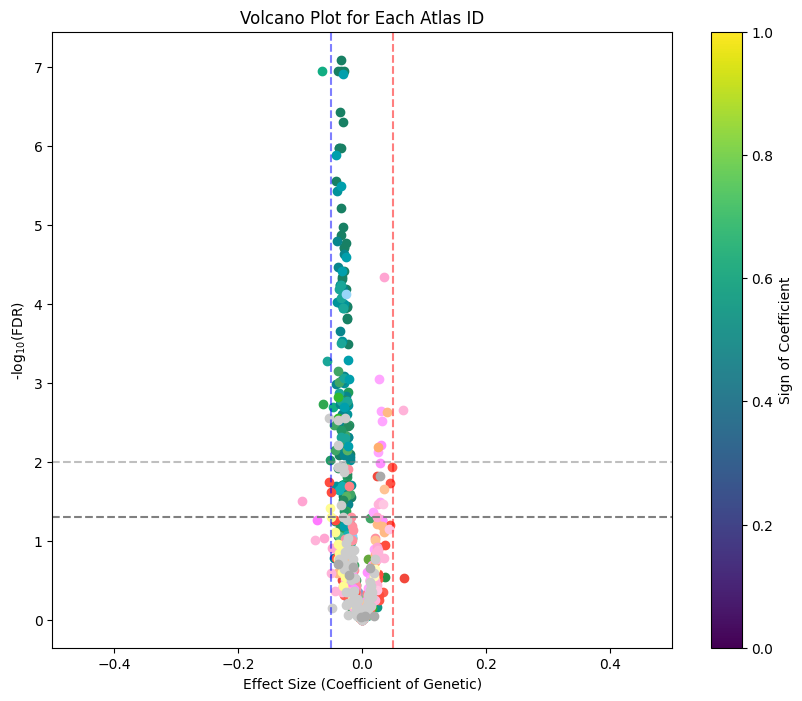

In [180]:
import os
import pandas as pd
import numpy as np
import statsmodels.api as sm
import statsmodels.formula.api as smf
import matplotlib.pyplot as plt
from statsmodels.stats.multitest import multipletests
import rpy2.robjects as robjects
# Rのインスタンスを取得
r = robjects.r
from rpy2.robjects import pandas2ri
pandas2ri.activate()
# Rのライブラリをロード
r = robjects.r
r('library(MASS)')
import numpy as np
import rpy2.robjects as robjects
# Rのインスタンスを取得
r = robjects.r
from rpy2.robjects import pandas2ri
pandas2ri.activate()
# Rのライブラリをロード
r = robjects.r
r('library(MASS)')

def run_glm (data):
        
    # R環境にデータフレームを渡す
    ro.globalenv['data'] = pandas2ri.py2rpy(data)
    # pdfClusterを実行
    r_code = '''
    library(MASS)
    model <- glm.nb('log_All_cell_count ~ Age', data = data)
    coef <- summary(model)$coefficients["Age", "Estimate"]
    p_value <- summary(model)$coefficients["Age", "Pr(>|z|)"]
    c(coef, p_value)
    '''
    #results_ <- summary(model)
    #results_ <- summary(model)
    #p_value <- summary(model)$Coefficients["Genetic", "Pr(>|z|)"]
    #coef <- summary(model)$Coefficients["Genetic", "coef"]
    ro.r(r_code)

    results = ro.r(r_code)
    
    coef = results[0]
    p_value = results[1]
    print(f"Coefficient: {coef}, p-value: {p_value}")
    
    return coef, p_value


# サンプルごとにデータを読み込んで 'Condition' 列を追加する関数を修正
def load_data(sample_info):
    df_list = []
    for sample, condition in sample_info:  # sample_infoには(sample_path, condition)のタプルが格納されている
        param_path = f"/home/mitani/CUBIC-informatics/param/Neuronomics/{sample}/param_multichannel-rank.json"
        try:
            with open(param_path) as f:
                param = json.load(f)
            fw_dir_nu = param["dst_basedir"]

            cellome_file = fw_dir_nu + "/Regional_cellome4.csv"
            if os.path.exists(cellome_file):  # 確認するファイルパスに注意
                print(sample)
                df = pd.read_csv(cellome_file)
                df['Condition'] = condition  # 'Condition' 列を追加
                df['Sample'] = sample  # サンプル名を追加
                df_list.append(df)
        except Exception as e:
            print(f"Error loading data for {sample}: {e}")

    return pd.concat(df_list, ignore_index=True) if df_list else pd.DataFrame()

# Healthy controlとDiseaseのサンプル情報のタプルを取得
healthy_sample_info = [(s, c) for c in ["WT_1m", "WT_3m","WT_5m", "WT_7m", "WT_9m"] for s in conditions[c]]
#disease_sample_info = [(s, c) for c in ["APP_1m", "APP_3m", "APP_5m", "APP_7m", "APP_9m"] for s in conditions[c]]
#healthy_sample_info = [(s, c) for c in ["WT_7m", "WT_9m"] for s in conditions[c]]
#disease_sample_info = [(s, c) for c in [  "APP_7m", "APP_9m"] for s in conditions[c]]

# データを読み込む
healthy_data = load_data(healthy_sample_info)
#disease_data = load_data(disease_sample_info)

# AgeとGeneticの列を追加
healthy_data['Age'] = healthy_data['Condition'].str.extract('(\d+)m').astype(int)
healthy_data['Genetic'] = 0  # Healthyは0
#disease_data['Age'] = disease_data['Condition'].str.extract('(\d+)m').astype(int)
#disease_data['Genetic'] = 1  # Diseaseは1


def normalize_and_calculate_difference(data):
    # atlasIDごとにループ
    for atlas_id in data['atlasID'].unique():
        # 各年齢、各ジェネティックタイプに対して正規化を実行
        for age in data['Age'].unique():
            avg_ctr = data[(data['atlasID'] == atlas_id) & (data['Genetic'] == 0) & (data['Age'] == age)]['Iba1+ density (/mm3)'].mean()
            
            data.loc[(data['atlasID'] == atlas_id) & (data['Age'] == age) & (data['Genetic'] == 0), 'Normalized'] = data[(data['atlasID'] == atlas_id) & (data['Age'] == age) & (data['Genetic'] == 0)]['Iba1+ density (/mm3)'] - avg_ctr 
            data.loc[(data['atlasID'] == atlas_id) & (data['Age'] == age) & (data['Genetic'] == 1), 'Normalized'] = data[(data['atlasID'] == atlas_id) & (data['Age'] == age) & (data['Genetic'] == 1)]['Iba1+ density (/mm3)'] - avg_ctr
        #mini = data.loc[(data['atlasID'] == atlas_id), 'Normalized'].min()
        #data.loc[(data['atlasID'] == atlas_id),'Normalized'] = data.loc[(data['atlasID'] == atlas_id),'Normalized'].copy() - mini
    return data

# データを結合
#all_data = pd.concat([healthy_data, disease_data])
all_data = healthy_data

#all_data = normalize_and_calculate_difference(all_data)
all_data['log_All_cell_count'] = 0
# 全サンプルにわたるAgeの平均を計算
#mean_age = all_data['Age'].mean()
#print(mean_age)
#all_data["Age"] = all_data["Age"] - mean_age

# 線形回帰モデルの作成
results = {}
for atlas_id in all_data['atlasID'].unique():
    print(atlas_id)
    data = all_data[all_data['atlasID'] == atlas_id]

    data['log_All_cell_count'] = np.round(data['Iba1+ density (/mm3)'])#+ 1000000)
    data = data.dropna(subset=['log_All_cell_count'])
    
    all_data['log_All_cell_count'][all_data['atlasID'] == atlas_id] = data['log_All_cell_count'].copy()
    if data['log_All_cell_count'].sum() <= 0.0:
        results[atlas_id] = [0.0, 1.0]
        print(f"No non-zero data available for atlas ID {atlas_id}. Skipping...")
        continue
    results[atlas_id] = run_glm(data)

volcano_data = pd.DataFrame({
    'AtlasID': list(results.keys()),
    'coef': [result[0] for result in results.values()],
    'pvalue': [result[1] for result in results.values()]

})

# BH法による多重検定補正
volcano_data['pvalue'][volcano_data['pvalue'] == 0.0] = 1.0
_, p_adjusted, _, _ = multipletests(volcano_data['pvalue'], method='fdr_bh')

# 補正後のp-valueをデータフレームに追加
volcano_data['adjusted_pvalue'] =  p_adjusted
volcano_data['-log10(adjusted_pvalue)'] = -np.log10(volcano_data['adjusted_pvalue'])

# ID を基準にして volcano_data に RGB 値をマージ
volcano_data = pd.merge(volcano_data, data_GO[['id', 'R', 'G', 'B']], left_on='AtlasID', right_on='id', how='left')

# RGB 値を正規化
volcano_data['color'] = volcano_data.apply(lambda row: (row['R']/255, row['G']/255, row['B']/255), axis=1)

#volcano_data['log2(coef)'] = np.log2(volcano_data['coef'])

###########################

plt.rcParams['font.family'] = 'Arial'
plt.rcParams['font.size'] = 10  # Adjust the size as needed

# ボルカノプロットの描画
plt.figure(figsize=(10, 8))
for _, row in volcano_data.iterrows():
    plt.scatter(row['coef'], row['-log10(adjusted_pvalue)'], color=row['color'])

plt.xlabel("Effect Size (Coefficient of Genetic)")
plt.ylabel(r'-$\log_{10}$(FDR)')  # LaTeX形式で下付き文字を使用
plt.title('Volcano Plot for Each Atlas ID')
plt.xlim(-0.5,0.5)
#plt.ylim(-0.5,10)
plt.axvline(x=-0.05, color='blue', linestyle='--', alpha = 0.5)
plt.axvline(x=0.05, color='red', linestyle='--', alpha = 0.5)
plt.axhline(y=-np.log10(0.05), color='grey', linestyle='--', alpha = 1.0)
plt.axhline(y=-np.log10(0.01), color='grey', linestyle='--', alpha = 0.5)
plt.colorbar(label='Sign of Coefficient')
plt.show()    


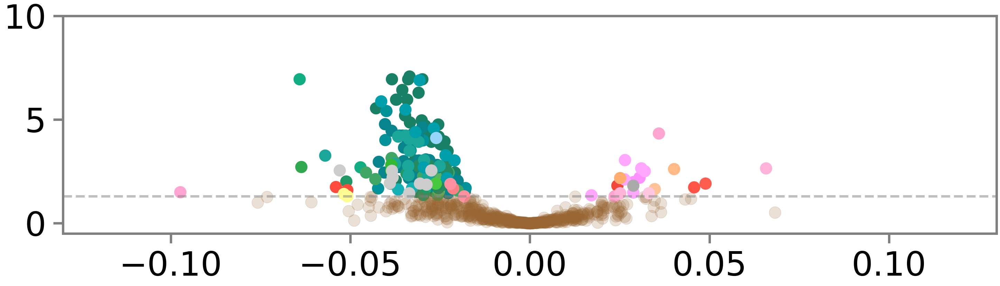

In [182]:
#volcano_data['log2(coef)'] = np.log2(volcano_data['coef'])

###########################

plt.rcParams['font.family'] = 'DejaVu Sans'
plt.rcParams['font.size'] = 70  # Adjust the size as needed
 

# ボルカノプロットの描画
plt.figure(figsize=(30, 7))

for _, row in volcano_data.iterrows(): 
    plt.scatter(row['coef'], row['-log10(adjusted_pvalue)'], 
                color=row['color'] if row['-log10(adjusted_pvalue)'] > -np.log10(0.05) else (0.6, 0.4, 0.2), 
                alpha = 1 if row['-log10(adjusted_pvalue)'] > -np.log10(0.05) else 0.2, 
                s = 600)

#plt.xlabel("Effect Size (Coefficient of Genetic)")
#plt.ylabel(r'-$\log_{10}$(FDR)')  # LaTeX形式で下付き文字を使用
#plt.title('Volcano Plot for Each Region')
# y軸をログスケールに設定
plt.xlim(-0.13, 0.13)
plt.ylim(-0.5, 10.0)
#plt.axvline(x=-0.05, color='blue', linestyle='--', alpha = 0.5)
#plt.axvline(x=0.05, color='red', linestyle='--', alpha = 0.5)
plt.axhline(y=-np.log10(0.05), color='grey', linestyle='--', alpha = 0.5, linewidth = 5)
#plt.axhline(y=-np.log10(0.01), color='grey', linestyle='--', alpha = 0.2)
#plt.colorbar(label='Sign of Coefficient')

# 枠線の色と太さの設定
alpha = 1.0  # 例としてalphaを0.5に設定
for spine in plt.gca().spines.values():
    spine.set_linewidth(5)
    spine.set_color((0.5, 0.5, 0.5, alpha))  # RGBA形式で色を指定
    
# 目盛りを外側に設定し、色をブラックに設定、目盛りラベルのパディングと太字設定
#plt.tick_params(axis='both', which='both', direction='out', length=20, width=5, colors='grey', pad=25)
plt.tick_params(axis='both', which='both', direction='out', length=20, width=5, colors='grey', pad=15, labelcolor='black')

# x軸とy軸の目盛りの位置を設定して数を半分にする
plt.gca().set_xticks(np.linspace(-0.10, 0.10, 5))  # 7個の目盛り
plt.gca().set_yticks(np.linspace(0, 10, 3).astype(int))  # 6個の目盛り

# 目盛りラベルを取得して太字に設定
#for tick in plt.gca().get_xticklabels():
#    tick.set_fontweight('bold')
#for tick in plt.gca().get_yticklabels():
#    tick.set_fontweight('bold')
    
    
# レイアウトを調整してから保存
plt.tight_layout()
plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05)
    
# 透明な背景で保存
plt.savefig('/data5/mitani/Neurology/Fig.4/WT_1m_9m_Microglia_volcano_with_limit_FDR_10_coef_0.6.pdf', 
            transparent=True, dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()

In [183]:
significant_region_ids4 = volcano_data[(volcano_data["adjusted_pvalue"]<0.05)&(volcano_data["coef"]<0.0)]
significant_region_ids4 = significant_region_ids4["AtlasID"]

In [184]:
significant_region_ids5 = volcano_data[(volcano_data["adjusted_pvalue"]<0.05)&(volcano_data["coef"]>0.0)]
significant_region_ids5 = significant_region_ids5["AtlasID"]

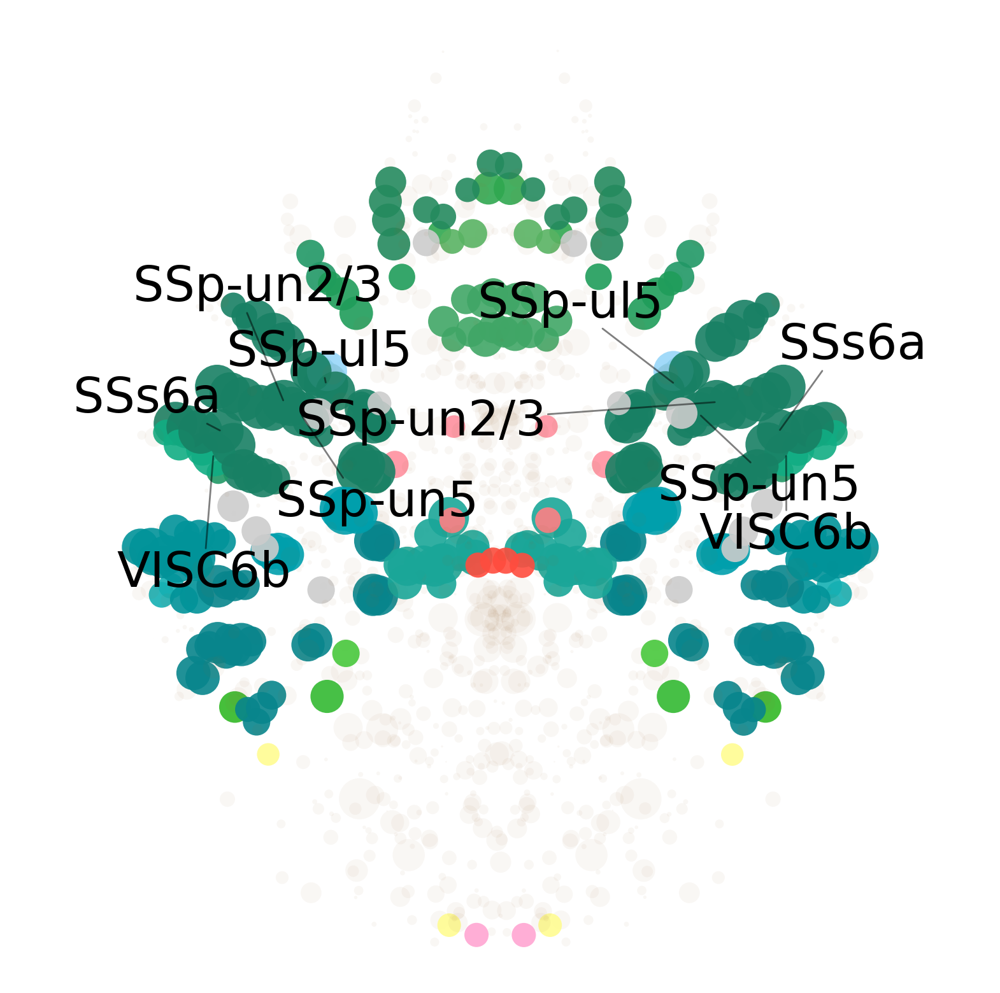

In [185]:
import matplotlib.pyplot as plt
import pandas as pd
from adjustText import adjust_text  # adjustText ライブラリをインポート

# volcano_dataをインデックス化
# マッピングの前に、型が一致していることを確認（必要に応じて型変換）
#all_centroids['atlasID'] = all_centroids['atlasID'].astype(volcano_indexed.index.dtype)

# all_centroidsに -log10(adjusted_pvalue), coef, およびacronymsをマッピング
all_centroids['adjusted_pvalue'] = all_centroids['atlasID'].map(volcano_data.set_index('AtlasID')['adjusted_pvalue'])
all_centroids['-log10(adjusted_pvalue)'] = all_centroids['atlasID'].map(volcano_data.set_index('AtlasID')['-log10(adjusted_pvalue)'])
all_centroids['coef'] = all_centroids['atlasID'].map(volcano_data.set_index('AtlasID')['coef'])
all_centroids['acronym'] = all_centroids['atlasID'].map(data_id.set_index('id')['acronym'])

# 条件に合致し、adjusted_pvalueが最小の上位5つを抽出
top_acronyms = all_centroids[(all_centroids['adjusted_pvalue'] < 0.05) & (all_centroids['coef'] < 0.0)]
top_acronyms = top_acronyms.nsmallest(10, 'adjusted_pvalue')

# グラフのプロット
plt.figure(figsize=(20, 20))
plt.gca().invert_yaxis()
texts = []  # テキストオブジェクトを保存するリスト

plt.rcParams['font.family'] = 'DejaVu Sans'
plt.rcParams['font.size'] = 10


# adjusted p value limit is 0.00001. -log10(adjusted_pvalue) < 5
for i, row in all_centroids.iterrows():
    color = row['color'] if row['adjusted_pvalue'] < 0.05 and row['coef'] < 0.0 else (0.6, 0.4, 0.2)
    alpha = 0.9 if row['adjusted_pvalue'] < 0.05 and row['coef'] < 0.0 else 0.05
    plt.scatter(row['X(um)'], row['Y(um)'],
                s=500 * row['-log10(adjusted_pvalue)'] if 500 * row['-log10(adjusted_pvalue)'] < 500 * 5 else 500 * 5,
                color=color, alpha=alpha, edgecolor='none')
    
    # 上位5位の点のみにテキストを追加（`atlasID` を使用して比較）
    if row['atlasID'] in top_acronyms['atlasID'].values:
        texts.append(plt.text(row['X(um)'], row['Y(um)'], row['acronym'],
                              ha='center', va='center', fontsize=55, color="black", fontweight='regular'))

# 調整されたテキストに対してadjust_textを適用し、アローをグレーで追加
adjust_text(texts, 
            arrowprops=dict(arrowstyle='-', color=(0, 0, 0), alpha = 0.5, linewidth=2),
            expand_points=(1., 1.),  # ポイントからの距離を広げる
            expand_text=(1., 1.),    # テキスト間の距離を広げる
            force_text=(1., 1.),     # テキストを動かす力を強める
            force_points=(1., 1.)   # ポイントを動かす力を強める
            
            #expand_points=(1.5, 1.5),  # ポイントからの距離を広げる
            #expand_text=(1.2, 1.2),    # テキスト間の距離を広げる
            #force_text=(1.2, 1.2),     # テキストを動かす力を強める
            #force_points=(1.2, 1.2)   # ポイントを動かす力を強める
           )

#plt.title('Whole brain plot of 2nd batch VCP-WT vs VCP-mutant Microglia increase')
#plt.xlabel('X (um)')
#plt.ylabel('Y (um)')
plt.axis('equal')

plt.gca().spines['top'].set_visible(False)  # 上の軸線を非表示
plt.gca().spines['right'].set_visible(False)  # 右の軸線を非表示
plt.gca().spines['left'].set_visible(False)  # 左の軸線を非表示
plt.gca().spines['bottom'].set_visible(False)  # 下の軸線を非表示
plt.xticks([])  # X軸の目盛りを非表示
plt.yticks([])  # Y軸の目盛りを非表示

plt.savefig('/data5/mitani/Neurology/Fig.4/WT_1m_9m_Microglia_decrease_with_limit_FDR_5.pdf', 
            transparent=True, dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()

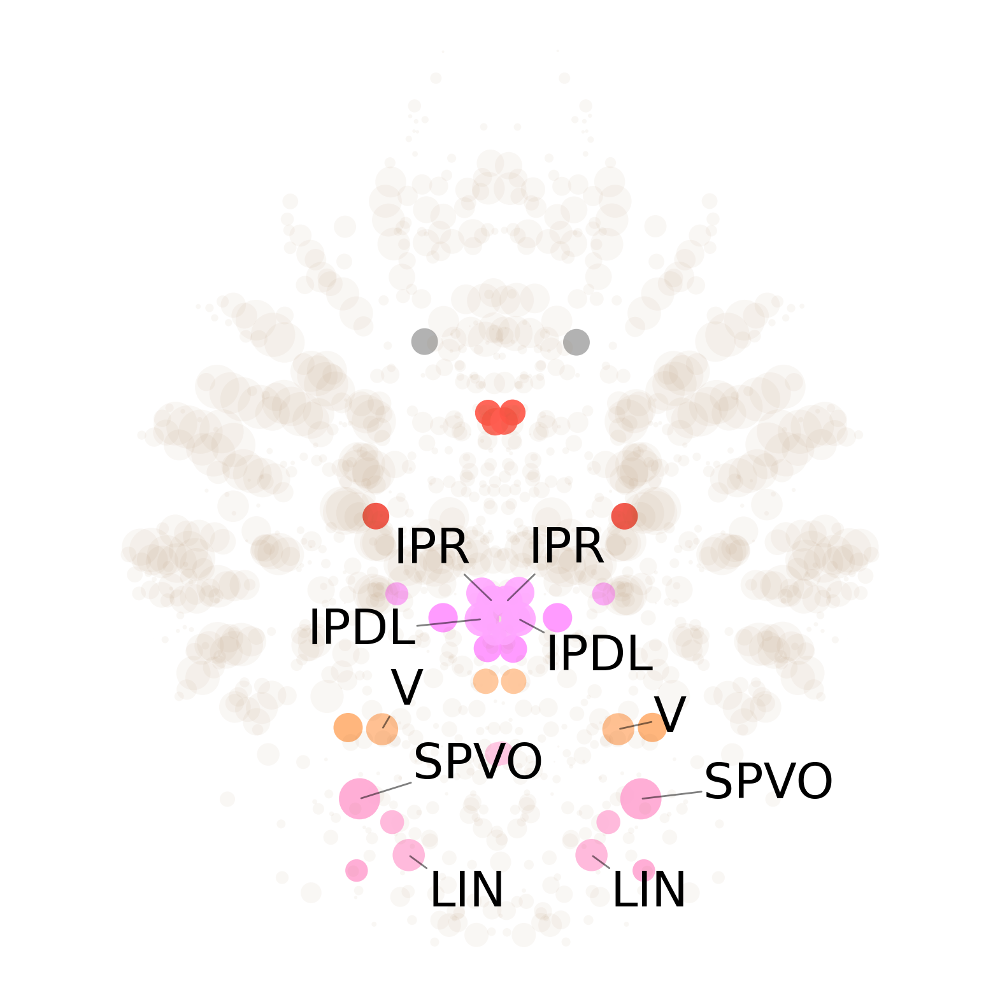

In [186]:
import matplotlib.pyplot as plt
import pandas as pd
from adjustText import adjust_text  # adjustText ライブラリをインポート

# volcano_dataをインデックス化
# マッピングの前に、型が一致していることを確認（必要に応じて型変換）
#all_centroids['atlasID'] = all_centroids['atlasID'].astype(volcano_indexed.index.dtype)

# all_centroidsに -log10(adjusted_pvalue), coef, およびacronymsをマッピング
all_centroids['adjusted_pvalue'] = all_centroids['atlasID'].map(volcano_data.set_index('AtlasID')['adjusted_pvalue'])
all_centroids['-log10(adjusted_pvalue)'] = all_centroids['atlasID'].map(volcano_data.set_index('AtlasID')['-log10(adjusted_pvalue)'])
all_centroids['coef'] = all_centroids['atlasID'].map(volcano_data.set_index('AtlasID')['coef'])
all_centroids['acronym'] = all_centroids['atlasID'].map(data_id.set_index('id')['acronym'])

# 条件に合致し、adjusted_pvalueが最小の上位5つを抽出
top_acronyms = all_centroids[(all_centroids['adjusted_pvalue'] < 0.05) & (all_centroids['coef'] > 0.0)]
top_acronyms = top_acronyms.nsmallest(10, 'adjusted_pvalue')

# グラフのプロット
plt.figure(figsize=(20, 20))
plt.gca().invert_yaxis()
texts = []  # テキストオブジェクトを保存するリスト

plt.rcParams['font.family'] = 'DejaVu Sans'
plt.rcParams['font.size'] = 10


# adjusted p value limit is 0.00001. -log10(adjusted_pvalue) < 5
for i, row in all_centroids.iterrows():
    color = row['color'] if row['adjusted_pvalue'] < 0.05 and row['coef'] > 0.0 else (0.6, 0.4, 0.2)
    alpha = 0.9 if row['adjusted_pvalue'] < 0.05 and row['coef'] > 0.0 else 0.05
    plt.scatter(row['X(um)'], row['Y(um)'],
                s=500 * row['-log10(adjusted_pvalue)'] if 500 * row['-log10(adjusted_pvalue)'] < 500 * 5 else 500 * 5,
                color=color, alpha=alpha, edgecolor='none')
    
    # 上位5位の点のみにテキストを追加（`atlasID` を使用して比較）
    if row['atlasID'] in top_acronyms['atlasID'].values:
        texts.append(plt.text(row['X(um)'], row['Y(um)'], row['acronym'],
                              ha='center', va='center', fontsize=55, color="black", fontweight='regular'))

# 調整されたテキストに対してadjust_textを適用し、アローをグレーで追加
adjust_text(texts, 
            arrowprops=dict(arrowstyle='-', color=(0, 0, 0), alpha = 0.5, linewidth=2),
            expand_points=(1.5, 1.5),  # ポイントからの距離を広げる
            expand_text=(1.2, 1.2),    # テキスト間の距離を広げる
            force_text=(1.2, 1.2),     # テキストを動かす力を強める
            force_points=(1.2, 1.2)   # ポイントを動かす力を強める
           )

#plt.title('Whole brain plot of 2nd batch VCP-WT vs VCP-mutant Microglia increase')
#plt.xlabel('X (um)')
#plt.ylabel('Y (um)')
plt.axis('equal')

plt.gca().spines['top'].set_visible(False)  # 上の軸線を非表示
plt.gca().spines['right'].set_visible(False)  # 右の軸線を非表示
plt.gca().spines['left'].set_visible(False)  # 左の軸線を非表示
plt.gca().spines['bottom'].set_visible(False)  # 下の軸線を非表示
plt.xticks([])  # X軸の目盛りを非表示
plt.yticks([])  # Y軸の目盛りを非表示

plt.savefig('/data5/mitani/Neurology/Fig.4/WT_1m_9m_Microglia_increase_with_limit_FDR_5.pdf', 
            transparent=True, dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()

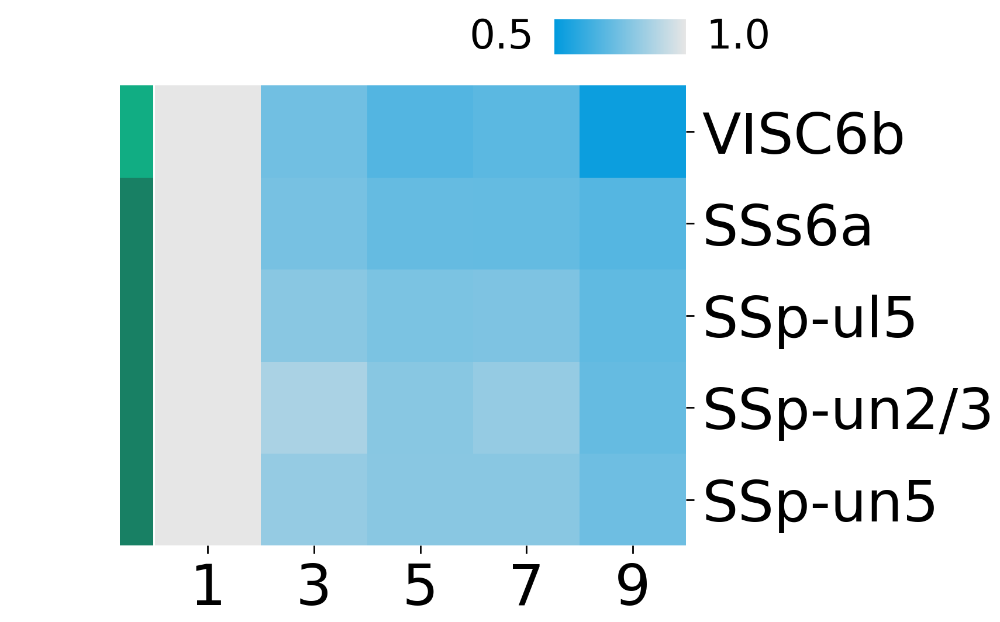

In [188]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
import matplotlib.colors as mcolors

plt.rcParams['font.family'] = 'DejaVu Sans'
plt.rcParams['font.size'] = 70
plt.rcParams['font.weight'] = 'regular'

# Load and extract data
data = all_data[np.isin(all_data["atlasID"], significant_region_ids4)]  # load_and_extract_data(sample_info, conditions)

# Pivot the data for heatmap and calculate mean density for each atlasID and condition
data_pivot = data.pivot_table(index='atlasID', columns='Condition', values='log_All_cell_count', aggfunc='mean')
# Fill NaN with column means and check if entire columns were NaN
data_pivot = data_pivot.apply(lambda col: col.fillna(col.mean()) if not col.isnull().all() else col.fillna(0))

# Normalize data by row using Z-score, and handle zero variance by replacing NaNs in the result with 0
data_normalized = data_pivot.div(data_pivot['WT_1m'], axis=0)

# significant_region_ids5に基づいてadjusted_pvalueを抽出し、-log10(adjusted_pvalue)を計算
log_adjusted_pvalues = pd.Series(data_normalized.index.map(volcano_data.set_index('AtlasID')['-log10(adjusted_pvalue)']), index=data_normalized.index)
# data_normalizedを-log10(adjusted_pvalue)の順にソート
data_normalized_sorted = data_normalized.loc[log_adjusted_pvalues.sort_values(ascending=False).index]

# 上位5つの行だけを選択
top5_data_normalized_sorted = data_normalized_sorted.head(5)

# acronymのインデックスを追加し、ソート
acronyms = data_id.set_index('id').loc[data_normalized.index, 'acronym']
acronyms_sorted = acronyms.loc[log_adjusted_pvalues.sort_values(ascending=False).index]

# 上位5つのアクロニムを選択
top5_acronyms_sorted = acronyms_sorted.head(5)

# Custom color map creation: gray to magenta
colors = [(0.0, 154/255, 222/255), (0.9, 0.9, 0.9)] 
cmap = mcolors.LinearSegmentedColormap.from_list('custom_gray_magenta', colors)


# Sort the top 5 rows by 'newVCP_mut_2m' in descending order
top5_data_normalized_sorted = top5_data_normalized_sorted.sort_values(by='WT_9m', ascending=True)
top5_acronyms_sorted = top5_acronyms_sorted.loc[top5_data_normalized_sorted.index]


colorlist = []

for atlas_id in top5_data_normalized_sorted.index:
    for i in range(671):
        if data_GO["id"].values[i] == atlas_id:
            colorlist.append((data_GO["R"].values[i] / 255, data_GO["G"].values[i] / 255, data_GO["B"].values[i] / 255))
colorlist_671 = colorlist

# Custom x-axis labels
custom_labels = ['1', '3', '5', '7', '9']

# Check if top5_data_normalized_sorted contains any NaN
if top5_data_normalized_sorted.isnull().any().any():
    print("Data contains NaNs or infinite values, which cannot be clustered.")
else:
    # Cluster map creation
    vmin = 0.5
    vmax = 1.0
    g = sns.clustermap(top5_data_normalized_sorted, row_colors=colorlist_671[:5], cmap=cmap, vmin=vmin, vmax=vmax, row_cluster=False, col_cluster=False, figsize=(15, 12))
    
    g.ax_heatmap.set_yticklabels(top5_acronyms_sorted, rotation=0)
    g.ax_heatmap.set_xlabel('')
    g.ax_heatmap.set_ylabel('')

    g.cax.set_visible(False)

    # Set custom x-axis labels
    g.ax_heatmap.set_xticklabels(custom_labels, rotation=0)
    g.ax_heatmap.tick_params(axis='both', which='both', length=10, width=2, pad=10)

    # Create a new color bar axis below the heatmap
    cbar_ax = g.fig.add_axes([0.75, 0.81, 0.15, 0.05])  # Right-aligned and 1/3 width
    norm = plt.Normalize(vmin=vmin, vmax=vmax)
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    cb = g.fig.colorbar(sm, cax=cbar_ax, orientation='horizontal')

    # Remove the black border around the color bar
    cb.outline.set_visible(False)

    # Set color bar ticks
    cb.set_ticks([])  # Remove default ticks
    # Add custom labels next to the color bar
    cbar_ax.text(-0.4, 0.5, str(vmin), va='center', ha='center', transform=cbar_ax.transAxes, fontsize=50, fontweight='regular')
    cbar_ax.text(1.4, 0.5, str(vmax), va='center', ha='center', transform=cbar_ax.transAxes, fontsize=50, fontweight='regular')
    
    plt.savefig('/data5/mitani/Neurology/Fig.4/WT_1m_9m_Microglia_decrease_top5_sorted_heatmap.pdf', 
            transparent=True, dpi=300, bbox_inches='tight', pad_inches=0.1)
    plt.show()


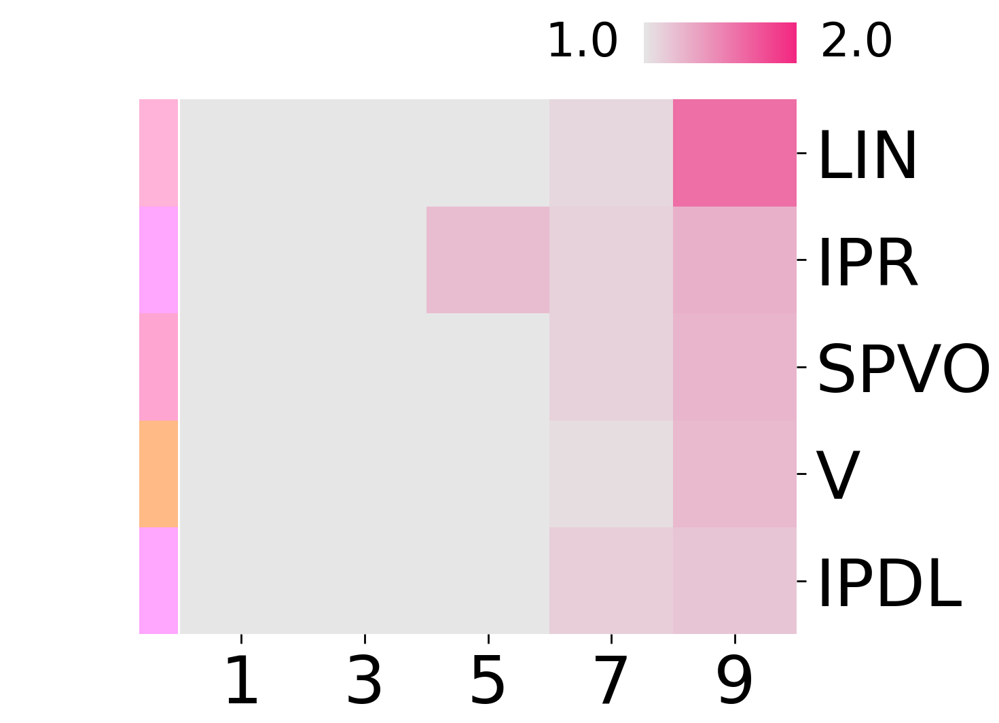

In [187]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
import matplotlib.colors as mcolors

plt.rcParams['font.family'] = 'DejaVu Sans'
plt.rcParams['font.size'] = 70
plt.rcParams['font.weight'] = 'regular'

# Load and extract data
data = all_data[np.isin(all_data["atlasID"], significant_region_ids5)]  # load_and_extract_data(sample_info, conditions)

# Pivot the data for heatmap and calculate mean density for each atlasID and condition
data_pivot = data.pivot_table(index='atlasID', columns='Condition', values='log_All_cell_count', aggfunc='mean')
# Fill NaN with column means and check if entire columns were NaN
data_pivot = data_pivot.apply(lambda col: col.fillna(col.mean()) if not col.isnull().all() else col.fillna(0))

# Normalize data by row using Z-score, and handle zero variance by replacing NaNs in the result with 0
data_normalized = data_pivot.div(data_pivot['WT_1m'], axis=0)

# significant_region_ids5に基づいてadjusted_pvalueを抽出し、-log10(adjusted_pvalue)を計算
log_adjusted_pvalues = pd.Series(data_normalized.index.map(volcano_data.set_index('AtlasID')['-log10(adjusted_pvalue)']), index=data_normalized.index)
# data_normalizedを-log10(adjusted_pvalue)の順にソート
data_normalized_sorted = data_normalized.loc[log_adjusted_pvalues.sort_values(ascending=False).index]

# 上位5つの行だけを選択
top5_data_normalized_sorted = data_normalized_sorted.head(5)

# acronymのインデックスを追加し、ソート
acronyms = data_id.set_index('id').loc[data_normalized.index, 'acronym']
acronyms_sorted = acronyms.loc[log_adjusted_pvalues.sort_values(ascending=False).index]

# 上位5つのアクロニムを選択
top5_acronyms_sorted = acronyms_sorted.head(5)

# Custom color map creation: gray to magenta
colors = [(0.9, 0.9, 0.9), (0.95, 0.15, 0.5)]
cmap = mcolors.LinearSegmentedColormap.from_list('custom_gray_magenta', colors)


# Sort the top 5 rows by 'newVCP_mut_2m' in descending order
top5_data_normalized_sorted = top5_data_normalized_sorted.sort_values(by='WT_9m', ascending=False)
top5_acronyms_sorted = top5_acronyms_sorted.loc[top5_data_normalized_sorted.index]

colorlist = []

for atlas_id in top5_acronyms_sorted.index:
    for i in range(671):
        if data_GO["id"].values[i] == atlas_id:
            colorlist.append((data_GO["R"].values[i] / 255, data_GO["G"].values[i] / 255, data_GO["B"].values[i] / 255))
colorlist_671 = colorlist

# Custom x-axis labels
custom_labels = ['1', '3', '5', '7', '9']

# Check if top5_data_normalized_sorted contains any NaN
if top5_data_normalized_sorted.isnull().any().any():
    print("Data contains NaNs or infinite values, which cannot be clustered.")
else:
    # Cluster map creation
    vmin = 1.0
    vmax = 2.0
    g = sns.clustermap(top5_data_normalized_sorted, row_colors=colorlist_671[:5], cmap=cmap, vmin=vmin, vmax=vmax, row_cluster=False, col_cluster=False, figsize=(15, 12))
    
    g.ax_heatmap.set_yticklabels(top5_acronyms_sorted, rotation=0)
    g.ax_heatmap.set_xlabel('')
    g.ax_heatmap.set_ylabel('')

    g.cax.set_visible(False)

    # Set custom x-axis labels
    g.ax_heatmap.set_xticklabels(custom_labels, rotation=0)
    g.ax_heatmap.tick_params(axis='both', which='both', length=10, width=2, pad=10)

    # Create a new color bar axis below the heatmap
    cbar_ax = g.fig.add_axes([0.75, 0.81, 0.15, 0.05])  # Right-aligned and 1/3 width
    norm = plt.Normalize(vmin=vmin, vmax=vmax)
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    cb = g.fig.colorbar(sm, cax=cbar_ax, orientation='horizontal')

    # Remove the black border around the color bar
    cb.outline.set_visible(False)

    # Set color bar ticks
    cb.set_ticks([])  # Remove default ticks
    # Add custom labels next to the color bar
    cbar_ax.text(-0.4, 0.5, str(vmin), va='center', ha='center', transform=cbar_ax.transAxes, fontsize=50, fontweight='regular')
    cbar_ax.text(1.4, 0.5, str(vmax), va='center', ha='center', transform=cbar_ax.transAxes, fontsize=50, fontweight='regular')
    
    plt.savefig('/data5/mitani/Neurology/Fig.4/WT_1m_9m_Microglia_increase_top5_sorted_heatmap.pdf', 
            transparent=True, dpi=300, bbox_inches='tight', pad_inches=0.1)
    plt.show()

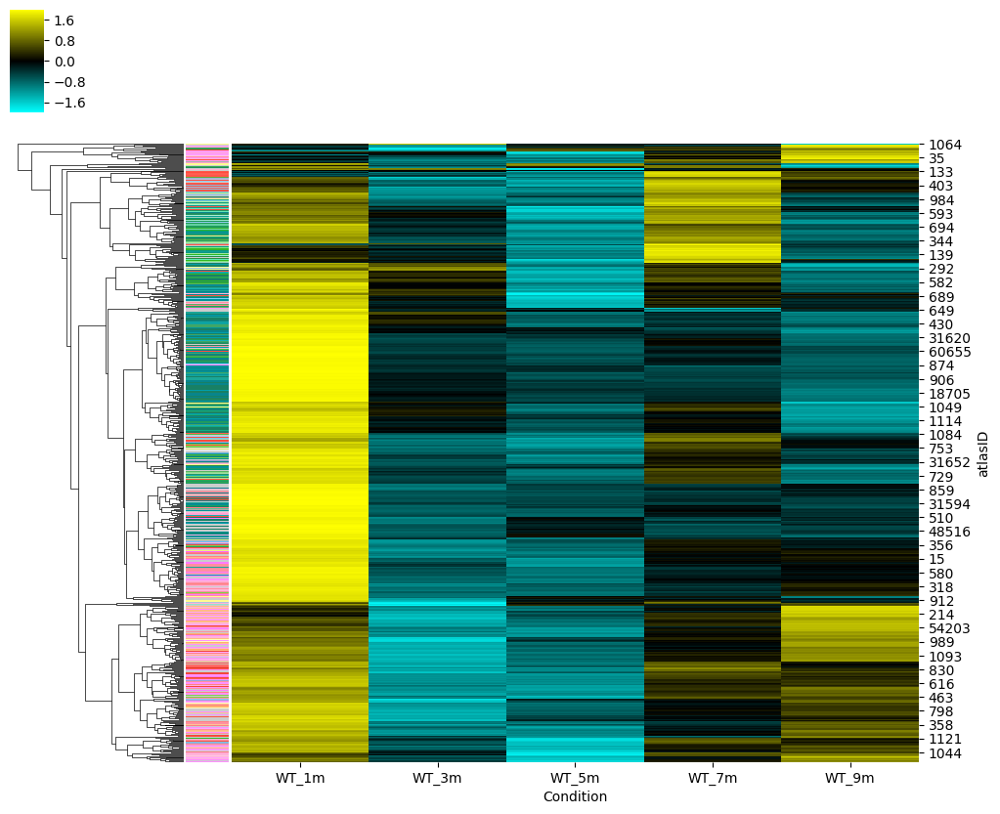

In [22]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import zscore
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.colors as mcolors
import json


# Function to load data and extract 'Iba1+ density (/mm3)' with Condition
def load_and_extract_data(sample_info, conditions):
    df_list = []
    for sample, condition in sample_info:
        param_path = f"/home/mitani/CUBIC-informatics/param/Neuronomics/{sample}/param_multichannel-rank.json"
        try:
            with open(param_path) as f:
                param = json.load(f)
            fw_dir_nu = param["dst_basedir"]
            cellome_file = fw_dir_nu + "/Regional_cellome4.csv"
            if os.path.exists(cellome_file):
                df = pd.read_csv(cellome_file)
                df['Condition'] = condition
                df['Sample'] = sample
                df_list.append(df[['atlasID','NeuN+ density (/mm3)', 'Iba1+ density (/mm3)', 'Condition']])
            else:
                print(f"File not found: {cellome_file}")
        except Exception as e:
            print(f"Error loading data for {sample}: {e}")
    
    return pd.concat(df_list, ignore_index=True) if df_list else pd.DataFrame()


# Prepare sample info
sample_info = [(s, c) for c in ["WT_1m", "WT_3m","WT_5m", "WT_7m", "WT_9m"] for s in conditions[c]]

# Load and extract data
data = all_data[(all_data["Genetic"] == 0) ]#load_and_extract_data(sample_info, conditions)

# Pivot the data for heatmap and calculate mean density for each atlasID and condition
data_pivot = data.pivot_table(index='atlasID', columns='Condition', values='log_All_cell_count', aggfunc='mean')
# Fill NaN with column means and check if entire columns were NaN
data_pivot = data_pivot.apply(lambda col: col.fillna(col.mean()) if not col.isnull().all() else col.fillna(0))

# Normalize data by row using Z-score, and handle zero variance by replacing NaNs in the result with 0
data_normalized = data_pivot.apply(zscore, axis=1).fillna(0)

# Custom color map creation
def create_custom_cmap():
    # Colors: cyan-like, black, yellow-like
    colors = ["#00ffff", "#000000", "#ffff00"]
    cmap_name = "custom_cmap"
    
    # Create a colormap with interpolation between specified colors
    cmap = mcolors.LinearSegmentedColormap.from_list(cmap_name, colors)
    
    return cmap

colorlist=[]

total = 0

for atlas_id in data_pivot.index:
    for i in range (671):
        if data_GO["id"].values[i] == atlas_id:
            colorlist.append((data_GO["R"].values[i]/255,data_GO["G"].values[i]/255,data_GO["B"].values[i]/255))
    colorlist_671=colorlist

# Using the new custom colormap
cmap = create_custom_cmap()

# Check if data_normalized contains any NaN
if data_normalized.isnull().any().any():
    print("Data contains NaNs or infinite values, which cannot be clustered.")
else:
    # Cluster map creation
    sns.clustermap(data_normalized, row_colors=colorlist_671,method="average", cmap=cmap,  vmin=-2, vmax=2, row_cluster=True, col_cluster=False, figsize=(12, 10))
    plt.show()

In [23]:
# CSVファイルとして保存
data_pivot.to_csv('/data4/Region/WT_raw_value_regions_Iba1_all.csv', index=True)

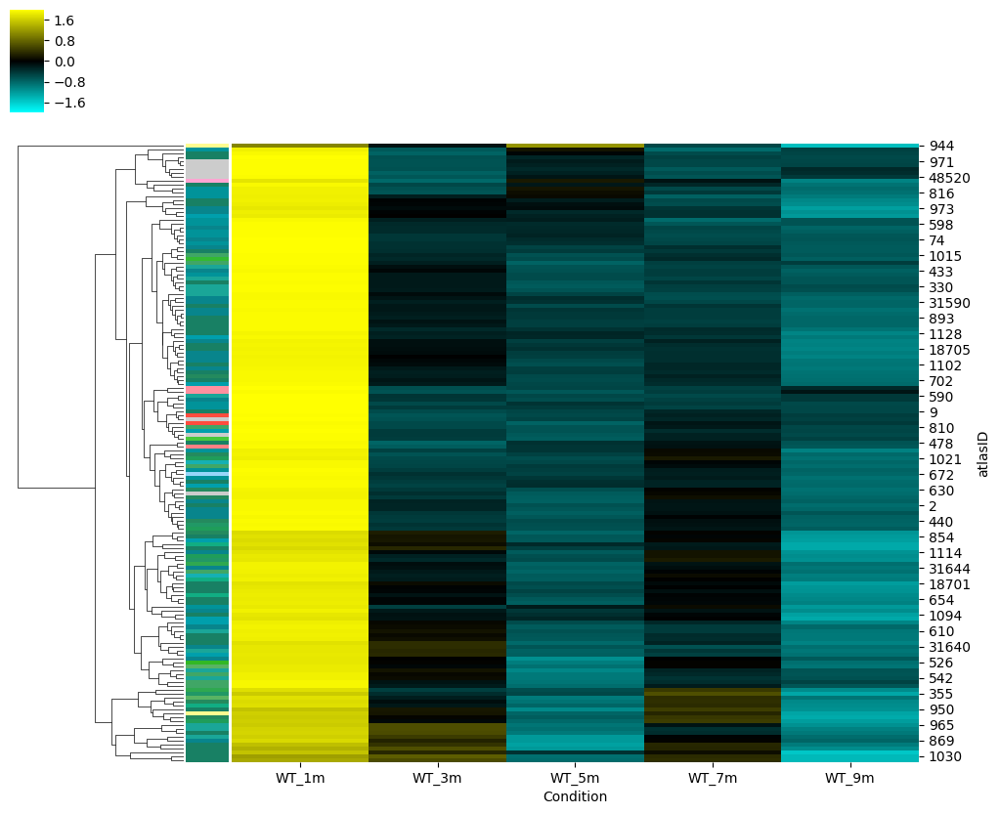

In [80]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import zscore
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.colors as mcolors
import json


# Function to load data and extract 'Iba1+ density (/mm3)' with Condition
def load_and_extract_data(sample_info, conditions):
    df_list = []
    for sample, condition in sample_info:
        param_path = f"/home/mitani/CUBIC-informatics/param/Neuronomics/{sample}/param_multichannel-rank.json"
        try:
            with open(param_path) as f:
                param = json.load(f)
            fw_dir_nu = param["dst_basedir"]
            cellome_file = fw_dir_nu + "/Regional_cellome4.csv"
            if os.path.exists(cellome_file):
                df = pd.read_csv(cellome_file)
                df['Condition'] = condition
                df['Sample'] = sample
                df_list.append(df[['atlasID','NeuN+ density (/mm3)', 'Iba1+ density (/mm3)', 'Condition']])
            else:
                print(f"File not found: {cellome_file}")
        except Exception as e:
            print(f"Error loading data for {sample}: {e}")
    
    return pd.concat(df_list, ignore_index=True) if df_list else pd.DataFrame()


# Prepare sample info
sample_info = [(s, c) for c in ["WT_1m", "WT_3m","WT_5m", "WT_7m", "WT_9m"] for s in conditions[c]]

# Load and extract data
data = all_data[(all_data["Genetic"] == 0) & np.isin(all_data["atlasID"],significant_region_ids4)]#load_and_extract_data(sample_info, conditions)

# Pivot the data for heatmap and calculate mean density for each atlasID and condition
data_pivot = data.pivot_table(index='atlasID', columns='Condition', values='log_All_cell_count', aggfunc='mean')
# Fill NaN with column means and check if entire columns were NaN
data_pivot = data_pivot.apply(lambda col: col.fillna(col.mean()) if not col.isnull().all() else col.fillna(0))

# Normalize data by row using Z-score, and handle zero variance by replacing NaNs in the result with 0
data_normalized = data_pivot.apply(zscore, axis=1).fillna(0)

# Custom color map creation
def create_custom_cmap():
    # Colors: cyan-like, black, yellow-like
    colors = ["#00ffff", "#000000", "#ffff00"]
    cmap_name = "custom_cmap"
    
    # Create a colormap with interpolation between specified colors
    cmap = mcolors.LinearSegmentedColormap.from_list(cmap_name, colors)
    
    return cmap

colorlist=[]

total = 0

for atlas_id in data_pivot.index:
    for i in range (671):
        if data_GO["id"].values[i] == atlas_id:
            colorlist.append((data_GO["R"].values[i]/255,data_GO["G"].values[i]/255,data_GO["B"].values[i]/255))
    colorlist_671=colorlist

# Using the new custom colormap
cmap = create_custom_cmap()

# Check if data_normalized contains any NaN
if data_normalized.isnull().any().any():
    print("Data contains NaNs or infinite values, which cannot be clustered.")
else:
    # Cluster map creation
    sns.clustermap(data_normalized, row_colors=colorlist_671,method="average", cmap=cmap,  vmin=-2, vmax=2, row_cluster=True, col_cluster=False, figsize=(12, 10))
    plt.show()

In [81]:
# CSVファイルとして保存
data_pivot.to_csv('/data4/Region/WT_raw_value_regions_Iba1_decrease.csv', index=True)

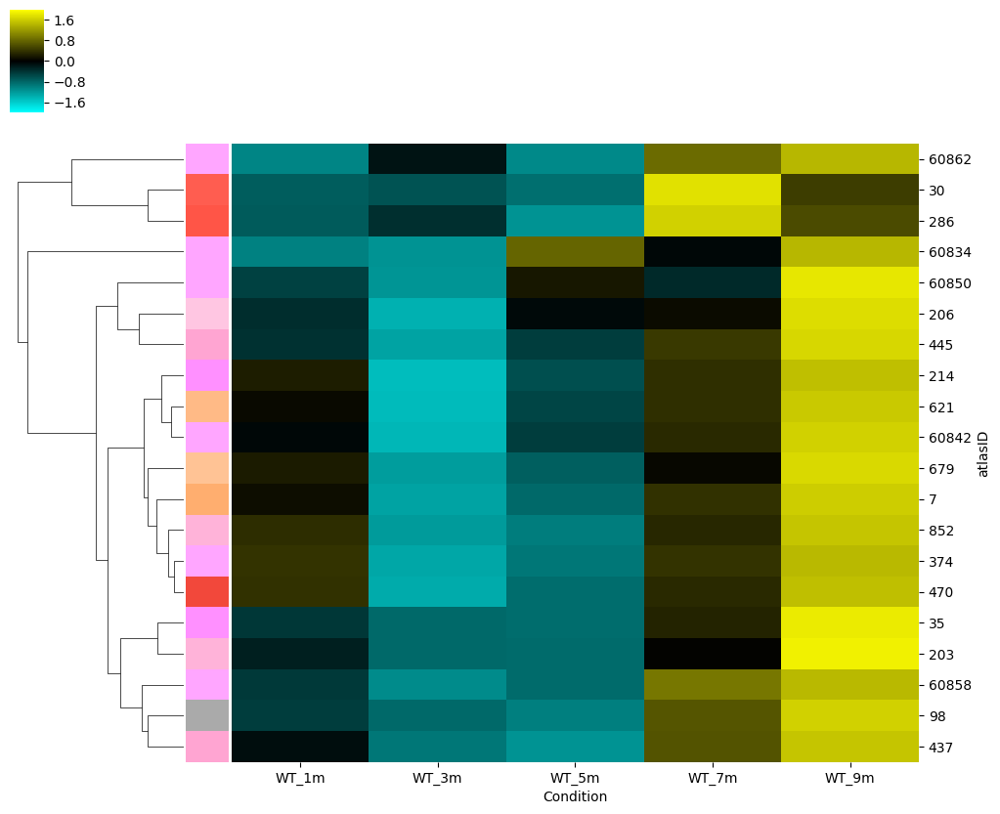

In [82]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import zscore
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.colors as mcolors
import json


# Function to load data and extract 'Iba1+ density (/mm3)' with Condition
def load_and_extract_data(sample_info, conditions):
    df_list = []
    for sample, condition in sample_info:
        param_path = f"/home/mitani/CUBIC-informatics/param/Neuronomics/{sample}/param_multichannel-rank.json"
        try:
            with open(param_path) as f:
                param = json.load(f)
            fw_dir_nu = param["dst_basedir"]
            cellome_file = fw_dir_nu + "/Regional_cellome4.csv"
            if os.path.exists(cellome_file):
                df = pd.read_csv(cellome_file)
                df['Condition'] = condition
                df['Sample'] = sample
                df_list.append(df[['atlasID','NeuN+ density (/mm3)', 'Iba1+ density (/mm3)', 'Condition']])
            else:
                print(f"File not found: {cellome_file}")
        except Exception as e:
            print(f"Error loading data for {sample}: {e}")
    
    return pd.concat(df_list, ignore_index=True) if df_list else pd.DataFrame()


# Prepare sample info
sample_info = [(s, c) for c in ["WT_1m", "WT_3m","WT_5m", "WT_7m", "WT_9m"] for s in conditions[c]]

# Load and extract data
data = all_data[(all_data["Genetic"] == 0) & np.isin(all_data["atlasID"],significant_region_ids5)]#load_and_extract_data(sample_info, conditions)

# Pivot the data for heatmap and calculate mean density for each atlasID and condition
data_pivot = data.pivot_table(index='atlasID', columns='Condition', values='log_All_cell_count', aggfunc='mean')
# Fill NaN with column means and check if entire columns were NaN
data_pivot = data_pivot.apply(lambda col: col.fillna(col.mean()) if not col.isnull().all() else col.fillna(0))

# Normalize data by row using Z-score, and handle zero variance by replacing NaNs in the result with 0
data_normalized = data_pivot.apply(zscore, axis=1).fillna(0)

# Custom color map creation
def create_custom_cmap():
    # Colors: cyan-like, black, yellow-like
    colors = ["#00ffff", "#000000", "#ffff00"]
    cmap_name = "custom_cmap"
    
    # Create a colormap with interpolation between specified colors
    cmap = mcolors.LinearSegmentedColormap.from_list(cmap_name, colors)
    
    return cmap

colorlist=[]

total = 0

for atlas_id in data_pivot.index:
    for i in range (671):
        if data_GO["id"].values[i] == atlas_id:
            colorlist.append((data_GO["R"].values[i]/255,data_GO["G"].values[i]/255,data_GO["B"].values[i]/255))
    colorlist_671=colorlist

# Using the new custom colormap
cmap = create_custom_cmap()

# Check if data_normalized contains any NaN
if data_normalized.isnull().any().any():
    print("Data contains NaNs or infinite values, which cannot be clustered.")
else:
    # Cluster map creation
    sns.clustermap(data_normalized, row_colors=colorlist_671,method="average", cmap=cmap,  vmin=-2, vmax=2, row_cluster=True, col_cluster=False, figsize=(12, 10))
    plt.show()

In [83]:
# CSVファイルとして保存
data_pivot.to_csv('/data4/Region/WT_raw_value_regions_Iba1_increase.csv', index=True)

In [ ]:
# APP only Abetaを考える。

In [105]:
conditions = {

    "WT_1m": ["#4_APPmodel_Abeta_Ctr1m_1","#4_APPmodel_Abeta_Ctr1m_2","#4_APPmodel_Abeta_Ctr1m_3", "#4_APPmodel_Abeta_Ctr1m_4"],
 
    "WT_3m": ["#4_APPmodel_Abeta_Ctr3m_1","#4_APPmodel_Abeta_Ctr3m_2","#4_APPmodel_Abeta_Ctr3m_3", "#4_APPmodel_Abeta_Ctr3m_4",],
    "WT_5m": ["#4_APPmodel_Abeta_Ctr5m_1","#4_APPmodel_Abeta_Ctr5m_2","#4_APPmodel_Abeta_Ctr5m_3", "#4_APPmodel_Abeta_Ctr5m_4"],
    "WT_7m": ["#4_APPmodel_Abeta_Ctr7m_1","#4_APPmodel_Abeta_Ctr7m_2", "#4_APPmodel_Abeta_Ctr7m_3", "#4_APPmodel_Abeta_Ctr7m_4"],
    "WT_9m": ["#4_APPmodel_Abeta_Ctr9m_1","#4_APPmodel_Abeta_Ctr9m_2","#4_APPmodel_Abeta_Ctr9m_3", "#4_APPmodel_Abeta_Ctr9m_4"],

    "APP_1m": ["#4_APPmodel_Abeta_APP1m_1","#4_APPmodel_Abeta_APP1m_2","#4_APPmodel_Abeta_APP1m_3","#4_APPmodel_Abeta_APP1m_4"],
    "APP_3m": ["#4_APPmodel_Abeta_APP3m_1","#4_APPmodel_Abeta_APP3m_2", "#4_APPmodel_Abeta_APP3m_3", "#4_APPmodel_Abeta_APP3m_4"],
   "APP_5m": ["#4_APPmodel_Abeta_APP5m_1","#4_APPmodel_Abeta_APP5m_2","#4_APPmodel_Abeta_APP5m_3","#4_APPmodel_Abeta_APP5m_4"],
    "APP_7m": ["#4_APPmodel_Abeta_APP7m_1","#4_APPmodel_Abeta_APP7m_2", "#4_APPmodel_Abeta_APP7m_3", "#4_APPmodel_Abeta_APP7m_4"],
    "APP_9m": ["#4_APPmodel_Abeta_APP9m_1","#4_APPmodel_Abeta_APP9m_2","#4_APPmodel_Abeta_APP9m_3","#4_APPmodel_Abeta_APP9m_4"],

}

#4_APPmodel_Abeta_APP1m_1
#4_APPmodel_Abeta_APP1m_2
#4_APPmodel_Abeta_APP1m_3
#4_APPmodel_Abeta_APP1m_4
#4_APPmodel_Abeta_APP3m_1
#4_APPmodel_Abeta_APP3m_2
#4_APPmodel_Abeta_APP3m_3
#4_APPmodel_Abeta_APP3m_4
#4_APPmodel_Abeta_APP5m_1
#4_APPmodel_Abeta_APP5m_2
#4_APPmodel_Abeta_APP5m_3
#4_APPmodel_Abeta_APP5m_4
#4_APPmodel_Abeta_APP7m_1
#4_APPmodel_Abeta_APP7m_2
#4_APPmodel_Abeta_APP7m_3
#4_APPmodel_Abeta_APP7m_4
#4_APPmodel_Abeta_APP9m_1
#4_APPmodel_Abeta_APP9m_2
#4_APPmodel_Abeta_APP9m_3
#4_APPmodel_Abeta_APP9m_4
997


/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:156: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

Coefficient: 2546.3875000000003, p-value: 4.505032142446543e-07
68
Coefficient: 547974.025, p-value: 0.0051511839207956794
667
Coefficient: 2151330.1625000006, p-value: 0.050534374435444014
52192
Coefficient: 2921874.8875, p-value: 0.045724575614769836
52196
Coefficient: 4089293.450000001, p-value: 0.5345597767315845
52264
Coefficient: -227479516.89999983, p-value: 0.7666949363657545
320


/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:156: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

Coefficient: 793314.9625, p-value: 0.001571196232845059
943
Coefficient: 1026918.9375000002, p-value: 1.1542533250087811e-05
648
Coefficient: 864637.4500000001, p-value: 0.003632596856257619
844
Coefficient: 580770.1125000002, p-value: 0.011516486993273725
882
Coefficient: 5168470.150000002, p-value: 0.026302661522393515
656
Coefficient: 290854.25000000006, p-value: 0.0014663531127183508
962
Coefficient: 616302.8375, p-value: 0.0001493683488767329
767


/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:156: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

Coefficient: 491263.45000000007, p-value: 0.005353849052567761
1021
Coefficient: 587828.4750000002, p-value: 0.039225501466569945
1085
Coefficient: 6773872.087500001, p-value: 0.18247755364329823
558
Coefficient: 9764365.737499999, p-value: 9.394231241911169e-08
838


/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:156: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

Coefficient: 11298966.575, p-value: 1.0260251854374239e-07
654
Coefficient: 9348232.999999996, p-value: 1.3193977278230597e-05
702
Coefficient: 6602263.212500001, p-value: 0.0003708687093311581
889
Coefficient: 2410717.7625, p-value: 0.007200382806899314
929
Coefficient: 13283680.025000008, p-value: 0.12563678284711877
981
Coefficient: 4262687.149999999, p-value: 9.760551260039105e-06
201
Coefficient: 5244625.825000001, p-value: 1.2906685109080588e-08
1047
Coefficient: 4408779.175, p-value: 1.718032184728365e-06
1070


/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:156: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

Coefficient: 3636558.437499999, p-value: 1.0223382147535091e-05
1038
Coefficient: 1789617.8625000003, p-value: 4.396996676129446e-05
1062
Coefficient: 9587445.337499999, p-value: 0.00025640516194595526
1030
Coefficient: 2851938.0625, p-value: 0.0025443047736598405
113
Coefficient: 8509222.575, p-value: 2.099128096040734e-08
1094
Coefficient: 19309695.7875, p-value: 2.3003455060646315e-06
1128
Coefficient: 7976359.1625, p-value: 1.3876102691631414e-05
478
Coefficient: 4275049.449999999, p-value: 7.969869501550397e-06
510
Coefficient: 21715637.275, p-value: 0.00035736505620431714
878
Coefficient: 3541771.0499999993, p-value: 8.566064754833665e-07
657
Coefficient: 4009203.2875000006, p-value: 2.1790395010724053e-07
950
Coefficient: 5268241.962500001, p-value: 4.067695962980747e-05
974
Coefficient: 2897106.7250000006, p-value: 0.0018151192420435846
1102
Coefficient: 1159364.5375000003, p-value: 0.01160934262323494
2
Coefficient: 11437616.237500006, p-value: 0.017863219460330194
450


/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:156: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

Coefficient: 5074261.099999999, p-value: 5.415438852436724e-06
854
Coefficient: 6154901.1499999985, p-value: 4.543411066976899e-08
577
Coefficient: 9588082.700000001, p-value: 8.517815633003647e-06
625
Coefficient: 5339687.187500001, p-value: 2.608482263863014e-05
945
Coefficient: 2368189.6125000003, p-value: 0.00011731182020795828
1026
Coefficient: 17302924.8125, p-value: 0.003268096427685862
1006
Coefficient: 8003849.9125, p-value: 0.0004099704491755155
670
Coefficient: 13850636.274999995, p-value: 4.6929208361603086e-08
1086
Coefficient: 35602790.562500015, p-value: 2.3004164875450752e-06
1111
Coefficient: 12116424.762500005, p-value: 9.654969735000218e-06
9
Coefficient: 6393034.5375000015, p-value: 0.0025752625579797774
461
Coefficient: 40506820.45, p-value: 0.008059857633754636
18693
Coefficient: 19787973.625000004, p-value: 2.2237326984887142e-05
18697
Coefficient: 19419465.75, p-value: 6.9886249380834e-07
18701
Coefficient: 26926951.225, p-value: 4.799757270673046e-05
18705
Coef

/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:156: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

Coefficient: 5088698.612500002, p-value: 0.02277565491485579
36
Coefficient: 3583227.3125000005, p-value: 0.0020448783808239713
180
Coefficient: 6040903.549999999, p-value: 0.0001684434497347547
148
Coefficient: 22309895.087500002, p-value: 0.00044520462535424234
187
Coefficient: 4524848.7625, p-value: 0.009402104128214227
638
Coefficient: 3353946.3000000026, p-value: 0.050343235654011095
662
Coefficient: 26747761.499999993, p-value: 0.019426589074271743
897
Coefficient: 2050320.0750000004, p-value: 0.010760959806697171
1106
Coefficient: 5444629.750000002, p-value: 7.902064773584556e-05
1010
Coefficient: 19035455.975000005, p-value: 0.0004093948607236888
1058
Coefficient: 2697811.3499999996, p-value: 0.031114810101849816
857
Coefficient: 1459835.0125000014, p-value: 0.2307049111541703
849
Coefficient: 19990479.68750001, p-value: 0.08385177602257923
527
Coefficient: 8456126.412500001, p-value: 0.009633109250751023
600
Coefficient: 18773195.050000004, p-value: 7.558633125477152e-07
678
C

/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:156: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

Coefficient: 31353156.475, p-value: 0.00017939331487029536
759
Coefficient: 74051364.53750004, p-value: 0.00010342239349818662
791
Coefficient: 20463169.062500007, p-value: 0.0003009518521316131
249
Coefficient: 12848091.212499997, p-value: 0.14557321620584748
456
Coefficient: 38359575.224999994, p-value: 0.3807053277278596
959
Coefficient: 3872978.6875, p-value: 0.009186673254418994
755
Coefficient: 9810890.7, p-value: 0.00026154678902204814
990
Coefficient: 19422351.17500001, p-value: 0.0003323930718456969
1023
Coefficient: 4776643.212500002, p-value: 0.0008232694128065534
520
Coefficient: 5086732.687499999, p-value: 0.005337505476576055
598
Coefficient: 19897900.912500005, p-value: 0.06441711588634381
1074
Coefficient: 9776182.462499999, p-value: 0.03283500505493664
905
Coefficient: 29425213.450000003, p-value: 9.299493080620749e-06
1114
Coefficient: 58784328.925, p-value: 6.123039926952091e-05
233
Coefficient: 19869125.000000004, p-value: 0.0004768453665517849
601
Coefficient: 9747

/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:156: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

Coefficient: 49804655.175000004, p-value: 0.012675050218867293
593
Coefficient: 1140623.575, p-value: 0.00039597117400483323
821
Coefficient: 2789659.224999999, p-value: 3.1635543181195827e-07
721
Coefficient: 7560868.937500002, p-value: 2.6531246631560085e-06
778
Coefficient: 3503391.437500001, p-value: 6.142616585327889e-06
33
Coefficient: 1983313.9000000006, p-value: 6.853005942277151e-05
305
Coefficient: 8841242.625000004, p-value: 0.0008543353824009453
750
Coefficient: 9651082.687500004, p-value: 0.0003753598228254626
269
Coefficient: 19754280.9875, p-value: 1.2300589170869484e-06
869
Coefficient: 143000311.225, p-value: 9.205896294771853e-06
902
Coefficient: 18346568.787499998, p-value: 4.663675362059752e-07
377
Coefficient: 26843734.150000002, p-value: 3.7974546564372154e-06
393
Coefficient: 143167751.00000003, p-value: 0.13065232320584994
805
Coefficient: 2693305.6249999995, p-value: 0.00475005606523334
41
Coefficient: 16970023.5375, p-value: 9.897796841046345e-08
501
Coefficie

/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:156: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:156: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/p

Coefficient: 10226370.4875, p-value: 0.007503349106280461
31652
Coefficient: 59410691.35, p-value: 0.01220349148221968
935
Coefficient: 4326571.812499999, p-value: 0.0002766806155095544
211
Coefficient: 4214018.325, p-value: 7.658998741006622e-06
1015
Coefficient: 1894556.7375, p-value: 0.004616500285623725
919
Coefficient: 2148054.775, p-value: 0.011582150775506452
927
Coefficient: 47938522.6625, p-value: 0.016402416014614087
588
Coefficient: 4621367.225000001, p-value: 0.003191515218220274
296
Coefficient: 4558177.675000001, p-value: 5.9944168081904956e-05
772
Coefficient: 1989377.8625000005, p-value: 0.0006570488922624654
810
Coefficient: 3079916.1625, p-value: 0.00042299839136614474
819
Coefficient: 10738479.800000006, p-value: 0.05139471134105579
171
Coefficient: 2362448.212500002, p-value: 0.013478096337362076
304
Coefficient: 3585840.1750000007, p-value: 0.0003120640529602623
363
Coefficient: 855431.9125000001, p-value: 0.16647210884696093
84
Coefficient: 820804.3000000009, p-va

/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:156: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

Coefficient: 4539372.375, p-value: 0.00013587904016535354
620
Coefficient: 2656795.587500001, p-value: 0.05968719582306943
910
Coefficient: 3271985.2750000013, p-value: 0.18618631747942097
52977
Coefficient: 145489120.67500004, p-value: 0.15207420988936127
969
Coefficient: 2584306.8625000003, p-value: 0.0003817511058796197
288
Coefficient: 3504277.0375, p-value: 1.4375209543504978e-05
1125
Coefficient: 2461855.5625, p-value: 0.020527327582265446
608
Coefficient: 2418086.062500003, p-value: 0.23606537246846426
680
Coefficient: 70743113.57500006, p-value: 0.18111336177786103
996
Coefficient: 509389.01250000007, p-value: 0.004202909527368943
328
Coefficient: 1003585.9500000002, p-value: 0.00203528837425763
1101
Coefficient: 1482997.8250000004, p-value: 0.0003205843322548656
783
Coefficient: 1613868.3625000003, p-value: 0.04547204047452042
831
Coefficient: 23114550.3125, p-value: 0.00019916268589092247
120
Coefficient: 797780.5125, p-value: 0.008858486758328775
163
Coefficient: 2067450.612

/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:156: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

Coefficient: 38019463.7625, p-value: 0.0010768683420887954
442
Coefficient: 2209511.7875000006, p-value: 1.2641758618090284e-05
434
Coefficient: 4556484.637499999, p-value: 2.662014880574645e-07
610
Coefficient: 4305039.612500001, p-value: 9.336329731012008e-08
274
Coefficient: 4751173.4875, p-value: 1.1220326955777755e-06
330
Coefficient: 74001729.95, p-value: 0.00016329823776382388
542
Coefficient: 4240737.425, p-value: 5.6278523585266784e-06
430
Coefficient: 3614574.3875, p-value: 2.737319347110632e-08
687
Coefficient: 2791461.250000001, p-value: 7.273421807030694e-08
590
Coefficient: 4706452.45, p-value: 1.1377578802270733e-06
622
Coefficient: 33924605.5875, p-value: 0.0003618882951068728
31550
Coefficient: 6145330.312500001, p-value: 0.00021894218569375399
31554
Coefficient: 14187721.675000003, p-value: 4.600705136409927e-08
31558
Coefficient: 38168638.275000006, p-value: 5.358984890234281e-06
31562
Coefficient: 12769352.562500004, p-value: 7.699217278935785e-05
31566
Coefficient:

/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:156: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:156: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/p

Coefficient: 17585587.300000004, p-value: 0.03437393590572239
540
Coefficient: 802472.3875000001, p-value: 0.08133233156059579
888
Coefficient: 4517017.549999999, p-value: 0.005665258361582047
692
Coefficient: 9571266.275000004, p-value: 0.012819476282755727
335
Coefficient: 22226194.25, p-value: 0.010301461884190372
368
Coefficient: 61215355.92500002, p-value: 0.25000498857644005
836
Coefficient: 742839.3125000001, p-value: 0.06084529873025723
427
Coefficient: 3750310.925, p-value: 0.0021440455601752797
988
Coefficient: 3979837.4000000013, p-value: 0.001763628291659147
977
Coefficient: 3994158.5500000007, p-value: 0.0013662754565496905
1045
Coefficient: 22735484.850000005, p-value: 0.0228918027402641
698
Coefficient: 18864.987500000003, p-value: 6.848837960117073e-05
507
Coefficient: 19397.037500000006, p-value: 0.1369386423169353
188
Coefficient: 8256551.800000002, p-value: 0.03574138736886947
196
Coefficient: 237612.8000000004, p-value: 0.8313773571451838
204
Coefficient: 2164497.17

/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:156: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

Coefficient: 972802.1625000001, p-value: 2.989219858642084e-05
1089
Coefficient: 47525.875, p-value: 4.512087039539256e-06
382
Coefficient: 267976.2750000001, p-value: 5.380537036773726e-07
423
Coefficient: 4820060.775, p-value: 1.1686991254047884e-06
463
Coefficient: 388673.075, p-value: 3.815951781487651e-08
10703
Coefficient: 355903.95000000007, p-value: 1.7286501199674595e-06
10704
Coefficient: 2401776.5749999997, p-value: 5.774373421184432e-07
632
Coefficient: 517602.0625, p-value: 6.613818170218043e-08
982
Coefficient: 22464344.512500007, p-value: 0.0877030519768123
19
Coefficient: 4020752.1125000007, p-value: 0.18946236051391593
1121
Coefficient: 157744.17500000005, p-value: 0.0049459248680016705
20
Coefficient: 613209.8, p-value: 0.0007732478029958886
52
Coefficient: 1477868.7249999999, p-value: 3.678539615736382e-05
139
Coefficient: 1434931.5625000002, p-value: 0.00020643882493367416
28
Coefficient: 2102276.4875, p-value: 1.4292716486613964e-05
526
Coefficient: 925972.03750000

/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:156: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

Coefficient: 5659172.4375, p-value: 3.6903287184085125e-07
48508
Coefficient: 12930300.675, p-value: 8.536652925401977e-08
703
Coefficient: 344128.925, p-value: 9.860387203256891e-06
583
Coefficient: 3710948.45, p-value: 9.149067290048743e-06
952
Coefficient: 1343624.9874999998, p-value: 1.147650219269876e-05
966
Coefficient: 3453599.1749999993, p-value: 2.0111836175490164e-05
131
Coefficient: 3591150.487500001, p-value: 9.713808702307836e-07
303
Coefficient: 3458573.1625000006, p-value: 0.0003815010391727005
311
Coefficient: 5436688.2124999985, p-value: 3.971747480788455e-06
451
Coefficient: 6217768.0875, p-value: 0.0007888177481297937
327
Coefficient: 4182758.075, p-value: 6.115437698445823e-07
334
Coefficient: 5753458.649999999, p-value: 1.8786416419228554e-06
780
Coefficient: 4742644.375000001, p-value: 2.883312358152788e-08
477
Coefficient: 37583.5375, p-value: 1.0216818067488821e-06
672
Coefficient: 55189.45, p-value: 3.671445677105041e-08
56
Coefficient: 463925.31250000006, p-va

/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:156: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:156: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/p

Coefficient: 9900255.4, p-value: 6.081337404860329e-08
559
Coefficient: 3483648.2625000007, p-value: 1.4172469923096137e-07
1105
Coefficient: 18084916.900000006, p-value: 2.8190037628623968e-05
403
Coefficient: 1345396.2125000001, p-value: 4.060203935137516e-08
803
Coefficient: 117648.13749999998, p-value: 2.9732924750110554e-06
1022
Coefficient: 1014120.5999999999, p-value: 8.806468799292744e-06
1031
Coefficient: 2830622.1250000005, p-value: 3.049043638651313e-08
342
Coefficient: 1019640.1625000001, p-value: 4.341262242249841e-10
298
Coefficient: 4605059.175000002, p-value: 2.1579551869638915e-06
564
Coefficient: 2242443.6875, p-value: 2.298910308491486e-05
596
Coefficient: 1757970.1499999997, p-value: 2.4457896538086634e-07
581
Coefficient: 3011209.1375000007, p-value: 0.00012846538868596479
351
Coefficient: 1151645.4125, p-value: 1.416734666492169e-06
287
Coefficient: 121461189.29999998, p-value: 0.11451687075770278
549
Coefficient: 64581.94999999997, p-value: 2.300979513264596e-07


/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:156: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

Coefficient: 33510240.324999996, p-value: 1.0833776996592504e-07
1072
Coefficient: 16330551.462500004, p-value: 4.40391055419677e-07
1079
Coefficient: 8381987.9624999985, p-value: 4.955335066547394e-07
1088
Coefficient: 4758011.637500002, p-value: 1.4179565244172087e-05
49664
Coefficient: 13580981.499999998, p-value: 1.0823509007259166e-05
49668
Coefficient: 4594856.975, p-value: 6.786186715874202e-05
49672
Coefficient: 27327486.450000003, p-value: 4.7295555585780426e-05
218
Coefficient: 1646016.2999999998, p-value: 5.0685284271100894e-06
1020
Coefficient: 1030233.5625000002, p-value: 2.670518888891265e-07
1029
Coefficient: 10688293.224999998, p-value: 1.0032171367180659e-07
325
Coefficient: 11517760.875000002, p-value: 7.37687740861335e-07
56551
Coefficient: 4660637.287500001, p-value: 4.930575024939337e-05
255
Coefficient: 7218858.1125, p-value: 1.597673537836971e-08
1096
Coefficient: 4594936.750000001, p-value: 4.630771581771087e-05
1104
Coefficient: 9438777.924999999, p-value: 9.39

/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:156: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

Coefficient: 2310167.900000001, p-value: 8.3169365768527e-09
59
Coefficient: 2501284.675, p-value: 0.00014411291430529527
362
Coefficient: 748799.1749999999, p-value: 5.516857952464413e-09
366
Coefficient: 3435103.1375, p-value: 1.7122180450353617e-05
1077
Coefficient: 6334879.4625, p-value: 3.328618630968056e-05
149
Coefficient: 167765.11249999996, p-value: 0.002910780275894854
15
Coefficient: 2364522.3000000003, p-value: 3.210175175535398e-05
181
Coefficient: 2244318.1875, p-value: 2.7776344088032504e-06
56559
Coefficient: 11141061.374999998, p-value: 7.115100143881535e-05
189
Coefficient: 7776551.212499999, p-value: 0.00012464009321352582
599
Coefficient: 2973846.2750000004, p-value: 1.9564018288456383e-05
907
Coefficient: 4884549.674999999, p-value: 2.2229332825693772e-08
575
Coefficient: 3136712.562500001, p-value: 1.4334611844266538e-08
930
Coefficient: 1442124.65, p-value: 1.6092541808112633e-07
56563
Coefficient: 9162157.937500002, p-value: 3.0572422242918554e-07
262


/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:156: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

Coefficient: 1180585.3750000002, p-value: 4.71164322280852e-07
27
Coefficient: 26278645.925000012, p-value: 0.00020026516974094662
56439
Coefficient: 68664994.4375, p-value: 1.119685067837981e-05
178
Coefficient: 5585466.725, p-value: 8.387736983190349e-06
321
Coefficient: 107597697.575, p-value: 3.1022846477075147e-07
483
Coefficient: 654097.9249999999, p-value: 0.057845690402843396
186
Coefficient: 1686255.7124999997, p-value: 0.0002493897943146508
1097
Coefficient: 73661.2375, p-value: 1.0563630140709027e-07
390
Coefficient: 12119417.037500001, p-value: 0.0024044771107621316
332
Coefficient: 243315694.33750004, p-value: 5.710603132577589e-06
38
Coefficient: 1431269.4250000005, p-value: 0.0023004720554429393
30
Coefficient: 4433271.100000001, p-value: 0.006051230793396182
118
Coefficient: 2620082.4875000003, p-value: 0.05287414086477972
223
Coefficient: 147114.6375, p-value: 0.07345521943405599
72
Coefficient: 11063575.675, p-value: 8.339925956016714e-08
263


/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:156: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

Coefficient: 14638109.2625, p-value: 2.69234144786196e-06
272
Coefficient: 1985865.6750000003, p-value: 0.0007202956033782841
830
Coefficient: 1546967.175, p-value: 6.04020591419748e-06
452
Coefficient: 6929373.562500003, p-value: 0.12692299611934704
523
Coefficient: 3141903.1, p-value: 4.8163972232005485e-08
763
Coefficient: 76342173.38749999, p-value: 0.1751002841049926
914
Coefficient: 59065761.55, p-value: 0.0006467326637808785
1109
Coefficient: 19779979.362499997, p-value: 6.524289797148245e-08
126
Coefficient: 63025.9625, p-value: 0.3239214365375658
133
Coefficient: 1502819.6625, p-value: 0.005716819920844327
347
Coefficient: 5416635.475, p-value: 2.9807208866653598e-05
286
Coefficient: 1817563.5875, p-value: 9.681934568730138e-06
338
Coefficient: 17048308.675000004, p-value: 0.06168667804501011
57699
Coefficient: 12607278.05, p-value: 0.00030666919277829677
689
Coefficient: 18981628.962500002, p-value: 0.0003473573402306374
88


/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:156: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

Coefficient: 2317243.8375000004, p-value: 1.194075087946072e-07
210
Coefficient: 13547250.574999997, p-value: 1.1980280890968784e-07
732
Coefficient: 3726051.7125000004, p-value: 0.00431176360908502
60647
Coefficient: 2312414.0500000007, p-value: 0.0036846374862304736
60651
Coefficient: 3205692.837500001, p-value: 0.0011868812441706725
60655
Coefficient: 1867437.625, p-value: 0.3253837522834804
60659
Coefficient: 5711524.875000001, p-value: 0.2016036470705808
525
Coefficient: 744658.4500000003, p-value: 0.19125797236007597
1126
Coefficient: 369578.6625000002, p-value: 0.858966922600271
1
Coefficient: 3532132.8499999996, p-value: 0.004407950455064261
515
Coefficient: 2788466.2375000003, p-value: 6.615319323530685e-07
980
Coefficient: 1635209.8125, p-value: 4.066730862223986e-06
1004
Coefficient: 1647651.1125, p-value: 6.065710059936645e-05
63
Coefficient: 5857801.787499999, p-value: 1.0302146788721593e-05
693
Coefficient: 2319821.55, p-value: 9.841434779522275e-07
946


/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:156: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

Coefficient: 664071.5749999998, p-value: 8.071913275540922e-05
194
Coefficient: 608019.975, p-value: 5.111699181046791e-08
226
Coefficient: 3617161.3750000005, p-value: 1.1628433389910823e-07
356
Coefficient: 81069680.7125, p-value: 0.0016898746766018284
364
Coefficient: 5341322.4875, p-value: 3.6549239190380025e-06
57704
Coefficient: 8009576.762500001, p-value: 2.75776397050466e-08
173
Coefficient: 3857899.125000001, p-value: 7.787939634576605e-06
470
Coefficient: 5725441.425000002, p-value: 6.113890509120814e-08
614
Coefficient: 1381996.4500000004, p-value: 6.173825517520082e-06
797
Coefficient: 720563.2375000003, p-value: 1.7149017535693116e-06
804
Coefficient: 2858633.737500001, p-value: 7.371590364115798e-05
10671
Coefficient: -744105.4374999999, p-value: 0.2660343426192545
313
Coefficient: 36238.399999999994, p-value: 2.564569049740605e-10
851
Coefficient: 2865789.475, p-value: 1.7071212446759802e-10
842
Coefficient: 1877723.5625000005, p-value: 0.00011564660120555712
834


/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:156: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:156: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/p

Coefficient: 7726077.150000001, p-value: 0.002772227489615464
811
Coefficient: 3970354.2874999996, p-value: 2.1807896035723406e-13
820
Coefficient: 3748996.575, p-value: 1.6648446831960506e-14
828
Coefficient: 2010329.05, p-value: 6.119157166573396e-12
580
Coefficient: 20700820.962500002, p-value: 4.707689547686512e-07
271
Coefficient: 13960431.3125, p-value: 1.2469956113790531e-08
874
Coefficient: 40589138.0375, p-value: 4.837052981072158e-05
460
Coefficient: 26165338.925, p-value: 0.06267760011400515
59923
Coefficient: -5556398.90000001, p-value: 0.38492027898699666
381
Coefficient: 1815543.075, p-value: 1.6234349842705576e-11
749
Coefficient: 1679707.7250000003, p-value: 2.745343826872242e-06
60830
Coefficient: 19658042.55, p-value: 0.0007163784133879633
246
Coefficient: 4468083.662500001, p-value: 1.3522288120059424e-05
128
Coefficient: 183432.47499999998, p-value: 1.3603150996521847e-08
26
Coefficient: 1468086.3125, p-value: 2.446030551679213e-09
42


/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:156: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

Coefficient: 3644210.7125000004, p-value: 1.947751060128657e-08
17
Coefficient: 998887.3124999999, p-value: 2.1620341858601096e-11
10
Coefficient: 1204714.65, p-value: 3.4668389948775113e-10
795
Coefficient: 139406.12500000003, p-value: 1.8193713755702027e-07
50
Coefficient: 652012.0375, p-value: 0.09809243218761668
67
Coefficient: 2637711.7125, p-value: 0.0024429795309571967
587
Coefficient: 275867.075, p-value: 0.06552468552034421
61277
Coefficient: 9865960.6, p-value: 0.0003561754860976667
215
Coefficient: 1478417.0375, p-value: 1.133405926711969e-07
531
Coefficient: 24162316.112499993, p-value: 4.686724732355673e-06
628
Coefficient: 9655021.525, p-value: 0.002673778207108869
634
Coefficient: 1134359.5375000003, p-value: 9.183460358437872e-07
706
Coefficient: 19171273.175, p-value: 1.6134519721981724e-05
1061
Coefficient: 14862905.799999999, p-value: 1.4147525603073916e-05
54203
Coefficient: 7724958.912500002, p-value: 0.0033911227100687615
616


/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:156: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:156: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/p

Coefficient: 2687445.162499999, p-value: 5.712627178636473e-08
214
Coefficient: 1173389.6250000002, p-value: 4.053637552210551e-08
35
Coefficient: 9924551.0, p-value: 0.008527405929723668
54211
Coefficient: 470304.9375, p-value: 0.10769140264087516
975
Coefficient: 188848.00000000006, p-value: 0.3918125411696458
115
Coefficient: 212789861.87500003, p-value: 0.002763226812836951
60663
Coefficient: 62408459.4625, p-value: 0.0002689487047855368
757
Coefficient: 30362156.900000002, p-value: 2.6360814893388165e-05
231
Coefficient: 8691799.012500001, p-value: 0.000576180696779276
66
Coefficient: 116543472.275, p-value: 3.3679970171015454e-08
75
Coefficient: 156067973.175, p-value: 0.006132541535385833
58
Coefficient: 22979354.800000004, p-value: 0.000609101800545401
374
Coefficient: 6739441.362500002, p-value: 9.450000942968449e-07
1052
Coefficient: 870106.3125, p-value: 1.118465020028438e-08
12
Coefficient: 3752105.325, p-value: 0.0013172612553137306
100


/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:156: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

Coefficient: 1859351.3125, p-value: 0.002481606437353998
60834
Coefficient: 3509901.45, p-value: 0.001197785048508118
60838
Coefficient: 3695689.4375000005, p-value: 0.00015141747661772488
60842
Coefficient: 18972199.999999996, p-value: 0.0006976954917588588
60846
Coefficient: 14010654.2, p-value: 0.001313474679015509
60850
Coefficient: 12895404.0, p-value: 0.0003753018873997869
60854
Coefficient: 16516571.8, p-value: 0.06645589880581748
60858
Coefficient: 11936340.862499999, p-value: 8.608341459022e-06
60862
Coefficient: 10140163.7625, p-value: 0.010822782518178831
197
Coefficient: 7639392.324999999, p-value: 6.210656508242267e-05
591
Coefficient: 6505570.987500001, p-value: 5.7834900300239506e-05
872
Coefficient: 2107640.9624999994, p-value: 2.0496544432407023e-05
771
Coefficient: 43929.07499999999, p-value: 9.13618647885256e-09
612
Coefficient: 1642028.3749999998, p-value: 2.045195336543577e-09
7
Coefficient: 1556392.75, p-value: 1.877143790624867e-10
867


/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:156: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

Coefficient: 905186.0125000002, p-value: 2.3963932566413404e-08
123
Coefficient: 8619210.55, p-value: 1.0921348995750775e-07
122
Coefficient: 3186742.075, p-value: 1.511042336953897e-07
105
Coefficient: 10328137.575000001, p-value: 5.769174725210176e-09
114
Coefficient: 4550680.274999999, p-value: 3.9757596578420914e-08
280
Coefficient: 13754448.387500001, p-value: 0.03664336596623865
880
Coefficient: 3240847.75, p-value: 0.00015796739206708782
59927
Coefficient: 15341698.375, p-value: 0.00012930455568331686
898
Coefficient: 669702.275, p-value: 6.170664841943187e-06
931
Coefficient: 1164802.7125000001, p-value: 2.1895753533539463e-08
1093
Coefficient: 378339.80000000005, p-value: 6.678672799132701e-07
318
Coefficient: 23725020.55, p-value: 0.005325211522083609
534
Coefficient: 5213827.1625, p-value: 4.57087450177626e-08
574
Coefficient: 1758660.9, p-value: 4.1377328372921117e-07
621
Coefficient: 4276810.275, p-value: 1.5031002704005094e-10
54215


/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:156: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

Coefficient: 3886153.6124999993, p-value: 3.461305370458218e-08
54219
Coefficient: 102875036.5625, p-value: 0.00026312420303611906
54223
Coefficient: 29695878.374999996, p-value: 2.1313069154343643e-08
54227
Coefficient: 42070468.28750001, p-value: 1.9903296263199047e-07
679
Coefficient: 1088073.625, p-value: 0.00010732734024462785
147
Coefficient: 3795583.200000001, p-value: 0.3586236261222159
162
Coefficient: 1243584.8125, p-value: 3.933727398971434e-07
604
Coefficient: 4718836.5375, p-value: 6.732077618205526e-05
146
Coefficient: 399032.0375000001, p-value: 1.9749005543928747e-08
238
Coefficient: 3954984.8125000005, p-value: 0.0004197466421664475
350
Coefficient: 10651467.575, p-value: 0.01853682993647317
358
Coefficient: 8576281.5375, p-value: 0.0048950753310626986
354
Coefficient: 19580.399999999998, p-value: 7.1042807019633426e-09
207
Coefficient: 22350429.662499994, p-value: 0.07195541868657847
96
Coefficient: 578512.8125, p-value: 4.1750500054636084e-05
101


/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:156: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

Coefficient: 427555.2375000001, p-value: 6.521330333830979e-07
711
Coefficient: 1015924.8749999999, p-value: 0.007934386767117716
1039
Coefficient: 544411.45, p-value: 0.0020356963617103483
903
Coefficient: 1022757.425, p-value: 0.12359677727566656
642
Coefficient: 8137935.262500001, p-value: 9.838637942390168e-07
651
Coefficient: 587225.4500000001, p-value: 1.4215308197216801e-08
429
Coefficient: 799550.175, p-value: 1.2044842178336955e-10
437
Coefficient: 683788.725, p-value: 4.417754089435142e-09
445
Coefficient: 1457195.775, p-value: 7.851830873905263e-11
58451
Coefficient: -21249.862499999937, p-value: 0.9594139334595253
653
Coefficient: 4168428.6750000003, p-value: 0.007318719929998807
661
Coefficient: 1991012.2125000001, p-value: 2.700183497501074e-11
576
Coefficient: 190317174.10000002, p-value: 0.0007246335891983939
939
Coefficient: 40005923.612500004, p-value: 3.37092816734373e-05
143
Coefficient: 72831376.3625, p-value: 1.5640061458337865e-05
839


/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:156: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

Coefficient: 519485.41250000003, p-value: 2.8464006076371896e-05
1048
Coefficient: 228883.08749999997, p-value: 1.5022991222671792e-06
372
Coefficient: 11587551.412499998, p-value: 2.264121418812439e-05
83
Coefficient: 974398.0000000001, p-value: 2.3674625948784653e-06
136
Coefficient: 426648.425, p-value: 1.3210252020317238e-09
106
Coefficient: 122977109.00000003, p-value: 0.0008895506788621392
203
Coefficient: 19936661.224999994, p-value: 0.0007670582357136633
955
Coefficient: 2443007.4375000005, p-value: 1.1842373839744635e-07
963
Coefficient: 16062648.162500003, p-value: 9.342932169808953e-06
307
Coefficient: 1461416.275, p-value: 1.906494954340386e-08
1098
Coefficient: 1244150.925, p-value: 5.02113636795569e-10
1107
Coefficient: 1485586.0625000002, p-value: 1.6359144391766705e-08
852
Coefficient: 659640.7750000001, p-value: 2.2393818014274037e-10
859
Coefficient: 11145461.95, p-value: 0.0004223291459750044
970


/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:156: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

Coefficient: 677487.5625, p-value: 0.0006690984922879285
978
Coefficient: 2042516.1499999994, p-value: 1.9524804462876723e-10
177
Coefficient: 35761074.900000006, p-value: 1.3270860934968265e-05
169
Coefficient: -325523.6125, p-value: 0.25926241515180243
1069
Coefficient: 11757670.350000001, p-value: 2.26634019228809e-06
209
Coefficient: 1927388.5125, p-value: 1.246185593403486e-07
202
Coefficient: 213589.83750000002, p-value: 1.2046430279329741e-08
225
Coefficient: 464305.3, p-value: 3.7935645926717787e-06
217
Coefficient: 2242956.2375000003, p-value: 4.1384143968234045e-07
765
Coefficient: 5372659.525, p-value: 0.0015552143601434139
773
Coefficient: 2602982.7124999994, p-value: 2.0695591189381988e-07
781
Coefficient: 38804769.887499996, p-value: 0.00014040502425634628
206
Coefficient: 6894336.2875000015, p-value: 2.7894404761467453e-06
230
Coefficient: 7259424.9, p-value: 0.0004369771923831936
222
Coefficient: 6315121.4125000015, p-value: 0.015747186431223734
512


/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:156: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

Coefficient: 18279.3375, p-value: 4.973585978093041e-07
912
Coefficient: 7058547.750000001, p-value: 0.0014699646585594787
976
Coefficient: 326354.8, p-value: 2.3917649066747708e-05
984
Coefficient: 356235.21249999997, p-value: 5.879107828823309e-06
1091
Coefficient: 117603.93749999999, p-value: 7.260394193379871e-07
936
Coefficient: 162773.65, p-value: 0.0012451881324734534
944
Coefficient: 180815.31250000003, p-value: 3.095565130328255e-05
951
Coefficient: 656001.7124999999, p-value: 2.669792003632178e-05
957
Coefficient: 196283.48750000002, p-value: 3.766417176204784e-05
968
Coefficient: 367825.8249999999, p-value: 9.868601574067742e-05
1007
Coefficient: 131590.2125, p-value: 2.8752962124111294e-07
1056
Coefficient: 87677.5875, p-value: 3.520064179566927e-06
1064
Coefficient: 63034.03749999999, p-value: 8.426354871398227e-05
1025
Coefficient: 63809.575000000004, p-value: 4.8266966883858685e-05
1033
Coefficient: 193251.75000000006, p-value: 0.004314074474105545
1041


/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:156: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

Coefficient: 100683.95000000001, p-value: 2.954107645303206e-07
1049
Coefficient: 255290.925, p-value: 5.3228069887326035e-06
989
Coefficient: 927566.1749999999, p-value: 3.821569538860398e-06
91
Coefficient: 1118199.2999999998, p-value: 1.6024578404798924e-07
846
Coefficient: 3285968.2749999994, p-value: 8.203430662674146e-07
58455
Coefficient: 4169605.5875, p-value: 9.146520434533947e-05
1009
Coefficient: 25539.712499999998, p-value: 1.9796258150489583e-07
949
Coefficient: 1060759.8375000008, p-value: 0.8992908809170423
1016
Coefficient: 59591.31250000001, p-value: 0.24793400027684706
665
Coefficient: 1237122.8375000001, p-value: 0.00033590928582346896
538
Coefficient: 2253501.8625000003, p-value: 0.05521450146785955
900
Coefficient: 116055.70000000006, p-value: 0.8701148728494107
848
Coefficient: 279118.0125000001, p-value: 0.2268921990554144
916
Coefficient: 9407449.000000002, p-value: 0.01611916689054923
336
Coefficient: 20882497.6, p-value: 0.001721842662070583
117
Coefficient: 1

/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:156: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

Coefficient: 5491984.8, p-value: 0.0031219397248620703
229
Coefficient: 34788.45, p-value: 0.024280324105408
794
Coefficient: 60377.85000000001, p-value: 2.963514805813025e-06
798
Coefficient: 6258352.837499999, p-value: 0.00033301723241724193
1116
Coefficient: 12486896.8125, p-value: 0.0028168363420726554
413
Coefficient: 234023.7375, p-value: 0.016253781834232216
841
Coefficient: 1694143.9125000003, p-value: 4.2015338624775927e-07
506
Coefficient: 37124471.0, p-value: 0.0017618971288081695
658
Coefficient: 1495581.2, p-value: 5.316689889273935e-09
633
Coefficient: 74096003.525, p-value: 0.0005155191127099732
482
Coefficient: 11123853.1375, p-value: 1.1424825091475752e-10
237
Coefficient: 3872174.8999999985, p-value: 0.6664459713032077
380
No non-zero data available for atlas ID 380. Skipping...
697
Coefficient: 1091985.6750000003, p-value: 1.1969942807576322e-06
744
Coefficient: 540500.1499999999, p-value: 0.02886885495036698
326
Coefficient: 964901.45, p-value: 5.747890016343839e-08

/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:156: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:156: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/p

Coefficient: 492059.225, p-value: 0.03364004791880822
971
Coefficient: 1304925.8875000002, p-value: 0.00012661791360794124
48516
Coefficient: 369768.0875000001, p-value: 0.0002037096324083347
986
Coefficient: 2302865.7875, p-value: 0.00022510425769820517
784
Coefficient: 161149.94999999998, p-value: 2.7051015272312166e-06
6
Coefficient: 301915.25000000006, p-value: 0.0010699974790867293
924
Coefficient: 2713998.5000000005, p-value: 7.347465269934405e-07
190
Coefficient: 1115018.2, p-value: 1.3486288598311408e-06
198
Coefficient: 12578064.062499998, p-value: 0.0005563297992419274
1092
Coefficient: 13296517.524999997, p-value: 2.4808446321389363e-07
48520
Coefficient: 589854.2625000001, p-value: 0.0007651781814530732
48524
Coefficient: 2128996.6250000005, p-value: 0.018995431165467504
102
Coefficient: 11867978.412500001, p-value: 1.8462675889444775e-05
1051
No non-zero data available for atlas ID 1051. Skipping...
1060
Coefficient: 67218950.0125, p-value: 0.030017599067497673
1043
Coeffi

/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:156: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

Coefficient: 4131614.2625000007, p-value: 1.3240987198927004e-07
48528
Coefficient: 93730673.5125, p-value: 0.00028345499452477854
54
Coefficient: 16335250.750000002, p-value: 0.00010617229971454168
349
Coefficient: 21311760.275000002, p-value: 8.852465606374984e-05
753
Coefficient: 15736662.337499999, p-value: 0.0003557482078248192
690
Coefficient: 7443940.725000004, p-value: 7.236037287783168e-05
681
Coefficient: 14948866.362499999, p-value: 4.261002563230089e-06
673
Coefficient: 9068889.3625, p-value: 9.614336018132005e-05
802
Coefficient: 6283911.0125, p-value: 0.000713888843991343
595
Coefficient: 1463836.4999999998, p-value: 0.0008996023592360151
611
Coefficient: 17579448.5875, p-value: 0.06946955750215048
81
Coefficient: 161710.5125, p-value: 3.6108755090090484e-05
98
Coefficient: 1771611.8875000002, p-value: 0.005065153799843217
108
Coefficient: 699028.7999999999, p-value: 0.00012066130134389125
129
Coefficient: 647927.4625000003, p-value: 0.0035908619052020924
140
Coefficient:

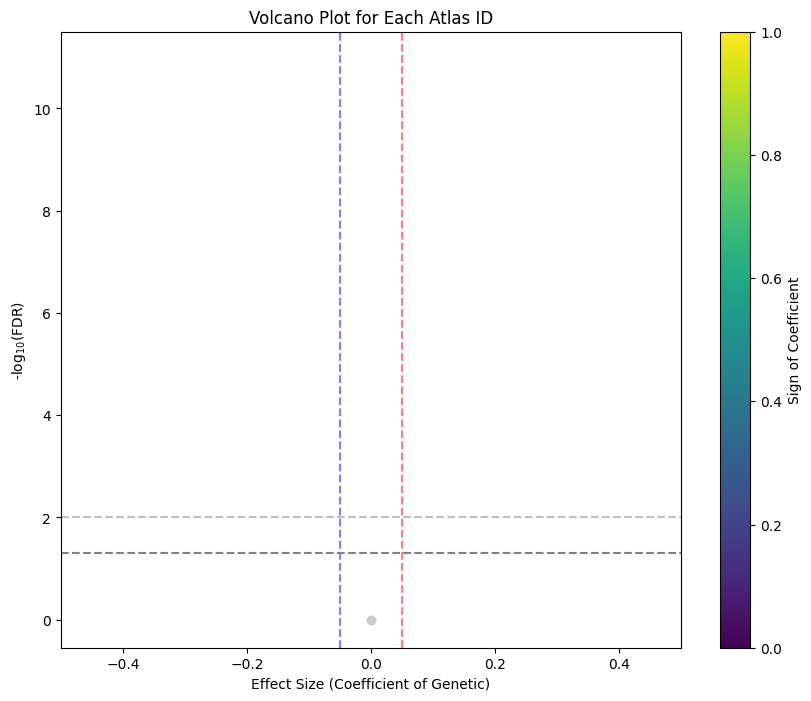

In [106]:
import os
import pandas as pd
import numpy as np
import statsmodels.api as sm
import statsmodels.formula.api as smf
import matplotlib.pyplot as plt
from statsmodels.stats.multitest import multipletests
import rpy2.robjects as robjects
import rpy2.robjects as ro
# Rのインスタンスを取得
r = robjects.r
from rpy2.robjects import pandas2ri
pandas2ri.activate()
# Rのライブラリをロード
r = robjects.r
r('library(MASS)')
import numpy as np
import rpy2.robjects as robjects
# Rのインスタンスを取得
r = robjects.r
from rpy2.robjects import pandas2ri
pandas2ri.activate()
# Rのライブラリをロード
r = robjects.r
r('library(MASS)')

def run_glm (data):
    try:
        # R環境にデータフレームを渡す
        ro.globalenv['data'] = pandas2ri.py2rpy(data)
        # pdfClusterを実行
        r_code = '''
        library(MASS)
        model <- glm.nb('log_All_cell_count ~ Age', data = data)
        coef <- summary(model)$coefficients["Age", "Estimate"]
        p_value <- summary(model)$coefficients["Age", "Pr(>|z|)"]
        c(coef, p_value)
        '''
        #results_ <- summary(model)
        #results_ <- summary(model)
        #p_value <- summary(model)$Coefficients["Genetic", "Pr(>|z|)"]
        #coef <- summary(model)$Coefficients["Genetic", "coef"]
        ro.r(r_code)

        results = ro.r(r_code)

        coef = results[0]
        p_value = results[1]
        print(f"Coefficient: {coef}, p-value: {p_value}")
    except:
        coef, p_value = 0.0, 1.0
        print(f"Coefficient: {coef}, p-value: {p_value}")
    return coef, p_value

def run_linear_regression(data):
    # R環境にデータフレームを渡す
    ro.globalenv['data'] = pandas2ri.py2rpy(data)
    # lmを実行
    r_code = '''
    library(stats)  # lm() 関数を使うために必要
    model <- lm(log_All_cell_count ~ Age, data = data)
    coef <- summary(model)$coefficients["Age", "Estimate"]
    p_value <- summary(model)$coefficients["Age", "Pr(>|t|)"]
    c(coef, p_value)
    '''
    results = ro.r(r_code)
    
    coef = results[0]
    p_value = results[1]
    print(f"Coefficient: {coef}, p-value: {p_value}")
    
    return coef, p_value

# サンプルごとにデータを読み込んで 'Condition' 列を追加する関数を修正
def load_data(sample_info):
    df_list = []
    for sample, condition in sample_info:  # sample_infoには(sample_path, condition)のタプルが格納されている
        param_path = f"/data4/ds1_Imaging3/Abeta/{sample}/Regional_Abeta_cellome_4.csv" #Regional_Abeta_cellome_1.csv" #f"/home/mitani/CUBIC-informatics/param/Neuronomics/{sample}/param_multichannel-rank.json"
        try:

            cellome_file = param_path
            if os.path.exists(cellome_file):  # 確認するファイルパスに注意
                print(sample)
                df = pd.read_csv(cellome_file)
                df['Condition'] = condition  # 'Condition' 列を追加
                df['Sample'] = sample  # サンプル名を追加
                df_list.append(df)
        except Exception as e:
            print(f"Error loading data for {sample}: {e}")

    return pd.concat(df_list, ignore_index=True) if df_list else pd.DataFrame()

# Healthy controlとDiseaseのサンプル情報のタプルを取得
#healthy_sample_info = [(s, c) for c in ["WT_1m", "WT_3m","WT_5m", "WT_7m", "WT_9m"] for s in conditions[c]]
disease_sample_info = [(s, c) for c in ["APP_1m", "APP_3m", "APP_5m", "APP_7m", "APP_9m"] for s in conditions[c]]
#healthy_sample_info = [(s, c) for c in ["WT_7m", "WT_9m"] for s in conditions[c]]
#disease_sample_info = [(s, c) for c in [  "APP_7m", "APP_9m"] for s in conditions[c]]

# データを読み込む
#healthy_data = load_data(healthy_sample_info)
disease_data = load_data(disease_sample_info)

# AgeとGeneticの列を追加
#healthy_data['Age'] = healthy_data['Condition'].str.extract('(\d+)m').astype(int)
#healthy_data['Genetic'] = 0  # Healthyは0
disease_data['Age'] = disease_data['Condition'].str.extract('(\d+)m').astype(int)
disease_data['Genetic'] = 1  # Diseaseは1


def normalize_and_calculate_difference(data):
    # atlasIDごとにループ
    for atlas_id in data['atlasID'].unique():
        # 各年齢、各ジェネティックタイプに対して正規化を実行
        for age in data['Age'].unique():
            avg_ctr = data[(data['atlasID'] == atlas_id) & (data['Genetic'] == 0) & (data['Age'] == age)]['NeuN+ density (/mm3)'].mean()
            
            data.loc[(data['atlasID'] == atlas_id) & (data['Age'] == age) & (data['Genetic'] == 0), 'Normalized'] = data[(data['atlasID'] == atlas_id) & (data['Age'] == age) & (data['Genetic'] == 0)]['NeuN+ density (/mm3)'] - avg_ctr 
            data.loc[(data['atlasID'] == atlas_id) & (data['Age'] == age) & (data['Genetic'] == 1), 'Normalized'] = data[(data['atlasID'] == atlas_id) & (data['Age'] == age) & (data['Genetic'] == 1)]['NeuN+ density (/mm3)'] - avg_ctr
        #mini = data.loc[(data['atlasID'] == atlas_id), 'Normalized'].min()
        #data.loc[(data['atlasID'] == atlas_id),'Normalized'] = data.loc[(data['atlasID'] == atlas_id),'Normalized'].copy() - mini
    return data

# データを結合
#all_data = pd.concat([healthy_data, disease_data])
all_data = disease_data

#all_data = normalize_and_calculate_difference(all_data)
all_data['log_All_cell_count'] = 0
# 全サンプルにわたるAgeの平均を計算
#mean_age = all_data['Age'].mean()
#print(mean_age)
#all_data["Age"] = all_data["Age"] - mean_age

# 線形回帰モデルの作成
results = {}
for atlas_id in all_data['atlasID'].unique():
    print(atlas_id)
    data = all_data[all_data['atlasID'] == atlas_id]
    
    # Abeta_density がゼロではないデータのみを選択
    #data_min = data['Abeta_density (/mm3)'][data['Abeta_density (/mm3)'] > 0].min()
    #data['Abeta_density (/mm3)'][data['Abeta_density (/mm3)'] > 0] = data['Abeta_density (/mm3)'][data['Abeta_density (/mm3)'] > 0] - data_min
    # ヒストグラムをプロット
    
    #plt.figure(figsize=(10, 6))
    #plt.hist(data['Abeta_density (/mm3)'], bins=30, color='blue', alpha=0.7)  # binsの数はデータに応じて調整可能
    #plt.title('Histogram of Abeta_density (/mm3)')
    #plt.xlabel('Abeta_density (/mm3)')
    #plt.ylabel('Frequency')
    #plt.grid(True)
    #plt.show()
    
    data['log_All_cell_count'] = np.round(data['Abeta_density (/mm3)']*1000)
    data = data.dropna(subset=['log_All_cell_count'])
    
    all_data['log_All_cell_count'][all_data['atlasID'] == atlas_id] = data['log_All_cell_count'].copy()
    if data['log_All_cell_count'].sum() <= 0.0:
        results[atlas_id] = [0.0, 1.0]
        print(f"No non-zero data available for atlas ID {atlas_id}. Skipping...")
        continue
    results[atlas_id] = run_linear_regression(data)

volcano_data = pd.DataFrame({
    'AtlasID': list(results.keys()),
    'coef': [result[0] for result in results.values()],
    'pvalue': [result[1] for result in results.values()]

})

# BH法による多重検定補正
volcano_data['pvalue'][volcano_data['pvalue'] == 0.0] = 1.0
_, p_adjusted, _, _ = multipletests(volcano_data['pvalue'], method='fdr_bh')

# 補正後のp-valueをデータフレームに追加
volcano_data['adjusted_pvalue'] =  p_adjusted
volcano_data['-log10(adjusted_pvalue)'] = -np.log10(volcano_data['adjusted_pvalue'])

# ID を基準にして volcano_data に RGB 値をマージ
volcano_data = pd.merge(volcano_data, data_GO[['id', 'R', 'G', 'B']], left_on='AtlasID', right_on='id', how='left')

# RGB 値を正規化
volcano_data['color'] = volcano_data.apply(lambda row: (row['R']/255, row['G']/255, row['B']/255), axis=1)

#volcano_data['log2(coef)'] = np.log2(volcano_data['coef'])

###########################

plt.rcParams['font.family'] = 'Arial'
plt.rcParams['font.size'] = 10  # Adjust the size as needed

# ボルカノプロットの描画
plt.figure(figsize=(10, 8))
for _, row in volcano_data.iterrows():
    plt.scatter(row['coef'], row['-log10(adjusted_pvalue)'], color=row['color'])

plt.xlabel("Effect Size (Coefficient of Genetic)")
plt.ylabel(r'-$\log_{10}$(FDR)')  # LaTeX形式で下付き文字を使用
plt.title('Volcano Plot for Each Atlas ID')
plt.xlim(-0.5,0.5)
#plt.ylim(-0.5,10)
plt.axvline(x=-0.05, color='blue', linestyle='--', alpha = 0.5)
plt.axvline(x=0.05, color='red', linestyle='--', alpha = 0.5)
plt.axhline(y=-np.log10(0.05), color='grey', linestyle='--', alpha = 1.0)
plt.axhline(y=-np.log10(0.01), color='grey', linestyle='--', alpha = 0.5)
plt.colorbar(label='Sign of Coefficient')
plt.show()    


In [12]:
data

,atlasID,Abeta_count,Abeta_volume,id,Total_volume (mm3),Abeta_density (/mm3),Condition,Sample,Age,Genetic,log_All_cell_count
670,164,1,0.000,164,0.00048,0.000000e+00,APP_1m,#4_APPmodel_Abeta_APP1m_1,1,1,0.000000e+00
1341,164,1,0.000,164,0.00048,0.000000e+00,APP_1m,#4_APPmodel_Abeta_APP1m_2,1,1,0.000000e+00
2012,164,1,0.000,164,0.00048,0.000000e+00,APP_1m,#4_APPmodel_Abeta_APP1m_3,1,1,0.000000e+00
2683,164,1,0.000,164,0.00048,0.000000e+00,APP_1m,#4_APPmodel_Abeta_APP1m_4,1,1,0.000000e+00
3354,164,1,0.000,164,0.00048,0.000000e+00,APP_3m,#4_APPmodel_Abeta_APP3m_1,3,1,0.000000e+00
4025,164,1,0.000,164,0.00048,0.000000e+00,APP_3m,#4_APPmodel_Abeta_APP3m_2,3,1,0.000000e+00
4696,164,1,0.000,164,0.00048,0.000000e+00,APP_3m,#4_APPmodel_Abeta_APP3m_3,3,1,0.000000e+00
5367,164,1,9259.259,164,0.00048,1.929012e+07,APP_3m,#4_APPmodel_Abeta_APP3m_4,3,1,1.929012e+10
6038,164,1,0.000,164,0.00048,0.000000e+00,APP_5m,#4_APPmodel_Abeta_APP5m_1,5,1,0.000000e+00
6709,164,1,0.000,164,0.00048,0.000000e+00,APP_5m,#4_APPmodel_Abeta_APP5m_2,5,1,0.000000e+00


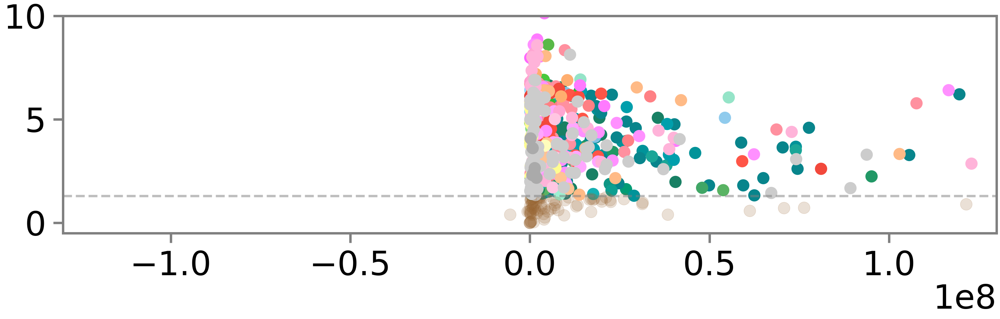

In [86]:
#volcano_data['log2(coef)'] = np.log2(volcano_data['coef'])

###########################
import matplotlib
matplotlib.rcParams['pdf.use14corefonts'] = True

plt.rcParams['font.family'] = 'DejaVu Sans'
plt.rcParams['font.size'] = 70  # Adjust the size as needed
 

# ボルカノプロットの描画
plt.figure(figsize=(30, 7))

for _, row in volcano_data.iterrows(): 
    plt.scatter(row['coef'], row['-log10(adjusted_pvalue)'], 
                color=row['color'] if row['-log10(adjusted_pvalue)'] > -np.log10(0.05) else (0.6, 0.4, 0.2), 
                alpha = 1 if row['-log10(adjusted_pvalue)'] > -np.log10(0.05) else 0.2, 
                s = 600)

#plt.xlabel("Effect Size (Coefficient of Genetic)")
#plt.ylabel(r'-$\log_{10}$(FDR)')  # LaTeX形式で下付き文字を使用
#plt.title('Volcano Plot for Each Region')
# y軸をログスケールに設定
plt.xlim(-0.13*1000000000, 0.13*1000000000)

plt.ylim(-0.5, 10.0)
#plt.axvline(x=-0.05, color='blue', linestyle='--', alpha = 0.5)
#plt.axvline(x=0.05, color='red', linestyle='--', alpha = 0.5)
plt.axhline(y=-np.log10(0.05), color='grey', linestyle='--', alpha = 0.5, linewidth = 5)
#plt.axhline(y=-np.log10(0.01), color='grey', linestyle='--', alpha = 0.2)
#plt.colorbar(label='Sign of Coefficient')

# 枠線の色と太さの設定
alpha = 1.0  # 例としてalphaを0.5に設定
for spine in plt.gca().spines.values():
    spine.set_linewidth(5)
    spine.set_color((0.5, 0.5, 0.5, alpha))  # RGBA形式で色を指定
    
# 目盛りを外側に設定し、色をブラックに設定、目盛りラベルのパディングと太字設定
#plt.tick_params(axis='both', which='both', direction='out', length=20, width=5, colors='grey', pad=25)
plt.tick_params(axis='both', which='both', direction='out', length=20, width=5, colors='grey', pad=15, labelcolor='black')

# x軸とy軸の目盛りの位置を設定して数を半分にする
plt.gca().set_xticks(np.linspace(-0.10*1000000000, 0.10*1000000000, 5))  # 7個の目盛り
plt.gca().set_yticks(np.linspace(0, 10, 3).astype(int))  # 6個の目盛り

# 目盛りラベルを取得して太字に設定
#for tick in plt.gca().get_xticklabels():
#    tick.set_fontweight('bold')
#for tick in plt.gca().get_yticklabels():
#    tick.set_fontweight('bold')
    
    
# レイアウトを調整してから保存
plt.tight_layout()
plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05)
    
# 透明な背景で保存
plt.savefig('/data5/mitani/Neurology/Fig.3/APP_1m_9m_Abeta_volcano_with_limit_FDR_10_coef_0.6.pdf', 
            transparent=True, dpi=300, bbox_inches='tight', pad_inches=0.1)

In [87]:
significant_region_ids_0 = volcano_data[(volcano_data["adjusted_pvalue"]<0.05)&(volcano_data["coef"]>0.0)]
significant_region_ids_0 = significant_region_ids_0["AtlasID"]
significant_region_ids_1 = volcano_data[(volcano_data["adjusted_pvalue"]<0.05)&(volcano_data["coef"]<0.0)]
significant_region_ids_1 = significant_region_ids_1["AtlasID"]

In [88]:
volcano_data

,AtlasID,coef,pvalue,adjusted_pvalue,-log10(adjusted_pvalue),id,R,G,B,color
0,997,2.546388e+03,4.505032e-07,0.000002,5.659459,997,255,255,255,"(1.0, 1.0, 1.0)"
1,68,5.479740e+05,5.151184e-03,0.006673,2.175700,68,38,143,69,"(0.14901960784313725, 0.5607843137254902, 0.27..."
2,667,2.151330e+06,5.053437e-02,0.056989,1.244208,667,38,143,69,"(0.14901960784313725, 0.5607843137254902, 0.27..."
3,52192,2.921875e+06,4.572458e-02,0.051914,1.284715,52192,38,143,69,"(0.14901960784313725, 0.5607843137254902, 0.27..."
4,52196,4.089293e+06,5.345598e-01,0.542647,0.265483,52196,38,143,69,"(0.14901960784313725, 0.5607843137254902, 0.27..."
...,...,...,...,...,...,...,...,...,...,...
666,129,6.479275e+05,3.590862e-03,0.004790,2.319647,129,170,170,170,"(0.6666666666666666, 0.6666666666666666, 0.666..."
667,140,1.165155e+06,2.401779e-03,0.003347,2.475304,140,170,170,170,"(0.6666666666666666, 0.6666666666666666, 0.666..."
668,145,1.757598e+05,3.171007e-01,0.326341,0.486328,145,170,170,170,"(0.6666666666666666, 0.6666666666666666, 0.666..."
669,153,1.311845e+06,1.553156e-03,0.002230,2.651733,153,170,170,170,"(0.6666666666666666, 0.6666666666666666, 0.666..."


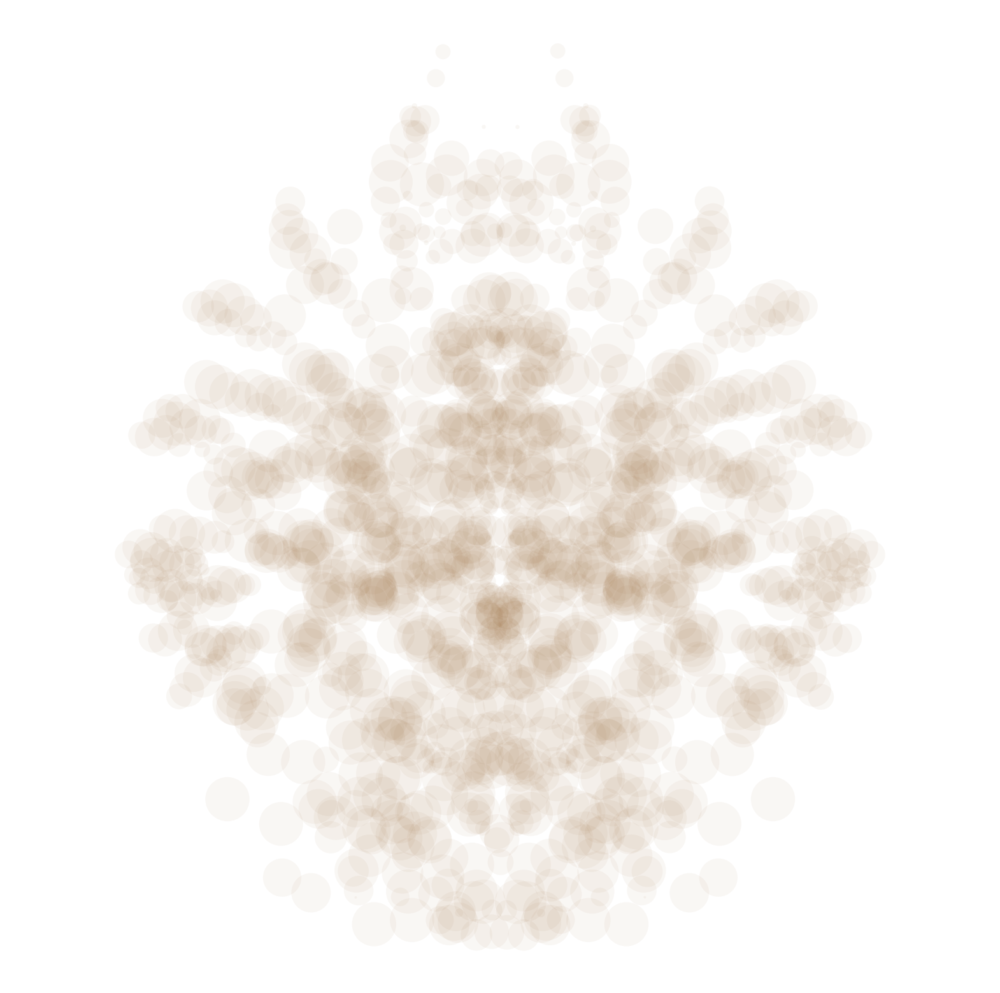

In [79]:
import matplotlib.pyplot as plt
import pandas as pd
from adjustText import adjust_text  # adjustText ライブラリをインポート

import matplotlib
matplotlib.rcParams['pdf.use14corefonts'] = True
# volcano_dataをインデックス化
# マッピングの前に、型が一致していることを確認（必要に応じて型変換）
#all_centroids['atlasID'] = all_centroids['atlasID'].astype(volcano_indexed.index.dtype)

# all_centroidsに -log10(adjusted_pvalue), coef, およびacronymsをマッピング
all_centroids['adjusted_pvalue'] = all_centroids['atlasID'].map(volcano_data.set_index('AtlasID')['adjusted_pvalue'])
all_centroids['-log10(adjusted_pvalue)'] = all_centroids['atlasID'].map(volcano_data.set_index('AtlasID')['-log10(adjusted_pvalue)'])
all_centroids['coef'] = all_centroids['atlasID'].map(volcano_data.set_index('AtlasID')['coef'])
all_centroids['acronym'] = all_centroids['atlasID'].map(data_id.set_index('id')['acronym'])

# 条件に合致し、adjusted_pvalueが最小の上位5つを抽出
top_acronyms = all_centroids[(all_centroids['adjusted_pvalue'] < 0.05) & (all_centroids['coef'] < 0.0)]
top_acronyms = top_acronyms.nsmallest(10, 'adjusted_pvalue')

# グラフのプロット
plt.figure(figsize=(20, 20))
plt.gca().invert_yaxis()
texts = []  # テキストオブジェクトを保存するリスト

plt.rcParams['font.family'] = 'DejaVu Sans'
plt.rcParams['font.size'] = 10


# adjusted p value limit is 0.00001. -log10(adjusted_pvalue) < 5
for i, row in all_centroids.iterrows():
    color = row['color'] if row['adjusted_pvalue'] < 0.05 and row['coef'] < 0.0 else (0.6, 0.4, 0.2)
    alpha = 0.9 if row['adjusted_pvalue'] < 0.05 and row['coef'] < 0.0 else 0.05
    plt.scatter(row['X(um)'], row['Y(um)'],
                s=500 * row['-log10(adjusted_pvalue)'] if 500 * row['-log10(adjusted_pvalue)'] < 500 * 5 else 500 * 5,
                color=color, alpha=alpha, edgecolor='none')
    
    # 上位5位の点のみにテキストを追加（`atlasID` を使用して比較）
    if row['atlasID'] in top_acronyms['atlasID'].values:
        texts.append(plt.text(row['X(um)'], row['Y(um)'], row['acronym'],
                              ha='center', va='center', fontsize=55, color="black", fontweight='regular'))

# 調整されたテキストに対してadjust_textを適用し、アローをグレーで追加
#adjust_text(texts, 
#            arrowprops=dict(arrowstyle='-', color=(0, 0, 0), alpha = 0.5, linewidth=2),
#            #expand_points=(1., 1.),  # ポイントからの距離を広げる
            #expand_text=(1., 1.),    # テキスト間の距離を広げる
            #force_text=(1., 1.),     # テキストを動かす力を強める
            #force_points=(1., 1.)   # ポイントを動かす力を強める
            
#            expand_points=(1.3, 1.3),  # ポイントからの距離を広げる
#            expand_text=(1., 1.),    # テキスト間の距離を広げる
#            force_text=(1., 1.),     # テキストを動かす力を強める
#            force_points=(1., 1.)   # ポイントを動かす力を強める
#           )

#plt.title('Whole brain plot of 2nd batch VCP-WT vs VCP-mutant Microglia increase')
#plt.xlabel('X (um)')
#plt.ylabel('Y (um)')
plt.axis('equal')

plt.gca().spines['top'].set_visible(False)  # 上の軸線を非表示
plt.gca().spines['right'].set_visible(False)  # 右の軸線を非表示
plt.gca().spines['left'].set_visible(False)  # 左の軸線を非表示
plt.gca().spines['bottom'].set_visible(False)  # 下の軸線を非表示
plt.xticks([])  # X軸の目盛りを非表示
plt.yticks([])  # Y軸の目盛りを非表示

plt.savefig('/data5/mitani/Neurology/Fig.3/APP_1m_9m_Abeta_decrease_with_limit_FDR_5.pdf', 
            transparent=True, dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()

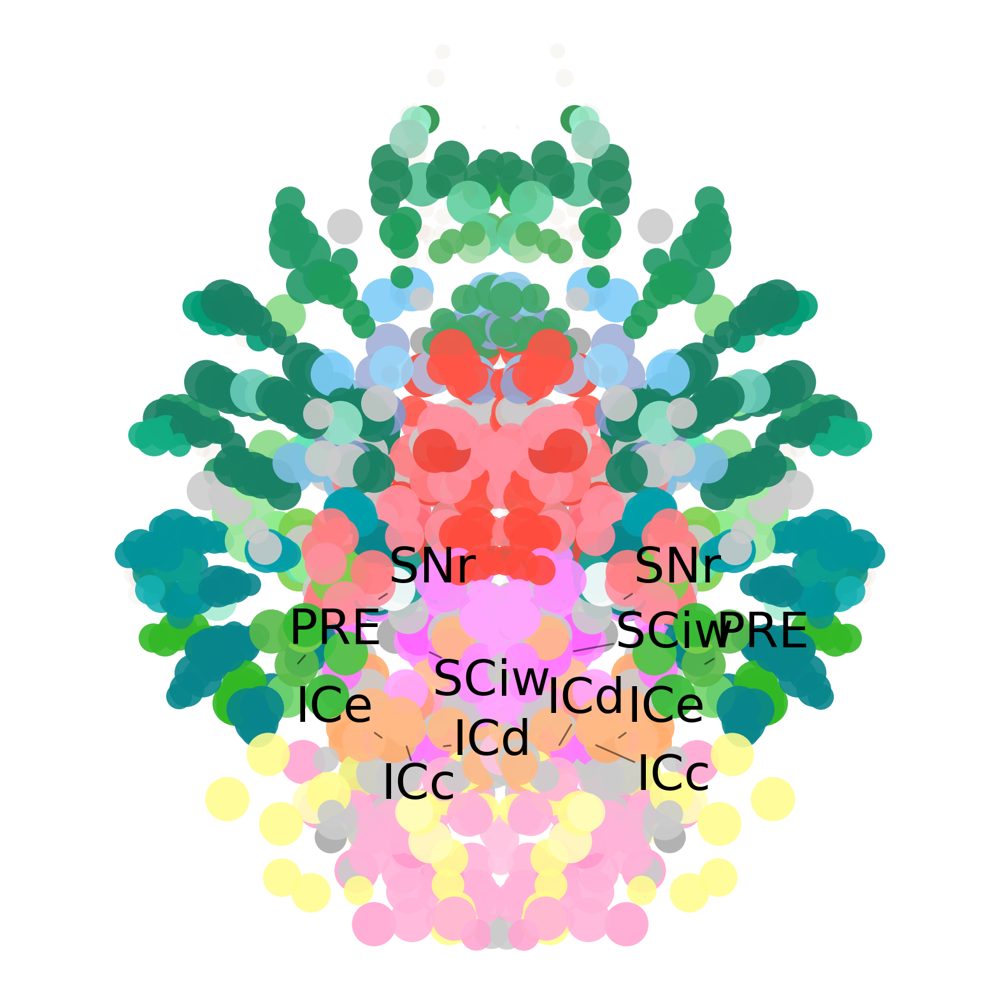

In [104]:
import matplotlib.pyplot as plt
import pandas as pd
from adjustText import adjust_text  # adjustText ライブラリをインポート

import matplotlib
matplotlib.rcParams['pdf.use14corefonts'] = True
# volcano_dataをインデックス化
# マッピングの前に、型が一致していることを確認（必要に応じて型変換）
#all_centroids['atlasID'] = all_centroids['atlasID'].astype(volcano_indexed.index.dtype)

# all_centroidsに -log10(adjusted_pvalue), coef, およびacronymsをマッピング
all_centroids['adjusted_pvalue'] = all_centroids['atlasID'].map(volcano_data.set_index('AtlasID')['adjusted_pvalue'])
all_centroids['-log10(adjusted_pvalue)'] = all_centroids['atlasID'].map(volcano_data.set_index('AtlasID')['-log10(adjusted_pvalue)'])
all_centroids['coef'] = all_centroids['atlasID'].map(volcano_data.set_index('AtlasID')['coef'])
all_centroids['acronym'] = all_centroids['atlasID'].map(data_id.set_index('id')['acronym'])

# 条件に合致し、adjusted_pvalueが最小の上位5つを抽出
top_acronyms = all_centroids[(all_centroids['adjusted_pvalue'] < 0.05) & (all_centroids['coef'] > 0.0)]
top_acronyms = top_acronyms.nsmallest(10, 'adjusted_pvalue')

# グラフのプロット
plt.figure(figsize=(20, 20))
plt.gca().invert_yaxis()
texts = []  # テキストオブジェクトを保存するリスト

plt.rcParams['font.family'] = 'DejaVu Sans'
plt.rcParams['font.size'] = 10


# adjusted p value limit is 0.00001. -log10(adjusted_pvalue) < 5
for i, row in all_centroids.iterrows():
    color = row['color'] if row['adjusted_pvalue'] < 0.05 and row['coef'] > 0.0 else (0.6, 0.4, 0.2)
    alpha = 0.9 if row['adjusted_pvalue'] < 0.05 and row['coef'] > 0.0 else 0.05
    plt.scatter(row['X(um)'], row['Y(um)'],
                s=500 * row['-log10(adjusted_pvalue)'] if 500 * row['-log10(adjusted_pvalue)'] < 500 * 5 else 500 * 5,
                color=color, alpha=alpha, edgecolor='none')
    
    # 上位5位の点のみにテキストを追加（`atlasID` を使用して比較）
    if row['atlasID'] in top_acronyms['atlasID'].values:
        texts.append(plt.text(row['X(um)'], row['Y(um)'], row['acronym'],
                              ha='center', va='center', fontsize=55, color="black", fontweight='regular'))

# 調整されたテキストに対してadjust_textを適用し、アローをグレーで追加
adjust_text(texts, 
            arrowprops=dict(arrowstyle='-', color=(0, 0, 0), alpha = 0.5, linewidth=2),
            #expand_points=(1., 1.),  # ポイントからの距離を広げる
            #expand_text=(1., 1.),    # テキスト間の距離を広げる
            #force_text=(1., 1.),     # テキストを動かす力を強める
            #force_points=(1., 1.)   # ポイントを動かす力を強める
            
            expand_points=(1.3, 1.3),  # ポイントからの距離を広げる
            expand_text=(1., 1.),    # テキスト間の距離を広げる
            force_text=(1., 1.),     # テキストを動かす力を強める
            force_points=(1., 1.)   # ポイントを動かす力を強める
           )

#plt.title('Whole brain plot of 2nd batch VCP-WT vs VCP-mutant Microglia increase')
#plt.xlabel('X (um)')
#plt.ylabel('Y (um)')
plt.axis('equal')

plt.gca().spines['top'].set_visible(False)  # 上の軸線を非表示
plt.gca().spines['right'].set_visible(False)  # 右の軸線を非表示
plt.gca().spines['left'].set_visible(False)  # 左の軸線を非表示
plt.gca().spines['bottom'].set_visible(False)  # 下の軸線を非表示
plt.xticks([])  # X軸の目盛りを非表示
plt.yticks([])  # Y軸の目盛りを非表示

plt.savefig('/data5/mitani/Neurology/Fig.3/APP_1m_9m_Abeta_increase_with_limit_FDR_5.pdf', 
            transparent=True, dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()

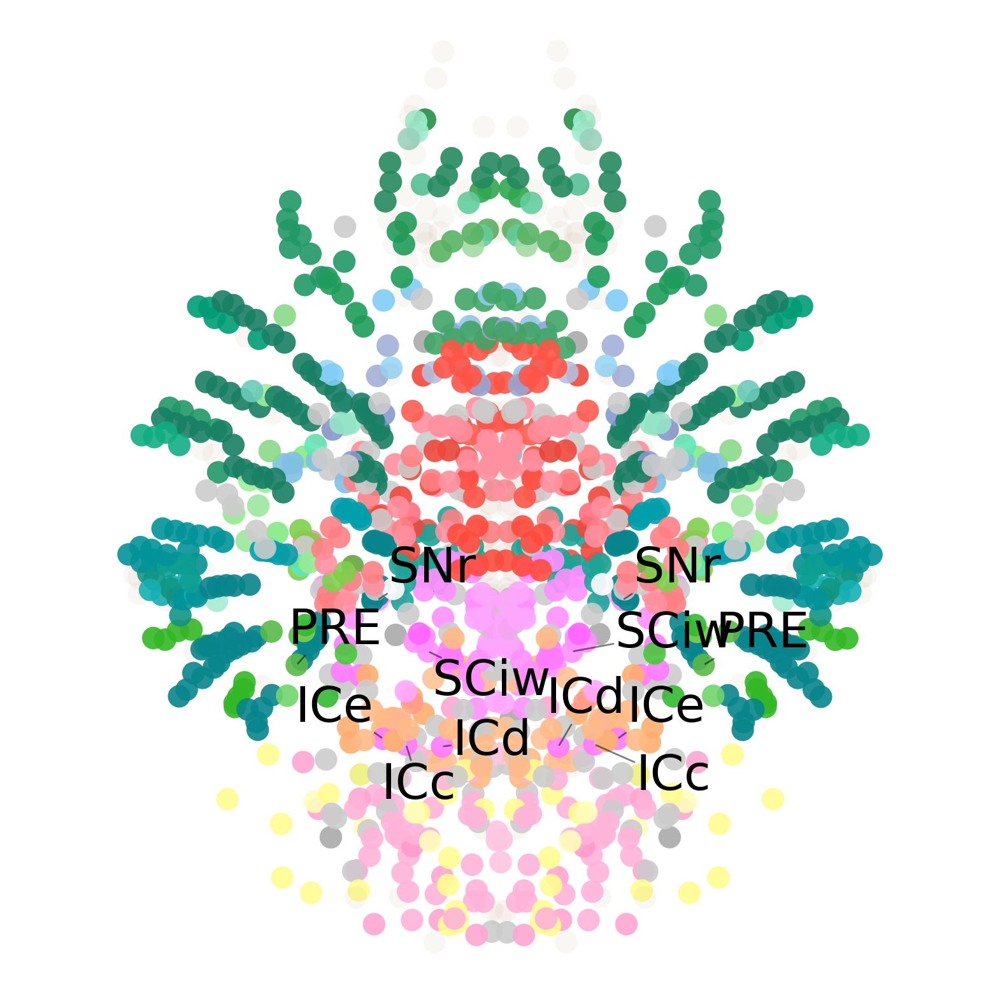

In [94]:
import matplotlib.pyplot as plt
import pandas as pd
from adjustText import adjust_text  # adjustText ライブラリをインポート

import matplotlib
matplotlib.rcParams['pdf.use14corefonts'] = True
# volcano_dataをインデックス化
# マッピングの前に、型が一致していることを確認（必要に応じて型変換）
#all_centroids['atlasID'] = all_centroids['atlasID'].astype(volcano_indexed.index.dtype)

# all_centroidsに -log10(adjusted_pvalue), coef, およびacronymsをマッピング
all_centroids['adjusted_pvalue'] = all_centroids['atlasID'].map(volcano_data.set_index('AtlasID')['adjusted_pvalue'])
all_centroids['-log10(adjusted_pvalue)'] = all_centroids['atlasID'].map(volcano_data.set_index('AtlasID')['-log10(adjusted_pvalue)'])
all_centroids['coef'] = all_centroids['atlasID'].map(volcano_data.set_index('AtlasID')['coef'])
all_centroids['acronym'] = all_centroids['atlasID'].map(data_id.set_index('id')['acronym'])

# 条件に合致し、adjusted_pvalueが最小の上位5つを抽出
top_acronyms = all_centroids[(all_centroids['adjusted_pvalue'] < 0.05) & (all_centroids['coef'] > 0.0)]
top_acronyms = top_acronyms.nsmallest(10, 'adjusted_pvalue')

# グラフのプロット
plt.figure(figsize=(20, 20))
plt.gca().invert_yaxis()
texts = []  # テキストオブジェクトを保存するリスト

plt.rcParams['font.family'] = 'DejaVu Sans'
plt.rcParams['font.size'] = 10


# adjusted p value limit is 0.00001. -log10(adjusted_pvalue) < 5
for i, row in all_centroids.iterrows():
    color = row['color'] if row['adjusted_pvalue'] < 0.05 and row['coef'] > 0.0 else (0.6, 0.4, 0.2)
    alpha = 0.9 if row['adjusted_pvalue'] < 0.05 and row['coef'] > 0.0 else 0.05
    
    row['-log10(adjusted_pvalue)'] =  -np.log10(0.05)
    
    plt.scatter(row['X(um)'], row['Y(um)'],
                s=500 * row['-log10(adjusted_pvalue)'] if 500 * row['-log10(adjusted_pvalue)'] < 500 * 5 else 500 * 5,
                color=color, alpha=alpha, edgecolor='none')
    
    # 上位5位の点のみにテキストを追加（`atlasID` を使用して比較）
    if row['atlasID'] in top_acronyms['atlasID'].values:
        texts.append(plt.text(row['X(um)'], row['Y(um)'], row['acronym'],
                              ha='center', va='center', fontsize=55, color="black", fontweight='regular'))

# 調整されたテキストに対してadjust_textを適用し、アローをグレーで追加
adjust_text(texts, 
            arrowprops=dict(arrowstyle='-', color=(0, 0, 0), alpha = 0.5, linewidth=2),
            #expand_points=(1., 1.),  # ポイントからの距離を広げる
            #expand_text=(1., 1.),    # テキスト間の距離を広げる
            #force_text=(1., 1.),     # テキストを動かす力を強める
            #force_points=(1., 1.)   # ポイントを動かす力を強める
            
            expand_points=(1.3, 1.3),  # ポイントからの距離を広げる
            expand_text=(1., 1.),    # テキスト間の距離を広げる
            force_text=(1., 1.),     # テキストを動かす力を強める
            force_points=(1., 1.)   # ポイントを動かす力を強める
           )

#plt.title('Whole brain plot of 2nd batch VCP-WT vs VCP-mutant Microglia increase')
#plt.xlabel('X (um)')
#plt.ylabel('Y (um)')
plt.axis('equal')

plt.gca().spines['top'].set_visible(False)  # 上の軸線を非表示
plt.gca().spines['right'].set_visible(False)  # 右の軸線を非表示
plt.gca().spines['left'].set_visible(False)  # 左の軸線を非表示
plt.gca().spines['bottom'].set_visible(False)  # 下の軸線を非表示
plt.xticks([])  # X軸の目盛りを非表示
plt.yticks([])  # Y軸の目盛りを非表示

plt.savefig('/data5/mitani/Neurology/Fig.3/APP_1m_9m_Abeta_increase_with_limit_FDR_5_p_value_0.05_standard.pdf', 
            transparent=True, dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()

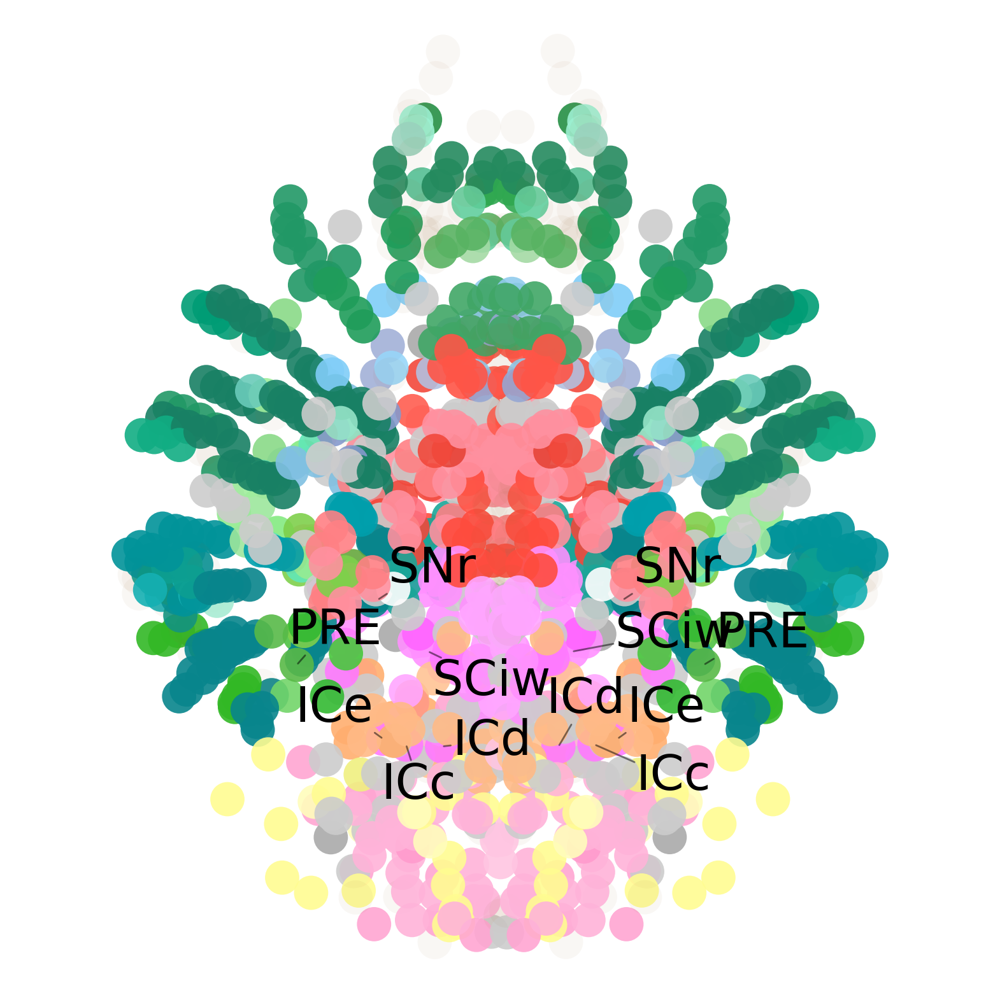

In [102]:
import matplotlib.pyplot as plt
import pandas as pd
from adjustText import adjust_text  # adjustText ライブラリをインポート

import matplotlib
matplotlib.rcParams['pdf.use14corefonts'] = True
# volcano_dataをインデックス化
# マッピングの前に、型が一致していることを確認（必要に応じて型変換）
#all_centroids['atlasID'] = all_centroids['atlasID'].astype(volcano_indexed.index.dtype)

# all_centroidsに -log10(adjusted_pvalue), coef, およびacronymsをマッピング
all_centroids['adjusted_pvalue'] = all_centroids['atlasID'].map(volcano_data.set_index('AtlasID')['adjusted_pvalue'])
all_centroids['-log10(adjusted_pvalue)'] = all_centroids['atlasID'].map(volcano_data.set_index('AtlasID')['-log10(adjusted_pvalue)'])
all_centroids['coef'] = all_centroids['atlasID'].map(volcano_data.set_index('AtlasID')['coef'])
all_centroids['acronym'] = all_centroids['atlasID'].map(data_id.set_index('id')['acronym'])

# 条件に合致し、adjusted_pvalueが最小の上位5つを抽出
top_acronyms = all_centroids[(all_centroids['adjusted_pvalue'] < 0.05) & (all_centroids['coef'] > 0.0)]
top_acronyms = top_acronyms.nsmallest(10, 'adjusted_pvalue')

# グラフのプロット
plt.figure(figsize=(20, 20))
plt.gca().invert_yaxis()
texts = []  # テキストオブジェクトを保存するリスト

plt.rcParams['font.family'] = 'DejaVu Sans'
plt.rcParams['font.size'] = 10


# adjusted p value limit is 0.00001. -log10(adjusted_pvalue) < 5
for i, row in all_centroids.iterrows():
    color = row['color'] if row['adjusted_pvalue'] < 0.05 and row['coef'] > 0.0 else (0.6, 0.4, 0.2)
    alpha = 0.9 if row['adjusted_pvalue'] < 0.05 and row['coef'] > 0.0 else 0.05
    
    row['-log10(adjusted_pvalue)'] =  -np.log10(0.001)
    
    plt.scatter(row['X(um)'], row['Y(um)'],
                s=500 * row['-log10(adjusted_pvalue)'] if 500 * row['-log10(adjusted_pvalue)'] < 500 * 5 else 500 * 5,
                color=color, alpha=alpha, edgecolor='none')
    
    # 上位5位の点のみにテキストを追加（`atlasID` を使用して比較）
    if row['atlasID'] in top_acronyms['atlasID'].values:
        texts.append(plt.text(row['X(um)'], row['Y(um)'], row['acronym'],
                              ha='center', va='center', fontsize=55, color="black", fontweight='regular'))

# 調整されたテキストに対してadjust_textを適用し、アローをグレーで追加
adjust_text(texts, 
            arrowprops=dict(arrowstyle='-', color=(0, 0, 0), alpha = 0.5, linewidth=2),
            #expand_points=(1., 1.),  # ポイントからの距離を広げる
            #expand_text=(1., 1.),    # テキスト間の距離を広げる
            #force_text=(1., 1.),     # テキストを動かす力を強める
            #force_points=(1., 1.)   # ポイントを動かす力を強める
            
            expand_points=(1.3, 1.3),  # ポイントからの距離を広げる
            expand_text=(1., 1.),    # テキスト間の距離を広げる
            force_text=(1., 1.),     # テキストを動かす力を強める
            force_points=(1., 1.)   # ポイントを動かす力を強める
           )

#plt.title('Whole brain plot of 2nd batch VCP-WT vs VCP-mutant Microglia increase')
#plt.xlabel('X (um)')
#plt.ylabel('Y (um)')
plt.axis('equal')

plt.gca().spines['top'].set_visible(False)  # 上の軸線を非表示
plt.gca().spines['right'].set_visible(False)  # 右の軸線を非表示
plt.gca().spines['left'].set_visible(False)  # 左の軸線を非表示
plt.gca().spines['bottom'].set_visible(False)  # 下の軸線を非表示
plt.xticks([])  # X軸の目盛りを非表示
plt.yticks([])  # Y軸の目盛りを非表示

plt.savefig('/data5/mitani/Neurology/Fig.3/APP_1m_9m_Abeta_increase_with_limit_FDR_5_p_value_0.001_standard.pdf', 
            transparent=True, dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()

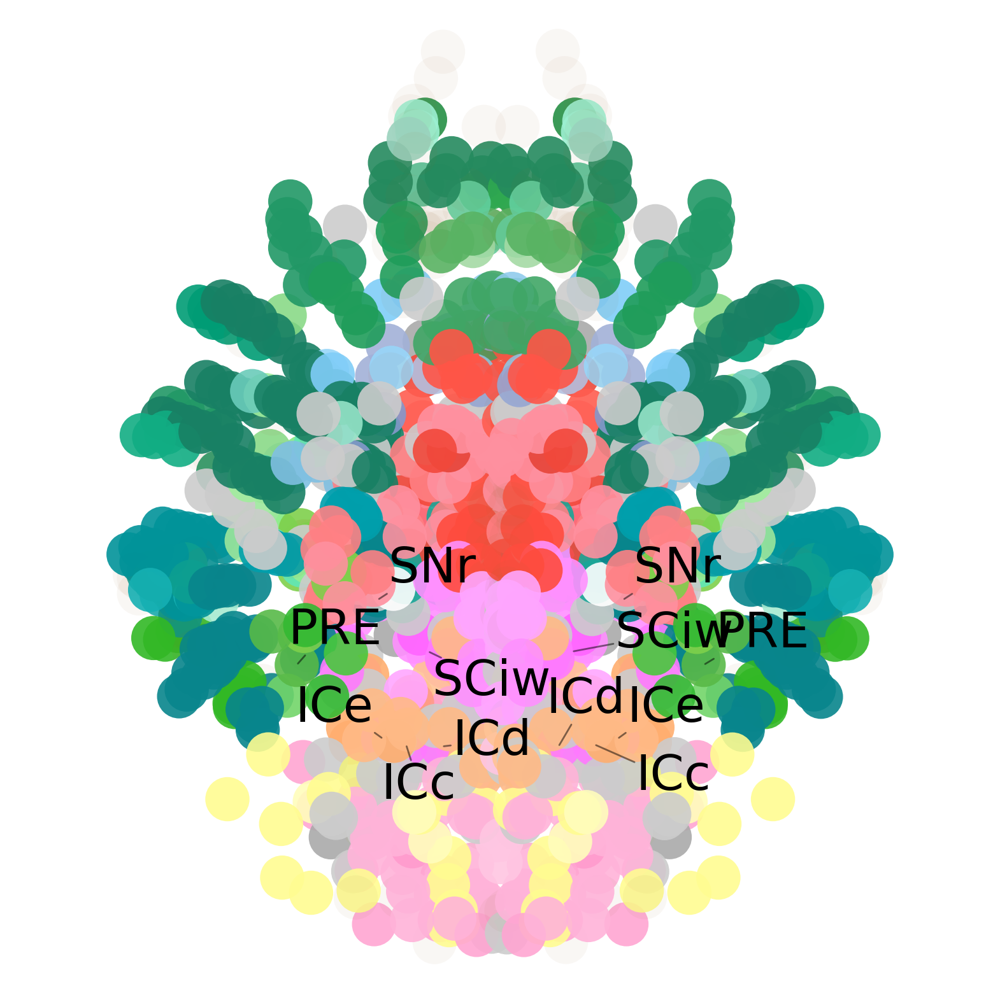

In [100]:
import matplotlib.pyplot as plt
import pandas as pd
from adjustText import adjust_text  # adjustText ライブラリをインポート

import matplotlib
matplotlib.rcParams['pdf.use14corefonts'] = True
# volcano_dataをインデックス化
# マッピングの前に、型が一致していることを確認（必要に応じて型変換）
#all_centroids['atlasID'] = all_centroids['atlasID'].astype(volcano_indexed.index.dtype)

# all_centroidsに -log10(adjusted_pvalue), coef, およびacronymsをマッピング
all_centroids['adjusted_pvalue'] = all_centroids['atlasID'].map(volcano_data.set_index('AtlasID')['adjusted_pvalue'])
all_centroids['-log10(adjusted_pvalue)'] = all_centroids['atlasID'].map(volcano_data.set_index('AtlasID')['-log10(adjusted_pvalue)'])
all_centroids['coef'] = all_centroids['atlasID'].map(volcano_data.set_index('AtlasID')['coef'])
all_centroids['acronym'] = all_centroids['atlasID'].map(data_id.set_index('id')['acronym'])

# 条件に合致し、adjusted_pvalueが最小の上位5つを抽出
top_acronyms = all_centroids[(all_centroids['adjusted_pvalue'] < 0.05) & (all_centroids['coef'] > 0.0)]
top_acronyms = top_acronyms.nsmallest(10, 'adjusted_pvalue')

# グラフのプロット
plt.figure(figsize=(20, 20))
plt.gca().invert_yaxis()
texts = []  # テキストオブジェクトを保存するリスト

plt.rcParams['font.family'] = 'DejaVu Sans'
plt.rcParams['font.size'] = 10


# adjusted p value limit is 0.00001. -log10(adjusted_pvalue) < 5
for i, row in all_centroids.iterrows():
    color = row['color'] if row['adjusted_pvalue'] < 0.05 and row['coef'] > 0.0 else (0.6, 0.4, 0.2)
    alpha = 0.9 if row['adjusted_pvalue'] < 0.05 and row['coef'] > 0.0 else 0.05
    
    row['-log10(adjusted_pvalue)'] =  -np.log10(0.00001)
    
    plt.scatter(row['X(um)'], row['Y(um)'],
                s=500 * row['-log10(adjusted_pvalue)'] if 500 * row['-log10(adjusted_pvalue)'] < 500 * 5 else 500 * 5,
                color=color, alpha=alpha, edgecolor='none')
    
    # 上位5位の点のみにテキストを追加（`atlasID` を使用して比較）
    if row['atlasID'] in top_acronyms['atlasID'].values:
        texts.append(plt.text(row['X(um)'], row['Y(um)'], row['acronym'],
                              ha='center', va='center', fontsize=55, color="black", fontweight='regular'))

# 調整されたテキストに対してadjust_textを適用し、アローをグレーで追加
adjust_text(texts, 
            arrowprops=dict(arrowstyle='-', color=(0, 0, 0), alpha = 0.5, linewidth=2),
            #expand_points=(1., 1.),  # ポイントからの距離を広げる
            #expand_text=(1., 1.),    # テキスト間の距離を広げる
            #force_text=(1., 1.),     # テキストを動かす力を強める
            #force_points=(1., 1.)   # ポイントを動かす力を強める
            
            expand_points=(1.3, 1.3),  # ポイントからの距離を広げる
            expand_text=(1., 1.),    # テキスト間の距離を広げる
            force_text=(1., 1.),     # テキストを動かす力を強める
            force_points=(1., 1.)   # ポイントを動かす力を強める
           )

#plt.title('Whole brain plot of 2nd batch VCP-WT vs VCP-mutant Microglia increase')
#plt.xlabel('X (um)')
#plt.ylabel('Y (um)')
plt.axis('equal')

plt.gca().spines['top'].set_visible(False)  # 上の軸線を非表示
plt.gca().spines['right'].set_visible(False)  # 右の軸線を非表示
plt.gca().spines['left'].set_visible(False)  # 左の軸線を非表示
plt.gca().spines['bottom'].set_visible(False)  # 下の軸線を非表示
plt.xticks([])  # X軸の目盛りを非表示
plt.yticks([])  # Y軸の目盛りを非表示

plt.savefig('/data5/mitani/Neurology/Fig.3/APP_1m_9m_Abeta_increase_with_limit_FDR_5_p_value_0.00001_standard.pdf', 
            transparent=True, dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()

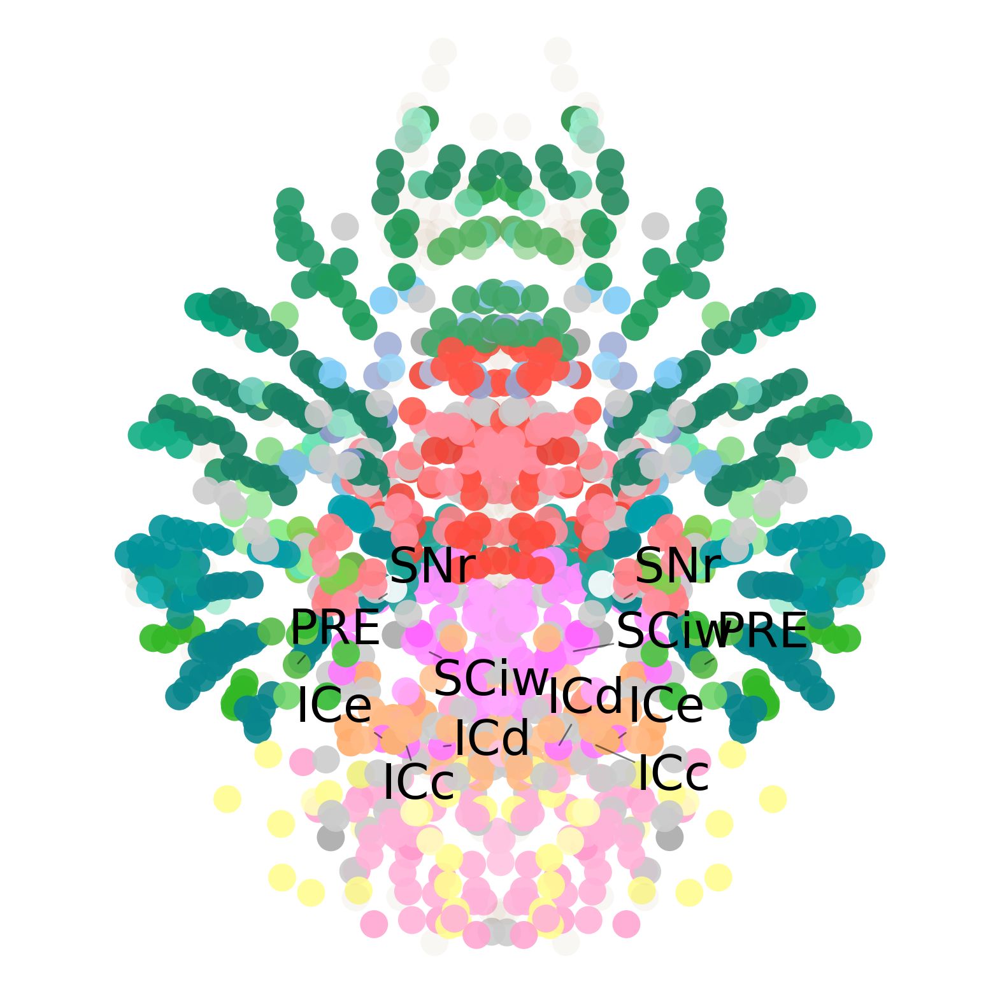

In [103]:
import matplotlib.pyplot as plt
import pandas as pd
from adjustText import adjust_text  # adjustText ライブラリをインポート

import matplotlib
matplotlib.rcParams['pdf.use14corefonts'] = True
# volcano_dataをインデックス化
# マッピングの前に、型が一致していることを確認（必要に応じて型変換）
#all_centroids['atlasID'] = all_centroids['atlasID'].astype(volcano_indexed.index.dtype)

# all_centroidsに -log10(adjusted_pvalue), coef, およびacronymsをマッピング
all_centroids['adjusted_pvalue'] = all_centroids['atlasID'].map(volcano_data.set_index('AtlasID')['adjusted_pvalue'])
all_centroids['-log10(adjusted_pvalue)'] = all_centroids['atlasID'].map(volcano_data.set_index('AtlasID')['-log10(adjusted_pvalue)'])
all_centroids['coef'] = all_centroids['atlasID'].map(volcano_data.set_index('AtlasID')['coef'])
all_centroids['acronym'] = all_centroids['atlasID'].map(data_id.set_index('id')['acronym'])

# 条件に合致し、adjusted_pvalueが最小の上位5つを抽出
top_acronyms = all_centroids[(all_centroids['adjusted_pvalue'] < 0.05) & (all_centroids['coef'] > 0.0)]
top_acronyms = top_acronyms.nsmallest(10, 'adjusted_pvalue')

# グラフのプロット
plt.figure(figsize=(20, 20))
plt.gca().invert_yaxis()
texts = []  # テキストオブジェクトを保存するリスト

plt.rcParams['font.family'] = 'DejaVu Sans'
plt.rcParams['font.size'] = 10


# adjusted p value limit is 0.00001. -log10(adjusted_pvalue) < 5
for i, row in all_centroids.iterrows():
    color = row['color'] if row['adjusted_pvalue'] < 0.05 and row['coef'] > 0.0 else (0.6, 0.4, 0.2)
    alpha = 0.9 if row['adjusted_pvalue'] < 0.05 and row['coef'] > 0.0 else 0.05
    
    row['-log10(adjusted_pvalue)'] =  -np.log10(0.01)
    
    plt.scatter(row['X(um)'], row['Y(um)'],
                s=500 * row['-log10(adjusted_pvalue)'] if 500 * row['-log10(adjusted_pvalue)'] < 500 * 5 else 500 * 5,
                color=color, alpha=alpha, edgecolor='none')
    
    # 上位5位の点のみにテキストを追加（`atlasID` を使用して比較）
    if row['atlasID'] in top_acronyms['atlasID'].values:
        texts.append(plt.text(row['X(um)'], row['Y(um)'], row['acronym'],
                              ha='center', va='center', fontsize=55, color="black", fontweight='regular'))

# 調整されたテキストに対してadjust_textを適用し、アローをグレーで追加
adjust_text(texts, 
            arrowprops=dict(arrowstyle='-', color=(0, 0, 0), alpha = 0.5, linewidth=2),
            #expand_points=(1., 1.),  # ポイントからの距離を広げる
            #expand_text=(1., 1.),    # テキスト間の距離を広げる
            #force_text=(1., 1.),     # テキストを動かす力を強める
            #force_points=(1., 1.)   # ポイントを動かす力を強める
            
            expand_points=(1.3, 1.3),  # ポイントからの距離を広げる
            expand_text=(1., 1.),    # テキスト間の距離を広げる
            force_text=(1., 1.),     # テキストを動かす力を強める
            force_points=(1., 1.)   # ポイントを動かす力を強める
           )

#plt.title('Whole brain plot of 2nd batch VCP-WT vs VCP-mutant Microglia increase')
#plt.xlabel('X (um)')
#plt.ylabel('Y (um)')
plt.axis('equal')

plt.gca().spines['top'].set_visible(False)  # 上の軸線を非表示
plt.gca().spines['right'].set_visible(False)  # 右の軸線を非表示
plt.gca().spines['left'].set_visible(False)  # 左の軸線を非表示
plt.gca().spines['bottom'].set_visible(False)  # 下の軸線を非表示
plt.xticks([])  # X軸の目盛りを非表示
plt.yticks([])  # Y軸の目盛りを非表示

plt.savefig('/data5/mitani/Neurology/Fig.3/APP_1m_9m_Abeta_increase_with_limit_FDR_5_p_value_0.01_standard.pdf', 
            transparent=True, dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
from adjustText import adjust_text  # adjustText ライブラリをインポート

import matplotlib
matplotlib.rcParams['pdf.use14corefonts'] = True
# volcano_dataをインデックス化
# マッピングの前に、型が一致していることを確認（必要に応じて型変換）
#all_centroids['atlasID'] = all_centroids['atlasID'].astype(volcano_indexed.index.dtype)

# all_centroidsに -log10(adjusted_pvalue), coef, およびacronymsをマッピング
all_centroids['adjusted_pvalue'] = all_centroids['atlasID'].map(volcano_data.set_index('AtlasID')['adjusted_pvalue'])
all_centroids['-log10(adjusted_pvalue)'] = all_centroids['atlasID'].map(volcano_data.set_index('AtlasID')['-log10(adjusted_pvalue)'])
all_centroids['coef'] = all_centroids['atlasID'].map(volcano_data.set_index('AtlasID')['coef'])
all_centroids['acronym'] = all_centroids['atlasID'].map(data_id.set_index('id')['acronym'])

# 条件に合致し、adjusted_pvalueが最小の上位5つを抽出
top_acronyms = all_centroids[(all_centroids['adjusted_pvalue'] < 0.05) & (all_centroids['coef'] > 0.0)]
top_acronyms = top_acronyms.nsmallest(10, 'adjusted_pvalue')

# グラフのプロット
plt.figure(figsize=(20, 20))
plt.gca().invert_yaxis()
texts = []  # テキストオブジェクトを保存するリスト

plt.rcParams['font.family'] = 'DejaVu Sans'
plt.rcParams['font.size'] = 10


# adjusted p value limit is 0.00001. -log10(adjusted_pvalue) < 5
for i, row in all_centroids.iterrows():
    color = row['color'] if row['adjusted_pvalue'] < 0.05 and row['coef'] > 0.0 else (0.6, 0.4, 0.2)
    alpha = 0.9 if row['adjusted_pvalue'] < 0.05 and row['coef'] > 0.0 else 0.05
    
    row['-log10(adjusted_pvalue)'] =  -np.log10(0.01)
    
    plt.scatter(row['X(um)'], row['Y(um)'],
                s=500 * row['-log10(adjusted_pvalue)'] if 500 * row['-log10(adjusted_pvalue)'] < 500 * 5 else 500 * 5,
                color=color, alpha=alpha, edgecolor='none')
    
    # 上位5位の点のみにテキストを追加（`atlasID` を使用して比較）
    if row['atlasID'] in top_acronyms['atlasID'].values:
        texts.append(plt.text(row['X(um)'], row['Y(um)'], row['acronym'],
                              ha='center', va='center', fontsize=55, color="black", fontweight='regular'))

# 調整されたテキストに対してadjust_textを適用し、アローをグレーで追加
adjust_text(texts, 
            arrowprops=dict(arrowstyle='-', color=(0, 0, 0), alpha = 0.5, linewidth=2),
            #expand_points=(1., 1.),  # ポイントからの距離を広げる
            #expand_text=(1., 1.),    # テキスト間の距離を広げる
            #force_text=(1., 1.),     # テキストを動かす力を強める
            #force_points=(1., 1.)   # ポイントを動かす力を強める
            
            expand_points=(1.3, 1.3),  # ポイントからの距離を広げる
            expand_text=(1., 1.),    # テキスト間の距離を広げる
            force_text=(1., 1.),     # テキストを動かす力を強める
            force_points=(1., 1.)   # ポイントを動かす力を強める
           )

#plt.title('Whole brain plot of 2nd batch VCP-WT vs VCP-mutant Microglia increase')
#plt.xlabel('X (um)')
#plt.ylabel('Y (um)')
plt.axis('equal')

plt.gca().spines['top'].set_visible(False)  # 上の軸線を非表示
plt.gca().spines['right'].set_visible(False)  # 右の軸線を非表示
plt.gca().spines['left'].set_visible(False)  # 左の軸線を非表示
plt.gca().spines['bottom'].set_visible(False)  # 下の軸線を非表示
plt.xticks([])  # X軸の目盛りを非表示
plt.yticks([])  # Y軸の目盛りを非表示

plt.savefig('/data5/mitani/Neurology/Fig.3/APP_1m_9m_Abeta_increase_with_limit_FDR_5_p_value_0.01_standard.pdf', 
            transparent=True, dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()

In [42]:
significant_region_ids4 = volcano_data[(volcano_data["adjusted_pvalue"]<0.05)&(volcano_data["coef"<0.0)]
significant_region_ids4 = significant_region_ids4["AtlasID"]

SyntaxError: invalid syntax (446237192.py, line 1)

In [89]:
significant_region_ids5 = volcano_data[(volcano_data["adjusted_pvalue"]<0.05)&(volcano_data["coef"]>0.0)]
significant_region_ids5 = significant_region_ids5["AtlasID"]

In [90]:
significant_region_ids5

0      997
1       68
6      320
7      943
8      648
      ... 
664     98
665    108
666    129
667    140
669    153
Name: AtlasID, Length: 589, dtype: int64

In [44]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
import matplotlib.colors as mcolors

plt.rcParams['font.family'] = 'DejaVu Sans'
plt.rcParams['font.size'] = 70
plt.rcParams['font.weight'] = 'regular'

# Load and extract data
data = all_data[np.isin(all_data["atlasID"], significant_region_ids4)]  # load_and_extract_data(sample_info, conditions)

# Pivot the data for heatmap and calculate mean density for each atlasID and condition
data_pivot = data.pivot_table(index='atlasID', columns='Condition', values='log_All_cell_count', aggfunc='mean')
# Fill NaN with column means and check if entire columns were NaN
data_pivot = data_pivot.apply(lambda col: col.fillna(col.mean()) if not col.isnull().all() else col.fillna(0))

# Normalize data by row using Z-score, and handle zero variance by replacing NaNs in the result with 0
data_normalized = data_pivot.div(data_pivot['APP_1m'], axis=0)

# significant_region_ids5に基づいてadjusted_pvalueを抽出し、-log10(adjusted_pvalue)を計算
log_adjusted_pvalues = pd.Series(data_normalized.index.map(volcano_data.set_index('AtlasID')['-log10(adjusted_pvalue)']), index=data_normalized.index)
# data_normalizedを-log10(adjusted_pvalue)の順にソート
data_normalized_sorted = data_normalized.loc[log_adjusted_pvalues.sort_values(ascending=False).index]

# 上位5つの行だけを選択
top5_data_normalized_sorted = data_normalized_sorted.head(5)

# acronymのインデックスを追加し、ソート
acronyms = data_id.set_index('id').loc[data_normalized.index, 'acronym']
acronyms_sorted = acronyms.loc[log_adjusted_pvalues.sort_values(ascending=False).index]

# 上位5つのアクロニムを選択
top5_acronyms_sorted = acronyms_sorted.head(5)

# Custom color map creation: gray to magenta
colors = [(0.0, 154/255, 222/255), (0.9, 0.9, 0.9)] 
cmap = mcolors.LinearSegmentedColormap.from_list('custom_gray_magenta', colors)



# Sort the top 5 rows by 'newVCP_mut_2m' in descending order
top5_data_normalized_sorted = top5_data_normalized_sorted.sort_values(by='APP_9m', ascending=True)
top5_acronyms_sorted = top5_acronyms_sorted.loc[top5_data_normalized_sorted.index]

colorlist = []

for atlas_id in top5_acronyms_sorted.index:
    for i in range(671):
        if data_GO["id"].values[i] == atlas_id:
            colorlist.append((data_GO["R"].values[i] / 255, data_GO["G"].values[i] / 255, data_GO["B"].values[i] / 255))
colorlist_671 = colorlist

# Custom x-axis labels
custom_labels = ['1', '3', '5', '7', '9']

# Check if top5_data_normalized_sorted contains any NaN
if top5_data_normalized_sorted.isnull().any().any():
    print("Data contains NaNs or infinite values, which cannot be clustered.")
else:
    # Cluster map creation
    vmin = 0.5
    vmax = 1.0
    g = sns.clustermap(top5_data_normalized_sorted, row_colors=colorlist_671[:5], cmap=cmap, vmin=vmin, vmax=vmax, row_cluster=False, col_cluster=False, figsize=(15, 12))
    
    g.ax_heatmap.set_yticklabels(top5_acronyms_sorted, rotation=0)
    g.ax_heatmap.set_xlabel('')
    g.ax_heatmap.set_ylabel('')

    g.cax.set_visible(False)

    # Set custom x-axis labels
    g.ax_heatmap.set_xticklabels(custom_labels, rotation=0)
    g.ax_heatmap.tick_params(axis='both', which='both', length=10, width=2, pad=10)

    # Create a new color bar axis below the heatmap
    cbar_ax = g.fig.add_axes([0.75, 0.81, 0.15, 0.05])  # Right-aligned and 1/3 width
    norm = plt.Normalize(vmin=vmin, vmax=vmax)
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    cb = g.fig.colorbar(sm, cax=cbar_ax, orientation='horizontal')

    # Remove the black border around the color bar
    cb.outline.set_visible(False)

    # Set color bar ticks
    cb.set_ticks([])  # Remove default ticks
    # Add custom labels next to the color bar
    cbar_ax.text(-0.4, 0.5, str(vmin), va='center', ha='center', transform=cbar_ax.transAxes, fontsize=50, fontweight='regular')
    cbar_ax.text(1.4, 0.5, str(vmax), va='center', ha='center', transform=cbar_ax.transAxes, fontsize=50, fontweight='regular')

    plt.savefig('/data5/mitani/Neurology/Fig.3/APP_1m_9m_Abeta_increase_top5_sorted_heatmap.pdf', 
            transparent=True, dpi=300, bbox_inches='tight', pad_inches=0.1)
    plt.show()

Data contains NaNs or infinite values, which cannot be clustered.


In [53]:
top5_data_normalized_sorted

Condition,APP_1m,APP_3m,APP_5m,APP_7m,APP_9m
atlasID,,,,,
17,NaN,inf,inf,inf,inf
811,1.0,252.884335,427.108820,819.659816,1088.448943
828,1.0,118.795957,291.345171,446.480170,584.902121
1084,1.0,171.265580,253.923065,357.972533,442.176310
820,1.0,59.630188,116.810243,217.994447,285.290847


findfont: Font family ['DejaVu Sans'] not found. Falling back to Helvetica.


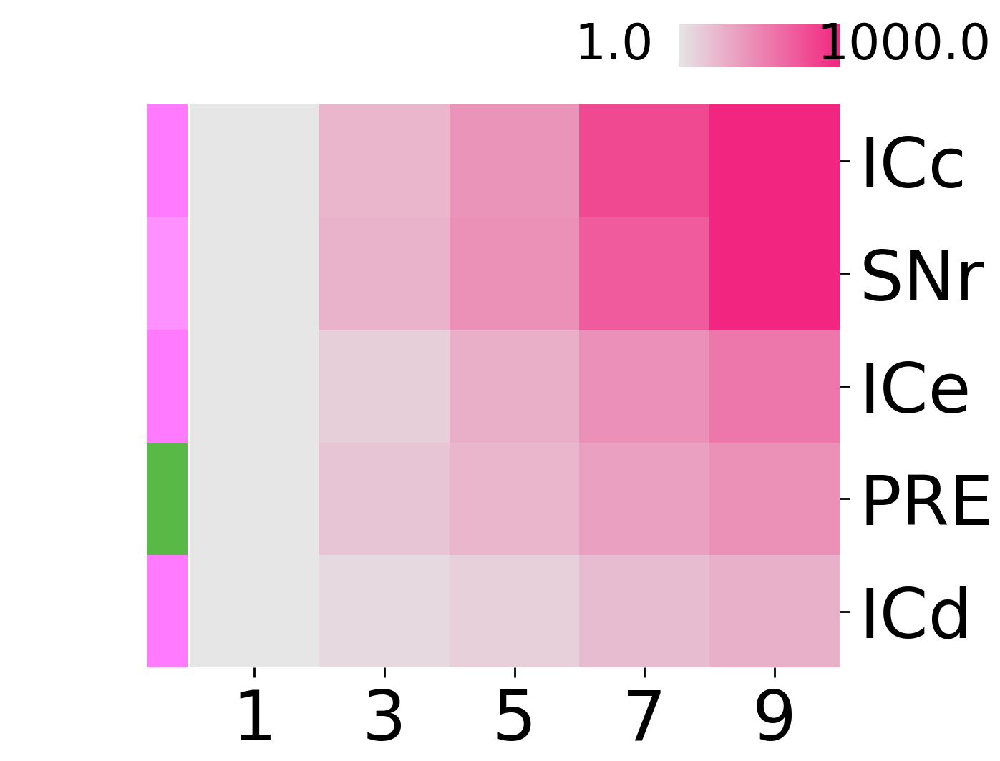

In [91]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
import matplotlib.colors as mcolors

import matplotlib
matplotlib.rcParams['pdf.use14corefonts'] = True

plt.rcParams['font.family'] = 'DejaVu Sans'
plt.rcParams['font.size'] = 70
plt.rcParams['font.weight'] = 'regular'

# Load and extract data
data = all_data[np.isin(all_data["atlasID"], significant_region_ids5)]

# Pivot the data for heatmap and calculate mean density for each atlasID and condition
data_pivot = data.pivot_table(index='atlasID', columns='Condition', values='log_All_cell_count', aggfunc='mean')
# Fill NaN with column means and check if entire columns were NaN
data_pivot = data_pivot.apply(lambda col: col.fillna(col.mean()) if not col.isnull().all() else col.fillna(0))

# Normalize data by row using Z-score, and handle zero variance by replacing NaNs in the result with 0
data_normalized = data_pivot.div(data_pivot['APP_1m'], axis=0)

# Calculate -log10(adjusted_pvalue) for significant regions
log_adjusted_pvalues = pd.Series(data_normalized.index.map(volcano_data.set_index('AtlasID')['-log10(adjusted_pvalue)']), index=data_normalized.index)
# Sort data_normalized based on -log10(adjusted_pvalue)
data_normalized_sorted = data_normalized.loc[log_adjusted_pvalues.sort_values(ascending=False).index]

# **Filter out rows with NaN values before selecting top 5**
data_normalized_sorted = data_normalized_sorted.dropna()

# Select the top 5 rows after removing NaN values
top5_data_normalized_sorted = data_normalized_sorted.head(5)

# Get corresponding acronyms and sort based on log_adjusted_pvalues
acronyms = data_id.set_index('id').loc[data_normalized.index, 'acronym']
acronyms_sorted = acronyms.loc[log_adjusted_pvalues.sort_values(ascending=False).index]

# Filter and select top 5 acronyms after removing NaN rows
top5_acronyms_sorted = acronyms_sorted.loc[top5_data_normalized_sorted.index]

# Custom color map creation: gray to magenta
colors = [(0.9, 0.9, 0.9), (0.95, 0.15, 0.5)]
cmap = mcolors.LinearSegmentedColormap.from_list('custom_gray_magenta', colors)

# Sort the top 5 rows by 'APP_9m' in descending order
top5_data_normalized_sorted = top5_data_normalized_sorted.sort_values(by='APP_9m', ascending=False)
top5_acronyms_sorted = top5_acronyms_sorted.loc[top5_data_normalized_sorted.index]

colorlist = []

for atlas_id in top5_acronyms_sorted.index:
    for i in range(671):
        if data_GO["id"].values[i] == atlas_id:
            colorlist.append((data_GO["R"].values[i] / 255, data_GO["G"].values[i] / 255, data_GO["B"].values[i] / 255))
colorlist_671 = colorlist

# Custom x-axis labels
custom_labels = ['1', '3', '5', '7', '9']

# Check if top5_data_normalized_sorted contains any NaN
if top5_data_normalized_sorted.isnull().any().any():
    print("Data contains NaNs or infinite values, which cannot be clustered.")
else:
    # Cluster map creation
    vmin = 1.0
    vmax = 1000.0
    g = sns.clustermap(top5_data_normalized_sorted, row_colors=colorlist_671[:5], cmap=cmap, vmin=vmin, vmax=vmax, row_cluster=False, col_cluster=False, figsize=(15, 12))
    
    g.ax_heatmap.set_yticklabels(top5_acronyms_sorted, rotation=0)
    g.ax_heatmap.set_xlabel('')
    g.ax_heatmap.set_ylabel('')

    g.cax.set_visible(False)

    # Set custom x-axis labels
    g.ax_heatmap.set_xticklabels(custom_labels, rotation=0)
    g.ax_heatmap.tick_params(axis='both', which='both', length=10, width=2, pad=10)

    # Create a new color bar axis below the heatmap
    cbar_ax = g.fig.add_axes([0.75, 0.81, 0.15, 0.05])  # Right-aligned and 1/3 width
    norm = plt.Normalize(vmin=vmin, vmax=vmax)
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    cb = g.fig.colorbar(sm, cax=cbar_ax, orientation='horizontal')

    # Remove the black border around the color bar
    cb.outline.set_visible(False)

    # Set color bar ticks
    cb.set_ticks([])  # Remove default ticks
    # Add custom labels next to the color bar
    cbar_ax.text(-0.4, 0.5, str(vmin), va='center', ha='center', transform=cbar_ax.transAxes, fontsize=50, fontweight='regular')
    cbar_ax.text(1.4, 0.5, str(vmax), va='center', ha='center', transform=cbar_ax.transAxes, fontsize=50, fontweight='regular')

    plt.savefig('/data5/mitani/Neurology/Fig.3/APP_1m_9m_Abeta_increase_top5_sorted_heatmap.pdf', 
            transparent=True, dpi=300, bbox_inches='tight', pad_inches=0.1)
    plt.show()


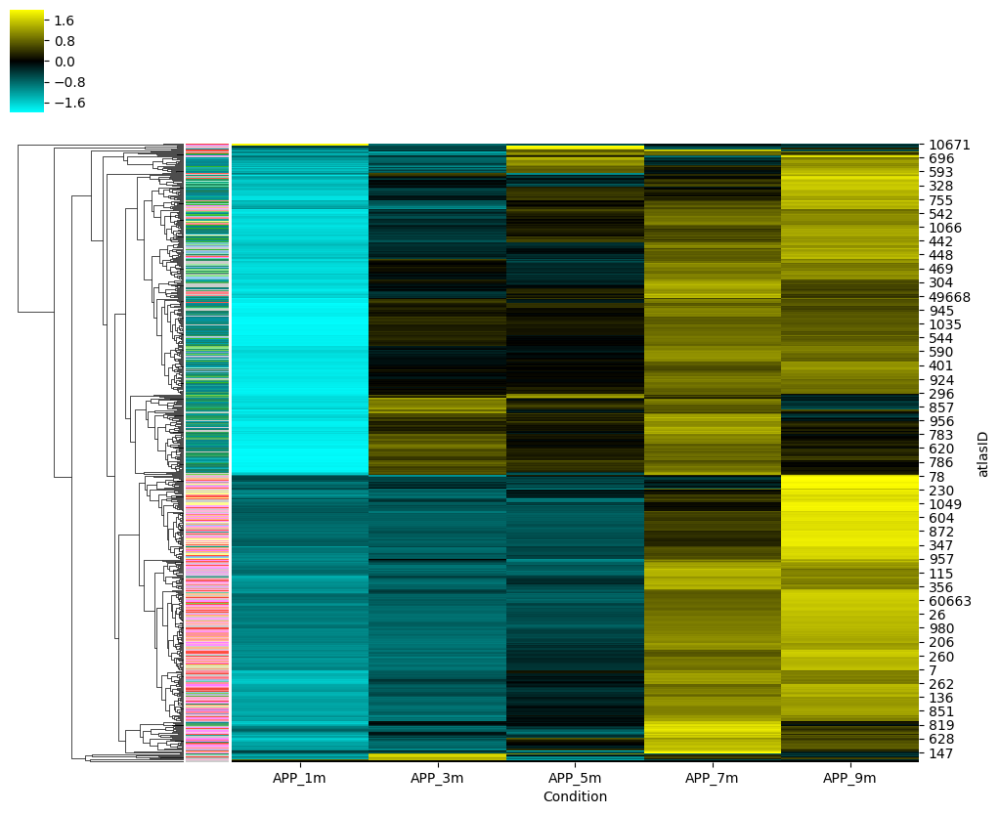

In [252]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import zscore
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.colors as mcolors
import json


# Function to load data and extract 'Iba1+ density (/mm3)' with Condition
def load_and_extract_data(sample_info, conditions):
    df_list = []
    for sample, condition in sample_info:
        param_path = f"/home/mitani/CUBIC-informatics/param/Neuronomics/{sample}/param_multichannel-rank.json"
        try:
            with open(param_path) as f:
                param = json.load(f)
            fw_dir_nu = param["dst_basedir"]
            cellome_file = fw_dir_nu + "/Regional_cellome4.csv"
            if os.path.exists(cellome_file):
                df = pd.read_csv(cellome_file)
                df['Condition'] = condition
                df['Sample'] = sample
                df_list.append(df[['atlasID','NeuN+ density (/mm3)', 'Iba1+ density (/mm3)', 'Condition']])
            else:
                print(f"File not found: {cellome_file}")
        except Exception as e:
            print(f"Error loading data for {sample}: {e}")
    
    return pd.concat(df_list, ignore_index=True) if df_list else pd.DataFrame()


# Prepare sample info
sample_info = [(s, c) for c in ["APP_1m", "APP_3m","APP_5m", "APP_7m", "APP_9m"] for s in conditions[c]]

# Load and extract data
data = all_data[(all_data["Genetic"] == 1) ]#load_and_extract_data(sample_info, conditions)

# Pivot the data for heatmap and calculate mean density for each atlasID and condition
data_pivot = data.pivot_table(index='atlasID', columns='Condition', values='log_All_cell_count', aggfunc='mean')
# Fill NaN with column means and check if entire columns were NaN
data_pivot = data_pivot.apply(lambda col: col.fillna(col.mean()) if not col.isnull().all() else col.fillna(0))

# Normalize data by row using Z-score, and handle zero variance by replacing NaNs in the result with 0
data_normalized = data_pivot.apply(zscore, axis=1).fillna(0)

# Custom color map creation
def create_custom_cmap():
    # Colors: cyan-like, black, yellow-like
    colors = ["#00ffff", "#000000", "#ffff00"]
    cmap_name = "custom_cmap"
    
    # Create a colormap with interpolation between specified colors
    cmap = mcolors.LinearSegmentedColormap.from_list(cmap_name, colors)
    
    return cmap

colorlist=[]

total = 0

for atlas_id in data_pivot.index:
    for i in range (671):
        if data_GO["id"].values[i] == atlas_id:
            colorlist.append((data_GO["R"].values[i]/255,data_GO["G"].values[i]/255,data_GO["B"].values[i]/255))
    colorlist_671=colorlist

# Using the new custom colormap
cmap = create_custom_cmap()

# Check if data_normalized contains any NaN
if data_normalized.isnull().any().any():
    print("Data contains NaNs or infinite values, which cannot be clustered.")
else:
    # Cluster map creation
    sns.clustermap(data_normalized, row_colors=colorlist_671,method="average", cmap=cmap,  vmin=-2, vmax=2, row_cluster=True, col_cluster=False, figsize=(12, 10))
    plt.show()

In [253]:
# CSVファイルとして保存
data_pivot.to_csv('/data4/Region/APP_raw_value_regions_Abeta_all.csv', index=True)

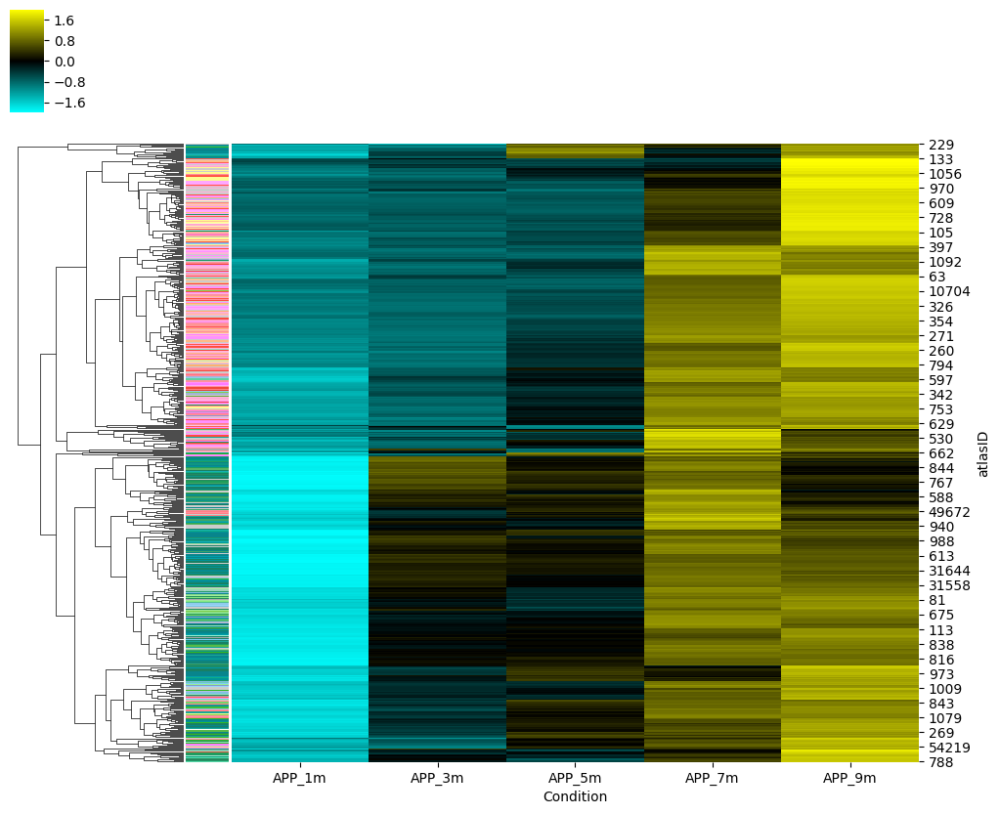

In [254]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import zscore
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.colors as mcolors
import json


# Function to load data and extract 'Iba1+ density (/mm3)' with Condition
def load_and_extract_data(sample_info, conditions):
    df_list = []
    for sample, condition in sample_info:
        param_path = f"/home/mitani/CUBIC-informatics/param/Neuronomics/{sample}/param_multichannel-rank.json"
        try:
            with open(param_path) as f:
                param = json.load(f)
            fw_dir_nu = param["dst_basedir"]
            cellome_file = fw_dir_nu + "/Regional_cellome4.csv"
            if os.path.exists(cellome_file):
                df = pd.read_csv(cellome_file)
                df['Condition'] = condition
                df['Sample'] = sample
                df_list.append(df[['atlasID','NeuN+ density (/mm3)', 'Iba1+ density (/mm3)', 'Condition']])
            else:
                print(f"File not found: {cellome_file}")
        except Exception as e:
            print(f"Error loading data for {sample}: {e}")
    
    return pd.concat(df_list, ignore_index=True) if df_list else pd.DataFrame()


# Prepare sample info
sample_info = [(s, c) for c in ["APP_1m", "APP_3m","APP_5m", "APP_7m", "APP_9m"] for s in conditions[c]]

# Load and extract data
data = all_data[(all_data["Genetic"] == 1) & np.isin(all_data["atlasID"],significant_region_ids_0)]#load_and_extract_data(sample_info, conditions)

# Pivot the data for heatmap and calculate mean density for each atlasID and condition
data_pivot = data.pivot_table(index='atlasID', columns='Condition', values='log_All_cell_count', aggfunc='mean')
# Fill NaN with column means and check if entire columns were NaN
data_pivot = data_pivot.apply(lambda col: col.fillna(col.mean()) if not col.isnull().all() else col.fillna(0))

# Normalize data by row using Z-score, and handle zero variance by replacing NaNs in the result with 0
data_normalized = data_pivot.apply(zscore, axis=1).fillna(0)

# Custom color map creation
def create_custom_cmap():
    # Colors: cyan-like, black, yellow-like
    colors = ["#00ffff", "#000000", "#ffff00"]
    cmap_name = "custom_cmap"
    
    # Create a colormap with interpolation between specified colors
    cmap = mcolors.LinearSegmentedColormap.from_list(cmap_name, colors)
    
    return cmap

colorlist=[]

total = 0

for atlas_id in data_pivot.index:
    for i in range (671):
        if data_GO["id"].values[i] == atlas_id:
            colorlist.append((data_GO["R"].values[i]/255,data_GO["G"].values[i]/255,data_GO["B"].values[i]/255))
    colorlist_671=colorlist

# Using the new custom colormap
cmap = create_custom_cmap()

# Check if data_normalized contains any NaN
if data_normalized.isnull().any().any():
    print("Data contains NaNs or infinite values, which cannot be clustered.")
else:
    # Cluster map creation
    sns.clustermap(data_normalized, row_colors=colorlist_671,method="average", cmap=cmap,  vmin=-2, vmax=2, row_cluster=True, col_cluster=False, figsize=(12, 10))
    plt.show()

In [255]:
# CSVファイルとして保存
data_pivot.to_csv('/data4/Region/APP_raw_value_regions_Abeta_increase.csv', index=True)

In [ ]:
# 補正Nearest Neighbor

#4_APPmodel_APP1m_1_2022_1102_1304
#4_APPmodel_APP1m_2_2022_1106_1708
#4_APPmodel_APP1m_3_2022_1213_2151
#4_APPmodel_APP1m_4_2023_0417_2052
#5_APPmodel_APP3m_2_2023_0123_1645
#5_APPmodel_APP3m_3_2023_0212_2217
#5_APPmodel_APP3m_4_2023_0214_2027
#4_APPmodel_APP3m_5_2023_0502_1423
#4_APPmodel_APP5m_1_2022_1024_1336
#4_APPmodel_APP5m_2_2022_1027_1333
#4_APPmodel_APP5m_3_2022_1030_1257
#4_APPmodel_APP5m_4_2023_0509_1021
#5_APPmodel_APP7m_2_2023_0315_1540
#5_APPmodel_APP7m_3_2023_0310_1401
#5_APPmodel_APP7m_4_2023_0317_1630
#5_APPmodel_APP7m_5_2023_0520_1723
#5_APPmodel_APP9m_1_2023_0117_1352
#5_APPmodel_APP9m_2_2023_0327_1425
#5_APPmodel_APP9m_3_2023_0329_1611
#5_APPmodel_APP9m_4_2023_0403_1443
997
Coefficient: 11.42500000000003, p-value: 0.46535756372569037
68
Coefficient: -59.64999999999988, p-value: 0.20810089791159853
667
Coefficient: -153.42499999999978, p-value: 6.287570340034863e-06
52192
Coefficient: -177.2124999999999, p-value: 3.282357318843698e-06
52196


/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:131: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html

Coefficient: -136.7250000000001, p-value: 0.0001883679785595041
52264
Coefficient: 140.7500000000001, p-value: 0.3437943445478212
320
Coefficient: -142.32499999999996, p-value: 0.00010894778581439553
943
Coefficient: -154.8374999999999, p-value: 1.094332952373787e-07
648
Coefficient: -166.9624999999998, p-value: 5.544186879962194e-07
844
Coefficient: -136.83750000000006, p-value: 0.0015125706698704564
882
Coefficient: -122.80000000000013, p-value: 0.010461993557399822
656
Coefficient: -107.66249999999995, p-value: 0.000864260318746783
962
Coefficient: -152.29999999999993, p-value: 2.156539986012153e-06
767
Coefficient: -176.2250000000001, p-value: 4.992171318582559e-07
1021
Coefficient: -153.18750000000009, p-value: 0.0002896800502762008
1085
Coefficient: -149.675, p-value: 0.0071595301644154005
558
Coefficient: -223.61250000000018, p-value: 5.44945656100716e-07
838
Coefficient: -230.57499999999996, p-value: 2.3847956098899365e-09
654
Coefficient: -189.84999999999997, p-value: 1.894109

/home/mitani/my_env/lib/python3.7/site-packages/pandas/core/frame.py:5244: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  method=method,
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:131: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mi

Coefficient: -82.59999999999988, p-value: 0.0910876555549993
981
Coefficient: -211.13749999999996, p-value: 4.1516683311667744e-07
201
Coefficient: -236.01249999999965, p-value: 2.1357835960944144e-09
1047
Coefficient: -184.87499999999997, p-value: 5.870794397614038e-08
1070
Coefficient: -187.47499999999988, p-value: 3.391078896085063e-07
1038
Coefficient: -145.5624999999999, p-value: 0.001254761142612799
1062
Coefficient: -117.54999999999978, p-value: 0.003999997610366082
1030
Coefficient: -148.43749999999991, p-value: 1.9037113864555118e-05
113
Coefficient: -209.42500000000015, p-value: 9.203264316392183e-09
1094
Coefficient: -195.91249999999982, p-value: 3.2341531935548626e-07
1128
Coefficient: -164.39999999999998, p-value: 3.141590421319761e-06
478
Coefficient: -119.90000000000032, p-value: 0.007305557989566511
510
Coefficient: -95.4999999999997, p-value: 0.09417033587608668
878
Coefficient: -186.58749999999992, p-value: 1.9299658073570977e-05
657
Coefficient: -187.21249999999978, 

/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/pandas/core/frame.py:5244: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  method=method,
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:131: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mi

Coefficient: -161.85, p-value: 2.778860303198307e-06
1102
Coefficient: -137.32499999999993, p-value: 0.0002594566194145764
2
Coefficient: -114.47499999999982, p-value: 0.003948931208107659
450
Coefficient: -203.41250000000008, p-value: 7.458047025670393e-08
854
Coefficient: -204.12500000000006, p-value: 5.005232421931636e-08
577
Coefficient: -169.91249999999985, p-value: 2.3975869398737476e-07
625
Coefficient: -178.92500000000018, p-value: 6.129549576201165e-07
945
Coefficient: -111.66249999999982, p-value: 0.011400456140650694
1026
Coefficient: -106.1125000000001, p-value: 0.046178301334872836
1006
Coefficient: -178.7125000000001, p-value: 5.7250062485809234e-05
670
Coefficient: -182.99999999999991, p-value: 1.5970921375172776e-07
1086
Coefficient: -188.98749999999995, p-value: 2.975272335912705e-08
1111
Coefficient: -184.48749999999978, p-value: 8.565091701183934e-07
9
Coefficient: -150.6, p-value: 0.000489485488670323
461
Coefficient: -165.10000000000008, p-value: 0.0079379738147809

/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/pandas/core/frame.py:5244: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  method=method,
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:131: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mi

Coefficient: -193.10000000000002, p-value: 2.4484556676759e-07
18701
Coefficient: -158.12499999999977, p-value: 1.2909721051367183e-05
18705
Coefficient: -163.7749999999998, p-value: 3.0106675531985985e-06
18709
Coefficient: -167.45, p-value: 0.0002077128292195103
18713
Coefficient: -183.5749999999999, p-value: 0.002723266223571759
873
Coefficient: -178.02499999999992, p-value: 5.179821010519491e-05
806
Coefficient: -185.19999999999993, p-value: 1.92162312196613e-08
1035
Coefficient: -142.31249999999994, p-value: 3.8449410079118745e-07
1090
Coefficient: -153.74999999999994, p-value: 3.1513018135063745e-07
862
Coefficient: -141.96250000000012, p-value: 9.840598112832368e-05
893
Coefficient: -103.03749999999988, p-value: 0.004919996167567266
36
Coefficient: -128.33750000000026, p-value: 0.0015869532295951503
180
Coefficient: -154.40000000000032, p-value: 6.579612800087926e-07
148
Coefficient: -145.52499999999984, p-value: 6.203668620018106e-06
187
Coefficient: -198.13749999999996, p-valu

/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/pandas/core/frame.py:5244: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  method=method,
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:131: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mi

Coefficient: -144.06249999999994, p-value: 3.4843089443225528e-06
662
Coefficient: -122.76250000000005, p-value: 0.003025752532636876
897
Coefficient: -159.16249999999982, p-value: 0.00011905235674691521
1106
Coefficient: -178.36249999999984, p-value: 1.914068159121474e-06
1010
Coefficient: -188.68749999999997, p-value: 7.653502240489829e-07
1058
Coefficient: -153.83749999999998, p-value: 3.6529001124949436e-06
857
Coefficient: -145.65000000000003, p-value: 8.269428944531761e-06
849
Coefficient: -94.62500000000003, p-value: 0.002390680530876231
527
Coefficient: -239.98750000000004, p-value: 1.7635846815711985e-06
600
Coefficient: -198.31249999999997, p-value: 4.107855458234544e-08
678
Coefficient: -164.22499999999965, p-value: 2.0272109038984993e-05
252
Coefficient: -170.9624999999998, p-value: 3.5968440497283823e-06
156
Coefficient: -179.82500000000013, p-value: 0.00015239190001012978
243
Coefficient: -139.49999999999994, p-value: 0.06081451935269437
735
Coefficient: -260.449999999999

/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/pandas/core/frame.py:5244: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  method=method,
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:131: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mi

Coefficient: -258.0750000000002, p-value: 7.196907920487376e-11
816
Coefficient: -213.725, p-value: 1.4462887589423202e-07
847
Coefficient: -200.59999999999974, p-value: 3.2419238013108015e-07
954
Coefficient: -198.16250000000008, p-value: 2.7126285714349522e-05
1005
Coefficient: -119.48749999999998, p-value: 0.028731083061012064
696
Coefficient: -244.43750000000006, p-value: 0.00012238775687426178
643
Coefficient: -246.67499999999993, p-value: 5.158033303350935e-08
759
Coefficient: -166.71249999999998, p-value: 6.22039262081017e-05
791
Coefficient: -199.17499999999973, p-value: 1.4474701996530676e-06
249
Coefficient: -216.83749999999998, p-value: 2.7235776182821184e-05
456
Coefficient: -198.06250000000003, p-value: 0.007234786685126728
959
Coefficient: -194.38749999999985, p-value: 7.038152721682706e-07
755
Coefficient: -227.39999999999992, p-value: 1.0650541789559538e-08
990
Coefficient: -194.88750000000007, p-value: 6.775984972526289e-07
1023
Coefficient: -182.22499999999994, p-valu

/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/pandas/core/frame.py:5244: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  method=method,
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:131: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mi

Coefficient: -196.23750000000013, p-value: 0.00010229839067410025
1074
Coefficient: -198.79999999999984, p-value: 0.0001533362284343839
905
Coefficient: -214.9124999999999, p-value: 1.4722927275706106e-07
1114
Coefficient: -174.21250000000015, p-value: 3.7782475870560886e-07
233
Coefficient: -205.20000000000013, p-value: 9.254997346971916e-07
601
Coefficient: -161.04999999999998, p-value: 0.0003134765117359494
649
Coefficient: -184.4250000000002, p-value: 0.007919459381987152
281
Coefficient: -131.64999999999998, p-value: 0.06392382970652681
1066
Coefficient: -211.4125, p-value: 1.0622963945667705e-05
401
Coefficient: -194.10000000000008, p-value: 8.339745331880943e-06
433
Coefficient: -214.81249999999986, p-value: 5.382332589577174e-08
1046
Coefficient: -222.19999999999987, p-value: 5.383371726858366e-07
441
Coefficient: -150.2875, p-value: 0.04850812117234649
421
Coefficient: -171.7749999999999, p-value: 5.541746511735556e-05
973
Coefficient: -217.9499999999997, p-value: 1.2010547277

/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/pandas/core/frame.py:5244: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  method=method,
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:131: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mi

Coefficient: -231.2375, p-value: 2.32949379283862e-05
121
Coefficient: -153.99999999999997, p-value: 0.0193177980703532
593
Coefficient: -193.61249999999995, p-value: 0.0006463123490987287
821
Coefficient: -252.48750000000013, p-value: 6.355073667850952e-07
721
Coefficient: -221.72500000000014, p-value: 7.1446471994803615e-09
778
Coefficient: -223.6749999999998, p-value: 4.221788571083249e-07
33
Coefficient: -238.8375000000002, p-value: 2.015064071221724e-05
305
Coefficient: -163.32500000000016, p-value: 0.0052396101536571725
750
Coefficient: -50.30000000000004, p-value: 0.3951703978386929
269
Coefficient: -126.01250000000007, p-value: 0.0017699764759077747
869
Coefficient: -155.63749999999996, p-value: 0.006112498512948761
902
Coefficient: -164.32500000000033, p-value: 2.999394745611454e-05
377
Coefficient: -123.81250000000001, p-value: 0.012037631386161783
393
Coefficient: -165.86250000000004, p-value: 0.2585066270519104
805
Coefficient: -196.37499999999997, p-value: 0.01617729344819

/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/pandas/core/frame.py:5244: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  method=method,
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:131: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mi

Coefficient: -228.72499999999985, p-value: 3.2591035076917393e-07
257
Coefficient: -224.0624999999999, p-value: 0.00012719251326067394
469
Coefficient: -189.69999999999996, p-value: 0.002926551278658025
31578
Coefficient: -163.68750000000006, p-value: 0.0006315861066396058
31582
Coefficient: -207.76249999999968, p-value: 1.357526349982204e-07
31586
Coefficient: -209.81249999999977, p-value: 9.86699563966093e-06
31590
Coefficient: -191.2624999999999, p-value: 2.247524736127197e-05
31594
Coefficient: -207.07499999999993, p-value: 4.208612869780332e-05
31598
Coefficient: -106.42500000000021, p-value: 0.10484487296011286
31632
Coefficient: -155.46249999999995, p-value: 1.3968450368831766e-05
31636
Coefficient: -175.65000000000003, p-value: 3.835715364097467e-06
31640
Coefficient: -218.3249999999999, p-value: 8.553410888681454e-07
31644
Coefficient: -177.9500000000001, p-value: 2.951242892136469e-06
31648
Coefficient: -168.33750000000003, p-value: 0.00036431580739422666
31652
Coefficient: -

/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/pandas/core/frame.py:5244: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  method=method,
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:131: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mi

Coefficient: -183.82500000000002, p-value: 6.02422143584796e-07
919
Coefficient: -174.38750000000007, p-value: 3.813411194903039e-05
927
Coefficient: -184.34999999999988, p-value: 0.0033657148138977067
588
Coefficient: -26.13750000000011, p-value: 0.3703148519868885
296
Coefficient: -141.10000000000002, p-value: 0.0001249309725549029
772
Coefficient: -171.36249999999995, p-value: 1.3621637720890629e-05
810
Coefficient: -144.31249999999986, p-value: 0.0002950750274302258
819
Coefficient: -82.14999999999986, p-value: 0.15202858029944474
171
Coefficient: -82.54999999999997, p-value: 0.0012741813692223978
304
Coefficient: -207.46250000000003, p-value: 1.1362060838626806e-07
363
Coefficient: -221.8, p-value: 3.3796140599205876e-07
84
Coefficient: -208.7625000000001, p-value: 2.090111899684998e-06
132
Coefficient: -195.925, p-value: 0.0011070404663558852
707
Coefficient: -39.89999999999988, p-value: 0.1831698910431415
556
Coefficient: -131.10000000000005, p-value: 0.0004260680030329361
827
C

/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/pandas/core/frame.py:5244: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  method=method,
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:131: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mi

Coefficient: -226.28750000000016, p-value: 0.0037411193539331005
448
Coefficient: -158.74999999999997, p-value: 0.0009132418872632416
412
Coefficient: -175.28750000000014, p-value: 1.0028913393328602e-06
630
Coefficient: -175.57499999999996, p-value: 1.769861656376498e-05
440
Coefficient: -154.27499999999978, p-value: 4.4951350234326496e-05
488
Coefficient: -108.86249999999984, p-value: 0.007606555985652035
484
Coefficient: -5.8500000000000245, p-value: 0.8065115939526841
582
Coefficient: -205.2625000000002, p-value: 4.593734633047223e-06
620
Coefficient: -210.9124999999999, p-value: 2.239533090354927e-07
910
Coefficient: -209.43749999999966, p-value: 3.6004572404637675e-06
52977
Coefficient: -256.2, p-value: 0.013799038165733178
969
Coefficient: -147.1875, p-value: 0.0070500687177491765
288
Coefficient: -197.52500000000023, p-value: 4.901215785947681e-06
1125
Coefficient: -164.14999999999972, p-value: 4.030066074555428e-06
608
Coefficient: -173.72499999999997, p-value: 1.5251029223775

/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/pandas/core/frame.py:5244: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  method=method,
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:131: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mi

Coefficient: -177.73749999999998, p-value: 4.5338412104027517e-07
1101
Coefficient: -207.98750000000007, p-value: 4.2797769162682676e-07
783
Coefficient: -182.46249999999975, p-value: 4.73192784233679e-07
831
Coefficient: -148.88749999999996, p-value: 0.0011229353164934563
120
Coefficient: -155.22500000000016, p-value: 0.0004135132985165305
163
Coefficient: -218.27500000000003, p-value: 1.5901377925451518e-06
344
Coefficient: -216.58749999999975, p-value: 5.228669728429019e-06
314
Coefficient: -218.2375000000001, p-value: 7.282735775715851e-08
355
Coefficient: -137.13749999999976, p-value: 0.0032276098297208265
704
Coefficient: -47.00000000000003, p-value: 0.1893054485467213
694
Coefficient: -181.76249999999976, p-value: 3.480628363580115e-05
800
Coefficient: -227.76249999999996, p-value: 3.171670866205236e-05
675
Coefficient: -192.08750000000003, p-value: 5.400426333539505e-06
699
Coefficient: -114.13749999999983, p-value: 0.31914067909912763
671
Coefficient: -129.58749999999998, p-va

/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/pandas/core/frame.py:5244: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  method=method,
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:131: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mi

Coefficient: -187.75, p-value: 0.00013290236014944427
279
Coefficient: -158.16250000000008, p-value: 0.045581989544664005
442
Coefficient: -167.625, p-value: 0.022457850665406957
434
Coefficient: -234.82500000000013, p-value: 0.0005513271256196734
610
Coefficient: -200.07500000000005, p-value: 1.2360165401614179e-05
274
Coefficient: -184.08749999999972, p-value: 0.00015597200303620385
330
Coefficient: -97.47499999999997, p-value: 0.1855190408988424
542
Coefficient: -94.0624999999999, p-value: 0.001053012490081645
430
Coefficient: -111.91250000000004, p-value: 0.0030546015581439604
687
Coefficient: -155.69999999999987, p-value: 6.378827023693149e-05
590
Coefficient: -150.17499999999964, p-value: 0.004485163187641712
622
Coefficient: -215.10000000000008, p-value: 0.0012515788849843947
31550
Coefficient: -163.3125, p-value: 4.407662687450278e-05
31554
Coefficient: -200.50000000000009, p-value: 3.4070961903928506e-08
31558
Coefficient: -160.4875, p-value: 5.145240226204372e-07
31562
Coeffi

/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/pandas/core/frame.py:5244: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  method=method,
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:131: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mi

Coefficient: -92.81249999999991, p-value: 0.1200162837147375
31604
Coefficient: -170.78750000000002, p-value: 2.3938250204296596e-05
31608
Coefficient: -192.9624999999998, p-value: 8.630783450219955e-08
31612
Coefficient: -196.0999999999998, p-value: 4.611088072066269e-09
31616
Coefficient: -183.83749999999995, p-value: 2.0335579051550377e-07
31620
Coefficient: -200.6874999999998, p-value: 1.599080699988887e-05
31624
Coefficient: -174.78749999999997, p-value: 0.009391874410013185
97
Coefficient: -142.43749999999991, p-value: 0.0003279893210210249
1127
Coefficient: -211.7124999999997, p-value: 2.6714672063270826e-09
234
Coefficient: -192.8374999999999, p-value: 3.5475751462640603e-07
289
Coefficient: -192.00000000000006, p-value: 1.9350123561975578e-06
729
Coefficient: -182.06249999999994, p-value: 4.23093506284101e-05
786
Coefficient: -143.56250000000003, p-value: 0.0009262464149883706
540
Coefficient: -175.54999999999993, p-value: 0.00042564330474159233
888
Coefficient: -179.662499999

/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/pandas/core/frame.py:5244: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  method=method,
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:131: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mi

Coefficient: -139.31250000000017, p-value: 0.0004461057553155127
427
Coefficient: -189.57500000000016, p-value: 1.823358585732352e-08
988
Coefficient: -165.475, p-value: 4.57769818493012e-07
977
Coefficient: -149.80000000000013, p-value: 5.6241838980279387e-05
1045
Coefficient: -97.83749999999986, p-value: 0.0019018911359108771
698
Coefficient: -80.81249999999997, p-value: 0.02664298782353711
507
Coefficient: -72.06249999999973, p-value: 0.03212192797323204
188
Coefficient: -1.2374999999995209, p-value: 0.9782364984795342
196
Coefficient: -82.19999999999986, p-value: 0.011754638387539703
204
Coefficient: 6.574999999999999, p-value: 0.8672437873853397
159
Coefficient: -167.66249999999982, p-value: 8.799725391047842e-06
597
Coefficient: -106.13750000000013, p-value: 6.123150077892264e-05
605
Coefficient: -34.762499999999946, p-value: 0.056181265977576944
814
Coefficient: -148.2625000000002, p-value: 3.166603021798908e-05
961
Coefficient: -160.31250000000014, p-value: 1.2773970327686022e-

/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/pandas/core/frame.py:5244: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  method=method,
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:131: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mi

Coefficient: -102.59999999999984, p-value: 0.0019673858064609916
423
Coefficient: -52.850000000000044, p-value: 0.17449975579623422
463
Coefficient: -68.6125, p-value: 0.07278249403086885
10703
Coefficient: -2.5499999999999807, p-value: 0.8939373525592875
10704
Coefficient: -105.91249999999988, p-value: 0.018440952669413146
632
Coefficient: -0.5000000000000969, p-value: 0.9863085137710375
982
Coefficient: -38.712500000000006, p-value: 0.3299436246666463
19
Coefficient: 49.07500000000005, p-value: 0.2817673240905872
1121
Coefficient: -126.575, p-value: 9.699722926020996e-05
20
Coefficient: -197.28749999999977, p-value: 1.1228055538873733e-06
52
Coefficient: -217.0749999999998, p-value: 2.2061052492142903e-07
139
Coefficient: -201.84999999999994, p-value: 1.5190505259729056e-06
28
Coefficient: -218.81249999999997, p-value: 4.3868275862493515e-07
526
Coefficient: -53.73749999999997, p-value: 0.07090791468673756
543
Coefficient: -164.08750000000006, p-value: 0.0001357643366121287
664
Coeff

/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:131: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/pandas/core/frame.py:5244: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  method=method,
/home/mi

Coefficient: -160.81249999999986, p-value: 2.78519149027475e-06
703
Coefficient: -166.3875, p-value: 6.60272355486379e-06
583
Coefficient: -196.12499999999977, p-value: 1.7576091180504048e-06
952
Coefficient: -163.37500000000006, p-value: 9.938287958063719e-06
966
Coefficient: -232.73749999999987, p-value: 2.439200287068249e-06
131
Coefficient: -234.91249999999988, p-value: 1.534898576333861e-08
303
Coefficient: -238.04999999999998, p-value: 2.9977128280478085e-08
311
Coefficient: -262.2499999999999, p-value: 1.4369766084911182e-06
451
Coefficient: -251.9249999999999, p-value: 2.556018462539107e-07
327
Coefficient: -188.7125, p-value: 1.705340628549959e-06
334
Coefficient: -275.9624999999999, p-value: 2.6321257893928053e-08
780
Coefficient: -204.27499999999995, p-value: 1.7080885870589293e-05
477
Coefficient: -58.58749999999992, p-value: 0.0061069706444605975
672
Coefficient: -38.624999999999936, p-value: 0.2680913534757759
56
Coefficient: -120.88749999999982, p-value: 0.00026387704530

/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/pandas/core/frame.py:5244: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  method=method,
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:131: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mi

Coefficient: -203.88749999999996, p-value: 3.34674611416185e-05
551
Coefficient: -155.7500000000003, p-value: 0.00023548927734229954
559
Coefficient: -135.9375, p-value: 0.0005104566047530089
1105
Coefficient: -202.43750000000003, p-value: 9.465717658601752e-05
403
Coefficient: -80.78750000000011, p-value: 0.0003422752176766212
803
Coefficient: -26.387499999999974, p-value: 0.24412391715101886
1022
Coefficient: -135.56250000000003, p-value: 0.001505092462790725
1031
Coefficient: -18.437499999999783, p-value: 0.6191876119601688
342
Coefficient: -84.18749999999996, p-value: 0.006284409944120528
298
Coefficient: -13.150000000000162, p-value: 0.7390671745260231
564
Coefficient: -62.71249999999997, p-value: 0.12492793808863109
596
Coefficient: 37.04999999999997, p-value: 0.12779088373015762
581
Coefficient: -69.46249999999985, p-value: 0.02458087960453958
351
Coefficient: -89.21249999999971, p-value: 0.0030477055813010554
287
Coefficient: -217.8124999999998, p-value: 0.024689493880585268
54

/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:131: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/pandas/core/frame.py:5244: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  method=method,
/home/mi

Coefficient: -137.46249999999986, p-value: 0.013450849876933586
609
Coefficient: -56.087499999999935, p-value: 0.3482498327408624
1044
Coefficient: -54.51250000000015, p-value: 0.1195939159718011
1072
Coefficient: 6.3875000000000455, p-value: 0.7679517093096647
1079
Coefficient: -89.28750000000012, p-value: 0.007242690002659698
1088
Coefficient: -72.31249999999997, p-value: 0.10135592615381031
49664
Coefficient: -31.78749999999999, p-value: 0.3460334235863024
49668
Coefficient: -112.11249999999991, p-value: 0.010532226119750965
49672
Coefficient: -159.0624999999999, p-value: 0.0052710182552305265
218
Coefficient: -37.50000000000004, p-value: 0.2622174376035317
1020
Coefficient: -94.775, p-value: 0.07309384560087695
1029
Coefficient: -117.97499999999984, p-value: 0.00802451177938173
325
Coefficient: -29.237499999999915, p-value: 0.32788235615104566
56551
Coefficient: -114.52499999999979, p-value: 0.013689065661712215
255
Coefficient: -95.88749999999993, p-value: 0.05445659053287612
1096

/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/pandas/core/frame.py:5244: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  method=method,
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:131: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mi

Coefficient: -121.51250000000024, p-value: 0.0018973873678220711
1077
Coefficient: -112.48750000000004, p-value: 0.009058373933971652
149
Coefficient: -29.01249999999986, p-value: 0.5504166382542848
15
Coefficient: -28.100000000000243, p-value: 0.5480176626653546
181
Coefficient: -87.68750000000004, p-value: 0.023680698942906267
56559
Coefficient: -158.50000000000009, p-value: 0.00014146967710711015
189
Coefficient: -69.82500000000006, p-value: 0.15327900708725933
599
Coefficient: -68.79999999999983, p-value: 0.2080229678347334
907
Coefficient: -88.46249999999978, p-value: 0.08728655745725393
575
Coefficient: -79.97499999999984, p-value: 0.128715295362636
930
Coefficient: -103.06249999999996, p-value: 0.06236092713584712
56563
Coefficient: -52.49999999999989, p-value: 0.16331845310532092
262
Coefficient: -71.98749999999984, p-value: 0.0810078546626427
27
Coefficient: -47.69999999999994, p-value: 0.3462422843236609
56439
Coefficient: -39.462500000000034, p-value: 0.5258389027634005
178


/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:131: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/pandas/core/frame.py:5244: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  method=method,
/home/mi

Coefficient: -28.199999999999964, p-value: 0.6036737023845928
118
Coefficient: -89.27499999999998, p-value: 0.04889945243710237
223
Coefficient: -16.08749999999994, p-value: 0.5946417443873541
72
Coefficient: -21.487499999999894, p-value: 0.5736266479222185
263
Coefficient: -26.087500000000105, p-value: 0.39580965974688875
272
Coefficient: -2.6375000000001236, p-value: 0.9336625542673113
830
Coefficient: -139.4375, p-value: 0.0010843273843603731
452
Coefficient: -100.33750000000015, p-value: 0.03766696328464392
523
Coefficient: -30.524999999999853, p-value: 0.33271680374093304
763
Coefficient: -61.374999999999936, p-value: 0.3834064560321566
914
Coefficient: -60.93750000000001, p-value: 0.253627462722051
1109
Coefficient: -21.71250000000019, p-value: 0.6187341215621476
126
Coefficient: -14.525000000000079, p-value: 0.7525580082833992
133
Coefficient: -42.76249999999995, p-value: 0.3978642267683993
347
Coefficient: -41.91249999999991, p-value: 0.35940791736194044
286
Coefficient: -10.34

/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/pandas/core/frame.py:5244: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  method=method,
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:131: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mi

Coefficient: -26.7999999999997, p-value: 0.5671100065693822
60659
Coefficient: 3.1999999999998128, p-value: 0.926863610482253
525
Coefficient: -36.174999999999855, p-value: 0.17367285549912925
1126
Coefficient: -60.037499999999866, p-value: 0.23980264182481303
1
Coefficient: 109.00000000000024, p-value: 0.01969700285020278
515
Coefficient: -48.7625000000001, p-value: 0.17647612094092446
980
Coefficient: -56.01250000000026, p-value: 0.2306947701879323
1004
Coefficient: -120.50000000000009, p-value: 0.003436315945404375
63
Coefficient: -101.80000000000014, p-value: 0.05416904851799558
693
Coefficient: -154.61250000000004, p-value: 4.3501407352945526e-05
946
Coefficient: -80.86250000000017, p-value: 0.08477228789004362
194
Coefficient: -50.38750000000016, p-value: 0.13512027392841183
226
Coefficient: -34.83750000000011, p-value: 0.3645365734126127
356
Coefficient: -112.03749999999992, p-value: 0.01054797028922476
364
Coefficient: -83.23749999999988, p-value: 0.046354687438010356
57704
Coe

/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/pandas/core/frame.py:5244: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  method=method,
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:131: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mi

Coefficient: 82.66250000000004, p-value: 0.0005954124684893171
834
Coefficient: 27.625000000000185, p-value: 0.14365918951438428
811
Coefficient: -34.59999999999997, p-value: 0.3781649113408919
820
Coefficient: -9.987499999999793, p-value: 0.8133567130237291
828
Coefficient: -6.5124999999998385, p-value: 0.8536980959295961
580
Coefficient: -1.7624999999997577, p-value: 0.9770535812683149
271
Coefficient: -52.912499999999895, p-value: 0.35109012483661417
874
Coefficient: 24.637499999999978, p-value: 0.7714883531158028
460
Coefficient: -5.349999999999878, p-value: 0.9367447143314228
59923
Coefficient: -64.26249999999992, p-value: 0.3448935354025794
381
Coefficient: -99.91250000000005, p-value: 0.004489385015544161
749
Coefficient: -109.20000000000007, p-value: 0.020770880066387828
60830
Coefficient: -66.84999999999975, p-value: 0.2779233882167168
246
Coefficient: -81.42499999999986, p-value: 0.06713814071269952
128
Coefficient: -134.4625000000002, p-value: 0.009924284457382113
26
Coeffic

/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/pandas/core/frame.py:5244: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  method=method,
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:131: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mi

Coefficient: -104.58749999999986, p-value: 0.05785548753795638
215
Coefficient: -92.72499999999991, p-value: 0.06964843267949396
531
Coefficient: 46.63750000000013, p-value: 0.16298984777656306
628
Coefficient: 17.112500000000203, p-value: 0.6448024210470714
634
Coefficient: -41.737500000000075, p-value: 0.4215181221349976
706
Coefficient: -43.06250000000001, p-value: 0.4548232113164882
1061
Coefficient: -62.87499999999991, p-value: 0.21044750156604855
54203
Coefficient: -134.51250000000002, p-value: 0.038741841051063285
616
Coefficient: -42.33749999999978, p-value: 0.38126866508722235
214
Coefficient: -163.13749999999996, p-value: 0.007131141050837278
35
Coefficient: -128.71249999999986, p-value: 0.010896466761239251
54211
Coefficient: -48.712499999999736, p-value: 0.549308550436147
975
Coefficient: -22.02500000000002, p-value: 0.7495480894876049
115
Coefficient: 168.34999999999994, p-value: 0.07172105471034716
60663
Coefficient: 13.337499999999995, p-value: 0.8733574085403735
757
Coe

/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/pandas/core/frame.py:5244: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  method=method,
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:131: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mi

Coefficient: 69.57500000000032, p-value: 0.4213605512106672
60834
Coefficient: -26.424999999999816, p-value: 0.4553848634348552
60838
Coefficient: -116.46249999999993, p-value: 0.023523279618968815
60842
Coefficient: -109.87500000000018, p-value: 0.07608699830125237
60846
Coefficient: -32.925000000000225, p-value: 0.5263846035528987
60850
Coefficient: -74.16250000000011, p-value: 0.27734745919127335
60854
Coefficient: -53.07499999999988, p-value: 0.5582223350699433
60858
Coefficient: -110.22500000000007, p-value: 0.04791459460018574
60862
Coefficient: -22.787499999999948, p-value: 0.6485387132327396
197
Coefficient: -49.87500000000007, p-value: 0.5083454573729974
591
Coefficient: -57.76249999999988, p-value: 0.32968079290916563
872
Coefficient: -100.1125, p-value: 0.09876836239225097
771
Coefficient: -121.35000000000002, p-value: 0.004370964529578645
612
Coefficient: -57.16249999999988, p-value: 0.18992364216184154
7
Coefficient: -144.58749999999992, p-value: 0.010177078950997292
867
C

/home/mitani/my_env/lib/python3.7/site-packages/pandas/core/frame.py:5244: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  method=method,
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:131: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mi

Coefficient: -210.5124999999999, p-value: 0.03522894870321756
880
Coefficient: -48.300000000000054, p-value: 0.42048843547503434
59927
Coefficient: -225.32499999999993, p-value: 0.009681981944740214
898
Coefficient: -105.54999999999974, p-value: 0.11468384002686827
931
Coefficient: -34.52500000000006, p-value: 0.551179162207336
1093
Coefficient: -231.44999999999976, p-value: 4.821571376955614e-05
318
Coefficient: -267.2749999999998, p-value: 0.014477341991200833
534
Coefficient: -232.54999999999984, p-value: 9.27565867228727e-05
574
Coefficient: -246.54999999999995, p-value: 2.3551195470009897e-05
621
Coefficient: -247.61249999999976, p-value: 1.4353254249966536e-05
54215
Coefficient: -240.19999999999993, p-value: 0.00023230649029820386
54219
Coefficient: -160.5624999999998, p-value: 0.020275844977458914
54223
Coefficient: -163.5624999999999, p-value: 0.004169816870646793
54227
Coefficient: -154.88749999999965, p-value: 0.002797860483446913
679
Coefficient: -215.16249999999988, p-value

/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/pandas/core/frame.py:5244: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  method=method,
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:131: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mi

Coefficient: -242.46249999999986, p-value: 0.004111276669646515
354
Coefficient: -165.42499999999995, p-value: 0.005469081453069035
207
Coefficient: 35.64999999999995, p-value: 0.5833580556475026
96
Coefficient: -64.56249999999983, p-value: 0.22435528147051637
101
Coefficient: -20.14999999999986, p-value: 0.5915930993796975
711
Coefficient: -69.37499999999999, p-value: 0.28468874481626594
1039
Coefficient: -54.1000000000002, p-value: 0.406415877957647
903
Coefficient: -47.23750000000002, p-value: 0.36266757354567514
642
Coefficient: -184.56249999999991, p-value: 6.445237992843455e-05
651
Coefficient: -163.08749999999992, p-value: 0.03295047927689635
429
Coefficient: -176.2125, p-value: 0.03321180392711519
437
Coefficient: -177.06249999999974, p-value: 0.012424373442395524
445
Coefficient: -156.51250000000002, p-value: 0.0097193843833091
58451
Coefficient: -13.699999999999704, p-value: 0.8701869593020419
653
Coefficient: -280.0874999999998, p-value: 0.004060696801815979
661
Coefficient:

/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/pandas/core/frame.py:5244: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  method=method,
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:131: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mi

Coefficient: -174.57500000000007, p-value: 0.020148035594678163
136
Coefficient: -299.94999999999993, p-value: 0.00023271527767936142
106
Coefficient: -238.21249999999984, p-value: 0.011114742685457125
203
Coefficient: -305.62500000000006, p-value: 0.0006329350042095895
955
Coefficient: -257.91249999999997, p-value: 0.0018166665893371607
963
Coefficient: -169.52499999999995, p-value: 0.014979977118254127
307
Coefficient: -274.0249999999998, p-value: 0.0006561403210470088
1098
Coefficient: -257.92500000000007, p-value: 0.004912166641548775
1107
Coefficient: -308.0499999999999, p-value: 0.0027298728138156073
852
Coefficient: -243.4249999999998, p-value: 0.0003953897834567372
859
Coefficient: -172.52499999999995, p-value: 0.051255033928942526
970
Coefficient: -364.76249999999993, p-value: 4.44597000457449e-06
978
Coefficient: -254.61250000000013, p-value: 0.0005493917968512345
177
Coefficient: -325.8249999999999, p-value: 0.002998157091838794
169
Coefficient: -222.45000000000013, p-value:

/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/pandas/core/frame.py:5244: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  method=method,
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:131: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mi

Coefficient: -145.575, p-value: 0.009219162507754557
230
Coefficient: -147.12499999999997, p-value: 0.03254592631621633
222
Coefficient: -206.62500000000009, p-value: 0.006165295977622874
512
Coefficient: -42.51249999999998, p-value: 0.18899801222454343
912
Coefficient: -55.72499999999994, p-value: 0.27631741085750144
976
Coefficient: -9.237499999999986, p-value: 0.8343057357435882
984
Coefficient: 9.237500000000036, p-value: 0.8325756630430571
1091
Coefficient: -4.649999999999855, p-value: 0.9126239710953116
936
Coefficient: -1.3124999999997786, p-value: 0.9779760484898405
944
Coefficient: -20.11250000000008, p-value: 0.6883308334096756
951
Coefficient: -36.3124999999998, p-value: 0.5249732702614114
957
Coefficient: -83.58749999999996, p-value: 0.0968270553149169
968
Coefficient: -69.89999999999988, p-value: 0.06666956327572295
1007
Coefficient: 22.925000000000203, p-value: 0.5880761479355943
1056
Coefficient: -10.462500000000086, p-value: 0.7878473279885608
1064
Coefficient: -34.1750

/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:131: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/pandas/core/frame.py:5244: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  method=method,
/home/mi

Coefficient: -81.08750000000012, p-value: 0.1961305205416155
1009
Coefficient: -5.350000000000013, p-value: 0.7298005001620146
949
Coefficient: -218.23750000000013, p-value: 0.0990017308900962
1016
Coefficient: -45.28750000000006, p-value: 0.10506353068006667
665
Coefficient: -51.32499999999975, p-value: 0.03984696871489946
538
Coefficient: 6.5749999999999895, p-value: 0.8592535280976723
900
Coefficient: -83.29999999999998, p-value: 9.28273950881508e-05
848
Coefficient: 64.37499999999999, p-value: 0.6596168782814142
916
Coefficient: 6.537499999999858, p-value: 0.8214217547444932
336
Coefficient: -10.487500000000042, p-value: 0.8539463610852001
117
Coefficient: 35.5125000000002, p-value: 0.4796321833419478
125
Coefficient: -9.612499999999862, p-value: 0.42640899042766145
832
Coefficient: -77.11249999999984, p-value: 0.32665817592520063
62
Coefficient: -201.18750000000006, p-value: 0.0015896031942602344
158
Coefficient: -56.050000000000004, p-value: 0.25499354824322207
911
Coefficient: -

/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/pandas/core/frame.py:5244: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  method=method,
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:131: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mi

Coefficient: -223.41250000000005, p-value: 0.013199571053899956
658
Coefficient: -20.475000000000016, p-value: 0.5723945742166698
633
Coefficient: 5.137500000000081, p-value: 0.945990310675997
482
Coefficient: 127.12500000000003, p-value: 0.0029911992095314585
237
Coefficient: -143.025, p-value: 0.23492700961635013
380
Coefficient: 53.93750000000018, p-value: 0.5261270773239095
697
Coefficient: -166.4999999999999, p-value: 0.000130293813801418
744
Coefficient: -34.61249999999995, p-value: 0.5689511325153594
326
Coefficient: -168.5125, p-value: 0.004220026148512087
812
Coefficient: -127.67499999999994, p-value: 0.01405419253933411
850
Coefficient: -76.73749999999994, p-value: 0.13710600747623217
866
Coefficient: -109.86249999999993, p-value: 0.011521070105833602
78
Coefficient: -35.09999999999993, p-value: 0.07053759172510528
1123
Coefficient: -117.76250000000007, p-value: 0.012331700789536987
553
Coefficient: -58.4874999999999, p-value: 0.3969258676713505
728
Coefficient: -68.512499999

/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:125: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mitani/my_env/lib/python3.7/site-packages/pandas/core/frame.py:5244: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  method=method,
/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:131: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/mi

Coefficient: -170.12499999999991, p-value: 2.3145990703134736e-05
784
Coefficient: -151.16249999999982, p-value: 0.0010426017606026585
6
Coefficient: -80.53749999999997, p-value: 0.0007066584548532413
924
Coefficient: -58.40000000000015, p-value: 0.044801756891084926
190
Coefficient: -147.0749999999999, p-value: 0.018401592540079777
198
Coefficient: -84.57499999999992, p-value: 0.24025289743021155
1092
Coefficient: -116.06250000000006, p-value: 0.021977677318562656
48520
Coefficient: -114.95000000000002, p-value: 0.00043785192657103133
48524
Coefficient: -93.41249999999972, p-value: 0.0021397921662806418
102
Coefficient: -41.599999999999845, p-value: 0.2258178684612066
1051
No non-zero data available for atlas ID 1051. Skipping...
1060
Coefficient: -215.3874999999998, p-value: 0.05050263225923009
1043
Coefficient: -238.98749999999993, p-value: 1.6119933693527858e-05
863
Coefficient: -179.06249999999983, p-value: 0.0007085528178027519
397
Coefficient: -131.22500000000002, p-value: 0.033

/home/mitani/my_env/lib/python3.7/site-packages/ipykernel_launcher.py:147: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


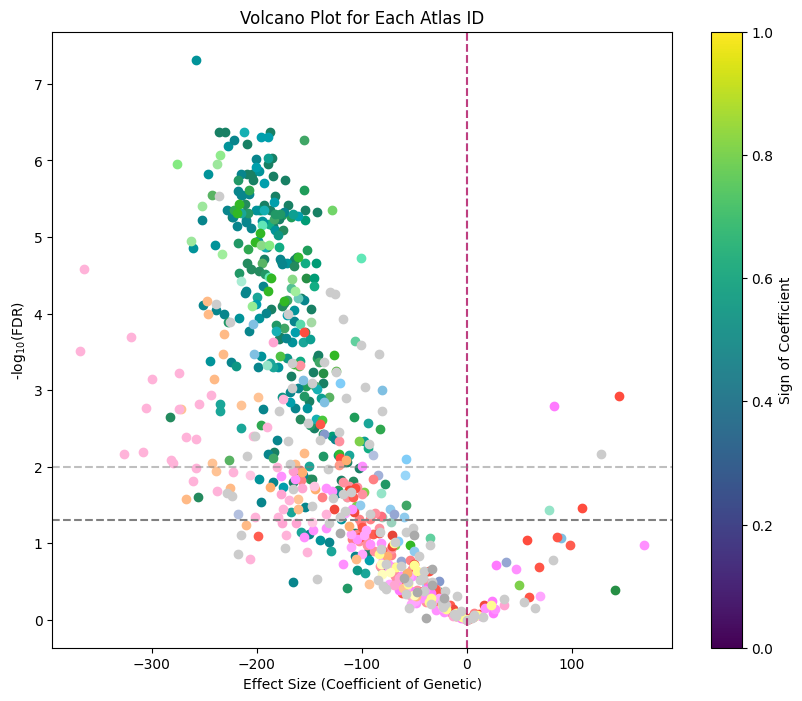

In [165]:
import os
import pandas as pd
import numpy as np
import statsmodels.api as sm
import statsmodels.formula.api as smf
import matplotlib.pyplot as plt
from statsmodels.stats.multitest import multipletests
import rpy2.robjects as robjects
# Rのインスタンスを取得
r = robjects.r
from rpy2.robjects import pandas2ri
pandas2ri.activate()
# Rのライブラリをロード
r = robjects.r
r('library(MASS)')
import numpy as np
import rpy2.robjects as robjects
import rpy2.robjects as ro
# Rのインスタンスを取得
r = robjects.r
from rpy2.robjects import pandas2ri
pandas2ri.activate()
# Rのライブラリをロード
r = robjects.r
r('library(MASS)')

def run_glm (data):
        
    # R環境にデータフレームを渡す
    ro.globalenv['data'] = pandas2ri.py2rpy(data)
    # pdfClusterを実行
    r_code = '''
    library(MASS)
    model <- glm.nb('log_All_cell_count ~ Age', data = data)
    coef <- summary(model)$coefficients["Age", "Estimate"]
    p_value <- summary(model)$coefficients["Age", "Pr(>|z|)"]
    c(coef, p_value)
    '''
    #results_ <- summary(model)
    #results_ <- summary(model)
    #p_value <- summary(model)$Coefficients["Genetic", "Pr(>|z|)"]
    #coef <- summary(model)$Coefficients["Genetic", "coef"]
    ro.r(r_code)

    results = ro.r(r_code)
    
    coef = results[0]
    p_value = results[1]
    print(f"Coefficient: {coef}, p-value: {p_value}")
    
    return coef, p_value


# サンプルごとにデータを読み込んで 'Condition' 列を追加する関数を修正
def load_data(sample_info):
    df_list = []
    for sample, condition in sample_info:  # sample_infoには(sample_path, condition)のタプルが格納されている
        param_path = f"/home/mitani/CUBIC-informatics/param/Neuronomics/{sample}/param_multichannel-rank.json"
        try:
            with open(param_path) as f:
                param = json.load(f)
            fw_dir_nu = param["dst_basedir"]

            cellome_file = fw_dir_nu + "/Regional_NearestNeighbor_Iba1_1_NN_corrected.csv"
            if os.path.exists(cellome_file):  # 確認するファイルパスに注意
                print(sample)
                df = pd.read_csv(cellome_file)
                df['Condition'] = condition  # 'Condition' 列を追加
                df['Sample'] = sample  # サンプル名を追加
                df_list.append(df)
        except Exception as e:
            print(f"Error loading data for {sample}: {e}")

    return pd.concat(df_list, ignore_index=True) if df_list else pd.DataFrame()

def run_linear_regression(data):
    # R環境にデータフレームを渡す
    ro.globalenv['data'] = pandas2ri.py2rpy(data)
    # lmを実行
    r_code = '''
    library(stats)  # lm() 関数を使うために必要
    model <- lm(log_All_cell_count ~ Age, data = data)
    coef <- summary(model)$coefficients["Age", "Estimate"]
    p_value <- summary(model)$coefficients["Age", "Pr(>|t|)"]
    c(coef, p_value)
    '''
    results = ro.r(r_code)
    
    coef = results[0]
    p_value = results[1]
    print(f"Coefficient: {coef}, p-value: {p_value}")
    
    return coef, p_value

# Healthy controlとDiseaseのサンプル情報のタプルを取得
#healthy_sample_info = [(s, c) for c in ["WT_1m", "WT_3m","WT_5m", "WT_7m", "WT_9m"] for s in conditions[c]]
disease_sample_info = [(s, c) for c in ["APP_1m", "APP_3m", "APP_5m", "APP_7m", "APP_9m"] for s in conditions[c]]
#healthy_sample_info = [(s, c) for c in ["WT_7m", "WT_9m"] for s in conditions[c]]
#disease_sample_info = [(s, c) for c in [  "APP_7m", "APP_9m"] for s in conditions[c]]

# データを読み込む
#healthy_data = load_data(healthy_sample_info)
disease_data = load_data(disease_sample_info)

# AgeとGeneticの列を追加
#healthy_data['Age'] = healthy_data['Condition'].str.extract('(\d+)m').astype(int)
#healthy_data['Genetic'] = 0  # Healthyは0
disease_data['Age'] = disease_data['Condition'].str.extract('(\d+)m').astype(int)
disease_data['Genetic'] = 1  # Diseaseは1

# データを結合
#all_data = pd.concat([healthy_data, disease_data])
all_data = disease_data

#all_data = normalize_and_calculate_difference(all_data)
all_data['log_All_cell_count'] = 0


# 線形回帰モデルの作成
results = {}
for atlas_id in all_data['atlasID'].unique():
    print(atlas_id)
    data = all_data[all_data['atlasID'] == atlas_id]

    data['log_All_cell_count'] = np.round(data['Normalized_NeuN_Neighbor_Distance'] * 10000)#+ 1000000)
    
    data.replace([np.inf, -np.inf], np.nan, inplace=True)
    
    data = data.dropna(subset=['log_All_cell_count'])
    
    all_data['log_All_cell_count'][all_data['atlasID'] == atlas_id] = data['log_All_cell_count'].copy()
    if data['log_All_cell_count'].sum() <= 0.0:
        results[atlas_id] = [0.0, 1.0]
        print(f"No non-zero data available for atlas ID {atlas_id}. Skipping...")
        continue
    #results[atlas_id] = run_glm(data)
    results[atlas_id] = run_linear_regression(data)

volcano_data = pd.DataFrame({
    'AtlasID': list(results.keys()),
    'coef': [result[0] for result in results.values()],
    'pvalue': [result[1] for result in results.values()]

})

# BH法による多重検定補正
volcano_data['pvalue'][volcano_data['pvalue'] == 0.0] = 1.0
_, p_adjusted, _, _ = multipletests(volcano_data['pvalue'], method='fdr_bh')

# 補正後のp-valueをデータフレームに追加
volcano_data['adjusted_pvalue'] =  p_adjusted
volcano_data['-log10(adjusted_pvalue)'] = -np.log10(volcano_data['adjusted_pvalue'])

# ID を基準にして volcano_data に RGB 値をマージ
volcano_data = pd.merge(volcano_data, data_GO[['id', 'R', 'G', 'B']], left_on='AtlasID', right_on='id', how='left')

# RGB 値を正規化
volcano_data['color'] = volcano_data.apply(lambda row: (row['R']/255, row['G']/255, row['B']/255), axis=1)

#volcano_data['log2(coef)'] = np.log2(volcano_data['coef'])

###########################

plt.rcParams['font.family'] = 'Arial'
plt.rcParams['font.size'] = 10  # Adjust the size as needed

# ボルカノプロットの描画
plt.figure(figsize=(10, 8))
for _, row in volcano_data.iterrows():
    plt.scatter(row['coef'], row['-log10(adjusted_pvalue)'], color=row['color'])

plt.xlabel("Effect Size (Coefficient of Genetic)")
plt.ylabel(r'-$\log_{10}$(FDR)')  # LaTeX形式で下付き文字を使用
plt.title('Volcano Plot for Each Atlas ID')
#plt.xlim(-0.5,0.5)
#plt.ylim(-0.5,10)
plt.axvline(x=-0.05, color='blue', linestyle='--', alpha = 0.5)
plt.axvline(x=0.05, color='red', linestyle='--', alpha = 0.5)
plt.axhline(y=-np.log10(0.05), color='grey', linestyle='--', alpha = 1.0)
plt.axhline(y=-np.log10(0.01), color='grey', linestyle='--', alpha = 0.5)
plt.colorbar(label='Sign of Coefficient')
plt.show()    


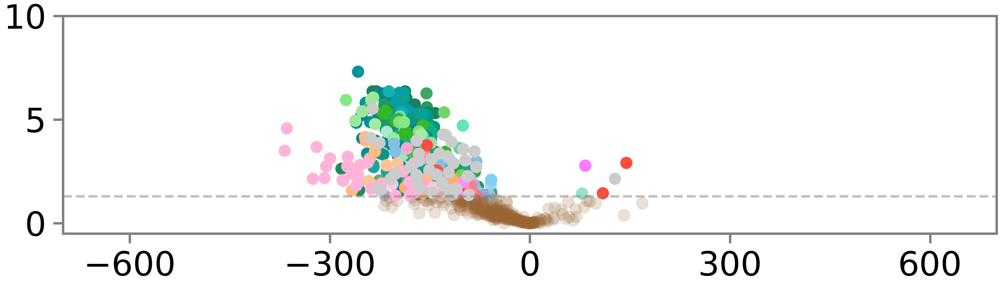

In [169]:
#volcano_data['log2(coef)'] = np.log2(volcano_data['coef'])

###########################

plt.rcParams['font.family'] = 'DejaVu Sans'
plt.rcParams['font.size'] = 70  # Adjust the size as needed
 

# ボルカノプロットの描画
plt.figure(figsize=(30, 7))

for _, row in volcano_data.iterrows(): 
    plt.scatter(row['coef'], row['-log10(adjusted_pvalue)'], 
                color=row['color'] if row['-log10(adjusted_pvalue)'] > -np.log10(0.05) else (0.6, 0.4, 0.2), 
                alpha = 1 if row['-log10(adjusted_pvalue)'] > -np.log10(0.05) else 0.2, 
                s = 600)

#plt.xlabel("Effect Size (Coefficient of Genetic)")
#plt.ylabel(r'-$\log_{10}$(FDR)')  # LaTeX形式で下付き文字を使用
#plt.title('Volcano Plot for Each Region')
# y軸をログスケールに設定
plt.xlim(-700, 700)
plt.ylim(-0.5, 10.0)
#plt.axvline(x=-0.05, color='blue', linestyle='--', alpha = 0.5)
#plt.axvline(x=0.05, color='red', linestyle='--', alpha = 0.5)
plt.axhline(y=-np.log10(0.05), color='grey', linestyle='--', alpha = 0.5, linewidth = 5)
#plt.axhline(y=-np.log10(0.01), color='grey', linestyle='--', alpha = 0.2)
#plt.colorbar(label='Sign of Coefficient')

# 枠線の色と太さの設定
alpha = 1.0  # 例としてalphaを0.5に設定
for spine in plt.gca().spines.values():
    spine.set_linewidth(5)
    spine.set_color((0.5, 0.5, 0.5, alpha))  # RGBA形式で色を指定
    
# 目盛りを外側に設定し、色をブラックに設定、目盛りラベルのパディングと太字設定
#plt.tick_params(axis='both', which='both', direction='out', length=20, width=5, colors='grey', pad=25)
plt.tick_params(axis='both', which='both', direction='out', length=20, width=5, colors='grey', pad=15, labelcolor='black')

# x軸とy軸の目盛りの位置を設定して数を半分にする
plt.gca().set_xticks(np.linspace(-600, 600, 5))  # 7個の目盛り
plt.gca().set_yticks(np.linspace(0, 10, 3).astype(int))  # 6個の目盛り

# 目盛りラベルを取得して太字に設定
#for tick in plt.gca().get_xticklabels():
#    tick.set_fontweight('bold')
#for tick in plt.gca().get_yticklabels():
#    tick.set_fontweight('bold')
    
    
# レイアウトを調整してから保存
plt.tight_layout()
plt.subplots_adjust(left=0.05, right=0.95, top=0.95, bottom=0.05)
    
# 透明な背景で保存
plt.savefig('/data5/mitani/Neurology/Extended Data Fig.5/APP_1m_9m_Microglia_NN_corrected_volcano_with_limit_FDR_10_coef_0.6.pdf', 
            transparent=True, dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()

In [170]:
significant_region_ids4 = volcano_data[(volcano_data["adjusted_pvalue"]<0.05)&(volcano_data["coef"]<0.0)]
significant_region_ids4 = significant_region_ids4["AtlasID"]

In [171]:
significant_region_ids5 = volcano_data[(volcano_data["adjusted_pvalue"]<0.05)&(volcano_data["coef"]>0.0)]
significant_region_ids5 = significant_region_ids5["AtlasID"]

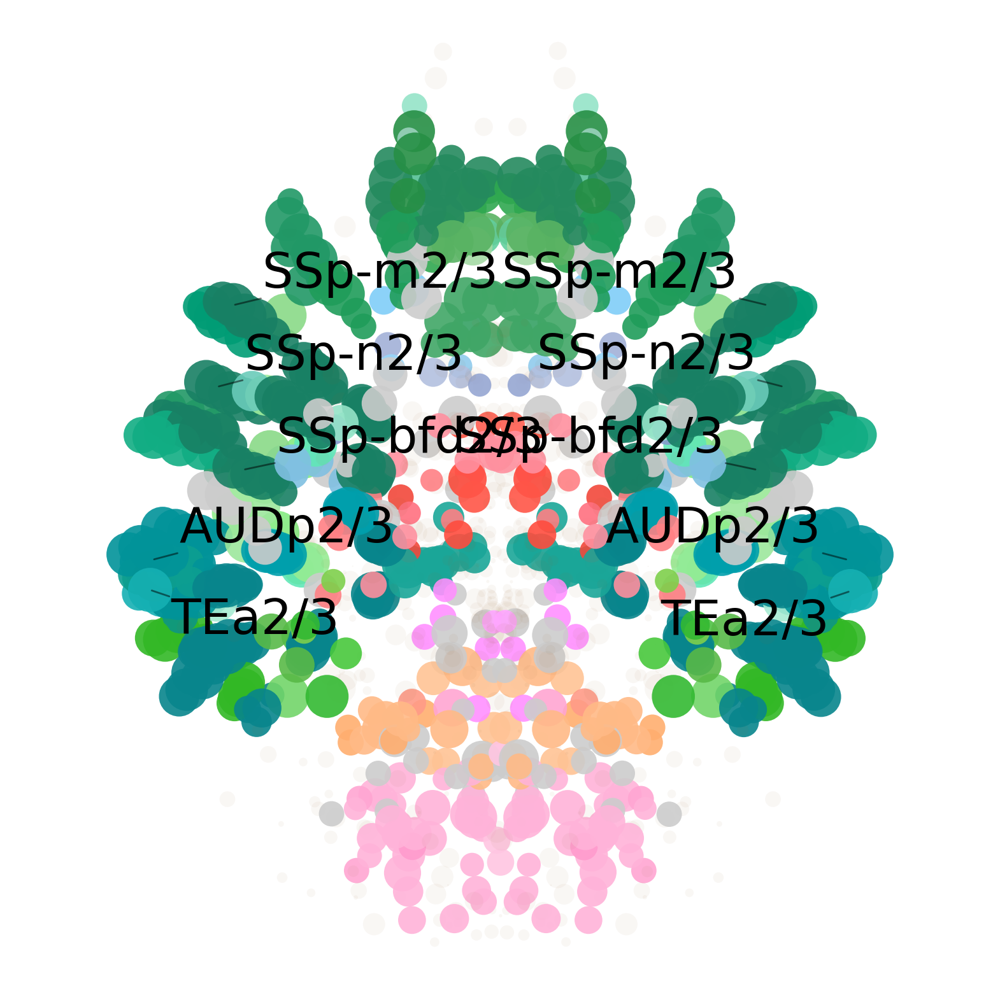

In [172]:
import matplotlib.pyplot as plt
import pandas as pd
from adjustText import adjust_text  # adjustText ライブラリをインポート

# volcano_dataをインデックス化
# マッピングの前に、型が一致していることを確認（必要に応じて型変換）
#all_centroids['atlasID'] = all_centroids['atlasID'].astype(volcano_indexed.index.dtype)

# all_centroidsに -log10(adjusted_pvalue), coef, およびacronymsをマッピング
all_centroids['adjusted_pvalue'] = all_centroids['atlasID'].map(volcano_data.set_index('AtlasID')['adjusted_pvalue'])
all_centroids['-log10(adjusted_pvalue)'] = all_centroids['atlasID'].map(volcano_data.set_index('AtlasID')['-log10(adjusted_pvalue)'])
all_centroids['coef'] = all_centroids['atlasID'].map(volcano_data.set_index('AtlasID')['coef'])
all_centroids['acronym'] = all_centroids['atlasID'].map(data_id.set_index('id')['acronym'])

# 条件に合致し、adjusted_pvalueが最小の上位5つを抽出
top_acronyms = all_centroids[(all_centroids['adjusted_pvalue'] < 0.05) & (all_centroids['coef'] < 0.0)]
top_acronyms = top_acronyms.nsmallest(10, 'adjusted_pvalue')

# グラフのプロット
plt.figure(figsize=(20, 20))
plt.gca().invert_yaxis()
texts = []  # テキストオブジェクトを保存するリスト

plt.rcParams['font.family'] = 'DejaVu Sans'
plt.rcParams['font.size'] = 10


# adjusted p value limit is 0.00001. -log10(adjusted_pvalue) < 5
for i, row in all_centroids.iterrows():
    color = row['color'] if row['adjusted_pvalue'] < 0.05 and row['coef'] < 0.0 else (0.6, 0.4, 0.2)
    alpha = 0.9 if row['adjusted_pvalue'] < 0.05 and row['coef'] < 0.0 else 0.05
    plt.scatter(row['X(um)'], row['Y(um)'],
                s=500 * row['-log10(adjusted_pvalue)'] if 500 * row['-log10(adjusted_pvalue)'] < 500 * 5 else 500 * 5,
                color=color, alpha=alpha, edgecolor='none')
    
    # 上位5位の点のみにテキストを追加（`atlasID` を使用して比較）
    if row['atlasID'] in top_acronyms['atlasID'].values:
        texts.append(plt.text(row['X(um)'], row['Y(um)'], row['acronym'],
                              ha='center', va='center', fontsize=55, color="black", fontweight='regular'))

# 調整されたテキストに対してadjust_textを適用し、アローをグレーで追加
adjust_text(texts, 
            arrowprops=dict(arrowstyle='-', color=(0, 0, 0), alpha = 0.5, linewidth=2),
            #expand_points=(1., 1.),  # ポイントからの距離を広げる
            #expand_text=(1., 1.),    # テキスト間の距離を広げる
            #force_text=(1., 1.),     # テキストを動かす力を強める
            #force_points=(1., 1.)   # ポイントを動かす力を強める
            
            expand_points=(1.3, 1.3),  # ポイントからの距離を広げる
            expand_text=(1., 1.),    # テキスト間の距離を広げる
            force_text=(1., 1.),     # テキストを動かす力を強める
            force_points=(1., 1.)   # ポイントを動かす力を強める
           )

#plt.title('Whole brain plot of 2nd batch VCP-WT vs VCP-mutant Microglia increase')
#plt.xlabel('X (um)')
#plt.ylabel('Y (um)')
plt.axis('equal')

plt.gca().spines['top'].set_visible(False)  # 上の軸線を非表示
plt.gca().spines['right'].set_visible(False)  # 右の軸線を非表示
plt.gca().spines['left'].set_visible(False)  # 左の軸線を非表示
plt.gca().spines['bottom'].set_visible(False)  # 下の軸線を非表示
plt.xticks([])  # X軸の目盛りを非表示
plt.yticks([])  # Y軸の目盛りを非表示

plt.savefig('/data5/mitani/Neurology/Extended Data Fig.5/APP_1m_9m_Microglia_NN_corrected_decrease_with_limit_FDR_5.pdf', 
            transparent=True, dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()

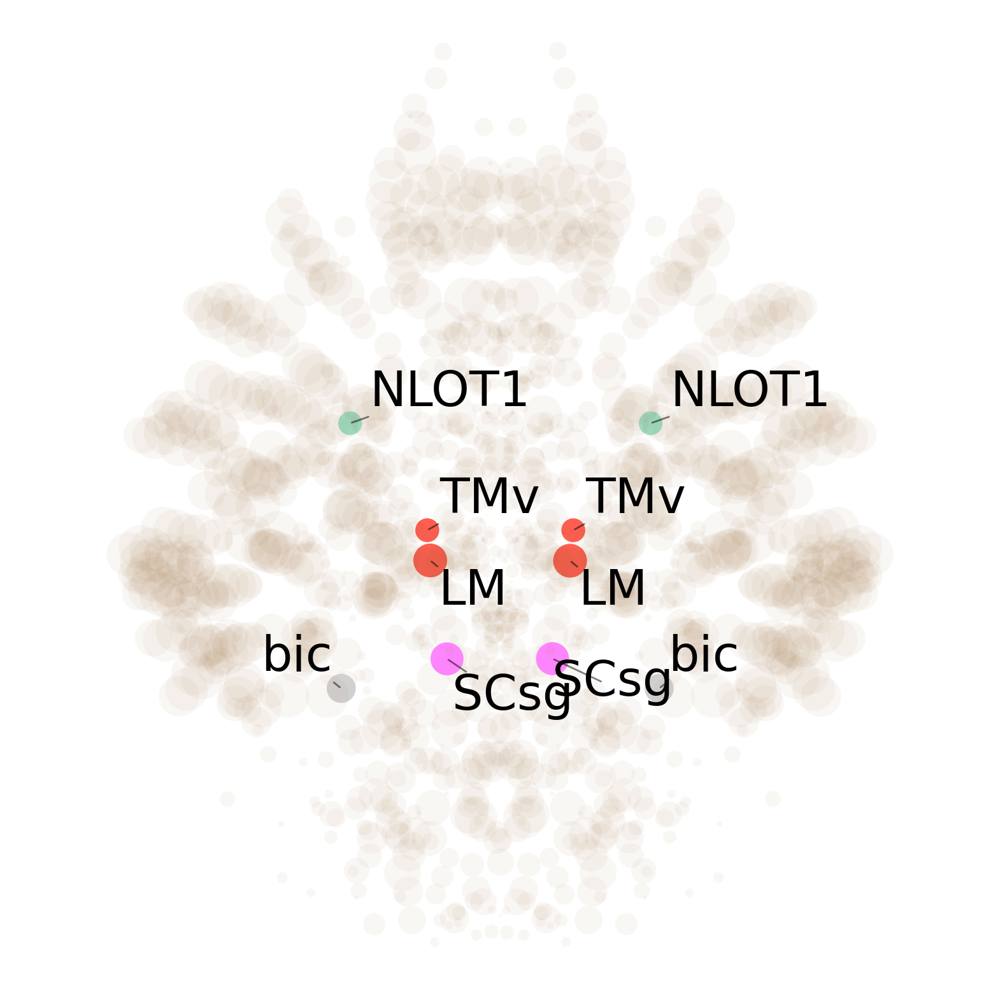

In [173]:
import matplotlib.pyplot as plt
import pandas as pd
from adjustText import adjust_text  # adjustText ライブラリをインポート

# volcano_dataをインデックス化
# マッピングの前に、型が一致していることを確認（必要に応じて型変換）
#all_centroids['atlasID'] = all_centroids['atlasID'].astype(volcano_indexed.index.dtype)

# all_centroidsに -log10(adjusted_pvalue), coef, およびacronymsをマッピング
all_centroids['adjusted_pvalue'] = all_centroids['atlasID'].map(volcano_data.set_index('AtlasID')['adjusted_pvalue'])
all_centroids['-log10(adjusted_pvalue)'] = all_centroids['atlasID'].map(volcano_data.set_index('AtlasID')['-log10(adjusted_pvalue)'])
all_centroids['coef'] = all_centroids['atlasID'].map(volcano_data.set_index('AtlasID')['coef'])
all_centroids['acronym'] = all_centroids['atlasID'].map(data_id.set_index('id')['acronym'])

# 条件に合致し、adjusted_pvalueが最小の上位5つを抽出
top_acronyms = all_centroids[(all_centroids['adjusted_pvalue'] < 0.05) & (all_centroids['coef'] > 0.0)]
top_acronyms = top_acronyms.nsmallest(10, 'adjusted_pvalue')

# グラフのプロット
plt.figure(figsize=(20, 20))
plt.gca().invert_yaxis()
texts = []  # テキストオブジェクトを保存するリスト

plt.rcParams['font.family'] = 'DejaVu Sans'
plt.rcParams['font.size'] = 10


# adjusted p value limit is 0.00001. -log10(adjusted_pvalue) < 5
for i, row in all_centroids.iterrows():
    color = row['color'] if row['adjusted_pvalue'] < 0.05 and row['coef'] > 0.0 else (0.6, 0.4, 0.2)
    alpha = 0.9 if row['adjusted_pvalue'] < 0.05 and row['coef'] > 0.0 else 0.05
    plt.scatter(row['X(um)'], row['Y(um)'],
                s=500 * row['-log10(adjusted_pvalue)'] if 500 * row['-log10(adjusted_pvalue)'] < 500 * 5 else 500 * 5,
                color=color, alpha=alpha, edgecolor='none')
    
    # 上位5位の点のみにテキストを追加（`atlasID` を使用して比較）
    if row['atlasID'] in top_acronyms['atlasID'].values:
        texts.append(plt.text(row['X(um)'], row['Y(um)'], row['acronym'],
                              ha='center', va='center', fontsize=55, color="black", fontweight='regular'))

# 調整されたテキストに対してadjust_textを適用し、アローをグレーで追加
adjust_text(texts, 
            arrowprops=dict(arrowstyle='-', color=(0, 0, 0), alpha = 0.5, linewidth=2),
            #expand_points=(1., 1.),  # ポイントからの距離を広げる
            #expand_text=(1., 1.),    # テキスト間の距離を広げる
            #force_text=(1., 1.),     # テキストを動かす力を強める
            #force_points=(1., 1.)   # ポイントを動かす力を強める
            
            expand_points=(1.3, 1.3),  # ポイントからの距離を広げる
            expand_text=(1., 1.),    # テキスト間の距離を広げる
            force_text=(1., 1.),     # テキストを動かす力を強める
            force_points=(1., 1.)   # ポイントを動かす力を強める
           )

#plt.title('Whole brain plot of 2nd batch VCP-WT vs VCP-mutant Microglia increase')
#plt.xlabel('X (um)')
#plt.ylabel('Y (um)')
plt.axis('equal')

plt.gca().spines['top'].set_visible(False)  # 上の軸線を非表示
plt.gca().spines['right'].set_visible(False)  # 右の軸線を非表示
plt.gca().spines['left'].set_visible(False)  # 左の軸線を非表示
plt.gca().spines['bottom'].set_visible(False)  # 下の軸線を非表示
plt.xticks([])  # X軸の目盛りを非表示
plt.yticks([])  # Y軸の目盛りを非表示

plt.savefig('/data5/mitani/Neurology/Extended Data Fig.5/APP_1m_9m_Microglia_NN_corrected_increase_with_limit_FDR_5.pdf', 
            transparent=True, dpi=300, bbox_inches='tight', pad_inches=0.1)
plt.show()

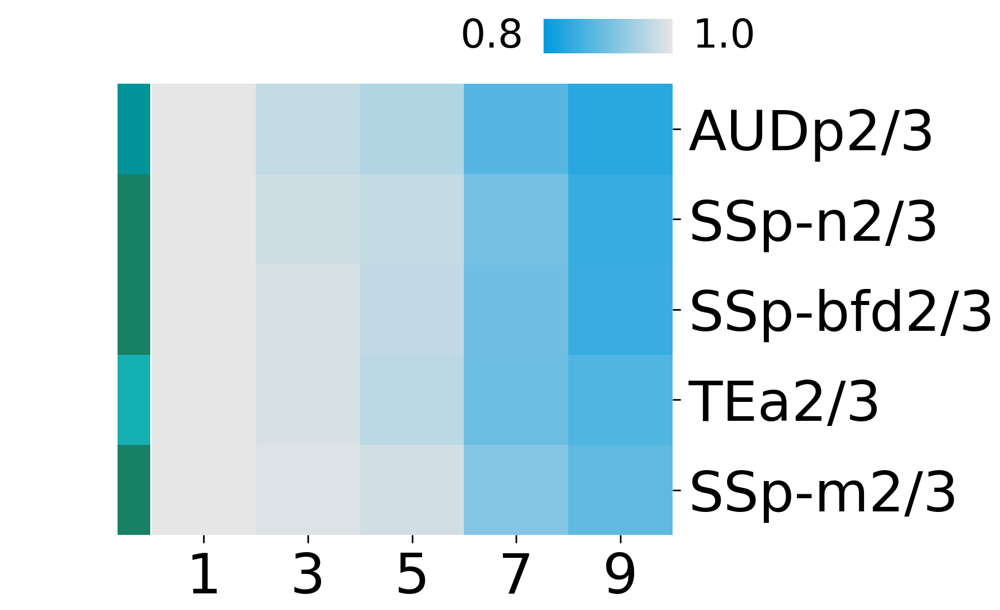

In [174]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
import matplotlib.colors as mcolors

plt.rcParams['font.family'] = 'DejaVu Sans'
plt.rcParams['font.size'] = 70
plt.rcParams['font.weight'] = 'regular'

# Load and extract data
data = all_data[np.isin(all_data["atlasID"], significant_region_ids4)]  # load_and_extract_data(sample_info, conditions)

# Pivot the data for heatmap and calculate mean density for each atlasID and condition
data_pivot = data.pivot_table(index='atlasID', columns='Condition', values='log_All_cell_count', aggfunc='mean')
# Fill NaN with column means and check if entire columns were NaN
data_pivot = data_pivot.apply(lambda col: col.fillna(col.mean()) if not col.isnull().all() else col.fillna(0))

# Normalize data by row using Z-score, and handle zero variance by replacing NaNs in the result with 0
data_normalized = data_pivot.div(data_pivot['APP_1m'], axis=0)

# significant_region_ids5に基づいてadjusted_pvalueを抽出し、-log10(adjusted_pvalue)を計算
log_adjusted_pvalues = pd.Series(data_normalized.index.map(volcano_data.set_index('AtlasID')['-log10(adjusted_pvalue)']), index=data_normalized.index)
# data_normalizedを-log10(adjusted_pvalue)の順にソート
data_normalized_sorted = data_normalized.loc[log_adjusted_pvalues.sort_values(ascending=False).index]

# 上位5つの行だけを選択
top5_data_normalized_sorted = data_normalized_sorted.head(5)

# acronymのインデックスを追加し、ソート
acronyms = data_id.set_index('id').loc[data_normalized.index, 'acronym']
acronyms_sorted = acronyms.loc[log_adjusted_pvalues.sort_values(ascending=False).index]

# 上位5つのアクロニムを選択
top5_acronyms_sorted = acronyms_sorted.head(5)

# Custom color map creation: gray to magenta
colors = [(0.0, 154/255, 222/255), (0.9, 0.9, 0.9)] 
cmap = mcolors.LinearSegmentedColormap.from_list('custom_gray_magenta', colors)



# Sort the top 5 rows by 'newVCP_mut_2m' in descending order
top5_data_normalized_sorted = top5_data_normalized_sorted.sort_values(by='APP_9m', ascending=True)
top5_acronyms_sorted = top5_acronyms_sorted.loc[top5_data_normalized_sorted.index]

colorlist = []

for atlas_id in top5_acronyms_sorted.index:
    for i in range(671):
        if data_GO["id"].values[i] == atlas_id:
            colorlist.append((data_GO["R"].values[i] / 255, data_GO["G"].values[i] / 255, data_GO["B"].values[i] / 255))
colorlist_671 = colorlist

# Custom x-axis labels
custom_labels = ['1', '3', '5', '7', '9']

# Check if top5_data_normalized_sorted contains any NaN
if top5_data_normalized_sorted.isnull().any().any():
    print("Data contains NaNs or infinite values, which cannot be clustered.")
else:
    # Cluster map creation
    vmin = 0.8
    vmax = 1.0
    g = sns.clustermap(top5_data_normalized_sorted, row_colors=colorlist_671[:5], cmap=cmap, vmin=vmin, vmax=vmax, row_cluster=False, col_cluster=False, figsize=(15, 12))
    
    g.ax_heatmap.set_yticklabels(top5_acronyms_sorted, rotation=0)
    g.ax_heatmap.set_xlabel('')
    g.ax_heatmap.set_ylabel('')

    g.cax.set_visible(False)

    # Set custom x-axis labels
    g.ax_heatmap.set_xticklabels(custom_labels, rotation=0)
    g.ax_heatmap.tick_params(axis='both', which='both', length=10, width=2, pad=10)

    # Create a new color bar axis below the heatmap
    cbar_ax = g.fig.add_axes([0.75, 0.81, 0.15, 0.05])  # Right-aligned and 1/3 width
    norm = plt.Normalize(vmin=vmin, vmax=vmax)
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    cb = g.fig.colorbar(sm, cax=cbar_ax, orientation='horizontal')

    # Remove the black border around the color bar
    cb.outline.set_visible(False)

    # Set color bar ticks
    cb.set_ticks([])  # Remove default ticks
    # Add custom labels next to the color bar
    cbar_ax.text(-0.4, 0.5, str(vmin), va='center', ha='center', transform=cbar_ax.transAxes, fontsize=50, fontweight='regular')
    cbar_ax.text(1.4, 0.5, str(vmax), va='center', ha='center', transform=cbar_ax.transAxes, fontsize=50, fontweight='regular')

    plt.savefig('/data5/mitani/Neurology/Extended Data Fig.5/APP_1m_9m_Microglia_NN_corrected_decrease_top5_sorted_heatmap.pdf', 
            transparent=True, dpi=300, bbox_inches='tight', pad_inches=0.1)
    plt.show()

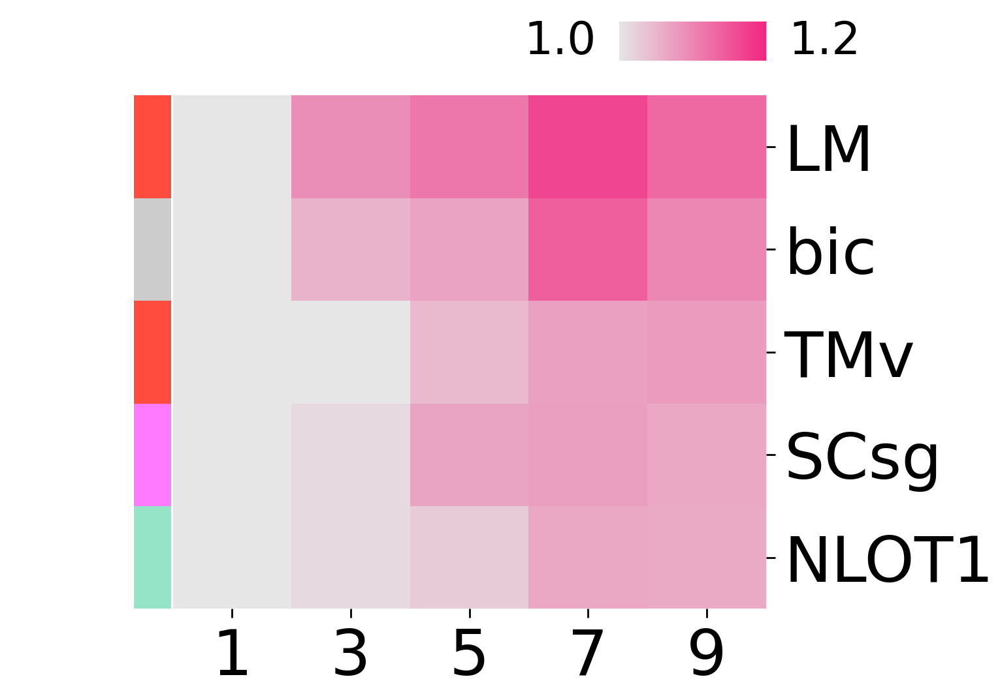

In [175]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
import matplotlib.colors as mcolors

plt.rcParams['font.family'] = 'DejaVu Sans'
plt.rcParams['font.size'] = 70
plt.rcParams['font.weight'] = 'regular'

# Load and extract data
data = all_data[np.isin(all_data["atlasID"], significant_region_ids5)]  # load_and_extract_data(sample_info, conditions)

# Pivot the data for heatmap and calculate mean density for each atlasID and condition
data_pivot = data.pivot_table(index='atlasID', columns='Condition', values='log_All_cell_count', aggfunc='mean')
# Fill NaN with column means and check if entire columns were NaN
data_pivot = data_pivot.apply(lambda col: col.fillna(col.mean()) if not col.isnull().all() else col.fillna(0))

# Normalize data by row using Z-score, and handle zero variance by replacing NaNs in the result with 0
data_normalized = data_pivot.div(data_pivot['APP_1m'], axis=0)

# significant_region_ids5に基づいてadjusted_pvalueを抽出し、-log10(adjusted_pvalue)を計算
log_adjusted_pvalues = pd.Series(data_normalized.index.map(volcano_data.set_index('AtlasID')['-log10(adjusted_pvalue)']), index=data_normalized.index)
# data_normalizedを-log10(adjusted_pvalue)の順にソート
data_normalized_sorted = data_normalized.loc[log_adjusted_pvalues.sort_values(ascending=False).index]

# 上位5つの行だけを選択
top5_data_normalized_sorted = data_normalized_sorted.head(5)

# acronymのインデックスを追加し、ソート
acronyms = data_id.set_index('id').loc[data_normalized.index, 'acronym']
acronyms_sorted = acronyms.loc[log_adjusted_pvalues.sort_values(ascending=False).index]

# 上位5つのアクロニムを選択
top5_acronyms_sorted = acronyms_sorted.head(5)

# Custom color map creation: gray to magenta
colors = [(0.9, 0.9, 0.9), (0.95, 0.15, 0.5)]
cmap = mcolors.LinearSegmentedColormap.from_list('custom_gray_magenta', colors)



# Sort the top 5 rows by 'newVCP_mut_2m' in descending order
top5_data_normalized_sorted = top5_data_normalized_sorted.sort_values(by='APP_9m', ascending=False)
top5_acronyms_sorted = top5_acronyms_sorted.loc[top5_data_normalized_sorted.index]

colorlist = []

for atlas_id in top5_acronyms_sorted.index:
    for i in range(671):
        if data_GO["id"].values[i] == atlas_id:
            colorlist.append((data_GO["R"].values[i] / 255, data_GO["G"].values[i] / 255, data_GO["B"].values[i] / 255))
colorlist_671 = colorlist

# Custom x-axis labels
custom_labels = ['1', '3', '5', '7', '9']

# Check if top5_data_normalized_sorted contains any NaN
if top5_data_normalized_sorted.isnull().any().any():
    print("Data contains NaNs or infinite values, which cannot be clustered.")
else:
    # Cluster map creation
    vmin = 1.0
    vmax = 1.2
    g = sns.clustermap(top5_data_normalized_sorted, row_colors=colorlist_671[:5], cmap=cmap, vmin=vmin, vmax=vmax, row_cluster=False, col_cluster=False, figsize=(15, 12))
    
    g.ax_heatmap.set_yticklabels(top5_acronyms_sorted, rotation=0)
    g.ax_heatmap.set_xlabel('')
    g.ax_heatmap.set_ylabel('')

    g.cax.set_visible(False)

    # Set custom x-axis labels
    g.ax_heatmap.set_xticklabels(custom_labels, rotation=0)
    g.ax_heatmap.tick_params(axis='both', which='both', length=10, width=2, pad=10)

    # Create a new color bar axis below the heatmap
    cbar_ax = g.fig.add_axes([0.75, 0.81, 0.15, 0.05])  # Right-aligned and 1/3 width
    norm = plt.Normalize(vmin=vmin, vmax=vmax)
    sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
    sm.set_array([])
    cb = g.fig.colorbar(sm, cax=cbar_ax, orientation='horizontal')

    # Remove the black border around the color bar
    cb.outline.set_visible(False)

    # Set color bar ticks
    cb.set_ticks([])  # Remove default ticks
    # Add custom labels next to the color bar
    cbar_ax.text(-0.4, 0.5, str(vmin), va='center', ha='center', transform=cbar_ax.transAxes, fontsize=50, fontweight='regular')
    cbar_ax.text(1.4, 0.5, str(vmax), va='center', ha='center', transform=cbar_ax.transAxes, fontsize=50, fontweight='regular')

    plt.savefig('/data5/mitani/Neurology/Extended Data Fig.5/APP_1m_9m_Microglia_NN_corrected_increase_top5_sorted_heatmap.pdf', 
            transparent=True, dpi=300, bbox_inches='tight', pad_inches=0.1)
    plt.show()

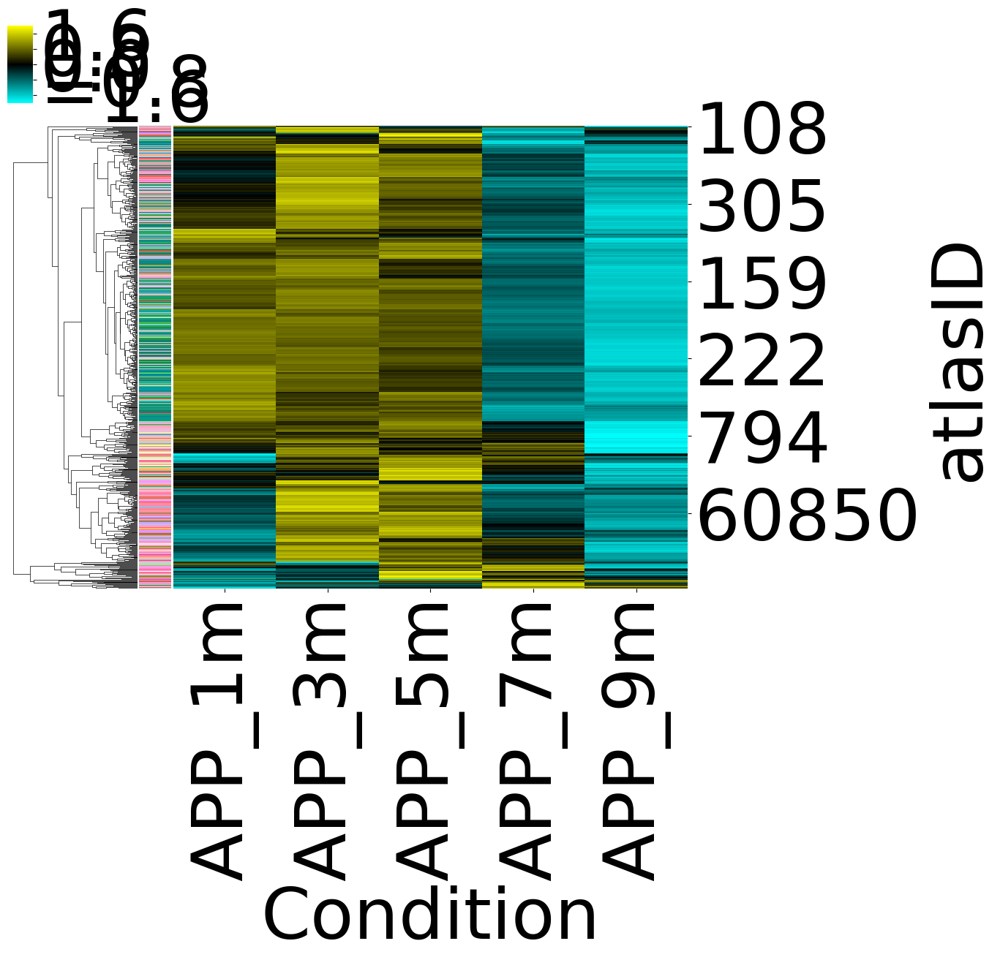

In [176]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import zscore
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.colors as mcolors
import json


# Function to load data and extract 'Iba1+ density (/mm3)' with Condition
def load_and_extract_data(sample_info, conditions):
    df_list = []
    for sample, condition in sample_info:
        param_path = f"/home/mitani/CUBIC-informatics/param/Neuronomics/{sample}/param_multichannel-rank.json"
        try:
            with open(param_path) as f:
                param = json.load(f)
            fw_dir_nu = param["dst_basedir"]
            cellome_file = fw_dir_nu + "/Regional_cellome4.csv"
            if os.path.exists(cellome_file):
                df = pd.read_csv(cellome_file)
                df['Condition'] = condition
                df['Sample'] = sample
                df_list.append(df[['atlasID','NeuN+ density (/mm3)', 'Iba1+ density (/mm3)', 'Condition']])
            else:
                print(f"File not found: {cellome_file}")
        except Exception as e:
            print(f"Error loading data for {sample}: {e}")
    
    return pd.concat(df_list, ignore_index=True) if df_list else pd.DataFrame()


# Prepare sample info
sample_info = [(s, c) for c in ["APP_1m", "APP_3m", "APP_5m", "APP_7m", "APP_9m"] for s in conditions[c]]

# Load and extract data
data = all_data[(all_data["Genetic"] == 1) ]#load_and_extract_data(sample_info, conditions)

# Pivot the data for heatmap and calculate mean density for each atlasID and condition
data_pivot = data.pivot_table(index='atlasID', columns='Condition', values='log_All_cell_count', aggfunc='mean')
# Fill NaN with column means and check if entire columns were NaN
data_pivot = data_pivot.apply(lambda col: col.fillna(col.mean()) if not col.isnull().all() else col.fillna(0))

# Normalize data by row using Z-score, and handle zero variance by replacing NaNs in the result with 0
data_normalized = data_pivot.apply(zscore, axis=1).fillna(0)

# Custom color map creation
def create_custom_cmap():
    # Colors: cyan-like, black, yellow-like
    colors = ["#00ffff", "#000000", "#ffff00"]
    cmap_name = "custom_cmap"
    
    # Create a colormap with interpolation between specified colors
    cmap = mcolors.LinearSegmentedColormap.from_list(cmap_name, colors)
    
    return cmap

colorlist=[]

total = 0

for atlas_id in data_pivot.index:
    for i in range (671):
        if data_GO["id"].values[i] == atlas_id:
            colorlist.append((data_GO["R"].values[i]/255,data_GO["G"].values[i]/255,data_GO["B"].values[i]/255))
    colorlist_671=colorlist

# Using the new custom colormap
cmap = create_custom_cmap()

# Check if data_normalized contains any NaN
if data_normalized.isnull().any().any():
    print("Data contains NaNs or infinite values, which cannot be clustered.")
else:
    # Cluster map creation
    sns.clustermap(data_normalized, row_colors=colorlist_671,method="average", cmap=cmap,  vmin=-2, vmax=2, row_cluster=True, col_cluster=False, figsize=(12, 10))
    plt.show()

In [177]:
# CSVファイルとして保存
data_pivot.to_csv('/data4/Region/APP_raw_value_regions_Iba1_NN_corrected_all.csv', index=True)

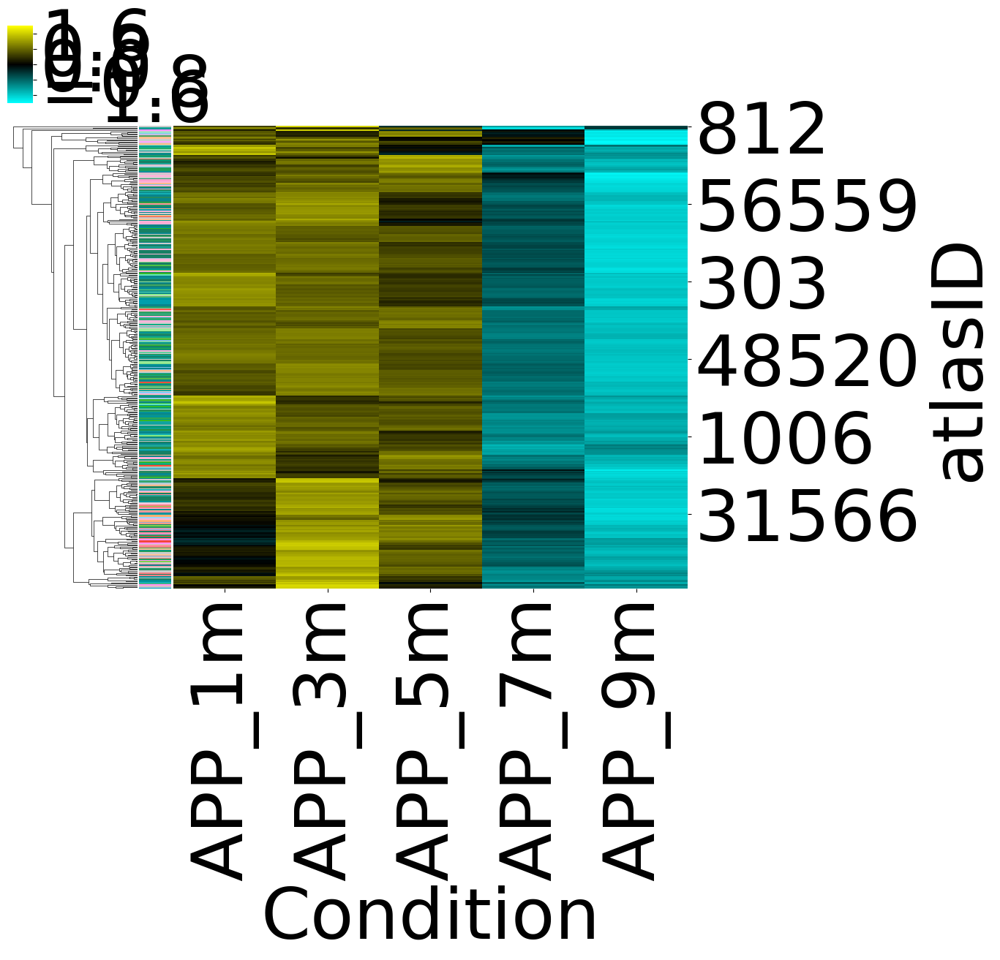

In [178]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import zscore
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.colors as mcolors
import json


# Function to load data and extract 'Iba1+ density (/mm3)' with Condition
def load_and_extract_data(sample_info, conditions):
    df_list = []
    for sample, condition in sample_info:
        param_path = f"/home/mitani/CUBIC-informatics/param/Neuronomics/{sample}/param_multichannel-rank.json"
        try:
            with open(param_path) as f:
                param = json.load(f)
            fw_dir_nu = param["dst_basedir"]
            cellome_file = fw_dir_nu + "/Regional_cellome4.csv"
            if os.path.exists(cellome_file):
                df = pd.read_csv(cellome_file)
                df['Condition'] = condition
                df['Sample'] = sample
                df_list.append(df[['atlasID','NeuN+ density (/mm3)', 'Iba1+ density (/mm3)', 'Condition']])
            else:
                print(f"File not found: {cellome_file}")
        except Exception as e:
            print(f"Error loading data for {sample}: {e}")
    
    return pd.concat(df_list, ignore_index=True) if df_list else pd.DataFrame()


# Prepare sample info
sample_info = [(s, c) for c in ["APP_1m", "APP_3m", "APP_5m", "APP_7m", "APP_9m"] for s in conditions[c]]

# Load and extract data
data = all_data[(all_data["Genetic"] == 1) & np.isin(all_data["atlasID"],significant_region_ids4)]#load_and_extract_data(sample_info, conditions)

# Pivot the data for heatmap and calculate mean density for each atlasID and condition
data_pivot = data.pivot_table(index='atlasID', columns='Condition', values='log_All_cell_count', aggfunc='mean')
# Fill NaN with column means and check if entire columns were NaN
data_pivot = data_pivot.apply(lambda col: col.fillna(col.mean()) if not col.isnull().all() else col.fillna(0))

# Normalize data by row using Z-score, and handle zero variance by replacing NaNs in the result with 0
data_normalized = data_pivot.apply(zscore, axis=1).fillna(0)

# Custom color map creation
def create_custom_cmap():
    # Colors: cyan-like, black, yellow-like
    colors = ["#00ffff", "#000000", "#ffff00"]
    cmap_name = "custom_cmap"
    
    # Create a colormap with interpolation between specified colors
    cmap = mcolors.LinearSegmentedColormap.from_list(cmap_name, colors)
    
    return cmap

colorlist=[]

total = 0

for atlas_id in data_pivot.index:
    for i in range (671):
        if data_GO["id"].values[i] == atlas_id:
            colorlist.append((data_GO["R"].values[i]/255,data_GO["G"].values[i]/255,data_GO["B"].values[i]/255))
    colorlist_671=colorlist

# Using the new custom colormap
cmap = create_custom_cmap()

# Check if data_normalized contains any NaN
if data_normalized.isnull().any().any():
    print("Data contains NaNs or infinite values, which cannot be clustered.")
else:
    # Cluster map creation
    sns.clustermap(data_normalized, row_colors=colorlist_671,method="average", cmap=cmap,  vmin=-2, vmax=2, row_cluster=True, col_cluster=False, figsize=(12, 10))
    plt.show()

In [179]:
# CSVファイルとして保存
data_pivot.to_csv('/data4/Region/APP_raw_value_regions_Iba1_NN_corrected_decrease.csv', index=True)

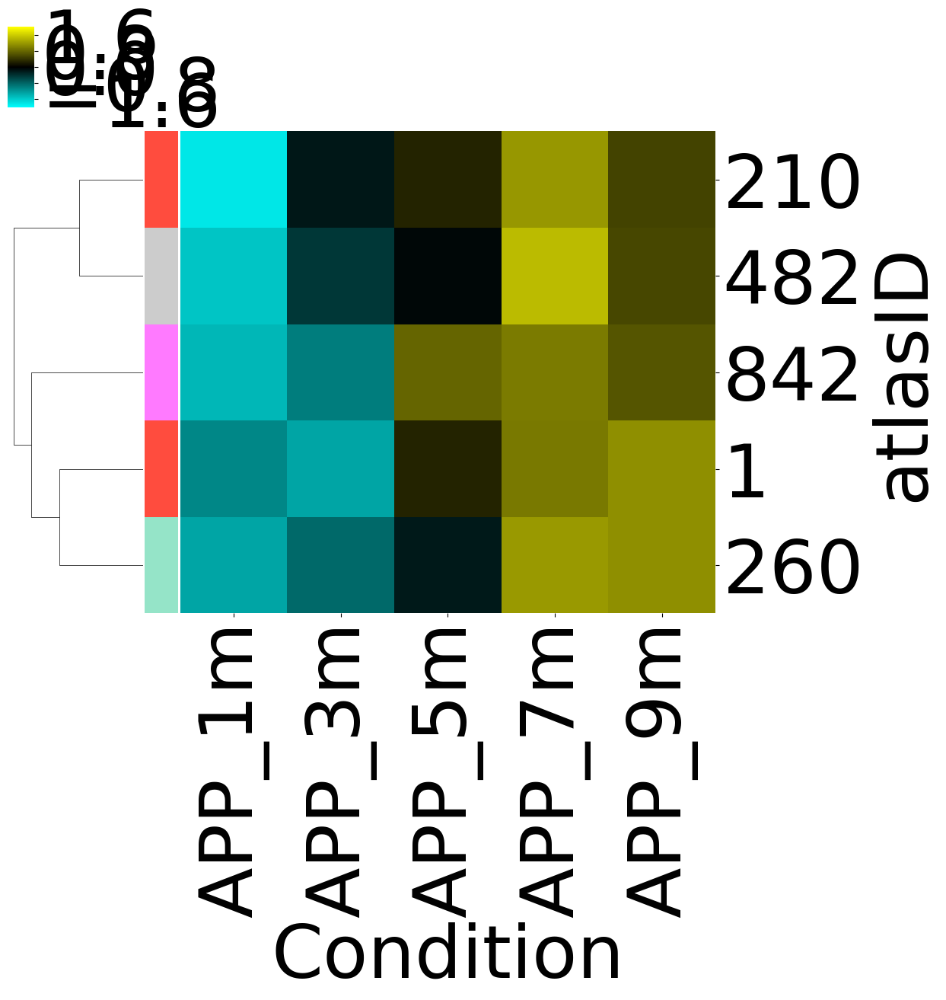

In [180]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import zscore
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.colors as mcolors
import json


# Function to load data and extract 'Iba1+ density (/mm3)' with Condition
def load_and_extract_data(sample_info, conditions):
    df_list = []
    for sample, condition in sample_info:
        param_path = f"/home/mitani/CUBIC-informatics/param/Neuronomics/{sample}/param_multichannel-rank.json"
        try:
            with open(param_path) as f:
                param = json.load(f)
            fw_dir_nu = param["dst_basedir"]
            cellome_file = fw_dir_nu + "/Regional_cellome4.csv"
            if os.path.exists(cellome_file):
                df = pd.read_csv(cellome_file)
                df['Condition'] = condition
                df['Sample'] = sample
                df_list.append(df[['atlasID','NeuN+ density (/mm3)', 'Iba1+ density (/mm3)', 'Condition']])
            else:
                print(f"File not found: {cellome_file}")
        except Exception as e:
            print(f"Error loading data for {sample}: {e}")
    
    return pd.concat(df_list, ignore_index=True) if df_list else pd.DataFrame()


# Prepare sample info
sample_info = [(s, c) for c in ["APP_1m", "APP_3m", "APP_5m", "APP_7m", "APP_9m"] for s in conditions[c]]

# Load and extract data
data = all_data[(all_data["Genetic"] == 1) & np.isin(all_data["atlasID"],significant_region_ids5)]#load_and_extract_data(sample_info, conditions)

# Pivot the data for heatmap and calculate mean density for each atlasID and condition
data_pivot = data.pivot_table(index='atlasID', columns='Condition', values='log_All_cell_count', aggfunc='mean')
# Fill NaN with column means and check if entire columns were NaN
data_pivot = data_pivot.apply(lambda col: col.fillna(col.mean()) if not col.isnull().all() else col.fillna(0))

# Normalize data by row using Z-score, and handle zero variance by replacing NaNs in the result with 0
data_normalized = data_pivot.apply(zscore, axis=1).fillna(0)

# Custom color map creation
def create_custom_cmap():
    # Colors: cyan-like, black, yellow-like
    colors = ["#00ffff", "#000000", "#ffff00"]
    cmap_name = "custom_cmap"
    
    # Create a colormap with interpolation between specified colors
    cmap = mcolors.LinearSegmentedColormap.from_list(cmap_name, colors)
    
    return cmap

colorlist=[]

total = 0

for atlas_id in data_pivot.index:
    for i in range (671):
        if data_GO["id"].values[i] == atlas_id:
            colorlist.append((data_GO["R"].values[i]/255,data_GO["G"].values[i]/255,data_GO["B"].values[i]/255))
    colorlist_671=colorlist

# Using the new custom colormap
cmap = create_custom_cmap()

# Check if data_normalized contains any NaN
if data_normalized.isnull().any().any():
    print("Data contains NaNs or infinite values, which cannot be clustered.")
else:
    # Cluster map creation
    sns.clustermap(data_normalized, row_colors=colorlist_671,method="average", cmap=cmap,  vmin=-2, vmax=2, row_cluster=True, col_cluster=False, figsize=(12, 10))
    plt.show()

In [181]:
# CSVファイルとして保存
data_pivot.to_csv('/data4/Region/APP_raw_value_regions_Iba1_NN_corrected_increase.csv', index=True)